# Import all necessary packages in Python and Octave

In [1]:
# Import Colab specific packages and mount to Google Drive folder
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)

!apt-get update
!apt install msttcorefonts -qq

# Import all necessary packages for code to run

import os
import pathlib
import numpy as np
import math
import pandas as pd
import glob
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.patches import Circle
import seaborn as sns
import copy
from scipy import ndimage
from scipy.spatial import procrustes
import warnings
import pickle
import sklearn
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, UpSampling2D, Concatenate, GaussianNoise
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, LearningRateScheduler
from tensorflow.python.client import device_lib
from random import randint
from tqdm import tqdm
import cv2
#from IPython.display import Image
import PIL
!pip3 install fpdf
from fpdf import FPDF
#import PyPDF2
!pip3 install PyPDF2
#from PyPDF2 import PdfFileMerger, PdfFileReader
from PyPDF2 import PdfMerger, PdfReader
import time # measure how long training takes
import skimage
from skimage.measure import label, find_contours
from skimage.metrics import hausdorff_distance #, hausdorff_pair
from skimage.morphology import skeletonize, convex_hull_image
from skimage import draw
import random
!pip3 install num2words
from num2words import num2words

# Packages and programs required to run Octave code in this notebook
#print('ATTEMPTING TO INSTALL OCT2PY')
!pip3 install oct2py #--no-deps
#print('ATTEMPTING TO INSTALL OCTAVE')
!apt install octave # makes it possible to run matlab scripts
#print('ATTEMPTING TO INSTALL OCTAVE DEV TOOLS')
!apt install liboctave-dev
#!pip3 install --no-deps -e '/content/gdrive/My Drive/Colab Notebooks/Sector Project/oct2py-5.5.1'
#print('BELOW IS AN ERROR IN SETUP!')
import oct2py
from oct2py import octave
%load_ext oct2py.ipython

tf.config.list_physical_devices('GPU')
device_lib.list_local_devices()

# Get info on running device
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
    print('Not connected to a GPU')
else:
    print(gpu_info)

# Check if you are using a high-ram runtime
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
    print('Not using a high-RAM runtime')
else:
    print('You are using a high-RAM runtime!')

Mounted at /content/gdrive/
Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:3 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Hit:4 http://archive.ubuntu.com/ubuntu focal InRelease
Hit:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:6 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Get:8 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease [18.1 kB]
Get:9 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Get:10 http://security.ubuntu.com/ubuntu focal-security/main amd64 Packages [2,549 kB]
Hit:11 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Get:12 http://security.ubuntu.com/ubuntu focal-security/restricted amd64 Packages [2,003 kB]
Hit:13 http://ppa.launchpad.net/ubuntugis/p

# Start Octave and install its missing packages

In [2]:
%%octave # Start Octave
#pwd
#dir("/content/gdrive/MyDrive")
#addpath("/content/gdrive/My Drive/Colab\ Notebooks/sector-counting-pipeline/Pipeline")
#addpath("/content/gdrive/Colab Notebooks/sector-counting-pipeline/Pipeline")
#pkg install qt_toolkit
#pkg install fltk

pkg install "/content/gdrive/My Drive/Colab\ Notebooks/Sector Project/_Pipeline_test_2/image-2.12.0.tar.gz"
#pkg install -forge image
pkg load image

pkg install "/content/gdrive/My Drive/Colab\ Notebooks/Sector Project/_Pipeline_test_2/dataframe-1.2.0.tar.gz"
#pkg install -forge dataframe
pkg load dataframe

For information about changes from previous versions of the image package, run 'news image'.

For information about changes from previous versions of the dataframe package, run 'news dataframe'.

# Set parameters for notebook flow

In [12]:
# Training settings Enable training and/or classification
train_model = False
use_test_network = False

# Switch red and white classes of pixels (if labels are backwards to begin with)
#switch_class_labels = True # not implemented yet

# Input and output of U-Net
# Image input and output
H = 1024
W = 1024
shape = (H, W, 3) # The size of the input image
num_classes = 3 # How many claases of pixels should the segmentation have?
# 2: Colony pixels versus background pixels
# 3: Red colony pixels, white colony pixels and background pixels (this is what we will be using from now on)

# Set random number generator
SEED = 42
np.random.seed(SEED) # for numpy operations
tf.random.set_seed(SEED) # for tensorflow options

# Model settings
lr = 1e-5 # learning rate (initial)
min_lr = 1e-8 # lowest learning rate if using a scheduler or a reduce on plateau (default is 1e-8)
batch_size = 1 # how many images are fed in at one pass?
epochs = 100 # the maximum number of passes through the images

# Colony crop settings
image_padding = 5
#min_region_tolerance = 3 # smallest number of pixels on the boundary to split a region
#min_outer_regions_tolerance = 2 # smallest number of pixels on the boundary between the edge of the region and the suggested splitting region
#min_purity_for_split = 0.6 # smallest purity score required to split a region.  This must always be greater than 0.5.

# Testing U-Net on the images
get_training_segs = True
get_testing_segs = True

# Show example segs during training
print_test_segs = False

# Classification step settings
classify_results = True

# Include YOUR annotations from the pipeline
save_all_annotations = False

# Include OTHERS annotations found in the images
use_expert_counts = False # quantifiable colonies from images
use_quantifiable_counts_from_table = False # quantifiable colonies tabulated
use_true_cured_colonies_from_table = False # cured colonies tabulated

use_true_sector_counts = False # sector frequencies tabulated




# Directory Configuration

In [19]:
# CHANGE CERTAIN INFORMATION HERE

# Change the line below to indicate the name of the file containing the trainied weights
# Do not include the '.h5' file type at the end
# "test_model_3" is the name of the weight file that will be saved and used in the repo
# for the "2021_07_01" file used in the study, please contact me.
weights_file = '2021_07_01'

# IMPORTANT: The file 2021_07_01 is the first working file.  Do not change this.
# New weights: 2022_06_24 for training on Wes's new images
# New weights: '2023_02_20' for training on Wes's new images
# 2022_10_12 on Set 4 Bright

# Training image Location:
# '/content/gdrive/My Drive/Colab Notebooks/Sector Project/Image Generation/Syntheitc_Images/train/images'
# Validation image Location:
# '/content/gdrive/My Drive/Colab Notebooks/Sector Project/Image Generation/Syntheitc_Images/val/images'

# Replace the definition of the two lines below with the line above
training_image_set = '/content/gdrive/My Drive/Colab Notebooks/U-Net/data_23/train/images'
validation_image_set = '/content/gdrive/My Drive/Colab Notebooks/U-Net/data_23/val/images'

# Change the line below to be the subdirectory of the Test Plates folder that you want to use specifically
# The main folder is "Real Images"
# The variable below is the relative directory to look at when starting from inside "Real Images".
# This will be the same structure used when looking at output for the specific image sets
this_image_set = 'Test Plates/Set 1'

# Change the line below to include the name and directory of the file containing
# the cropped colonies at each step in the pipeline.
# This will be the name of the PDF file with colony crops in the "_Pipeline_test" folder.
colony_chart_doc = '2023_03_15'

#------------------------------------------------------------------

# Don't change anything down below

# FILE DIRECTORIES TO USE

# Change the line below to the be the directory where this entire repository is found
repo_folder = '/content/gdrive/My Drive/Colab Notebooks' # The parent directory of the repo folder
repo_body_folder = repo_folder + '/Sector Project' # The repo folder itself
octave.addpath(repo_body_folder) # include this in Octave's path when reading functions.
#print(repo_body_folder)

# Change the line below to be the directory at which this script is found
# This is the subfolder of the repo containing the segmnetation-classification pipeline.
# This is also the directory of which this iPython script is found.
main_folder = repo_body_folder + '/_Pipeline_test_2'
#print(main_folder)

#--------------------------------------------------
# Training directories

# Change the line below to be the directory where model weights are stored
weights_folder = main_folder + '/Trained Models'
if os.path.exists(weights_folder) == False:
    raise NameError('Directory ' + weights_folder + ' does not exist.')

# Training image directories

# Change the line below to be the subdirectory where all TRAINING image data is found
# This is what U-Net will be trained on
image_folder = repo_body_folder + '/Image Generation/Synthetic_Images'
#image_folder = '/content/gdrive/My Drive/Colab Notebooks/U-Net/_Older Files/data_40'
if os.path.exists(image_folder) == False:
    raise NameError('Directory ' + image_folder + ' does not exist.')

train_output_folder = main_folder + '/output_train/' + str(weights_file)
if os.path.exists(train_output_folder) == False:
    os.makedirs(train_output_folder)

# Change the line below to be the subdirectory where TRAINING image segmentations are or will be stored
train_seg_folder = train_output_folder + '/segs'
if os.path.exists(train_seg_folder) == False:
    os.mkdir(train_seg_folder)

# Change the line below to be the subdirectory where circle detections for the corresponding segmentation will be found
train_circle_folder = train_output_folder + '/CHT Circles'
if os.path.exists(train_circle_folder) == False:
    os.makedirs(train_circle_folder)

# Change the line below to be the subdirectory where data for each circle detection will be found (including position and radius)
train_circle_data_folder = train_output_folder + '/CHT Data'
if os.path.exists(train_circle_data_folder) == False:
    os.makedirs(train_circle_data_folder)

train_output_table_folder = train_output_folder + '/Colony Tables'
if os.path.exists(train_output_table_folder) == False:
    os.makedirs(train_output_table_folder)

#---------------------------------------------------
# Directory of Testing Images

# Change the line below to be the subdirectory where all test plates are found
# These are the experimental images, whether pre-processed or not.
all_real_images_folder = repo_body_folder + '/' + 'Real Images'
if os.path.exists(all_real_images_folder) == False:
    raise NameError('Directory ' + all_real_images_folder + ' does not exist.')

real_image_folder = all_real_images_folder + '/' + this_image_set # leave this line alone
if os.path.exists(real_image_folder) == False:
    raise NameError('Directory ' + real_image_folder + ' does not exist.')

# Change thsi if you have information on colony quantifiability
# If such data exists, indicate where the data is found
if use_expert_counts == True:
    additional_data_folder = main_folder + '/additional_data/' + this_image_set
    if os.path.exists(additional_data_folder) == False:
        raise NameError('Directory ' + additional_data_folder + ' does not exist.')

#-----------------------------------------------------
# CREATE MAIN OUTPUT FOLDER FOR ALL PARTS OF THE PIPELINE

test_output_folder = main_folder + '/output_test/' + str(weights_file) + '/' + this_image_set
if os.path.exists(test_output_folder) == False:
    os.makedirs(test_output_folder)

if print_test_segs == True:
    test_per_epoch_folder = main_folder + '/segs_per_epoch/' + str(weights_file) + '/' + this_image_set
    if os.path.exists(test_per_epoch_folder) == False:
        os.makedirs(test_per_epoch_folder)

#-----------------------------------------------------
# OUTPUT: TEST IMAGE SEGMENTATIONS AND CIRCULAR OBJECTS

test_seg_folder = test_output_folder + '/segs'
if os.path.exists(test_seg_folder) == False:
    os.makedirs(test_seg_folder)

# Change the line below to be the subdirectory where circle detections for the corresponding segmentation will be found
test_circle_folder = test_output_folder + '/CHT Circles'
if os.path.exists(test_circle_folder) == False:
    os.makedirs(test_circle_folder)

# Change the line below to be the subdirectory where data for each circle detection will be found (including position and radius)
test_circle_data_folder = test_output_folder + '/CHT Data'
if os.path.exists(test_circle_data_folder) == False:
    os.makedirs(test_circle_data_folder)

test_boxes_folder = test_output_folder + '/detections'
if os.path.exists(test_boxes_folder) == False:
    os.makedirs(test_boxes_folder)

#------------------------------------------------------
# OUTPUT: ANNOTATION DETAILS AND PLOTS

output_table_folder = test_output_folder + '/Colony Tables'
if os.path.exists(output_table_folder) == False:
    os.makedirs(output_table_folder)

output_details_folder = test_output_folder + '/PDF Details'
if os.path.exists(output_details_folder) == False:
    os.makedirs(output_details_folder)

output_plots_folder = test_output_folder + '/Plots'
if os.path.exists(output_plots_folder) == False:
    os.makedirs(output_plots_folder)
    
#-------------------------------------------------------
# OUTPUT: CROPPING DIRECTORIES

# This section is only active when save_all_annotations is True

# Change the lines below to include subdirectories in the output for colony annotations

if save_all_annotations == True:

    output_crops_folder = test_output_folder + '/crops'

    if os.path.exists(output_crops_folder + '/raw') == False:
        os.makedirs(output_crops_folder + '/raw') # where the original colonies are cropped and stored

    # Below used only if data on quantifiable colonies are available
    if use_expert_counts == True:
        if os.path.exists(output_crops_folder + '/counted') == False:
            os.makedirs(output_crops_folder + '/counted') # where the original quantifiable colonies are cropped and stored

    if os.path.exists(output_crops_folder + '/circles') == False:
        os.makedirs(output_crops_folder + '/circles') # same as before, but a circle is overlayed on the colony

    if os.path.exists(output_crops_folder + '/segs') == False:
        os.makedirs(output_crops_folder + '/segs') # the output from the U-Net segmentation such that only nonzero pixels in the circle are kept


    if os.path.exists(output_crops_folder + '/init_regions') == False:
        os.makedirs(output_crops_folder + '/init_regions') # A segmentation outlining the possible sector-like regions of the colony, both red and white

    if os.path.exists(output_crops_folder + '/init_bounds') == False:
        os.makedirs(output_crops_folder + '/init_bounds') # The raw segmentation containing only the boundary of the colony

    if os.path.exists(output_crops_folder + '/init_partitions') == False:
        os.makedirs(output_crops_folder + '/init_partitions') # same as the raw segmentation, but with lines annotated to represent locations of sector borders

    if os.path.exists(output_crops_folder + '/init_bad') == False:
        os.makedirs(output_crops_folder + '/init_bad') # A segmentation outlining the sector-like regions that failed the consistency check


    if os.path.exists(output_crops_folder + '/cor_segs') == False:
        os.makedirs(output_crops_folder + '/cor_segs') # the output from the U-Net segmentation such that only nonzero pixels in the circle are kept

    if os.path.exists(output_crops_folder + '/cor_bounds') == False:
        os.makedirs(output_crops_folder + '/cor_bounds') # The corrected segmentation containing only the boundary of the colony

    if os.path.exists(output_crops_folder + '/cor_regions') == False:
        os.makedirs(output_crops_folder + '/cor_regions') # the output from the U-Net segmentation such that only nonzero pixels in the circle are kept

    if os.path.exists(output_crops_folder + '/cor_bounds') == False:
        os.makedirs(output_crops_folder + '/cor_bounds') # same as the raw segmentation, but with lines annotated to represent locations of sector borders

    if os.path.exists(output_crops_folder + '/cor_bad') == False:
        os.makedirs(output_crops_folder + '/cor_bad') # A segmentation outlining the sector-like regions that failed the consistency check (should usually be blank after correction is performed)


    if os.path.exists(output_crops_folder + '/sectors') == False:
        os.makedirs(output_crops_folder + '/sectors') # the output containing the regions in the segmentation where a sector is predicted

    if os.path.exists(output_crops_folder + '/sector_comps') == False:
        os.makedirs(output_crops_folder + '/sector_comps') # same as before, but only red pixels in the segmentation are considered

# Functions for U-net and classification

Code for U-Net Architecture

In [5]:
# Functions for the U-Net Architecture

# U-Net architecture, more deep

def conv_block(inputs, channels, pool=True):
    x = Conv2D(channels, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(channels, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    if pool == True: # Only to be used in the encoder path which has max pooling layers
        p = MaxPool2D((2,2))(x)
        return x, p
    else:
        return x

if use_test_network == False:
    print('Running U-Net.')

    def build_unet(shape, num_classes):
        inputs = Input(shape)

        # Determine whether to add a layer indicating adding noise
        # This should be done to the training images only.
        #inputs = GaussianNoise(inputs, stddev=0.5) # use this
        #inputs = GaussianNoise(inputs, stddev=0.5, training=True)

        # Encoder region

        x1, p1 = conv_block(inputs, 64, pool=True)
        x2, p2 = conv_block(p1, 128, pool=True)
        x3, p3 = conv_block(p2, 256, pool=True)
        x4, p4 = conv_block(p3, 512, pool=True)

        # Connecting the Encoder and Decoder regions (the deepest layer)

        b1 = conv_block(p4, 1024, pool=False)

        # Decoder Region

        u1 = UpSampling2D((2,2), interpolation="bilinear")(b1)
        #print(u1.shape)
        #print(x4.shape)
        c1 = Concatenate()([u1, x4])
        x5 = conv_block(c1, 512, pool=False)

        u2 = UpSampling2D((2,2), interpolation="bilinear")(x5)
        c2 = Concatenate()([u2, x3])
        x6 = conv_block(c2, 256, pool=False)

        u3 = UpSampling2D((2,2), interpolation="bilinear")(x6)
        c3 = Concatenate()([u3, x2])
        x7 = conv_block(c3, 128, pool=False)

        u4 = UpSampling2D((2,2), interpolation="bilinear")(x7)
        c4 = Concatenate()([u4, x1])
        x8 = conv_block(c4, 64, pool=False)

        # Obtain output layer with number of desired classes

        output = Conv2D(num_classes, 1, padding="same", activation="softmax")(x8)

        return Model(inputs, output)

elif use_test_network == True:
    print('Running the testing network.')

    def build_unet(shape, num_classes):
        inputs = Input(shape)

        # Encoder region

        x1, p1 = conv_block(inputs, 8, pool=True)

        # Decoder Region

        u1 = UpSampling2D((2,2), interpolation="bilinear")(p1)
        x2 = conv_block(u1, 16, pool=False)

        # Obtain output layer with number of desired classes

        output = Conv2D(num_classes, 1, padding="same", activation="softmax")(x2)

        return Model(inputs, output)

Running U-Net.


Code for pre-processing images

In [6]:
# function to crop image
def crop(img):
    i, j = img.nonzero()[:2]
    x_min = i.min()
    x_max = i.max() + 1
    y_min = j.min()
    y_max = j.max() + 1
    return img[x_min:x_max, y_min:y_max], [x_min, x_max, y_min, y_max]

def trim_border(x):
    if x.shape[0] > x.shape[1]:
        pixel_diff = x.shape[0] - x.shape[1]
        if pixel_diff % 2 == 0:
            x_cropped = x[(pixel_diff // 2):(x.shape[0]-(pixel_diff // 2)),:,:]
        else:
            x_cropped = x[math.ceil(pixel_diff / 2):x.shape[0]-(math.floor(pixel_diff / 2)),:,:]

    elif x.shape[0] < x.shape[1]:
        pixel_diff = x.shape[1] - x.shape[0]
        if pixel_diff % 2 == 0:
            x_cropped = x[:,(pixel_diff // 2):x.shape[1]-(pixel_diff // 2),:]
        else:
            x_cropped = x[:,math.ceil(pixel_diff / 2):x.shape[1]-(math.floor(pixel_diff / 2)),:]

    else:
        x_cropped = x
    #print('After Resizing: ' + 'Width: ' + str((x_cropped.shape)[0]) + ', Height: ' + str((x_cropped.shape)[1]))
    #raise NameError('Image is saved.')
    return x_cropped

def read_image(x):
    x = cv2.imread(x,cv2.IMREAD_COLOR)
    x = trim_border(x) # this should be called 
    x = cv2.resize(x,(W,H))
    x = x / 255.0 # normalize image
    x = x.astype(np.float32)
    return x

def read_mask(x):
    x = cv2.imread(x,cv2.IMREAD_GRAYSCALE)
    #print(x.shape)
    x = cv2.resize(x,(W,H))
    if num_classes == 2:
        x = x / 255.0
        # This is necessary because for some reason binary images automatically have 0 and 255 encoded.
        #x = cv2.resize(x,(16,16))
        #print(x.shape)
    x = x.astype(np.int32)
    return x

def tf_dataset(x,y, batch=1):
    dataset = tf.data.Dataset.from_tensor_slices((x,y))
    dataset = dataset.shuffle(buffer_size=500)
    dataset = dataset.map(preprocess)
    dataset = dataset.batch(batch)
    dataset = dataset.repeat()
    dataset = dataset.prefetch(2)
    return dataset

def preprocess(x,y):
    def f(x,y):
        x = x.decode()
        y = y.decode()

        image = read_image(x)
        mask = read_mask(y)

        return image, mask

    image, mask = tf.numpy_function(f, [x, y], [tf.float32, tf.int32])
    mask = tf.one_hot(mask, num_classes, dtype=tf.int32)
    image.set_shape([H,W,3]) # does not change
    mask.set_shape([H,W,num_classes]) # change last argument dependeing on how many classes you want to do for segmentation

    return image, mask

Helper functions \\
1. Cropping an image
2. Finding unique elements in a lists
3. Bresenham's Line Algorithm (draw line in pixel space)

In [7]:
# Helper functions

# function to get unique values
# (https://www.geeksforgeeks.org/python-get-unique-values-list/)
def unique(list1):
 
  # intilize a null list
    unique_list = []
        
    # traverse for all elements
    for x in list1:
        # check if exists in unique_list or not
        if x not in unique_list:
            unique_list.append(x)
        # print list
    return unique_list

# Create triangle starting from center, connecting the two ends of a connected component
# To get the boundaries of the triangle, use Bresenham's line algorithm

# Definition taken from http://www.roguebasin.com/index.php?title=Bresenham%27s_Line_Algorithm#Python
def get_line(start, end):
    """Bresenham's Line Algorithm
    Produces a list of tuples from start and end

    >>> points1 = get_line((0, 0), (3, 4))
    >>> points2 = get_line((3, 4), (0, 0))
    >>> assert(set(points1) == set(points2))
    >>> print points1
    [(0, 0), (1, 1), (1, 2), (2, 3), (3, 4)]
    >>> print points2
    [(3, 4), (2, 3), (1, 2), (1, 1), (0, 0)]
    """
    # Setup initial conditions
    x1, y1 = start
    x2, y2 = end
    dx = x2 - x1
    dy = y2 - y1

    # Determine how steep the line is
    is_steep = abs(dy) > abs(dx)

    # Rotate line
    if is_steep:
        x1, y1 = y1, x1
        x2, y2 = y2, x2

    # Swap start and end points if necessary and store swap state
    swapped = False
    if x1 > x2:
        x1, x2 = x2, x1
        y1, y2 = y2, y1
        swapped = True

    # Recalculate differentials
    dx = x2 - x1
    dy = y2 - y1

    # Calculate error
    error = int(dx / 2.0)
    ystep = 1 if y1 < y2 else -1

    # Iterate over bounding box generating points between start and end
    y = y1
    points = []
    for x in range(x1, x2 + 1):
        coord = (y, x) if is_steep else (x, y)
        points.append(coord)
        error -= abs(dy)
        if error < 0:
            y += ystep
            error += dx

    # Reverse the list if the coordinates were swapped
    if swapped:
        points.reverse()
    return points

# Function to sort bounary pixels by theta value relative to center of colony image
    # 'seg' should be the mask of the colony boundary
    # 'start' is the center of the image, and 'end' is the boundary pixel
def sort_thetas(seg):
    # get center of the segmentation
    seg_shape = seg.shape
    seg_center = (np.round(seg_shape[1]/2.0), np.round(seg_shape[0]/2.0))

    # get the points on the boundary
    points = np.transpose(np.nonzero(seg)).tolist()

    # Get the angles from the center to the endpoints
    these_thetas = []
    for this_point in points:
        diff_width = this_point[1] - seg_center[0]
        diff_height = this_point[0] - seg_center[1]
        these_thetas.append(math.atan2(-diff_height, diff_width))

    these_thetas_sorted = np.sort(these_thetas)
    these_thetas_sorted_args = np.argsort(these_thetas)
    sorted_points = []
    for this_arg in these_thetas_sorted_args:
        sorted_points.append(points[this_arg])

    # Add a copy of the first point to the end to make this periodic
    these_thetas_sorted = np.append(these_thetas_sorted, these_thetas_sorted[0])
    sorted_points.append(sorted_points[0])
    
    return these_thetas_sorted, sorted_points

# Function to create data for plotting 'intensity' between endpoints of a line
def get_intensity_map(seg, sorted_points):
    intensity_sum = []
    full_seg_sum = []
    seg_shape = seg.shape
    seg_center = (np.round(seg_shape[1]/2.0).astype(np.int32), np.round(seg_shape[0]/2.0).astype(np.int32))

    # get a line between the center and each endpoint iteratively
    for this_point in sorted_points:
        line_points = get_line(seg_center, tuple(this_point))
        line_points_sum = len(line_points)

        # make mask containing points on the line
        seg_line = np.zeros_like(seg)
        full_seg = np.zeros_like(seg)
        for this_line_point in line_points:

            full_seg[this_line_point[0], this_line_point[1]] = True
            # check if each pixel on the line is red.  Keep those that are red only
            if seg[this_line_point[0], this_line_point[1]] == True:
                seg_line[this_line_point[0], this_line_point[1]] = True

        seg_line_sum = np.sum(seg_line)
        intensity_sum.append(seg_line_sum)
        full_seg_sum.append(np.sum(full_seg))

    return intensity_sum, full_seg_sum

def create_filled_ellipse_in_array(seg, padding = 0):
    ellipse_array = np.zeros_like(seg).astype(bool)
    ellipse_height = seg.shape[0]
    ellipse_width = seg.shape[1]
    rr, cc = draw.ellipse((ellipse_height -1) / 2.0, (ellipse_width-1) / 2.0, (ellipse_height) / 2.0 - padding, (ellipse_width) / 2.0 - padding)
    ellipse_array[rr,cc] = 1
    return ellipse_array

def create_circle_boundary(seg, radius):
    ellipse_array = np.zeros_like(seg).astype(bool)
    ellipse_height = seg.shape[0]
    ellipse_width = seg.shape[1]
    rr, cc = draw.ellipse((ellipse_height -1) / 2.0, (ellipse_width-1) / 2.0, radius, radius)
    ellipse_array[rr,cc] = 1
    ellipse_boundary = get_colony_boundary_binary(ellipse_array)
    return ellipse_boundary

def get_endpoint_locations(endpoints_list, seg, radius):
    # Function finds the angle between the center and endpoints of the component,
    # and extends the endpoint to the radius of the circle predicted
    ellipse_array = np.zeros_like(seg).astype(bool)
    ellipse_height = seg.shape[0]
    ellipse_width = seg.shape[1]
    mid_height = (ellipse_height -1) / 2.0
    mid_width = (ellipse_width -1) / 2.0
    endpoints_x = []
    endpoints_y = []
    endpoints_x.append(mid_width)
    endpoints_y.append(mid_height)
    center_seg = list([mid_height, mid_width])
    angle_list = []
    for this_endpoint in endpoints_list:
        angle = math.atan2((this_endpoint[0] - endpoints_y[0]), (this_endpoint[1] - endpoints_x[0]))
        angle_list.append(angle)
    endpoint_locations = []
    for this_angle in angle_list:
        endpoint_x = center_seg[1] + radius*math.cos(this_angle)
        endpoint_y = center_seg[0] + radius*math.sin(this_angle)
        endpoint_locations.append(list([endpoint_x, endpoint_y]))
        endpoints_x.append(endpoint_x)
        endpoints_y.append(endpoint_y)
    return angle_list, endpoint_locations, endpoints_x, endpoints_y

def switch_red_white(seg):
    temp_seg = copy.deepcopy(seg)
    temp_seg = np.where(temp_seg == 255, 111, temp_seg) # find pixels given 255, place a temporary number (these should be red pixels)
    temp_seg = np.where(temp_seg == 127, 255, temp_seg) # find pixels given 255, and assign them 255 (these are the white pixels you want to label properly)
    temp_seg = np.where(temp_seg == 111, 127, temp_seg) # find pixels given the temporary label, and assign them 127 (these are the red pixels you want to label properly)
    return temp_seg

Classification Code: Functions related to the colony boundary

1. Find the colony boundary and skeletonize it.
2. Same as 1, but with binaray images.
3. Get the red and white components.
4. Find the connected components of the red boundary.
5. For each component, find the endpoints.
6. Draw the sector from the endpoints to the colony center.
7. Get the boundary and interior of the sector.
8. Check if the interior and boundary partitions of the sector are consistent
9. Decide if the boundary has been misclassified.  If yes, change the class of the colony boundary.  Rerun steps 4-9.


In [8]:
# Function to find colony boundary

def get_colony_boundary(colony_mask):
    padded_colony = np.pad(colony_mask[:,:,0] != 0, 1, 'constant', constant_values=0)
    check_boundary_array = np.zeros_like(padded_colony) + 4
    image_shape = check_boundary_array.shape

    for i in range(1,image_shape[0]-1):
        for j in range(1,image_shape[1]-1):
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i-1,j] # pixel above is 1
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i+1,j] # pixel below is 1
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i,j-1] # pixel to the left is 1
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i,j+1] # pixel to the right is 1

    background_mask = check_boundary_array > 0
    edge_mask = np.multiply(background_mask, padded_colony) # sanity check so that boundary is in the padded colony
    edge_mask_unpadded = edge_mask[1:-1, 1:-1] # remove the padding

    # Skeletonize red boundary pixels (https://scikit-image.org/docs/dev/auto_examples/edges/plot_skeleton.html)
    # This will turn any represenation of a cohesive red colony region on the boundary as a set of lines in pixels space, meant to correct for areas that have weird boundaries.
    edge_mask_unpadded = skeletonize(edge_mask_unpadded)
    return edge_mask_unpadded

# binary version of above code
def get_colony_boundary_binary(colony_mask):
    padded_colony = np.pad(colony_mask != 0, 1, 'constant', constant_values=0)
    check_boundary_array = np.zeros_like(padded_colony) + 4
    image_shape = check_boundary_array.shape

    for i in range(1,image_shape[0]-1):
        for j in range(1,image_shape[1]-1):
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i-1,j] # pixel above is 1
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i+1,j] # pixel below is 1
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i,j-1] # pixel to the left is 1
            check_boundary_array[i,j] = check_boundary_array[i,j] - padded_colony[i,j+1] # pixel to the right is 1

    background_mask = check_boundary_array > 0
    edge_mask = np.multiply(background_mask, padded_colony) # sanity check so that boundary is in the padded colony
    edge_mask_unpadded = edge_mask[1:-1, 1:-1] # remove the padding

    # Skeletonize red boundary pixels (https://scikit-image.org/docs/dev/auto_examples/edges/plot_skeleton.html)
    # This will turn any represenation of a cohesive red colony region on the boundary as a set of lines in pixels space, meant to correct for areas that have weird boundaries.
    edge_mask_unpadded = skeletonize(edge_mask_unpadded)
    return edge_mask_unpadded


# Function to find both the red and white partitions of colony boundary

def get_boundary_partitions(red_colony_mask, white_colony_mask, boundary):
    red_boundary_mask = np.multiply(red_colony_mask, boundary)
    white_boundary_mask = np.multiply(white_colony_mask, boundary)
    boundary_mask_h, boundary_mask_w =  boundary.shape

    
    #red_boundary_skeleton = skeletonize(red_boundary_mask)
    #white_boundary_skeleton = skeletonize(white_boundary_mask)
    return red_boundary_mask, white_boundary_mask, boundary_mask_h, boundary_mask_w


# Function to find endpoints of red connected component

def get_boundary_component_endpoints(colony_image, red_component):
    red_component_padded = np.pad(red_component, 1, 'constant', constant_values=0).astype(np.int32)

    # This function uses the results of 2 methods to find endpoints of a curve in order to deal with each other's deficiencies.

    # Method 1:
    # Hit-miss algortihm using cv2 function goodFeaturesToTrack (https://docs.opencv.org/3.4/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541)
    red_endpoints = cv2.goodFeaturesToTrack(red_component.astype(np.uint8), maxCorners=2, qualityLevel=0.01, minDistance=0.1)
    if type(red_endpoints == None):
        red_endpoints_list = []
        #print(red_endpoints_list)
    else:
        red_endpoints = red_endpoints.astype(np.int32)
        red_endpoints_list = (red_endpoints[0].astype(np.int32)).tolist()

    # Method 2:
    # Look for the obvious endpoints that 'corner'
    endpoints_check = np.zeros_like(colony_image) + 8
    endpoints_check_padded = np.pad(endpoints_check, 1, 'constant', constant_values=0)
    endpoint_padded_shape = endpoints_check_padded.shape

    for i in range(1,endpoint_padded_shape[0]-1):
        for j in range(1,endpoint_padded_shape[1]-1):
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i-1,j] # pixel above is 1
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i+1,j] # pixel below is 1
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i,j-1] # pixel to the left is 1
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i,j+1] # pixel to the right is 1
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i-1,j-1] # pixel on top-left is 1
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i-1,j+1] # pixel on top-right is 1
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i+1,j-1] # pixel on bottom-left is 1
            endpoints_check_padded[i,j] = endpoints_check_padded[i,j] - red_component_padded[i+1,j+1] # pixel on bottom-right is 1

    # Look for any 'cornering' pixels.  There should be at most 2 if skeletonize works properly.
    endpoint_mask = endpoints_check_padded > 6
    component_endpoint_mask = np.multiply(endpoint_mask, red_component_padded) # sanity check to see if endpoints are part of boundary mask
    component_endpoint_mask_unpadded = component_endpoint_mask[1:-1, 1:-1]
    endpoint_locations = np.nonzero(component_endpoint_mask_unpadded)

    # ensure dimensions are consistent
    endpoint_locations = np.transpose(np.flip(np.flip(np.array(endpoint_locations), axis=0),axis=1))
    endpoint_locations = endpoint_locations.tolist()

    # combine lists and keep the unique elements

    full_endpoints_list = endpoint_locations + red_endpoints_list
    full_endpoints_list = unique(full_endpoints_list)

    if len(full_endpoints_list) == 1:
        warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
    elif len(full_endpoints_list) > 2:
        warnings.warn('Algorithm found more than 2 endpoints.  Possible bad boundary detected.  Will proceed in using the first two elements in the list.')
    elif len(full_endpoints_list) == 0:
        warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')

    return full_endpoints_list # This does NOT include the center of the colony


# Function that returns the boundary and filled sector

def get_sector_masks(red_component, full_endpoints_list):
    sector_bounds = np.zeros_like(red_component)
    red_h, red_w = sector_bounds.shape

    # if there exists an endpoint
    if len(full_endpoints_list) > 0:
        bound_1 = get_line((np.round(red_h/2.0).astype(np.int32), np.round(red_w/2.0).astype(np.int32)), (full_endpoints_list[0][1],full_endpoints_list[0][0]))
        boundary_line_1 = [list(this_pix) for this_pix in bound_1]
        for this_point in boundary_line_1:
            sector_bounds[this_point[0],this_point[1]] = 1

    # if there exists at least two endpoints (and hopefully there are EXACTLY two...)
    if len(full_endpoints_list) > 1:
        bound_2 = get_line((np.round(red_h/2.0).astype(np.int32), np.round(red_w/2.0).astype(np.int32)), (full_endpoints_list[1][1],full_endpoints_list[1][0]))
        boundary_line_2 = [list(this_pix) for this_pix in bound_2]
        for this_point in boundary_line_2:
            sector_bounds[this_point[0],this_point[1]] = 1

    sector_boundary = np.logical_or(sector_bounds, red_component)

    # Flood fill region inside sector boundary
    sector_filled = copy.deepcopy(sector_boundary)
    sector_filled[ndimage.binary_fill_holes(sector_filled)] = 1 # flood fill region using 'binary_fill_holes'
    sector_filled = sector_filled.astype(np.int32)

    sector_interior = np.logical_xor(sector_filled, sector_boundary)
    return sector_boundary, sector_interior, sector_filled


# Function to check for interior-exterior consistency

def check_for_consistency(sector_interior, sector_boundary, red_colony_mask):
  # Check that the interior of the sector is represented in the colony
    check_interior = np.logical_and(sector_interior, red_colony_mask)
    interior_sum = np.sum(sector_interior)
    check_interior_sum = np.sum(check_interior)
    # If there is no interior or there are two few pixels, use both the interior and the boundary.
    if interior_sum >= 3:
        # If first condition is met, check to see how close the sector is actually captured by U-Net
        # Compute the number of pixels in the sector detected by U-Net, divided by the number of pixels in tbe simplified sector.
        prop_interior = check_interior_sum.astype(np.float64) / interior_sum.astype(np.float64)
        if prop_interior < 0.5:
            #print('There is one sector that may be misclassified.  Moving on to next sector.')
            confirm_check = False
            # U-Net did not detect an adequate number of pixels inside the simplified sector
            # This could be a misclassified sector
            # In this case, change the bad boundary pixels to the opposite color
            # Since we are working only with the red boundary pixel, change the bad red pixels to white pixels.
        else:
            #print('This is a sector')
            confirm_check = True
            # If the second condition is also not met, then you have a sector
            # add the sector to the list
    else:
        #print('There is one sector that is too small to analyze.  Using both interior and boundary instead')
        full_sector = np.logical_or(sector_interior, sector_boundary)
        check_interior_and_boundary = np.logical_and(full_sector, red_colony_mask)
        sector_sum = np.sum(full_sector)
        check_full_sum = np.sum(check_interior_and_boundary)
        prop_interior = check_full_sum.astype(np.float64) / sector_sum.astype(np.float64)
        if sector_sum >= 5:
            # There are enough pixels overall to perform a measurement.
            
            if prop_interior < 0.5:
                #print('There is one sector that may be misclassified.  Moving on to next sector.')
                confirm_check = False
            else:
                #print('This is a sector')
                confirm_check = True

        else:
            #print('There is one sector that is too small for the method being used.  Skipping this one.')
            confirm_check = False
    
    return confirm_check, prop_interior

# A redo of the above function, but considers the full region regardless of how many pixels there are (must be greater than 0)
def check_for_consistency_2(sector_filled, colony_mask):
  # Check that the interior of the sector is represented in the colony
    check_interior = np.logical_and(sector_filled, colony_mask)
    sector_sum = np.sum(sector_filled)
    check_sector_sum = np.sum(check_interior)
    prop_interior = check_sector_sum.astype(np.float64) / sector_sum.astype(np.float64)

    if prop_interior < 0.5:
        confirm_check = False
    else:
        confirm_check = True
    
    return confirm_check, prop_interior


# Function to change pixels from red to white

def change_pixel_labels(red_boundary_skeleton, red_component, white_boundary_skeleton):
  # If a potential sector is lacking interior red pixels, and intead has sifficinet percentage of white pixels,
  # this function will change the exterior pixels of the sector from red to white.
    temp_red_boundary_skeleton = np.logical_xor(red_boundary_skeleton, red_component) # one is a subset of the other
    temp_white_boundary_skeleton = np.logical_or(white_boundary_skeleton, red_component) # both are disjoint
    return temp_red_boundary_skeleton, temp_white_boundary_skeleton

# Function doesn't work yet.  Use the two below this.
def pixel_class_swap_on_boundary(boundary_skeleton_to_change, red_boundary_skeleton_bad_components, white_boundary_skeleton_bad_components):

    bad_red_boundary_pixels = np.logical_and(boundary_skeleton_to_change > 0, red_boundary_skeleton_bad_components)
    bad_white_boundary_pixels = np.logical_and(boundary_skeleton_to_change > 0, white_boundary_skeleton_bad_components)

    # Change bad red boundaries to white
    boundary_skeleton_to_change[bad_red_boundary_pixels] = 1

    # Change bad white boundaries to red
    boundary_skeleton_to_change[bad_white_boundary_pixels] = 2

    return boundary_skeleton_to_change

# Functions for swapping boundary labels for components that fail consistency check
# Consider writing a function that does both operatons for both classes.
def grow_boundary(boundary_skeleton_to_grow, bad_components_to_take):
    # using logical or allows to add to the existing structure
    grown_boundary = np.logical_or(boundary_skeleton_to_grow, bad_components_to_take)  # For example, add the bad white boundaries to the red boundaries
    return grown_boundary

def shrink_boundary(boundary_skeleton_to_shrink, bad_components_to_remove):
    # Since red and white boundaries are both disjoint subsets of the full boundary, using xor will subtract the subset from the whole without adding new information.
    shrunk_boundary = np.logical_xor(boundary_skeleton_to_shrink, bad_components_to_remove) # For example, remove the bad white boundaries, and give them to the red boundaries
    return shrunk_boundary

# Functions for filtering

In [9]:
# Condition 1: Check that the colony segmentation is one connected component
def check_components_of_colony(seg):
    # First, check if the colony is one connected component
    binary_seg = seg > 0
    seg_labels = label(binary_seg)
    num_labels = np.unique(seg_labels)[1:]
    #print('Number of labels: ' + str(num_labels))

    if len(num_labels) == 1:
        # The colony is one connected component
        # This satisfies the condition
        condition_1_strong = True
        condition_1_weak = True
    else:
        binary_seg_count = np.count_nonzero(binary_seg)
        # This colony has two or more connectged components
        # Find the biggest one, and set a threshold
        # Loop through each non-zero number
        max_comp_size = 0
        for this_label in num_labels:
            this_comp = seg_labels[seg_labels == this_label]
            this_comp_size = sum(this_comp)
            if this_comp_size > max_comp_size:
                max_comp_size = copy.deepcopy(this_comp_size)
        big_ratio = max_comp_size / float(binary_seg_count)
        if big_ratio > 0.9:
            condition_1_strong = False
            condition_1_weak = True
        else:
            condition_1_strong = False
            condition_1_weak = False

    return condition_1_strong, condition_1_weak


# Condition 2: Check that the boundary of the colony sgentmation is one connected cpmponent
# The one should be more strict because all parts of the boundary are used explicitly in the classification step.
def check_components_of_boundary(seg_boundary):
    # First, check if the colony is one connected component
    binary_seg = seg_boundary > 0
    seg_labels = label(binary_seg)
    num_labels = np.unique(seg_labels)[1:]

    if len(num_labels) == 1:
        # The boundary meets condition 2
        condition_2 = True
    else:
        # The boundary has two or more connected compoents
        # This fails condition 2
        condition_2 = False
    
    return condition_2


# Condition 3: Check for holes in the colony segmentation.
# Ideas: Get the colony boundary.  Fill it.  If the fill matches the colony segmentation,
# then this is easly verified.  If there is more than one connected component, 
# then this condition will automatically fail.
def check_for_holes(seg, seg_boundary):
    binary_seg = seg > 0
    binary_boundary = seg_boundary > 0

    #print(binary_seg.shape)
    #print(binary_boundary.shape)

    # Take the boundary and fill the space in between
    filled_boundary = copy.deepcopy(binary_boundary)
    filled_boundary[ndimage.binary_fill_holes(filled_boundary)] = True
    #print(filled_boundary.shape)
    # print('Filled boundary')
    # plt.imshow(filled_boundary)
    # plt.show()
    filled_boundary_count = np.count_nonzero(filled_boundary) # number of pixels inside the boundary, including the boundary itself.
    binary_seg_agreement = np.logical_and(binary_seg, filled_boundary) # all pixels in the filled boundary that are also in the segmentation
    binary_seg_agreement_count = np.count_nonzero(binary_seg_agreement) # how many of those pixels exist?
    binary_seg_count = np.count_nonzero(binary_seg)
    #print(binary_seg_agreement_count)
    #print(binary_seg_count)
    if (float(binary_seg_agreement_count) / float(filled_boundary_count)) > 0.999:
        # The boundary and the space within matches that of the space occupies by the colony segmenatation
        condition_3 = True
    else:
        condition_3 = False
    
    return condition_3


# Condition 4: Check that the colony boundary has only one cycle, and that the cycle uses every pixel of the boundary.
# This is equivalent to saying that the colony boundary has exactly one Hamiltonian cycle.
# Showing that there exists one is far easier than showing there is only one though.
def find_hamilton_cycle(seg_boundary):
    binary_boundary = seg_boundary > 0
    # Check that a cycle exists
    # If it exists, check that the cycle traverses the same number of pixels as the number in the segmentation
    # Idea: Find all cycles of an image.  Aim for the ones whose length is the same as the number of pixels of the boundary.  This will ensure that all teh pixels are being used.
    
    # get contours
    contours = cv2.findContours(binary_boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    hierarchy = contours[1] if len(contours) == 2 else contours[2]
    contours = contours[0] if len(contours) == 2 else contours[1]

    # count inner contours
    count = 0
    for component in zip(contours, hierarchy):
        cntr = component[0]
        hier = component[1]
        # discard outermost no parent contours and keep innermost no child contours
        # hier = indices for next, previous, child, parent
        # no parent or no child indicated by negative values
        if (hier[3] > -1) & (hier[2] < 0):
            count = count + 1

    # get the actual inner list of hierarchy descriptions
    hierarchy = hierarchy[0]

    has_cycle = False
    return has_cycle

    
    

# Condition 5: Check that the convex hull of the segmentation is close to a circle.
def compare_convex_hull(seg, seg_boundary):
    binary_seg = seg > 0
    binary_boundary = seg_boundary > 0
    #binary_seg_count = np.count_nonzero(binary_seg)

    # Compare the convex hull of the segmentation with the segmentation itself
    chull_seg = convex_hull_image(binary_boundary)
    chull_seg_count = np.count_nonzero(chull_seg)
    # print('Convex Hull')
    # plt.imshow(chull_seg)
    # plt.show()
    #chull_seg_count = np.count_nonzero(chull_seg)
    comparison_with_seg = np.logical_and(binary_seg, chull_seg) # compare the convex hull to the segmentation
    comparison_with_seg_count = np.count_nonzero(comparison_with_seg) # count the number of pixels appearing in both
    #print(float(comparison_with_seg_count))
    #print(float(chull_seg_count))
    if (float(comparison_with_seg_count) / float(chull_seg_count)) > 0.95:
        # The colony segmentation appears to be approximately convex
        #print('Convex segmentation')
        is_approximately_convex = True
    else:
        #print('Not convex')
        is_approximately_convex = False

    # Compare the colony semgation to a circle.
    filled_circle = create_filled_ellipse_in_array(seg, padding = 0)
    filled_circle_count = np.count_nonzero(filled_circle)
    comparison_with_circle = np.logical_and(binary_seg, filled_circle)
    comparison_with_circle_count = np.count_nonzero(comparison_with_circle)
    if (float(comparison_with_circle_count) / float(filled_circle_count)) > 0.95:
        # The colony segmentation appears to be approximately convex
        #print('Circular')
        is_approximately_circular = True
    else:
        #print('Not circular')
        is_approximately_circular = False

    return is_approximately_convex, is_approximately_circular

# Condition 6: Compute the Hausdorff distance between the boundary segmentation and the enclosing circle.
# Ideally, we want the shape of the colony segmengtation to be very similar to a circle, because real coloies appear round.
def get_hausdorff_distance(seg, seg_boundary):
    binary_seg = seg > 0
    binary_boundary = seg_boundary > 0
    chull_seg = convex_hull_image(binary_boundary) # get convex hull of the boundary, and fill it.
    chull_boundary = get_colony_boundary_binary(chull_seg)
    filled_circle = create_filled_ellipse_in_array(seg, padding = 0)
    circle_boundary = get_colony_boundary_binary(filled_circle)

    # Compute Hausdorff distance between colony boundary and circle
    dist_to_circle = hausdorff_distance(binary_boundary, circle_boundary)

    # Compute Hausdorff distance between colony boundary and the boundary of the segmentation's convex hull
    dist_to_chull = hausdorff_distance(binary_boundary, chull_boundary)

    return dist_to_chull, dist_to_circle

# Functions for Plotting

In [10]:
def find_mode(my_array):
    vals, counts = np.unique(my_array, return_counts = True)
    index = np.argmax(counts)
    return vals[index], counts[index]

def get_count_breakdown(my_array):
    if len(my_array) > 0:
        vals, counts = np.unique(my_array, return_counts = True)
        max_val = np.max(vals)
        vals_list = list(vals)
        sorted_counts = []
        for i in range(0, max_val+1):
            this_val = vals_list.index(i)
            sorted_counts.append(counts[this_val])
        return np.array(sorted_counts)
    else:
        return np.array([])

def extend_array(my_array, length):
    if my_array.size < length:
        some_zeros = length - my_array.size
        my_ext_array = np.append(my_array, np.zeros((1, some_zeros), dtype=int))
        return my_ext_array
    else:
        return my_array

def get_sector_count_breakdown(my_array):
    if len(my_array) > 0:
        vals, counts = np.unique(my_array, return_counts = True)
        max_val = np.max(vals)
        min_val = np.min(vals)
        if min_val != 0:
            no_counts = np.array([0 for i in range(0, min_val)])
            counts = np.append(no_counts, counts)
            no_vals = np.array([i for i in range(0, min_val)])
            vals = np.append(no_vals, vals)
        vals_list = list(vals)
        sorted_counts = []
        print(counts)
        print(vals)
        print(vals_list)
        for i in range(0, max_val+1):
            this_val = vals_list.index(i)
            sorted_counts.append(counts[this_val])
        return np.array(sorted_counts)
    else:
        return np.array([])

def addlabels_initial(x,y,fs):
    for i in range(len(x)):
        ax.text(i-(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_prediction(x,y,fs):
    for i in range(len(x)):
        ax.text(i, y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_truemarks(x,y,fs):
    for i in range(len(x)):
        ax.text(i+(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_centered(x,y,fs):
    for i in range(len(x)):
        ax.text(x[i], y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)


def addlabels_initial_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i-(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_prediction_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i, y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_truemarks_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i+(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_centered_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(x[i], y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_prediction_ax_bytick(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(x[i], y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_truemarks_ax_bytick(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(x[i]+(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

def addlabels_centered_ax_bytick(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(x[i], y[i]+5, y[i], ha = 'center', fontfamily="serif", fontsize=fs)

# Load training and validation images, and save paths to those images
Only use this if you have the masks showing sector counts

In [ ]:
# Images for Training and validation

# Get paths of training and validation sets

train_path = image_folder + '/train'
val_path = image_folder + '/val'

image_path = train_path + '/images/'
mask_path = train_path + '/masks/'
sector_count_path = train_path + '/masks_sector_counts/'
#mask_boundary_path = train_path + '/masks_bw_boundary/'
val_image_path = val_path + '/images/'
val_mask_path = val_path + '/masks/'
val_sector_count_path = val_path + '/masks_sector_counts/'
#val_mask_boundary_path = val_path + '/masks_bw_boundary/'

# Get names of training images and masks

my_images = glob.glob(image_path + '*.png')
my_masks = glob.glob(mask_path + '*.png')
my_sector_counts = glob.glob(sector_count_path + '*.png')
my_val_images = glob.glob(val_image_path + '*.png')
my_val_masks = glob.glob(val_mask_path + '*.png')
my_val_sector_counts = glob.glob(val_sector_count_path + '*.png')

# Check that list length is the same
if (len(my_images) != len(my_masks)) | (len(my_images) != len(my_sector_counts)):
    raise ValueError('The number of images in the train subdirectories are inconsistent.  Check that the numbe of images is the same in all train subdirectories.')

if (len(my_val_images) != len(my_val_masks)) | (len(my_val_images) != len(my_val_sector_counts)):
    raise ValueError('The number of images in the val subdirectories are inconsistent.  Check that the number of images is the same in all val subdirectories.')


# Check that all images used have the (image, mask, sector_count) tuple.

for file in my_images:
    x = os.path.basename(file)
    #print(mask_path + x)
    if os.path.exists(mask_path + x) == False:
        raise NameError('Training mask not found for image ' + image_path + x)
    if os.path.exists(sector_count_path + x) == False:
        raise NameError('Training sector count mask not found for image ' + image_path + x)

for file in my_masks:
    x = os.path.basename(file)
    #print(mask_path + x)
    if os.path.exists(image_path + x) == False:
        raise NameError('Training image not found for mask ' + mask_path + x)
    if os.path.exists(sector_count_path + x) == False:
        raise NameError('Training sector count mask not found for mask ' + mask_path + x)

for file in my_sector_counts:
    x = os.path.basename(file)
    #print(mask_path + x)
    if os.path.exists(image_path + x) == False:
        raise NameError('Training image not found for sector count mask ' + sector_count_path + x)
    if os.path.exists(mask_path + x) == False:
        raise NameError('Training mask not found for sector count mask ' + sector_count_path + x)

# Get names of validation images and masks

for file in my_val_images:
    x = os.path.basename(file)
    #print(mask_path + x)
    if os.path.exists(val_mask_path + x) == False:
        raise NameError('Validation mask not found for image ' + val_image_path + x)
    if os.path.exists(val_sector_count_path + x) == False:
        raise NameError('Validation sector count mask not found for image ' + val_image_path + x)

for file in my_val_masks:
    x = os.path.basename(file)
    #print(mask_path + x)
    if os.path.exists(val_image_path + x) == False:
        raise NameError('Validation image not found for mask ' + val_mask_path + x)
    if os.path.exists(val_sector_count_path + x) == False:
        raise NameError('Validation sector count mask not found for mask ' + val_mask_path + x)

for file in my_val_sector_counts:
    x = os.path.basename(file)
    #print(mask_path + x)
    if os.path.exists(val_image_path + x) == False:
        raise NameError('Validation image not found for sector count mask ' + val_sector_count_path + x)
    if os.path.exists(val_mask_path + x) == False:
        raise NameError('Validation mask not found for sector count mask ' + val_sector_count_path + x)

#file_list = os.listdir(root + '/images/*.png')
print('Image locations checked and grouped.')

  # What the above does is this:
  # my_images and my_masks are the training images and correspodning training masks respectively.
  # my_val_images and my_val_masks are the validation images and validation masks respectively.
  # This checks to see if all the images and masks have corresponding pairs.
  # If this part results in an error, do not continue until the error is resolved.


Image locations checked and grouped.


# Same as above, but no sector count masks are provided
Use this if you do not have sector counts masks

In [11]:
# Images for Training and validation

# Get paths of training and validation sets

train_path = image_folder + '/train'
val_path = image_folder + '/val'

image_path = train_path + '/images/'
mask_path = train_path + '/masks/'
#sector_count_path = train_path + '/masks_sector_counts/'
#mask_boundary_path = train_path + '/masks_bw_boundary/'
val_image_path = val_path + '/images/'
val_mask_path = val_path + '/masks/'
#val_sector_count_path = val_path + '/masks_sector_counts/'
#val_mask_boundary_path = val_path + '/masks_bw_boundary/'

print(image_path)

# Get names of training images and masks

# images should be jpg while masks are png

my_images = glob.glob(image_path + '*.png')
my_masks = glob.glob(mask_path + '*.png')
#my_sector_counts = glob.glob(sector_count_path + '*.png')
my_val_images = glob.glob(val_image_path + '*.png')
my_val_masks = glob.glob(val_mask_path + '*.png')
#my_val_sector_counts = glob.glob(val_sector_count_path + '*.png')

print(len(my_images))
print(len(my_masks))

# Check that list length is the same
if len(my_images) != len(my_masks):
    raise ValueError('The number of images in the train subdirectories are inconsistent.  Check that the numbe of images is the same in all train subdirectories.')

if len(my_val_images) != len(my_val_masks):
    raise ValueError('The number of images in the val subdirectories are inconsistent.  Check that the number of images is the same in all val subdirectories.')


# Check that all images used have the (image, mask, sector_count) tuple.

for file in my_images:
    x = os.path.splitext(os.path.basename(file))[0]
    #print(x)
    #print(mask_path + x)
    #print(mask_path + x)
    if os.path.exists(mask_path + x + '.png') == False:
        raise NameError('Training mask not found for image ' + image_path + x)
    # if os.path.exists(sector_count_path + x) == False:
    #     raise NameError('Training sector count mask not found for image ' + image_path + x)

for file in my_masks:
    x = os.path.splitext(os.path.basename(file))[0]
    #print(mask_path + x)
    if os.path.exists(image_path + x + '.png') == False:
        raise NameError('Training image not found for mask ' + mask_path + x)
    # if os.path.exists(sector_count_path + x) == False:
    #     raise NameError('Training sector count mask not found for mask ' + mask_path + x)

# for file in my_sector_counts:
#     x = os.path.basename(file)
#     #print(mask_path + x)
#     if os.path.exists(image_path + x) == False:
#         raise NameError('Training image not found for sector count mask ' + sector_count_path + x)
#     if os.path.exists(mask_path + x) == False:
#         raise NameError('Training mask not found for sector count mask ' + sector_count_path + x)

# Get names of validation images and masks

for file in my_val_images:
    x = os.path.splitext(os.path.basename(file))[0]
    #print(mask_path + x)
    if os.path.exists(val_mask_path + x + '.png') == False:
        raise NameError('Validation mask not found for image ' + val_image_path + x)
    # if os.path.exists(val_sector_count_path + x) == False:
    #     raise NameError('Validation sector count mask not found for image ' + val_image_path + x)

for file in my_val_masks:
    x = os.path.splitext(os.path.basename(file))[0]
    #print(mask_path + x)
    if os.path.exists(val_image_path + x + '.png') == False:
        raise NameError('Validation image not found for mask ' + val_mask_path + x)
    # if os.path.exists(val_sector_count_path + x) == False:
    #     raise NameError('Validation sector count mask not found for mask ' + val_mask_path + x)

# for file in my_val_sector_counts:
#     x = os.path.basename(file)
#     #print(mask_path + x)
#     if os.path.exists(val_image_path + x) == False:
#         raise NameError('Validation image not found for sector count mask ' + val_sector_count_path + x)
#     if os.path.exists(val_mask_path + x) == False:
#         raise NameError('Validation mask not found for sector count mask ' + val_sector_count_path + x)

#file_list = os.listdir(root + '/images/*.png')
print('Image locations checked and grouped.')

  # What the above does is this:
  # my_images and my_masks are the training images and correspodning training masks respectively.
  # my_val_images and my_val_masks are the validation images and validation masks respectively.
  # This checks to see if all the images and masks have corresponding pairs.
  # If this part results in an error, do not continue until the error is resolved.


/content/gdrive/My Drive/Colab Notebooks/Sector Project/Image Generation/Synthetic_Images/train/images/
150
150
Image locations checked and grouped.


# Build U-Net and custom callback

Prepare to train U-Net. \\
Check that each layer of the model is working properly before training starts.

In [14]:
model = build_unet((1024,1024,3),3)
model.summary()

def my_schedule(epoch, lr):
    if ((epoch % 10) == 0) and (epoch != 0):
        print('Reducing learning rate by factor of 10.  New learning rate is', lr*0.1)
        return lr * 0.1
    else:
        return lr

class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print('Getting test segmentations.')
        # Load test images and predict with model

        # Image a (mostly cured + sectored example)
        x = read_image('/content/gdrive/MyDrive/Colab Notebooks/Sector Project/Real Images/Wes Plates/Set 4 Bright/1_1.tiff')
        p = model.predict(np.expand_dims(x,axis=0))[0]
        p = np.argmax(p,axis=-1)
        p = np.expand_dims(p,axis=-1)
        p = p * (255/(num_classes-1))
        p = p.astype(np.uint8)
        my_image = PIL.Image.fromarray(np.squeeze(p, axis=-1), "L")
        my_image.save(test_per_epoch_folder + '/a_' + str(epoch) + '.png')

        # Image b (mostly sectored example)
        x = read_image('/content/gdrive/MyDrive/Colab Notebooks/Sector Project/Real Images/Wes Plates/Set 4 Bright/2_1.tiff')
        p = model.predict(np.expand_dims(x,axis=0))[0]
        p = np.argmax(p,axis=-1)
        p = np.expand_dims(p,axis=-1)
        p = p * (255/(num_classes-1))
        p = p.astype(np.uint8)
        my_image = PIL.Image.fromarray(np.squeeze(p, axis=-1), "L")
        my_image.save(test_per_epoch_folder + '/b_' + str(epoch) + '.png')

        # Image c (mostly stable example 1)
        x = read_image('/content/gdrive/MyDrive/Colab Notebooks/Sector Project/Real Images/Wes Plates/Set 4 Bright/3_1.tiff')
        p = model.predict(np.expand_dims(x,axis=0))[0]
        p = np.argmax(p,axis=-1)
        p = np.expand_dims(p,axis=-1)
        p = p * (255/(num_classes-1))
        p = p.astype(np.uint8)
        my_image = PIL.Image.fromarray(np.squeeze(p, axis=-1), "L")
        my_image.save(test_per_epoch_folder + '/c_' + str(epoch) + '.png')

        # Image d (mostly stable example 2)
        x = read_image('/content/gdrive/MyDrive/Colab Notebooks/Sector Project/Real Images/Wes Plates/Set 4 Bright/3_2.tiff')
        p = model.predict(np.expand_dims(x,axis=0))[0]
        p = np.argmax(p,axis=-1)
        p = np.expand_dims(p,axis=-1)
        p = p * (255/(num_classes-1))
        p = p.astype(np.uint8)
        my_image = PIL.Image.fromarray(np.squeeze(p, axis=-1), "L")
        my_image.save(test_per_epoch_folder + '/d_' + str(epoch) + '.png')


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 1024, 1024,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, 1024, 1024,   1792        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, 1024, 1024,   256        ['conv2d[0][0]']                 
 alization)                     64)                                                           

Set the parameters for training and set location for network parameters.

In [15]:
# Compile model
model = build_unet(shape, num_classes)
model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(lr), metrics=['accuracy'])
#model.compile(loss="categorical_crossentropy", optimizer=tf.keras.optimizers.Adam(lr), metrics=[tf.keras.metrics.CategoricalAccuracy()])

train_dataset = tf_dataset(my_images, my_masks, batch = batch_size)
val_dataset = tf_dataset(my_val_images, my_val_masks, batch = batch_size)

train_steps = len(my_images)//batch_size
val_steps = len(my_val_images)//batch_size

if print_test_segs == True:
    callbacks = [
                ModelCheckpoint(weights_folder + '/' + weights_file + '.h5', verbose=1, save_best_model=True, save_weights_only=False),
                MyCallback(),
                LearningRateScheduler(my_schedule),
                ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=min_lr),
                EarlyStopping(monitor="val_loss", min_delta=0.001, patience=5, verbose=1)
    ]
else:
    callbacks = [
                ModelCheckpoint(weights_folder + '/' + weights_file + '.h5', verbose=1, save_best_model=True, save_weights_only=False),
                ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=min_lr),
                EarlyStopping(monitor="val_loss", min_delta=0.001, patience=5, verbose=1)
    ]



# callbacks = [
#              ModelCheckpoint(weights_folder + '/' + weights_file + '.h5', verbose=1, save_best_model=True, save_weights_only=False),
#              ReduceLROnPlateau(monitor="val_loss", patience=3, factor=0.1, verbose=1, min_lr=1e-8)
# ]

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


# Train U-Net (if indicated that training should happen)

### Only run this block if you are training.  Otherwise previous training results may be lost in the output

Epoch 1/100
  6/150 [>.............................] - ETA: 2:45 - loss: 0.9841 - categorical_accuracy: 0.5552

150/150 [==============================] - ETA: 0s - loss: 0.3443 - categorical_accuracy: 0.9489
Epoch 1: saving model to /content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/Trained Models/2023_02_20.h5
Getting test segmentations.
150/150 [==============================] - 562s 4s/step - loss: 0.3443 - categorical_accuracy: 0.9489 - val_loss: 0.5154 - val_categorical_accuracy: 0.9190 - lr: 1.0000e-05
Epoch 2/100
150/150 [==============================] - ETA: 0s - loss: 0.1599 - categorical_accuracy: 0.9955
Epoch 2: saving model to /content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/Trained Models/2023_02_20.h5
Getting test segmentations.
150/150 [==============================] - 202s 1s/step - loss: 0.1599 - categorical_accuracy: 0.9955 - val_loss: 0.3550 - val_categorical_accuracy: 0.9190 - lr: 1.0000e-05
Epoch 3/100
150/150 [==============================] - ETA: 0s - loss: 0.1276 - categorical_accuracy: 0.9970
Epoch 3: saving model to /content

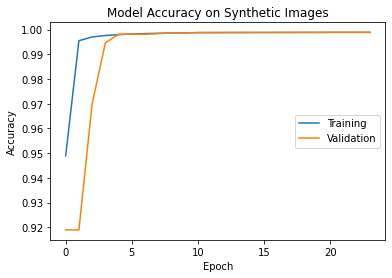

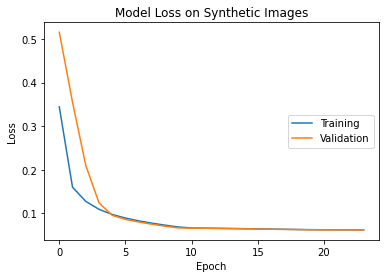

In [ ]:
# If you have a trained model, load it first to continue training at this checkpoint
#model = tf.keras.models.load_model("/content/gdrive/My Drive/Colab Notebooks/U-Net/data_30/model_classes_3_mixed.h5")


# IF YOU ENABLED TRAINING, THEN RUN THE CODE SNIPPET BELOW.  IF NOT, THIS BLOCK WILL BE SKIPPED.

if train_model == True:
    # train the model
    history = model.fit(train_dataset,
            steps_per_epoch=train_steps,
            validation_data=val_dataset,
            validation_steps=val_steps,
            epochs=epochs,
            callbacks=callbacks)
    print(history.history.keys())

    

    # Plot the results of training
    # This code was taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/

    # summarize history for accuracy
    plt.plot(history.history['categorical_accuracy'])
    plt.plot(history.history['val_categorical_accuracy'])
    plt.title('Model Accuracy on Synthetic Images')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='center right')
    plt.show()

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss on Synthetic Images')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='center right')
    plt.show()

    file_handle = open(weights_folder + '/accuracy_loss_' + str(num_classes) + '.pkl','wb')
    pickle.dump([history.history['categorical_accuracy'], history.history['val_categorical_accuracy'], history.history['loss'], history.history['val_loss']], file_handle)
    file_handle.close()

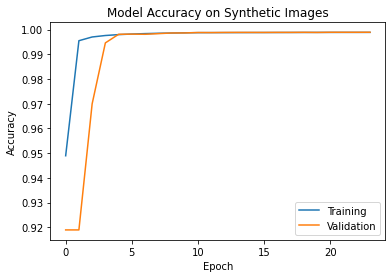

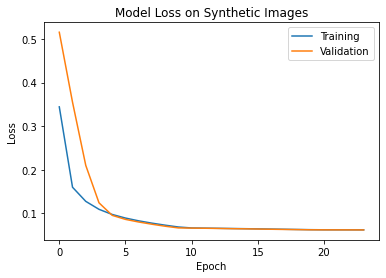

In [ ]:
# summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model Accuracy on Synthetic Images')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='best')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss on Synthetic Images')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='best')
plt.show()

### Load a trained U-Net

In [16]:
model = tf.keras.models.load_model(weights_folder + '/' + weights_file + '.h5')

# Plate Segmentation Step

In [20]:
test_images = sorted(glob.glob(real_image_folder + '/' + '*'))
print('Number of images found: ' + str(len(test_images)))

Number of images found: 1


Reading plate: Plate_2.jpg
1/1 [==============================] - 63s 63s/step
(1024, 1024, 1)


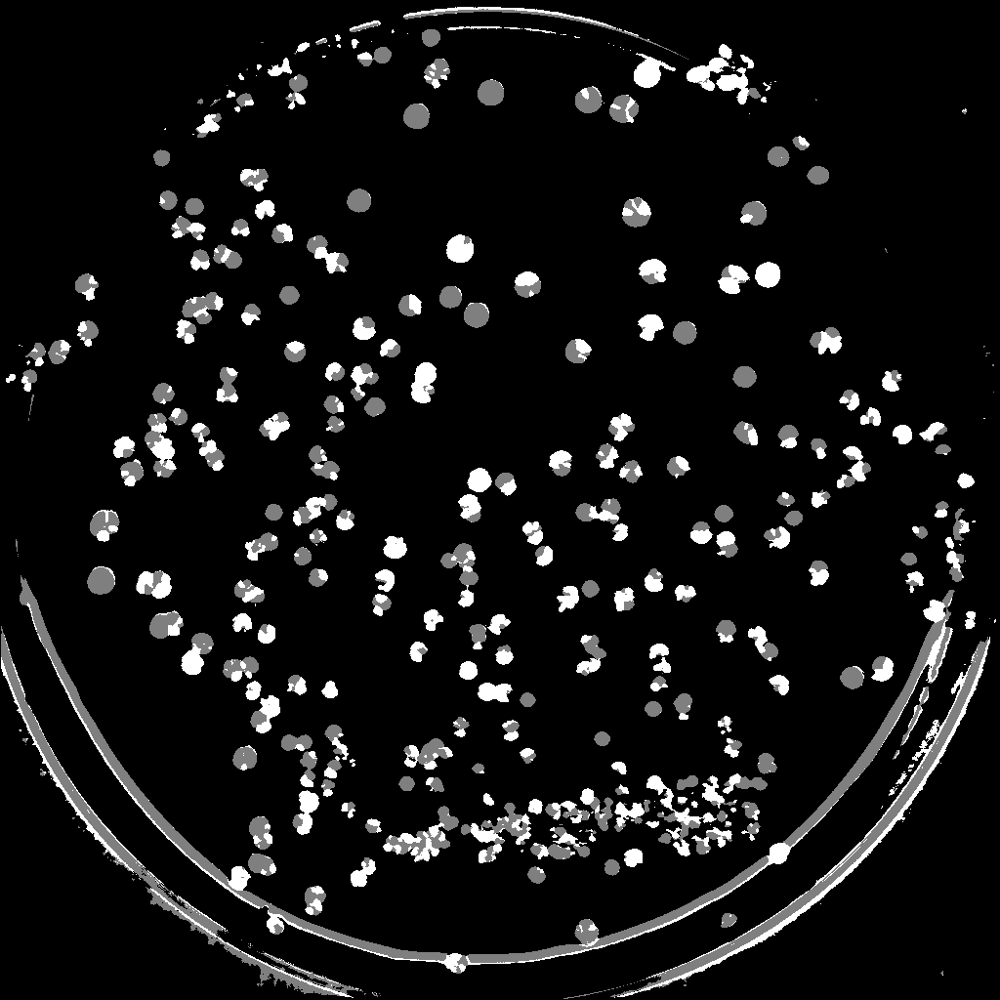

In [21]:
# Code for image segmentation (involves Python and Octave code (requires oct2py module))
# 1. Python - Ready u_net for input.
# 2. Python - Feed image to U-Net.
# 3. Python - Get output segmentation of image.
# 4. Octave - Use isolated colonies to estimate a range of radii to search for circular colonies.
# 5. Octave - Obtain centers and radii in image with circle Hough transform.
# 6. Octave (or Python maybe pandas) - Save csv files of circle locations and sizes in each image respectively.
# 7. Octave (or Python maybe matplotlib) - Make mask of image showing where the circles are found.
# 8. Repeat steps 2-7 for each image

if get_testing_segs == True:

    %matplotlib inline

    for this_image in test_images:

        # Steps 1-3: get output segmentation and save it

        this_plate = pathlib.PurePath(this_image)
        plate_name = this_plate.name

        print('Reading plate: ' + str(plate_name))

        x = read_image(this_image)
        
        # Predict the class of each pixel, and partition output the same way
        p = model.predict(np.expand_dims(x,axis=0))[0]
        p = np.argmax(p,axis=-1)
        p = np.expand_dims(p,axis=-1)
        p = p * (255/(num_classes-1))
        print(p.shape)
        #print(np.max(p))
        p = p.astype(np.int32)
        #print(np.max(p))

        p_full = tf.identity(p).numpy()
        in_class = tf.math.greater(tf.constant(p_full), tf.constant([0])).numpy()

        p = p.astype(np.uint8)
        # white pixels (should be 255)
        p_1 = tf.math.equal(tf.constant(p_full), tf.constant([255])).numpy().astype(np.uint8) * 255
        # red pixels (should be 127)
        p_2 = tf.math.equal(tf.constant(p_full), tf.constant([127])).numpy().astype(np.uint8) * 255
        p_full = 255 * in_class.astype(np.uint8)
        #print(p.shape)

        cv2_imshow(p)
        
        # Show and/or save image
        #plt.imshow(p * 255/(num_classes-1))
        #cv2.cvtColor(p * 255/(num_classes-1), cv2.COLOR_BGR2RGB)
        #plt.imshow(cv2.cvtColor(p * 255/(num_classes-1), cv2.COLOR_BGR2GRAY))
        #plt.imshow(p, cmap='binary')
        #plt.show()
        #print(np.unique(p[20:40, 900:920]))
        my_image = PIL.Image.fromarray(np.squeeze(p, axis=-1), "L")
        #display(my_image.resize((256,256)))
        my_image.save(test_seg_folder + '/' + this_plate.stem + '.png')

        # Steps 4-6: Run Matlab code in Octave to use CHT, and store colony location data
        octave.feval('get_circular_data.m', this_image, test_seg_folder + '/' + this_plate.stem + '.png', test_circle_data_folder)
        try:
            radii_table = pd.read_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv', header=None)
            radii_table.columns = ['Colony', 'Center (x)', 'Center (y)', 'Radius', 'Top Left (x)', 'Top Left (y)', 'Width', 'Height', 'Estimated Center (x)', 'Estimated Center (y)']
            radii_table.to_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

            # Step 7: Plot the image with the circles overlayed, and save it
            #radii_table = pd.read_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

            fig, ax = plt.subplots()
            plt.imshow(cv2.cvtColor(x, cv2.COLOR_BGR2RGB))
            fig.set_size_inches(1024/96, 1024/96)
            for index, row in radii_table.iterrows():
                full_circle = Circle((row['Estimated Center (x)'], row['Estimated Center (y)']), radius=row['Radius'], color='blue', fill=False, linewidth=1, alpha=0.9)
                ax.add_patch(full_circle)
            plt.axis('off')
            plt.savefig(test_circle_folder + '/' + pathlib.Path(this_image).stem + '.jpg', bbox_inches='tight', pad_inches=0)
            plt.close()

        except pd.errors.EmptyDataError: # If an error is about to be thrown due to an empty csv file, run these lines instead
            print('No colonies were detected.  Skipping this image.')
            my_table_columns = ['Colony', 'Center (x)', 'Center (y)', 'Radius', 'Top Left (x)', 'Top Left (y)', 'Width', 'Height', 'Estimated Center (x)', 'Estimated Center (y)']
            radii_table = pd.DataFrame(columns=my_table_columns)
            radii_table.to_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

            # Step 7: Plot the image with the circles overlayed, and save it
            #radii_table = pd.read_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

            fig, ax = plt.subplots()
            plt.imshow(cv2.cvtColor(x, cv2.COLOR_BGR2RGB))
            fig.set_size_inches(1024/96, 1024/96) # set because the small screen pixel size is 96 dpi
            plt.axis('off')
            plt.savefig(test_circle_folder + '/' + pathlib.Path(this_image).stem + '.jpg', bbox_inches='tight', pad_inches=0)
            plt.close()
        #print(radii_table)
        #raise FileExistsError('The script finished without errors.')
        #octave.run('octave_test.m')

    # Swap the red and white pixls in the image so that:
    # white is white, and gray is red
    # 1. Create image of same size
    # 2. Let p_1 be 255
    # 3. Let p_2 be 127 (or 255/2 in this space)
    # p_image = np.zeros_like(p)
    # print(np.unique(p_1))
    # print(np.unique(p_2))
    # #print(p_image.shape)
    # #cv2_imshow(p_1)
    # p_image = (p_1.astype(np.uint8) + (p_2//2).astype(np.uint8))
    # print(np.unique(p_image))
    # cv2_imshow(np.squeeze(p_image, axis=-1))

    # my_image = PIL.Image.fromarray(np.squeeze(p_image, axis=-1), "L")
    # #display(my_image.resize((256,256)))
    # my_image.save(test_seg_folder + '/' + this_plate.stem + '.png')
        


# Get locations of the plates with corresponding CHT data, and create reference table for plate names (Always run this before doing anything below)

In [22]:
test_images = sorted(glob.glob(real_image_folder + '/' + '*'))
print('Number of images found: ' + str(len(test_images)))

test_CHT_images = sorted(glob.glob(test_circle_folder + '/' + '*'))
print('Number of images found: ' + str(len(test_CHT_images)))

test_image_pairs = tuple(zip(test_images, test_CHT_images))
print(test_image_pairs)

# Create reference table for plate names, and store it as a csv file in the main annotation directory
file_dict = {}
for this_plate_number in range(1, len(test_images)+1):
    this_plate = pathlib.PurePath(test_images[this_plate_number - 1])
    plate_name = this_plate.name
    plate_stem = os.path.splitext(plate_name)[0]
    file_dict[plate_name] = 'Plate ' + str(this_plate_number)
print(file_dict)
file_items = file_dict.items()
file_list = list(file_items)
file_df = pd.DataFrame(file_items, columns = ['Plate Name', 'Folder Name'])
print(file_df)

if save_all_annotations == True:

    # Save this table as a csv file
    file_df.to_csv(output_crops_folder + '/Plate_References.csv')

    for index, row in file_df.iterrows():

        # Make subdirectories for each annotation class, organized by plate
        if os.path.exists(output_crops_folder + '/raw/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/raw/' + row['Folder Name']) # where the original colonies are cropped and stored

        if use_expert_counts == True:
            if os.path.exists(output_crops_folder + '/counted/' + row['Folder Name']) == False:
                os.makedirs(output_crops_folder + '/counted/' + row['Folder Name']) # where the original quantifiable colonies are cropped and stored

        if os.path.exists(output_crops_folder + '/circles/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/circles/' + row['Folder Name']) # same as before, but a circle is overlayed on the colony

        if os.path.exists(output_crops_folder + '/segs/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/segs/' + row['Folder Name']) # the output from the U-Net segmentation such that only nonzero pixels in the circle are kept


        if os.path.exists(output_crops_folder + '/init_regions/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/init_regions/' + row['Folder Name']) # A segmentation outlining the possible sector-like regions of the colony, both red and white

        if os.path.exists(output_crops_folder + '/init_bounds/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/init_bounds/' + row['Folder Name']) # The raw segmentation containing only the boundary of the colony

        if os.path.exists(output_crops_folder + '/init_partitions/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/init_partitions/' + row['Folder Name']) # same as the raw segmentation, but with lines annotated to represent locations of sector borders

        if os.path.exists(output_crops_folder + '/init_bad/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/init_bad/' + row['Folder Name']) # A segmentation outlining the sector-like regions that failed the consistency check


        if os.path.exists(output_crops_folder + '/cor_segs/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/cor_segs/' + row['Folder Name']) # the output from the U-Net segmentation such that only nonzero pixels in the circle are kept

        if os.path.exists(output_crops_folder + '/cor_bounds/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/cor_bounds/' + row['Folder Name']) # The corrected segmentation containing only the boundary of the colony

        if os.path.exists(output_crops_folder + '/cor_regions/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/cor_regions/' + row['Folder Name']) # the output from the U-Net segmentation such that only nonzero pixels in the circle are kept

        if os.path.exists(output_crops_folder + '/cor_partitions/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/cor_partitions/' + row['Folder Name']) # same as the raw segmentation, but with lines annotated to represent locations of sector borders

        if os.path.exists(output_crops_folder + '/cor_bad/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/cor_bad/' + row['Folder Name']) # A segmentation outlining the sector-like regions that failed the consistency check


        if os.path.exists(output_crops_folder + '/sectors/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/sectors/' + row['Folder Name']) # the output containing the regions in the segmentation where a sector is predicted

        if os.path.exists(output_crops_folder + '/sector_comps/' + row['Folder Name']) == False:
            os.makedirs(output_crops_folder + '/sector_comps/' + row['Folder Name']) # same as before, but only red pxieks in the segmentation are considered

Number of images found: 1
Number of images found: 1
(('/content/gdrive/My Drive/Colab Notebooks/Sector Project/Real Images/Test Plates/Set 1/Plate_2.jpg', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test_2/output_test/2021_07_01/Test Plates/Set 1/CHT Circles/Plate_2.jpg'),)
{'Plate_2.jpg': 'Plate 1'}
    Plate Name Folder Name
0  Plate_2.jpg     Plate 1


In [ ]:
#test_image_pairs[0:11]
#test_image_pairs[11:22]
#test_image_pairs[22:33]

# Classification Code (10/10)

In [23]:
# Code for colony classification (this should be all python code)
# 1. Read in image and corresponding segmentation.
# 2. Read in csv files containg circle locations.
# 3. For each row in the csv file, crop out the circular region, estimate size.
# 4. Restrict data collection to pixels within the circle detected, exclusing all other pixels.
# 5. Split the components of the image into red, white and background.
# 6. Get boundary components of the colony, check for consistency.
# 7. Output predicted number of sectors and their sizes after the consistency check.
# 8. Save the cropping of the colony in a few ways:
#   - the raw colony
#   - the raw colony with circle overlayed
#   - the segmentation of the colony within the circular region
#   - the segmentation of the colony with lines drawn on the image to repreent sector borders
#   - the predicted sector like regions, where each sector is a different shade of gray.
#   - similar to the previous, but keeping pixels classified only as red pixels.
#   - the segmentation that is corrected following the consistency check (possibly doing an additional check on the white pixels)
# 9. Save data on the colony itself, including the sector information, to a row in a table.
# 10. Save the table to a csv file.
# 11. Repeat all steps above for each image.

# Issues to work on:
# Verify that the purity metric is properly being utilized
# Figure out what to do with the holes inside colony segmentations.
#   -- A hole has its own boundary, so could look for the boundary of the hole.
#   -- The boundary of the hole MUST be smaller than the boundary of the entire colony
#   -- Find all connected compoents of the boundary, then exclude the LARGEST one.
#   -- For all other boundary components, these are expected to be the holes.  You need a procedure to fill them.
#   -- The procedure could be as simple as filling the hole with the class pertaining to the most common pixel on the boundary.

# Implementation already existing:



if classify_results == True:

    %matplotlib inline

    starting_image = True

    if use_expert_counts == True:
        dot_quant_images = sorted(glob.glob(additional_data_folder + '/Quant/' + '*'))
        dot_state_images = sorted(glob.glob(additional_data_folder + '/State/' + '*'))


    # Run each plate through the classification pipeline

    for (test_image, CHT_image) in test_image_pairs:

        # Get plate name 
        this_plate = pathlib.PurePath(test_image)
        plate_name = this_plate.name
        plate_stem = os.path.splitext(plate_name)[0]

        print('Plate: ' + str(plate_name) + ':')
        if save_all_annotations == True:
            print('Annotations will be saved within subfolders named ' + "\'" + file_dict[plate_name] + "\'")

        # Read images of the plate
        x = read_image(test_image)
        x_CHT = read_image(CHT_image)

        # initialize lists for storing values
        all_cropped_colonies = []

        # Sizes of regions in pixels
        white_region_sum = []
        red_region_sum = []
        colony_region_sum = []
        sector_region_sum = []

        corrected_white_region_sum = []
        corrected_red_region_sum = []
        corrected_sector_region_sum = []

        true_white_region_sum = []
        true_red_region_sum = []
        true_colony_region_sum = []
        true_sector_region_sum = []

        # Counting sectors
        initial_region_counts = []
        all_sector_counts = []
        true_sector_counts = []

        

        boundary_region_sum = []
        colony_prop_sum = []

        # Purity scores for regions and colonies
        average_sector_score = []
        average_sector_iou = []

        weighted_sector_score_before = []
        weighted_red_sector_score_before = []
        weighted_white_sector_score_before = []

        weighted_sector_score_after = []
        weighted_red_sector_score_after = []
        weighted_white_sector_score_after = []

        # Bounding box info for colonies in images
        sides_vert_top = [];
        sides_vert_bottom = [];
        sides_horz_left = [];
        sides_horz_right = [];

        # Test lists
        colony_is_connected = []
        colony_is_approx_connected = []
        boundary_is_connected = []
        colony_is_whole = []
        boundary_is_hamilton = []
        colony_is_approx_convex = []
        colony_is_approx_circular = []
        hausdorff_dist_convex = []
        hausdorff_dist_circle = []

        # Lists to store purity scores of each region and the color of the region
        region_purity_before = []
        region_color_before = []
        region_sizes_before = []

        weighted_purity_before = []
        weighted_purity_red_before = []
        weighted_purity_white_before = []

        region_purity_after = []
        region_color_after = []
        region_sizes_after = []

        weighted_purity_after = []
        weighted_purity_red_after = []
        weighted_purity_white_after = []

        cured_colony_before = []
        cured_colony_after = []

        stable_colony_before = []
        stable_colony_after = []

        # Load images here if using quantifable colony data/annotations
        if use_expert_counts == True:
            x_quant = read_image(additional_data_folder + '/Quant/' + plate_stem + '.tif')
            x_state = read_image(additional_data_folder + '/State/' + plate_stem + '.tif')
            quantifiable_colony = []
            quantifiable_cured = []
            quantifiable_stable = []
            quantifiable_sectored = []

        #------------------------------
        # Read in plate and locate colonies
        #------------------------------
        
        # Read the segmentation of the plate, and keep track of which class each pixel belongs to
        p = read_mask(test_seg_folder + '/' + this_plate.stem + '.png')
        #p = read_mask(main_folder + '/Test Segs/' + specific_test_folder + '/Class_3/' + this_plate.stem + '.png')

        p_full = tf.identity(p).numpy()
        in_class = tf.math.greater(tf.constant(p_full), tf.constant([0])).numpy()

        p = p.astype(np.uint8)
        # white pixels
        p_1 = tf.math.equal(tf.constant(p_full), tf.constant([255])).numpy().astype(np.uint8) * 255
        # red pixels
        p_2 = tf.math.equal(tf.constant(p_full), tf.constant([127])).numpy().astype(np.uint8) * 255
        p_full = 255 * in_class.astype(np.uint8)

        # Gather the location and radii data from the colonies
        # If there are no colonies detected, or there is no table, skip this section at once

        colony_locations = pd.read_csv(test_circle_data_folder + '/' + pathlib.Path(test_image).stem + '.csv')
        #colony_locations = pd.read_csv(main_folder + '/Test Segs CHT Data/' + specific_test_folder + '/Class_3/' + pathlib.Path(test_image).stem + '.csv')

        # Output information from the imported csv
        print(str(len(colony_locations["Radius"])) + ' colonies found using circle Hough transform')
        plate_names = np.repeat(plate_name, len(colony_locations["Radius"]))
        colony_numbers = np.array(range(len(colony_locations["Radius"])))

        #---------------------------------------------------------------------

        # CLASSIFICATION PIPELINE START
        # Pre-processing step

        # Images to save:
        # - Cropping of the colony
        # - Cropping of the colony with the overalyed circle
        # - Original colony segmentation, such that only the pixels inside the overlayed circle are considered.

        for this_index in range(0,len(colony_numbers)):

            print('')
            print('Colony ' + str(this_index))
            # get example image using bounding indices
            #this_index = 2

            # Copy location data from colony image
            top_left_x = colony_locations["Top Left (x)"][this_index]
            top_left_y = colony_locations["Top Left (y)"][this_index]
            box_width = colony_locations["Width"][this_index]
            box_height = colony_locations["Height"][this_index]

            # Store the locations in another set of lists
            sides_vert_top.append(top_left_y)
            sides_vert_bottom.append(top_left_y + box_height - 1)
            sides_horz_left.append(top_left_x)
            sides_horz_right.append(top_left_x + box_width - 1)

            # Grab segmentation of colony using coordinates copied above
            # The colony image is NOT a boolean array
            colony_image = p[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]
            ellipse_array = create_filled_ellipse_in_array(colony_image)
            colony_image = np.multiply(colony_image, ellipse_array) # unpadded segmentation with the pixels inside the overlayed circle

            if use_expert_counts == True:
                quant_image = x_quant[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]
                state_image = x_state[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]

            # The colony mask IS a boolean array.  Keep all the pixels of each class.
            white_colony_mask = p_1[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)] > 0
            red_colony_mask = p_2[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)] > 0 
            colony_mask = np.logical_or(white_colony_mask, red_colony_mask) # sanity check to see of this is the same as colony image

            # Add segmentation of the pixels inside the circular region of detection, and apply the mask.  This ensures we only use the pixels inside the circle for analysis.
            # Booleans are inputs, and booleans are outputs
            # Force a circle in colonies detected in the circle detection step
            white_colony_mask = np.multiply(white_colony_mask, ellipse_array)
            red_colony_mask = np.multiply(red_colony_mask, ellipse_array)
            colony_mask = np.logical_or(white_colony_mask, red_colony_mask)

            # Get initial measure of the sizes of the red and white regions of the colony
            white_region_sum.append(np.sum(white_colony_mask))
            red_region_sum.append(np.sum(red_colony_mask))
            colony_region_sum.append(np.sum(colony_mask))
            sector_region_sum.append(np.sum(red_colony_mask) / np.sum(colony_mask))

            # Find colony boundaries, ensuring that the boundaries are ON the colony, not ADJACENT to it.
            edge_mask_unpadded = get_colony_boundary_binary(colony_image) # The function is above
            interior_mask_unpadded = np.logical_xor(colony_image > 0, edge_mask_unpadded) # Second mask containing only the interior pixels of the segmentation
            interior_colony = np.multiply(colony_image, interior_mask_unpadded) # This is NOT a boolean

            #---------------------------------------------------------------
            # Get quantifiable colony labels (if applicable)
            #---------------------------------------------------------------

            # If we have locations of quantifiable colonies, use this to gather the colonies.
            if use_expert_counts == True:
                #----------------------------------
                # Determine where the quantifiable colonies are (they have black dots on them)
                # Set color boundaries for the markers in the counted images
                black_dot_boundaries = [([0, 0, 0], [5, 5, 5])]

                for (lower, upper) in black_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    dot_mask = cv2.inRange((quant_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected pixels
                    black_labels = label(dot_mask)
                    num_black_labels = len(np.unique(black_labels))
                    if num_black_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_quantifiable = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (quant_image.shape[0] - 1) / 2.0
                        colony_center_x = (quant_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_black_labels):
                            this_dot_comp = black_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_quantifiable = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_black_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_quantifiable = False

                quantifiable_colony.append(colony_is_quantifiable)

                #print('Colony', this_index, ': Quantifiable:', colony_is_quantifiable)

                #----------------------------------------
                # Determine if colony is cured, stable, or sectored

                # RGB version
                # cured_dot_boundaries = [([34-5, 177-5, 76-5], [34+5, 177+5, 76+5])]
                # stable_dot_boundaries = [([237-5, 28-5, 36-5], [237+5, 28+5, 36+5])]
                # sectored_dot_boundaries = [([63-5, 72-5, 204-5], [63+5, 72+5, 204+5])]

                # BGR version (cv2 needs this)
                # Marker colors were manaully chosen, so info below is based on that.
                # Wes annotations
                cured_dot_boundaries = [([76-5, 177-5, 34-5], [76+5, 177+5, 34+5])]
                stable_dot_boundaries = [([36-5, 28-5, 237-5], [36+5, 28+5, 237+5])]
                sectored_dot_boundaries = [([204-5, 72-5, 63-5], [204+5, 72+5, 63+5])]

                # Nicole annotations
                # cured_dot_boundaries = [([0, 250, 0], [0, 255, 0])]
                # stable_dot_boundaries = [([0, 0, 250], [0, 0, 255])]
                # sectored_dot_boundaries = [([250, 250, 0], [255, 255, 0])]

                # cured_dot_boundaries = [([0, 250, 0], [0, 255, 0])]
                # stable_dot_boundaries = [([0, 0, 250], [0, 0, 255])]
                # sectored_dot_boundaries = [([250, 0, 0], [255, 0, 0])]

                for (lower, upper) in cured_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    #print(np.unique((colony_image*255).astype(np.uint8)))
                    dot_mask = cv2.inRange((state_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected dot pixels
                    #print(np.unique(dot_mask))
                    cured_labels = label(dot_mask)
                    num_cured_labels = len(np.unique(cured_labels))
                    if num_cured_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_cured = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (state_image.shape[0] - 1) / 2.0
                        colony_center_x = (state_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_cured_labels):
                            this_dot_comp = cured_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_cured = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_cured_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_cured = False

                quantifiable_cured.append(colony_is_cured)

                #print('Colony', this_index, ': Cured:', colony_is_cured)


                for (lower, upper) in stable_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    #print(np.unique((colony_image*255).astype(np.uint8)))
                    dot_mask = cv2.inRange((state_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected pixels
                    #print(np.unique(dot_mask))
                    stable_labels = label(dot_mask)
                    num_stable_labels = len(np.unique(stable_labels))
                    if num_stable_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_stable = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (state_image.shape[0] - 1) / 2.0
                        colony_center_x = (state_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_stable_labels):
                            this_dot_comp = stable_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_stable = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_stable_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_stable = False

                quantifiable_stable.append(colony_is_stable)

                #print('Colony', this_index, ': Stable:', colony_is_stable)


                for (lower, upper) in sectored_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    #print(np.unique((colony_image*255).astype(np.uint8)))
                    dot_mask = cv2.inRange((state_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected pixels
                    #print(np.unique(dot_mask))
                    sectored_labels = label(dot_mask)
                    num_sectored_labels = len(np.unique(sectored_labels))
                    if num_sectored_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_sectored = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (state_image.shape[0] - 1) / 2.0
                        colony_center_x = (state_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_sectored_labels):
                            this_dot_comp = sectored_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_sectored = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_sectored_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_sectored = False

                quantifiable_sectored.append(colony_is_sectored)

                #print('Colony', this_index, ': Sectored:', colony_is_sectored)


                #----------------------------------

            #-----------------------------------------------------
            # Get connectedness properties of the segmentation
            #-----------------------------------------------------

            # Use this information to test whether the segmentation meets the conditions

            # Condition 1 test: is the segmentation one connected component?
            condition_1_test_strong, condition_1_test_weak = check_components_of_colony(colony_mask)
            colony_is_connected.append(condition_1_test_strong)
            colony_is_approx_connected.append(condition_1_test_weak)
            #print('Condition 1: Seg is one component: ' + str(condition_1_test_strong))
            #print("Condition 1: Seg is \'approximately\' one component: " + str(condition_1_test_weak))

            # Condition 2 test: Is the boundary one connected component?
            condition_2_test = check_components_of_boundary(edge_mask_unpadded)
            boundary_is_connected.append(condition_2_test)
            #print('Condition 2: Boundary is one component: ' + str(condition_2_test))

            # Condition 3 test: Are there holes in the segmentation?
            condition_3_test = check_for_holes(colony_mask, edge_mask_unpadded)
            colony_is_whole.append(condition_3_test)
            #print('Condition 3: Segmentation has no holes: ' + str(condition_3_test))

            # Condition 4 test: Is the boundary a Hamiltonian cycle? (no ready yet)
            #condition_4_test = get_hamilton_cycle(colony_mask, edge_mask_unpadded)
            #print('Has Hamiltonian cycle: ' + str(condition_4_test))

            # Condition 5: Check circularity and convexity
            condition_5_convex, condition_5_circular = compare_convex_hull(colony_mask, edge_mask_unpadded)
            colony_is_approx_convex.append(condition_5_convex)
            colony_is_approx_circular.append(condition_5_circular)
            #print('Condition 5: Segmentation is approximately convex: ' + str(condition_5_convex))
            #print('Condition 5: Segmentation is approximately circular: ' + str(condition_5_circular))

            # Condition 6: Check hausdorff distance
            hausdorff_chull, hausdorff_circle = get_hausdorff_distance(colony_mask, edge_mask_unpadded)
            hausdorff_dist_convex.append(hausdorff_chull)
            hausdorff_dist_circle.append(hausdorff_circle)
            #print('Condition 6: Hausdorff distance between boundary and convex hull: ' + str(hausdorff_chull))
            #print('Condition 6: Hausdorff distance between boundary and circle: ' + str(hausdorff_circle))

            #----------------------------------------
            # Partition the boundaries into red and white components

            # Get 'ideal' boundary of the colony
            ideal_circle = create_circle_boundary(edge_mask_unpadded, colony_locations["Radius"][this_index])

            # Find connected components of the red and white pixels found on the boundary
            red_boundary_skeleton, white_boundary_skeleton, boundary_mask_h, boundary_mask_w = get_boundary_partitions(red_colony_mask, white_colony_mask, edge_mask_unpadded)

            #plt.imshow(red_boundary_skeleton)
            #plt.title('Red Boundary Skeleton')

            # Save the three images using this data
            #   - Oringinal image padded
            #   - CHT image padded
            #   - Segmentation padded
            # Force a circle like previously
            padded_x = 255 * x[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
            padded_x_CHT = 255 * x_CHT[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
            padded_mask = p[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1)]
            ellipse_array_2 = create_filled_ellipse_in_array(padded_mask, padding = image_padding)
            padded_mask = np.multiply(padded_mask, ellipse_array_2)

            # Save the colony images as previously
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/raw/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.jpg', padded_x):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/circles/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.jpg', padded_x_CHT):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/segs/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', padded_mask):
                    raise Exception('Could not write image.')

            # Save the croppings for individual colonies which were annotated
                if use_expert_counts == True:
                    padded_x_count = 255 * x_quant[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
                    if not cv2.imwrite(output_crops_folder + '/counted/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', padded_x_count):
                        raise Exception('Could not write image.')
            #-------------------------------------------------------------

            # CLASSIFICATION STEP BEGINS
            # GET INITIAL REGIONAL BREAKDOWN AND RED REGION ANNOTATIONS OF THE COLONY

            # Should store information about the following:
            #   - Idealized red and white regions
            #   - The boundaries of each red and white region
            #   - The sizes of each region
            #   - The purity scores of each region
            #   - the states of each colony (cured, stable)

            # Images to save in this section
            # - Regional segmentation
            # - Boundary of the colony
            # - Red region boundary annotation
            # - Regions that fail consistency check

            # Plot padded version of the initial segmentation.  Annotations will be saved onto the image.
            colony_image_padded = np.pad(colony_image, 5)
            fig1, ax1 = plt.subplots()
            ax1.imshow(colony_image_padded, cmap='gray')


            recheck_boundaries = True # initialized to true so that we can look at show each step of the pipeline is performing

            # Using boundary information, find and extract potential red and white regions of the colony

            red_labels = label(red_boundary_skeleton)
            white_labels = label(white_boundary_skeleton)

            # Initialize masks separating potential red and white regions
            initial_red_region_mask = np.zeros_like(red_boundary_skeleton)
            initial_white_region_mask = np.zeros_like(white_boundary_skeleton)
            initial_red_boundary_mask = np.zeros_like(red_boundary_skeleton)
            initial_white_boundary_mask = np.zeros_like(white_boundary_skeleton)

            # keep track of regions which fail the consistency check
            initial_bad_red_score_mask = np.zeros_like(red_boundary_skeleton)
            initial_bad_white_score_mask = np.zeros_like(white_boundary_skeleton)

            # Keep track of boundaries whihc fail the consistency check
            boundary_correction = np.zeros_like(red_boundary_skeleton)

            # Initialize lists to store characteristics about each region
            # This includes endpoints on the sector, the purity of the sector, and an indicator for the purity being above the 50 percent threshold
            red_component_endpoints = []
            red_component_scores = []
            red_component_checks = []
            red_component_sizes = []

            white_component_endpoints = []
            white_component_scores = []
            white_component_checks = []
            white_component_sizes = []

            # How many boundaries of each color are there?
            num_red_boundaries = len(np.unique(red_labels)[1:]) # number of red boundaries present
            num_white_boundaries = len(np.unique(white_labels)[1:]) # number of white boundaries present

            # Initial count of the number of sectors is the number of red boundaries
            initial_region_counts.append(num_red_boundaries)

            # States can be initialy predicted using the number of red and white boundaries
            #if ((num_red_boundaries == 1) & (num_white_boundaries == 0)):
            if (num_white_boundaries == 0):
                cured_colony_before.append(True)
            else:
                cured_colony_before.append(False)

            #if ((num_red_boundaries == 0) & (num_white_boundaries == 1)):
            if (num_red_boundaries == 0):
                stable_colony_before.append(True)
            else:
                stable_colony_before.append(False)

            # Now, to analyze each of the regions to determine if they are sectored

            # Analyze the initial red regions of the colony
            for this_label in np.unique(red_labels)[1:]:
                red_component = copy.deepcopy(red_labels)
                red_component = red_component == this_label
                red_component = red_component.astype(np.int32)

                # Append the red boundary pixels on this component to the red boundary mask
                initial_red_boundary_mask = np.logical_or(initial_red_boundary_mask, red_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], red_component)

                # If exactly two points are found, then everything's good.

                # Get the angle of the endpoints relative to the colony center
                [endpoint_angles, endpoint_locations, endpoints_x, endpoints_y] = get_endpoint_locations(full_endpoints_list, colony_mask, colony_locations["Radius"][this_index])

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                # Append the predicted filled region to the red region mask
                initial_red_region_mask = np.logical_or(initial_red_region_mask, sector_filled)

                # Apply consistency check to score the region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, red_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    recheck_boundaries = True
                    initial_bad_red_score_mask = np.logical_or(initial_bad_red_score_mask, sector_filled)

                # Append scores and info to lists
                red_component_endpoints.append(full_endpoints_list) # endpoints of the connected compponent on the boundary
                red_component_scores.append(prop_interior) # purity score of the region
                red_component_checks.append(confirm_check) # whether the purity score was at least 0.5
                red_component_sizes.append(np.sum(initial_red_region_mask)) # the number of pixels in the region
                
                # ---ANNOTATION PROCEDURE---

                # Plot the lines of the sector (and the boundary line) onto the colony segmentation
                length_points = len(endpoints_x)
                #print(length_points)
                #print(endpoints_x)
                if len(np.unique(red_labels)[1:]) > 0: # only plots lines if there are divided regions
                    plot_bounds_x = []
                    plot_bounds_y = []
                    plot_bounds_x.append(endpoints_x[0] + image_padding)
                    plot_bounds_y.append(endpoints_y[0] + image_padding)
                    # Get list of center and endpoints on the boundary
                    for this_bound in range(0, length_points-1):
                        plot_bounds_x.append(endpoints_x[this_bound+1] + image_padding)
                        plot_bounds_y.append(endpoints_y[this_bound+1] + image_padding)
                        #plt.plot(plot_points_y, plot_points_x, color='blue')
                        #print(endpoints_x[0:2])
                        #print(endpoints_y[0:2])
                    plot_bounds_x = np.roll(np.array(plot_bounds_x), 1)
                    plot_bounds_y = np.roll(np.array(plot_bounds_y), 1)
                    #print(plot_bounds_x)
                    #print(plot_bounds_y)
                    line_style = ':' if (len(plot_bounds_x) == 2) else '-'
                    ax1.plot(plot_bounds_y, plot_bounds_x, linewidth=5, linestyle=line_style, alpha=0.85)
                    if len(plot_bounds_x) == 1:
                        full_circle = Circle((plot_bounds_y, plot_bounds_x), radius=colony_locations["Radius"][this_index], color='blue', fill=False, linewidth=5, alpha=0.85)
                        ax1.add_patch(full_circle)


            # Do the same for the white regions
            for this_label in np.unique(white_labels)[1:]:
                white_component = copy.deepcopy(white_labels)
                white_component = white_component == this_label
                white_component = white_component.astype(np.int32)

                initial_white_boundary_mask = np.logical_or(initial_white_boundary_mask, white_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                initial_white_region_mask = np.logical_or(initial_white_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    recheck_boundaries = True
                    initial_bad_white_score_mask = np.logical_or(initial_bad_white_score_mask, sector_filled)

                # Append scores and info to lists
                white_component_endpoints.append(full_endpoints_list)
                white_component_scores.append(prop_interior)
                white_component_checks.append(confirm_check)
                white_component_sizes.append(np.sum(initial_white_region_mask))

            # At this point, you should have two masks, one for the red and white regions respectivey.
            # You should also have the endponts of each component, stored as a collection of lists, one list per component
            # Finally, you should have a score for those components

            # -------------------------------------
            # Store the purity scores in a sublist, along with a second sublist indicating the color of each region
            # -------------------------------------

            all_component_scores = []
            all_region_colors = []
            all_region_sizes = []

            if not red_component_scores:
                all_region_colors = all_region_colors + ['red']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['red'] * len(red_component_scores))
                all_component_scores = all_component_scores + red_component_scores
                all_region_sizes = all_region_sizes + red_component_sizes

            if not white_component_scores:
                all_region_colors = all_region_colors + ['white']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['white'] * len(white_component_scores))
                all_component_scores = all_component_scores + white_component_scores
                all_region_sizes = all_region_sizes + white_component_sizes

            region_purity_before.append(all_component_scores)
            region_color_before.append(all_region_colors)
            region_sizes_before.append(all_region_sizes)

            # -------------------------------------
            # Do the same for the weighted purity scores across the entire colony
            # -------------------------------------

            # Compute weighted purity scores over all regions, for white only, and for red only

            total_red_sum = np.nansum(red_component_sizes)
            total_white_sum = np.nansum(white_component_sizes)

            if not red_component_scores:
                red_region_weights = np.array([0])
                weighted_red_scores = np.array([0])
            else:
                red_region_weights = np.divide(np.array(red_component_sizes), total_red_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_red_scores = np.multiply(np.array(red_component_scores), red_region_weights)

            if not white_component_scores:
                white_region_weights = np.array([0])
                weighted_white_scores = np.array([0])
            else:
                white_region_weights = np.divide(np.array(white_component_sizes), total_white_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_white_scores = np.multiply(np.array(white_component_scores), white_region_weights)

            # Get weighted average over both regions together
            all_region_sum = np.nansum(all_region_sizes)
            all_region_weights = np.divide(np.array(red_component_sizes + white_component_sizes), all_region_sum)
            all_region_weighted_scores = np.multiply(np.array(red_component_scores + white_component_scores), all_region_weights)

            weighted_purity_red_before.append(list(weighted_red_scores))
            weighted_purity_white_before.append(list(weighted_white_scores))
            weighted_purity_before.append(list(all_region_weighted_scores))
            weighted_red_sector_score_before.append(np.nansum(weighted_red_scores))
            weighted_white_sector_score_before.append(np.nansum(weighted_white_scores))
            weighted_sector_score_before.append(np.nansum(all_region_weighted_scores))

            # Now, create the masks containing the initial_regions
            initial_region_mask = np.maximum(initial_red_region_mask.astype(np.uint8), 2*initial_white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            initial_boundary_mask = np.maximum(initial_red_boundary_mask.astype(np.uint8), 2*initial_white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            initial_score_mask = np.maximum(initial_bad_red_score_mask.astype(np.uint8), 2*initial_bad_white_score_mask.astype(np.uint8))*(255/(num_classes-1))

            # Make sure to pad them in the same way as the output segmentation
            initial_region_mask = np.pad(initial_region_mask, image_padding)
            initial_boundary_mask = np.pad(initial_boundary_mask, image_padding)
            initial_score_mask = np.pad(initial_score_mask, image_padding)

            # Save the initial region and boundary mask.  Also save image indicating regions which should be investigted further.
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/init_regions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_region_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/init_bounds/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_boundary_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/init_bad/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_score_mask):
                    raise Exception('Could not write image.')
            plt.axis('off')
            if save_all_annotations == True:
                fig1.savefig(output_crops_folder + '/init_partitions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            plt.close(fig1);




            #------------------------------------------------------------------

            # CLASS SWITCH/MERGING STEP

            # This is only applied to regions where the consistency check fails.
            # i.e. less than 50% of pixels in the predicted region are of the same class
            # as the outer boundary pixels

            # The process will repeat until all regions pass the consisency check

            # NOTE: This section is only executed if one of either the red or
            # white regions estimated above, fails the constency check.
            # If all regions predicted are consistent in class, the below will
            # not execute, as it will do exactly the same stuff as just done above.

            # Therefore, this section is purposely redundant and helps us keep
            # track of which regions are being updated.



            repetition_counter = 0
            performing_correction = False # initialize at the beginning

            while recheck_boundaries == True:

                recheck_boundaries = False # reset.
                repetition_counter = repetition_counter + 1

                # The above should be switched back to True if there is a potentially misclassified boundary


                # Find the connected components of the skeleton.
                # The number of red connected components gives the initial number of sectors.
                # The number of white connected components are the regions separating the red sectors.
                # A score for sectoriness will be applied to both sets of regions.
                red_labels = label(red_boundary_skeleton)
                white_labels = label(white_boundary_skeleton)

                # Initialize masks separating potential red and white regions
                red_region_mask = np.zeros_like(red_boundary_skeleton)
                white_region_mask = np.zeros_like(white_boundary_skeleton)
                red_boundary_mask = np.zeros_like(red_boundary_skeleton)
                white_boundary_mask = np.zeros_like(white_boundary_skeleton)
                red_score_mask = np.zeros_like(red_boundary_skeleton)
                white_score_mask = np.zeros_like(white_boundary_skeleton)

                # Intialize array to change boundary.
                # This is only updated when there is a potentially misclassified boundary.
                boundary_correction_red = np.zeros_like(red_boundary_skeleton)
                boundary_correction_white = np.zeros_like(white_boundary_skeleton)

                # Generate regions directly from segmentation
                # Iterate through each component and collect some information
                # Collect info about component endpoints and purity scores
                red_component_endpoints = []
                red_component_scores = []
                red_component_checks = []

                white_component_endpoints = []
                white_component_scores = []
                white_component_checks = []

               # print('Number of red components: ' + str(max(np.unique(red_labels)[1:])))

                # Iterate through the red components
                for this_label in np.unique(red_labels)[1:]:
                    #print('Running the red check.')
                    red_component = copy.deepcopy(red_labels)
                    red_component = red_component == this_label
                    red_component = red_component.astype(np.int32)

                    red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0)

                    # Function to get endpoints of connected component
                    full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], red_component)

                    # If exactly two points are found, then everything's good.

                    # Function to get mask representing sector boundary
                    sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                    # Fill initial region mask with the filled sector
                    red_region_mask = np.logical_or(red_region_mask, sector_filled)

                    # Apply consistency check to score region
                    confirm_check, prop_interior = check_for_consistency_2(sector_filled, red_colony_mask)

                    # Update score mask to denote where the consistency check failed
                    if confirm_check == False:
                        #performing_correction = True # This signifies that boundary information will be different from the initial breakdown
                        recheck_boundaries = True
                        boundary_correction_red = np.logical_or(boundary_correction_red, red_component)


                    # Append scores and info to lists
                    red_component_endpoints.append(full_endpoints_list)
                    red_component_scores.append(prop_interior)
                    red_component_checks.append(confirm_check)

                
                # Do the same for the white components
                for this_label in np.unique(white_labels)[1:]:

                    white_component = copy.deepcopy(white_labels)
                    white_component = white_component == this_label
                    white_component = white_component.astype(np.int32)

                    white_boundary_mask = np.logical_or(white_boundary_mask, white_component > 0)

                    # Function to get endpoints of connected component
                    full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component)

                    # If exactly two points are found, then everything's good.

                    # Function to get mask representing sector boundary
                    sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                    # Fill initial region mask with the filled sector
                    white_region_mask = np.logical_or(white_region_mask, sector_filled)

                    # Apply consistency check to score region
                    confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)

                    # Update score mask to denote where the consistency check failed
                    if confirm_check == False:
                        #performing_correction = True # This signifies that boundary information will be different from the initial breakdown
                        recheck_boundaries = True
                        boundary_correction_white = np.logical_or(boundary_correction_white, white_component)

                    # Append scores and info to lists
                    white_component_endpoints.append(full_endpoints_list)
                    white_component_scores.append(prop_interior)
                    white_component_checks.append(confirm_check)

                # If there were regions that failed the consistency check, swap the classes on the boundary
                if recheck_boundaries == True:

                    performing_correction = True # This signifies that boundary information will be different from the initial breakdown

                    # Run the swap functions
                    red_boundary_skeleton = grow_boundary(red_boundary_skeleton, boundary_correction_white) # takes the bad white boundaries and switches them to the red class
                    red_boundary_skeleton = shrink_boundary(red_boundary_skeleton, boundary_correction_red) # removes the bad red boundaries

                    white_boundary_skeleton = grow_boundary(white_boundary_skeleton, boundary_correction_red) # takes the bad red boundaries and switches them to the white class
                    white_boundary_skeleton = shrink_boundary(white_boundary_skeleton, boundary_correction_white) # removes the bad white boundaries

                # Only run the block below if this colony cannot be analyzed appropriatly with this pipeline (may be an awful segmentation)
                if repetition_counter > 20:
                    warnings.warn('Corrections have been applied too many times.  The colony segmentation used here is likely unsuitable for this pipeline.')
                    break

                    # Once the swap is done, you will head back to the top of this while loop.

            # At this point, you should have two masks, one for the red and white regions respectivey.
            # You should also have the endponts of each components, stored as a collection of lists, one list per component
            # Finally, you should have a score for those components

            # Now, create the masks containing the regions that pass the consistency check
            corrected_region_mask = np.maximum(red_region_mask.astype(np.uint8), 2*white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            corrected_boundary_mask = np.maximum(red_boundary_mask.astype(np.uint8), 2*white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))

            red_labels = label(red_boundary_skeleton)
            white_labels = label(white_boundary_skeleton)

            #corrected_boundary_mask = np.maximum((white_labels > 0).astype(np.uint8), 2*((red_labels > 0).astype(np.uint8)))*(255/(num_classes-1))

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            # Re-partition the image following correction
            corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image


            # if performing_correction == True:
            #     corrected_region_mask = np.maximum(white_region_mask.astype(np.uint8), 2*red_region_mask.astype(np.uint8))*(255/(num_classes-1))
            #     corrected_boundary_mask = np.maximum(white_boundary_mask.astype(np.uint8), 2*red_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            #     #score_mask = np.maximum(initial_bad_white_score_mask.astype(np.uint8), 2*initial_bad_red_score_mask.astype(np.uint8))*(255/(num_classes-1))
            # else:
            #     corrected_region_mask = np.maximum(initial_white_region_mask.astype(np.uint8), 2*initial_red_region_mask.astype(np.uint8))*(255/(num_classes-1))
            #     corrected_boundary_mask = np.maximum(initial_white_boundary_mask.astype(np.uint8), 2*initial_red_boundary_mask.astype(np.uint8))*(255/(num_classes-1))

            
            #score_mask = np.pad(score_mask, 5)

            #--------------------------------------------------
            # BEGIN THE SPLITTING STEP
            #--------------------------------------------------

            # For each region, find two points along the boundary to split it
            # This will create two or three subregions.
            # Objective is to maximize the purity of each subregion
            # Will splitting the regions increase purity overall?

            # NOTE: This will only let us to perform one split per region.  It's going
            # to get more complicated if we attempt to find two or more splits.

            

            # For each region, draw a contour and get the ordered set of points

            # Find the connected components of the skeleton.
            # The number of red connected components gives the initial number of sectors.
            # The number of white connected components are the regions separating the red sectors.
            # A score for sectoriness will be applied to both sets of regions.



            # Get boundary information from the boundary corrected/merged segmentation
            corrected_red_boundary_skeleton, corrected_white_boundary_skeleton, corrected_boundary_mask_h, corrected_boundary_mask_w = get_boundary_partitions(corrected_red_colony_mask, corrected_white_colony_mask, edge_mask_unpadded)

            # red_labels = label(corrected_red_boundary_skeleton)
            # white_labels = label(corrected_white_boundary_skeleton)

            # # Process for confirming that a split is a good choice:
            # # 1. Is the purity of all three subregions greater than 0.5?
            # #   -Yes: Move to step 2
            # #   -No: Slide the inital suggested subregion and repeat until end of region.
            # # 2. Is the purity of the two other subregions greater than the purity of the entire region?
            # #   -Yes: Make note of these purities and stop sliding the region
            # #   -No: Go back to step 1, slide suggested subregion
            # # 3. Is the purity of all three subregions increasing?
            # #   -Yes: Make a note of the endpoints and the purity scores.  Move one of the endpoints and repeat.
            # #   -No: Revert to the previous endpoint and start moving the other endpoint, repeat the process.  If result is similar, then optimal region has been found.

            # # Iterate through all the red boundaries first
            # red_boundaries_to_change = np.zeros_like(corrected_colony_mask)

            # for this_label in np.unique(red_labels)[1:]:
            #     #print(this_label)
            #     red_component = copy.deepcopy(red_labels)
            #     red_component = red_component == this_label
            #     red_component = red_component.astype(np.int32)

            #     #plt.imshow(red_component)
            #     #print('Some text')

            #     # Get info on the entire region
            #     starting_red_region_mask = red_component > 0 # Get the pixels on this component
            #     #red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0) 
            #     full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], red_component) # Get endpoints of component
            #     sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list) # Get masks of interior and boundary for the region
            #     #corrected_colony_region = np.logical_and(corrected_colony_mask, sector_filled) # Get the pixels in the colony mask that are within the region
            #     # If exactly two points are found, then everything's good.

            #     # Plot what the masks look like before moving on
            #     # fig_test, ax_test = plt.subplots(1,3)
            #     # #fig_test.suptitle('Red mask beore splitting')
            #     # ax_test[0].imshow(corrected_colony_image[:,:], cmap='gray')
            #     # ax_test[1].imshow(corrected_red_colony_mask, cmap='gray')
            #     # ax_test[2].imshow(sector_filled, cmap='gray')
                

            #     # Fill initial region mask with the filled sector
            #     #red_region_mask = np.logical_or(red_region_mask, sector_filled)

            #     # Apply consistency check to obtain score for entire region
            #     # prop_interior is the score
            
            #     confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_red_colony_mask)
                
            #     # Now, order the points on the component by drawing a contour
            #     full_red_contour, hierarchy = cv2.findContours(starting_red_region_mask.astype(np.uint8), cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
            #     full_red_contour = np.squeeze(full_red_contour[0], axis=1) # reduce to 2D: rows are the points, while columns are the coordinates in each dimension
            #     hierarchy = hierarchy[0][0][2]
            #     # place function here
            #     # attempt_to_split_region(current_region_mask, other_region_mask, region_contour, min_purity, min_purity_for_split, hierarchy, min_region_tolerance)
            #     make_split, bound_point_1, bound_point_2 = attempt_to_split_region(corrected_red_colony_mask, corrected_white_colony_mask, full_red_contour, prop_interior, min_purity_for_split, hierarchy, min_region_tolerance)
            #     #print(num_points_on_component)

                
            #     # The element of 'hierachy' above reveals whether or not the contour is open or closed
            #     # -1 indicates an open contour
            #     # 1 indicates a closed contour
            #     #print(hierarchy)

            #     # Get the pixels that are going to be changed

            #     if make_split == True:
            #         #perform_split = True
            #         #print('Component', this_label, ': A white split can be made in this red region!')
            #         for this_boundary_pixel in range(bound_point_1, bound_point_2+1):
            #             red_boundaries_to_change[full_red_contour[this_boundary_pixel,1], full_red_contour[this_boundary_pixel, 0]] = True

            
            # white_boundaries_to_change = np.zeros_like(corrected_colony_mask)

            # for this_label in np.unique(white_labels)[1:]:
                
            #     white_component = copy.deepcopy(white_labels)
            #     white_component = white_component == this_label
            #     white_component = white_component.astype(np.int32)

            #     #plt.imshow(red_component)
            #     #print('Some text')

            #     # Get info on the entire region
            #     starting_white_region_mask = white_component > 0 # Get the pixels on this component
            #     #red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0) 
            #     full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component) # Get endpoints of component
            #     sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list) # Get masks of interior and boundary for the region
            #     # If exactly two points are found, then everything's good.

            #     # Plot what the masks look like before moving on
            #     # fig_test_2, ax_test_2 = plt.subplots(1,3)
            #     # ax_test_2[0].imshow(corrected_colony_image[:,:], cmap='gray')
            #     # ax_test_2[1].imshow(corrected_white_colony_mask, cmap='gray')
            #     # ax_test_2[2].imshow(sector_filled, cmap='gray')
                

            #     # Fill initial region mask with the filled sector
            #     #red_region_mask = np.logical_or(red_region_mask, sector_filled)

            #     # Apply consistency check to obtain score for entire region
            #     # prop_interior is the score
            
            #     confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)
                
            #     # Now, order the points on the component by drawing a contour
            #     full_white_contour, hierarchy = cv2.findContours(starting_white_region_mask.astype(np.uint8), cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
            #     full_white_contour = np.squeeze(full_white_contour[0], axis=1) # reduce to 2D: rows are the points, while columns are the coordinates in each dimension
            #     hierarchy = hierarchy[0][0][2]
            #     # place function here
            #     # attempt_to_split_region(current_region_mask, other_region_mask, region_contour, min_purity, min_purity_for_split, hierarchy, min_region_tolerance)
            #     make_split, bound_point_1, bound_point_2 = attempt_to_split_region(corrected_white_colony_mask, corrected_red_colony_mask, full_white_contour, prop_interior, min_purity_for_split, hierarchy, min_region_tolerance)
            #     #print(num_points_on_component)

                
            #     # The element of 'hierachy' above reveals whether or not the contour is open or closed
            #     # -1 indicates an open contour
            #     # 1 indicates a closed contour
            #     #print(hierarchy)

            #     # Get the pixels that are going to be changed

            #     if make_split == True:
            #         #perform_split = True
            #         #print('Component', this_label, ': A red split can be made in this white region!')
            #         # update this later
            #         # Include the portion of the boundary in this region that needs to be changed
            #         for this_boundary_pixel in range(bound_point_1, bound_point_2+1):
            #             white_boundaries_to_change[full_white_contour[this_boundary_pixel,1], full_white_contour[this_boundary_pixel, 0]] = True


            # if make_split == True:

            #     # Run the swap functions
            #     corrected_red_boundary_skeleton = grow_boundary(corrected_red_boundary_skeleton, white_boundaries_to_change) # takes the bad white boundaries and switches them to the red class
            #     corrected_red_boundary_skeleton = shrink_boundary(corrected_red_boundary_skeleton, red_boundaries_to_change) # removes the bad red boundaries

            #     corrected_white_boundary_skeleton = grow_boundary(corrected_white_boundary_skeleton, red_boundaries_to_change) # takes the bad red boundaries and switches them to the white class
            #     corrected_white_boundary_skeleton = shrink_boundary(corrected_white_boundary_skeleton, white_boundaries_to_change) # removes the bad white boundaries


            #------------------------------------
            # Processing the corrected regions folllowing the splitting phase
            #------------------------------------

            red_labels = label(corrected_red_boundary_skeleton)
            white_labels = label(corrected_white_boundary_skeleton)

            corrected_boundary_mask = np.maximum((red_labels > 0).astype(np.uint8), 2*((white_labels > 0).astype(np.uint8)))*(255/(num_classes-1))

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            corrected_region_mask = np.maximum(red_region_mask.astype(np.uint8), 2*white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            corrected_boundary_mask = np.maximum(red_boundary_mask.astype(np.uint8), 2*white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            #score_mask = np.maximum(initial_bad_white_score_mask.astype(np.uint8), 2*initial_bad_red_score_mask.astype(np.uint8))*(255/(num_classes-1))

            # Re-partition the image following correction
            corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image

            

            #-------------------------------------------------------------------

            # PROCESSING THE CORRECTED REGIONS
            # If you got to this point, then the boundaries should be consistent with the interior of the colony.

            # Images to save in this section
            # - Regional segmentation with the corrected boundary
            # - Red region boundary annotation with the corrected boundary
            # - Red regions remaining after correction applied

            

            # initialize masks containing the sector locations
            all_sector_bounds = np.zeros_like(colony_mask).astype(np.int32)
            all_sector_filled = np.zeros_like(colony_mask).astype(np.int32)
            all_sector_filled_labels = np.zeros_like(colony_mask).astype(np.int32)

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            # corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            # corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            # # Re-partition the image followng correction
            # corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            # corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            # corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            # corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image
            #print(np.unique(corrected_colony_image))
            #plt.imshow(corrected_colony_mask, cmap='gray')
            #raise NameError('Corrected colony mask')

            # Save the corrected segmenation
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/cor_segs/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_colony_image_padded):
                    raise Exception('Could not write image.')

            # # Get boundary information from the corrected segmentation
            # corrected_red_boundary_skeleton, corrected_white_boundary_skeleton, corrected_boundary_mask_h, corrected_boundary_mask_w = get_boundary_partitions(corrected_red_colony_mask, corrected_white_colony_mask, edge_mask_unpadded)

            # Initialize masks separating potential red and white regions
            post_red_region_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_region_mask = np.zeros_like(corrected_white_boundary_skeleton)
            post_red_boundary_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_boundary_mask = np.zeros_like(corrected_white_boundary_skeleton)
            post_red_score_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_score_mask = np.zeros_like(corrected_white_boundary_skeleton)

            # red_labels = label(corrected_red_boundary_skeleton)
            # white_labels = label(corrected_white_boundary_skeleton)

            # initialize counter for the number of sectors in this colony
            total_sectors = 0

            # Make copy of colony mask and place sectors on top
            #colony_mask_faded = copy.deepcopy(colony_mask).astype(np.uint8)
            #colony_mask_faded[colony_mask_faded > 0] = 20

            corrected_colony_mask_faded = copy.deepcopy(corrected_colony_mask).astype(np.uint8)
            corrected_colony_mask_faded[corrected_colony_mask_faded > 0] = 20

            sector_scores = []
            sector_ious = []

            # Create figure for annotating the corrected colony segmentations.  Annotations will be saved onto the image.
            fig2, ax2 = plt.subplots()
            ax2.imshow(corrected_colony_image_padded, cmap='gray')

            # Compute the scores of the regions one more time.
            # All regions should pass the consistency check by this point.  If not, then something is wrong.
            red_component_endpoints = []
            red_component_scores = []
            red_component_checks = []
            red_component_sizes = []

            white_component_endpoints = []
            white_component_scores = []
            white_component_checks = []
            white_component_sizes = []

            num_red_boundaries = len(np.unique(red_labels)[1:]) # number of red boundaries present
            num_white_boundaries = len(np.unique(white_labels)[1:]) # number of white boundaries present

            #if ((num_red_boundaries == 1) & (num_white_boundaries == 0)):
            if (num_white_boundaries == 0):
                cured_colony_after.append(True)
            else:
                cured_colony_after.append(False)

            #if ((num_red_boundaries == 0) & (num_white_boundaries == 1)):
            if (num_red_boundaries == 0):
                stable_colony_after.append(True)
            else:
                stable_colony_after.append(False)

            for this_label in np.unique(red_labels)[1:]:
                red_component = copy.deepcopy(red_labels)
                red_component = red_component == this_label
                red_component = red_component.astype(np.int32)

                post_red_boundary_mask = np.logical_or(post_red_boundary_mask, red_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], red_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                post_red_region_mask = np.logical_or(post_red_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_red_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    print('Double check your code.  The red consistency check failed for this colony with score ' + str(prop_interior))
                    #raise IOError('Something is wrong with how regions are being scored')

                # Append scores and info to lists
                red_component_endpoints.append(full_endpoints_list)
                red_component_scores.append(prop_interior)
                red_component_checks.append(confirm_check)
                red_component_sizes.append(np.sum(post_red_region_mask))

                # Code for plotting the annotations

                # For the consistent sectors, get the angles of the endpoints relative to the center
                # colony mask, or any other array with the same size and shape, will work as input as it's only needed for size info
                [endpoint_angles, endpoint_locations, endpoints_x, endpoints_y] = get_endpoint_locations(full_endpoints_list, corrected_colony_mask, colony_locations["Radius"][this_index])
                #print(endpoints_x)

                # Add to mask containg sector locations
                #sector_filled = np.logical_or(sector_boundary, sector_interior)
                all_sector_bounds = np.logical_or(all_sector_bounds, sector_boundary)
                all_sector_filled = np.logical_or(all_sector_filled, sector_filled)
                all_sector_filled_labels[sector_filled.astype(bool)] = this_label
                total_sectors = total_sectors + 1
                corrected_colony_mask_faded[sector_filled.astype(bool)] = 255 / this_label

                # Get a score for sectoriness.  We want to be sure we are capturing the entire sector
                this_sector_mask = np.logical_and(sector_filled, red_colony_mask)
                this_union_mask = np.logical_or(sector_filled, red_colony_mask)
                this_sector_score = np.sum(this_sector_mask) / np.sum(sector_filled)
                this_sector_iou = np.sum(this_sector_mask) / np.sum(this_union_mask)
                sector_scores.append(this_sector_score)
                sector_ious.append(this_sector_iou)

                # Plot the lines of the sector (and the boundary line) onto the colony segmentation
                length_points = len(endpoints_x)
                #print(length_points)
                #print(endpoints_x)
                if len(np.unique(red_labels)[1:]) > 0:
                    plot_bounds_x = []
                    plot_bounds_y = []
                    plot_bounds_x.append(endpoints_x[0] + 5)
                    plot_bounds_y.append(endpoints_y[0] + 5)
                    # Get list of center and endpoints on the boundary
                    for this_bound in range(0, length_points-1):
                        plot_bounds_x.append(endpoints_x[this_bound+1] + 5)
                        plot_bounds_y.append(endpoints_y[this_bound+1] + 5)
                        #plt.plot(plot_points_y, plot_points_x, color='blue')
                        #print(endpoints_x[0:2])
                        #print(endpoints_y[0:2])
                    plot_bounds_x = np.roll(np.array(plot_bounds_x), 1)
                    plot_bounds_y = np.roll(np.array(plot_bounds_y), 1)
                    #print(plot_bounds_x)
                    #print(plot_bounds_y)
                    line_style = ':' if (len(plot_bounds_x) == 2) else '-'
                    ax2.plot(plot_bounds_y, plot_bounds_x, linewidth=5, linestyle=line_style, alpha=0.85)
                    if len(plot_bounds_x) == 1:
                        full_circle = Circle((plot_bounds_y, plot_bounds_x), radius=colony_locations["Radius"][this_index], color='blue', fill=False, linewidth=5, alpha=0.85)
                        ax2.add_patch(full_circle)



            for this_label in np.unique(white_labels)[1:]:
                white_component = copy.deepcopy(white_labels)
                white_component = white_component == this_label
                white_component = white_component.astype(np.int32)

                post_white_boundary_mask = np.logical_or(post_white_boundary_mask, white_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], white_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                post_white_region_mask = np.logical_or(post_white_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_white_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    print('Double check your code.  The white consistency check failed for this colony with score ' + str(prop_interior))

                # Append scores and info to lists
                white_component_endpoints.append(full_endpoints_list)
                white_component_scores.append(prop_interior)
                white_component_checks.append(confirm_check)
                white_component_sizes.append(np.sum(post_white_region_mask))

            print('Scores for red regions: ' + str(red_component_scores))
            print('Scores for white regions: ' + str(white_component_scores))

            # Store the purity scores in a sublist, along with a second sublist indicating the color of each region

            all_component_scores = []
            all_region_colors = []
            all_region_sizes = []

            if not red_component_scores:
                all_region_colors = all_region_colors + ['red']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['red'] * len(red_component_scores))
                all_component_scores = all_component_scores + red_component_scores
                all_region_sizes = all_region_sizes + red_component_sizes

            if not white_component_scores:
                all_region_colors = all_region_colors + ['white']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['white'] * len(white_component_scores))
                all_component_scores = all_component_scores + white_component_scores
                all_region_sizes = all_region_sizes + white_component_sizes

            region_purity_after.append(all_component_scores)
            region_color_after.append(all_region_colors)
            region_sizes_after.append(all_region_sizes)

            # Compute weighted purity scores over all regions, for white only, and for red only

            total_red_sum = np.nansum(red_component_sizes)
            total_white_sum = np.nansum(white_component_sizes)

            if not red_component_scores:
                red_region_weights = np.array([0])
                weighted_red_scores = np.array([0])
            else:
                red_region_weights = np.divide(np.array(red_component_sizes), total_red_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_red_scores = np.multiply(np.array(red_component_scores), red_region_weights)

            if not white_component_scores:
                white_region_weights = np.array([0])
                weighted_white_scores = np.array([0])
            else:
                white_region_weights = np.divide(np.array(white_component_sizes), total_white_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_white_scores = np.multiply(np.array(white_component_scores), white_region_weights)

            # Get weighted average over both regions together
            all_region_sum = np.nansum(all_region_sizes)
            all_region_weights = np.divide(np.array(red_component_sizes + white_component_sizes), all_region_sum)
            all_region_weighted_scores = np.multiply(np.array(red_component_scores + white_component_scores), all_region_weights)

            weighted_purity_red_after.append(list(weighted_red_scores))
            weighted_purity_white_after.append(list(weighted_white_scores))
            weighted_purity_after.append(list(all_region_weighted_scores))
            weighted_red_sector_score_after.append(np.nansum(weighted_red_scores))
            weighted_white_sector_score_after.append(np.nansum(weighted_white_scores))
            weighted_sector_score_after.append(np.nansum(all_region_weighted_scores))
  
            # Now, create the masks containing the initial_regions
            post_region_mask = np.maximum(post_red_region_mask.astype(np.uint8), 2*post_white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            post_boundary_mask = np.maximum(post_red_boundary_mask.astype(np.uint8), 2*post_white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            post_score_mask = np.maximum(post_red_score_mask.astype(np.uint8), 2*post_white_score_mask.astype(np.uint8))*(255/(num_classes-1))

            post_region_mask = np.pad(post_region_mask, image_padding)
            post_boundary_mask = np.pad(post_boundary_mask, image_padding)
            post_score_mask = np.pad(post_score_mask, image_padding)

            #if not cv2.imwrite(output_crops_folder + '/Colony Corrected Regions/' + pathlib.Path(test_image).stem + '_Colony_' + str(this_index) + '.png', post_region_mask):
            #    raise Exception('Could not write image.')

            #post_region_mask = np.pad(post_region_mask, 5)
                
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/cor_bounds/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_boundary_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/cor_regions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_region_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/cor_bad/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_score_mask):
                    raise Exception('Could not write image.')
            plt.axis('off')
            if save_all_annotations == True:
                fig2.savefig(output_crops_folder + '/cor_partitions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            plt.close(fig2);
            #if this_index > 0:
            #    raise NameError('Images printed.')
                    
                
            #------------------------------------------------------------------

            # PRINTING RESULTS OF COLONY

            if not sector_scores:
                sector_scores = 0
                sector_ious = 0
            average_sector_score.append(np.mean(sector_scores))
            average_sector_iou.append(np.mean(sector_ious))
            #print('Colony ' + str(this_index))
            print('Estimated number of sectors: ' + str(total_sectors))
            all_sector_counts.append(total_sectors)
            print('Average sector score: ' + str(average_sector_score[-1]))
            print('Average sector score (IoU): ' + str(average_sector_iou[-1]))

            # plt.axis('off')
            # plt.savefig(output_crops_folder + '/Colony Corrected Sector Bounds/' + pathlib.Path(test_image).stem + '_Colony_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            # plt.close();
            #raise NameError('Text to read') 

            corrected_white_region_sum.append(np.sum(np.logical_xor(corrected_colony_mask, all_sector_filled)))
            corrected_red_region_sum.append(np.sum(all_sector_filled))
            corrected_sector_region_sum.append(np.sum(all_sector_filled) / np.sum(corrected_colony_mask))

            true_sector_count = 0
            true_sector_counts.append(true_sector_count)
            true_sector_region_sum.append(0)
            corrected_colony_mask_faded[corrected_colony_mask == 0] = 0

            corrected_colony_mask_faded = np.pad(corrected_colony_mask_faded, image_padding)
            corrected_red_colony_mask_padded = np.pad(corrected_red_colony_mask, image_padding)
            corrected_sector_comp_mask = np.multiply(corrected_red_colony_mask_padded, corrected_colony_mask_faded)

            #colony_image_padded = np.pad(colony_image, image_padding)
            #cv2_imshow(colony_mask_faded)
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/sectors/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_colony_mask_faded):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/sector_comps/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_sector_comp_mask):
                    raise Exception('Could not write image.')
            
            # # Plot image and lines with matplotlib
            # Recall that endpoints_x[0], endpoints_y[0] is the center of the colony, and
            # endpoints_x[#], endpoints_y[#] is a point on the boundary representing the interfacial point of a sector
            

            # Output labellings of colonies to directory

            # 1. Get the sectors labellings you defined.
            # 2. Get intersection of this labelling with the colony mask.
            # 3. Create copy of colony mask that is faded.  (sectors will be overlayed on this in the next step)
            # 4. Save cropping to Colony Sectors folder 

            # colony_cropping = p[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]

            # height, width = colony_cropping.shape[:2]
            # # Do some plotting to see the results in action, and to find potential problems
            # cv2_imshow(255*cv2.resize(x[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)], (4*width, 4*height)))
            # cv2_imshow(cv2.resize(colony_cropping, (4*width, 4*height)))
            # fig, ax = plt.subplots(1,4)
            # ax[0].imshow(np.squeeze(colony_image))
            # ax[1].imshow(all_sector_bounds)
            # ax[2].imshow(all_sector_filled)
            # ax[3].imshow(all_sector_filled_labels * (255 / (total_sectors+1)))
            # plt.show()

            # these_thetas_sorted, sorted_points = sort_thetas(edge_mask_unpadded)
            # intensity_sum_red, full_seg_sum_red = get_intensity_map(red_colony_mask, sorted_points)
            # intensity_sum_white, full_seg_sum_white = get_intensity_map(white_colony_mask, sorted_points)
            # intensity_sum_full, full_seg_sum_full = get_intensity_map(colony_mask, sorted_points)

            # fig, ax = plt.subplots(1,3,subplot_kw={'projection': 'polar'}, figsize=(15, 4))

            # ax[0].plot(these_thetas_sorted, intensity_sum_red)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[0].set_rmax(max(colony_image.shape)/2.0)
            # ax[0].grid(True)
            # ax[0].set_title("Red Pixels by Angle", va='bottom')

            # ax[1].plot(these_thetas_sorted, intensity_sum_white)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[1].set_rmax(max(colony_image.shape)/2.0)
            # ax[1].grid(True)
            # ax[1].set_title("White Pixels by Angle", va='bottom')

            # ax[2].plot(these_thetas_sorted, intensity_sum_full)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[2].set_rmax(max(colony_image.shape)/2.0)
            # ax[2].grid(True)
            # ax[2].set_title("Colony Pixels by Angle", va='bottom')

            # plt.show()



        # This ends the loop on the isolated colonies

        # Ensure that the number of sectors are integers
        
        
        # Construct a dataframe with the nubmer of sectors and the proportion of red present

        all_sector_counts_array = np.array(all_sector_counts).astype(int)
        true_sector_counts = np.array(true_sector_counts).astype(int)
        #true_sector_counts = np.repeat(1,len(indiv_good))
        correct_sector_count = np.abs(true_sector_counts - all_sector_counts_array) == 0

        sides_vert_top_array = np.array(sides_vert_top)
        sides_vert_bottom_array = np.array(sides_vert_bottom)
        sides_horz_left_array = np.array(sides_horz_left)
        sides_horz_right_array = np.array(sides_horz_right)
        
        # Gather all data that that can be created as a numpy array
        d = {'Plate Name': plate_names,
            'Colony Number': colony_numbers.astype(int),
            'True # Sectors': true_sector_counts,
            'Initial # Regions': np.array(initial_region_counts).astype(int),
            'Pred # Sectors': all_sector_counts_array,
            'Correct # Sectors?': correct_sector_count,
            'White Area (Seg)': white_region_sum,
            'Red Area (Seg)': red_region_sum,
            'Colony Area (Seg)': (np.array(white_region_sum) + np.array(red_region_sum)),
            'White Area (Corr)': corrected_white_region_sum,
            'Red Area (Corr)': corrected_red_region_sum,
            'Colony Area (Corr)': (np.array(corrected_white_region_sum) + np.array(corrected_red_region_sum)),
            'Avg Sector Score': average_sector_score,
            'Avg Sector Score (IoU)': average_sector_iou,
            'Side Top': sides_vert_top_array,
            'Side Bottom': sides_vert_bottom_array,
            'Side Left': sides_horz_left_array,
            'Side Right': sides_horz_right_array,
            '1 Comp': np.array(colony_is_connected),
            '1 Comp (Approx)': np.array(colony_is_approx_connected),
            'Bound Comp': np.array(boundary_is_connected),
            'No Holes': np.array(colony_is_whole),
            'Approx Convex': np.array(colony_is_approx_convex),
            'Approx Circle': np.array(colony_is_approx_circular),
            'Hausdorff Convex': np.array(hausdorff_dist_convex),
            'Hausdorff Circle': np.array(hausdorff_dist_circle)}

        # Gasther data based on what else we used as input
        if use_expert_counts == True:
            d['Quantifiable'] = np.array(quantifiable_colony)
            d['Quantifiable Cured'] = np.array(quantifiable_cured)
            d['Quantifiable Stable'] = np.array(quantifiable_stable)
            d['Quantifiable Sectored'] = np.array(quantifiable_sectored)

        df = pd.DataFrame(data=d)

        # Gather data that could NOT be stored as a numpy array, such as nested lists

        df['(BC) Regional Color Classes'] = list(region_color_before)
        df['(BC) Regional Sizes'] = list(region_sizes_before)
        df['(BC) Regional Purity Scores'] = list(region_purity_before)
        df['(BC) Red Purity Scores Weighted'] = list(weighted_purity_red_before)
        df['(BC) White Purity Scores Weighted'] = list(weighted_purity_white_before)
        df['(BC) Weighted Red Average Score'] = weighted_red_sector_score_before
        df['(BC) Weighted White Average Score'] = weighted_white_sector_score_before
        df['(BC) Weighted Full Average Score'] = weighted_sector_score_before
        df['(BC) Cured'] = cured_colony_before
        df['(BC) Stable'] = stable_colony_before

        df['(AC) Regional Color Classes'] = list(region_color_after)
        df['(AC) Regional Sizes'] = list(region_sizes_after)
        df['(AC) Regional Purity Scores'] = list(region_purity_after)
        df['(AC) Red Purity Scores Weighted'] = list(weighted_purity_red_after)
        df['(AC) White Purity Scores Weighted'] = list(weighted_purity_white_after)
        df['(AC) Weighted Red Average Score'] = weighted_red_sector_score_after
        df['(AC) Weighted White Average Score'] = weighted_white_sector_score_after
        df['(AC) Weighted Full Average Score'] = weighted_sector_score_after
        df['(AC) Cured'] = cured_colony_after
        df['(AC) Stable'] = stable_colony_after

        df.to_pickle(output_table_folder + '/' + str(plate_stem) + '.pkl')

        # if starting_image == False:
        #     #print('This ran.')
        #     all_df = pd.concat([all_df, df], axis=0, ignore_index=True)
        #     #print('The dataframe was appended.')
        # else:
        #     starting_image = False
        #     all_df = copy.deepcopy(df)

    #all_df
    # all_df.to_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
    # unpickled_all_df = pd.read_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
    # unpickled_all_df.to_csv(test_output_folder + '/' + str(weights_file) + '_colony_data.csv')

    # unpickled_all_df

Plate: Plate_2.jpg:
156 colonies found using circle Hough transform

Colony 0


<ipython-input-8-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-8-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9764890282131662]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9278996865203761
Average sector score (IoU): 0.9278996865203761

Colony 1
Scores for red regions: [0.8910411622276029, 0.5333333333333333]
Scores for white regions: [0.7222222222222222, 0.5375]
Estimated number of sectors: 2
Average sector score: 0.6819209039548022
Average sector score (IoU): 0.39171625195335974

Colony 2
Scores for red regions: [0.9041095890410958]
Scores for white regions: [0.9776119402985075]
Estimated number of sectors: 1
Average sector score: 0.9041095890410958
Average sector score (IoU): 0.825

Colony 3
Scores for red regions: [0.9459459459459459, 0.8888888888888888]
Scores for white regions: [0.8974358974358975, 0.9117647058823529]
Estimated number of sectors: 2
Average sector score: 0.9174174174174174
Average sector score (IoU): 0.4716867469879518

Colony 4
Scores for red regions: [0.6590909090909091, 0.9056603773584906]
Scores for wh

<ipython-input-8-d1355d9bcc96>:112: UserWarning: Algorithm found more than 2 endpoints.  Possible bad boundary detected.  Will proceed in using the first two elements in the list.
  warnings.warn('Algorithm found more than 2 endpoints.  Possible bad boundary detected.  Will proceed in using the first two elements in the list.')


Scores for red regions: [0.9746835443037974, 0.8, 0.9347826086956522]
Scores for white regions: [0.813953488372093, 0.5806451612903226]
Estimated number of sectors: 3
Average sector score: 0.90315538433315
Average sector score (IoU): 0.3053870523555098

Colony 7
Scores for red regions: [0.9444444444444444]
Scores for white regions: [0.848]
Estimated number of sectors: 1
Average sector score: 0.9333333333333333
Average sector score (IoU): 0.835820895522388

Colony 8
Scores for red regions: [0.6451612903225806]
Scores for white regions: [0.9208860759493671]
Estimated number of sectors: 1
Average sector score: 0.6451612903225806
Average sector score (IoU): 0.4838709677419355

Colony 9
Scores for red regions: [0.9843400447427293]
Scores for white regions: [0.6915887850467289]
Estimated number of sectors: 1
Average sector score: 0.9552572706935123
Average sector score (IoU): 0.9065817409766455

Colony 10
Scores for red regions: [0.9451612903225807]
Scores for white regions: [0.5483870967741

# Merge Tables from Output

In [24]:
# Read in all the files of data
sorted_tables = sorted(glob.glob(output_table_folder + '/' + '*'))
print(sorted_tables)

first_table = True

for this_table in sorted_tables:
    this_table_data = pd.read_pickle(this_table)
    if first_table == True:
        first_table = False
        all_table_data = copy.deepcopy(this_table_data)
    else:
        all_table_data = pd.concat([all_table_data, this_table_data], axis=0, ignore_index=True)

all_table_data.to_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')

['/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test_2/output_test/2021_07_01/Test Plates/Set 1/Colony Tables/Plate_2.pkl']


# Load data table created from the classification step

In [25]:
#colony_data = pd.read_csv(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.csv')
#colony_data = pd.read_csv(test_output_folder + '/' + str(weights_file) + '_colony_data_CHT_puritycheck_byregion.csv')
#colony_data = pd.read_csv(test_output_folder + '/' + str(weights_file) + '_colony_data_2.csv')
colony_data = pd.read_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')

#print(colony_data)
all_plate_names = colony_data['Plate Name'].unique()
all_sector_values = list(range(0, int(np.max(colony_data['Pred # Sectors']))+1))

# Include true sector counts if available
if use_true_sector_counts == True:

    # Read in table with true sector counts
    true_sector_counts = pd.read_csv(test_output_folder + '/true_colony_data.csv') # load file containing true sector counts
    colony_data['True # Sectors'] = true_sector_counts['True # Sectors'] # insert the true sector counts in the data
    matching_sector_counts = colony_data['True # Sectors'] == colony_data['Pred # Sectors'] # compare the true and predicted sector counts
    colony_data['Correct # Sectors?'] = matching_sector_counts # mark where the counts match and insert this into the data

if use_quantifiable_counts_from_table == True:
    true_quant_colonies = pd.read_csv(test_output_folder + '/true_quantifiable_colonies.csv') # load file containing whether colony is cured
    colony_data['Quantifiable'] = true_quant_colonies['Quantifiable'] # insert this data into the original table
    
if use_true_cured_colonies_from_table == True:
    # Read in table with true cured colonies
    true_cured_colonies = pd.read_csv(test_output_folder + '/true_cured_colonies.csv') # load file containing whether colony is cured
    colony_data['Is Cured?'] = true_cured_colonies['Is Cured?'] # insert this data into the original table

if (use_true_sector_counts == True) & (use_quantifiable_counts_from_table == True) & (use_true_cured_colonies_from_table == True):
    colony_data['Quantifiable Cured'] = (colony_data['Quantifiable'] == True) & (colony_data['Is Cured?'] == True)
    colony_data['Quantifiable Stable'] = (colony_data['Quantifiable'] == True) & (colony_data['True # Sectors'] == 0)
    colony_data['Quantifiable Sectored'] = (colony_data['Quantifiable'] == True) & (colony_data['True # Sectors'] > 0) & (colony_data['Is Cured?'] == False)
    
colony_data.to_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
#colony_data.to_pickle(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.pkl')
#colony_data.to_csv(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.csv')

# Add predicted labels to the table
# Initialize list to add
pred_states_before = np.array(['UNFILLED' for i in range(0, len(colony_data))])
pred_states_after = np.array(['UNFILLED' for i in range(0, len(colony_data))])

# Get all [PSI+] colonies
pred_states_before[(colony_data['(BC) Cured'] == False) & (colony_data['(BC) Stable'] == True)] = '[PSI+]'
pred_states_after[(colony_data['(AC) Cured'] == False) & (colony_data['(AC) Stable'] == True)] = '[PSI+]'

# Get all [psi-] colonies
pred_states_before[(colony_data['(BC) Cured'] == True) & (colony_data['(BC) Stable'] == False)] = '[psi-]'
pred_states_after[(colony_data['(AC) Cured'] == True) & (colony_data['(AC) Stable'] == False)] = '[psi-]'

# Get all sectored colonies with sector counts
max_sectors_before = np.max(colony_data[(colony_data['(BC) Cured'] == False) & (colony_data['(BC) Stable'] == False)]['Initial # Regions'])
max_sectors_after = np.max(colony_data[(colony_data['(AC) Cured'] == False) & (colony_data['(AC) Stable'] == False)]['Pred # Sectors'])

for this_num_sectors in range(1, max_sectors_before+1):
    pred_states_before[(colony_data['(BC) Cured'] == False) & (colony_data['(BC) Stable'] == False) & (colony_data['Initial # Regions'] == this_num_sectors)] = 'S'+str(this_num_sectors)

for this_num_sectors in range(1, max_sectors_after+1):
    pred_states_after[(colony_data['(AC) Cured'] == False) & (colony_data['(AC) Stable'] == False) & (colony_data['Pred # Sectors'] == this_num_sectors)] = 'S'+str(this_num_sectors)

colony_data['Label Before'] = pred_states_before
colony_data['Label After'] = pred_states_after

colony_data.to_csv(test_output_folder + '/' + str(weights_file) + '_colony_data.csv')
colony_data


,Plate Name,Colony Number,True # Sectors,Initial # Regions,Pred # Sectors,Correct # Sectors?,White Area (Seg),Red Area (Seg),Colony Area (Seg),White Area (Corr),...,(AC) Regional Purity Scores,(AC) Red Purity Scores Weighted,(AC) White Purity Scores Weighted,(AC) Weighted Red Average Score,(AC) Weighted White Average Score,(AC) Weighted Full Average Score,(AC) Cured,(AC) Stable,Label Before,Label After
0,Plate_2.jpg,0,0,3,1,False,46,592,638,0,...,"[0.9764890282131662, nan]",[0.9764890282131662],[0],0.976489,0.000000,0.976489,True,False,S3,[psi-]
1,Plate_2.jpg,1,0,3,2,False,163,402,565,108,...,"[0.8910411622276029, 0.5333333333333333, 0.722...","[0.42298850574712643, 0.28015325670498087]","[0.17218543046357615, 0.40935430463576156]",0.703142,0.581540,0.685158,False,False,S3,S2
2,Plate_2.jpg,2,0,2,1,False,261,73,334,261,...,"[0.9041095890410958, 0.9776119402985075]",[0.9041095890410958],[0.9776119402985075],0.904110,0.977612,0.961877,False,False,S2,S1
3,Plate_2.jpg,3,0,2,2,False,108,237,345,98,...,"[0.9459459459459459, 0.8888888888888888, 0.897...","[0.44776119402985076, 0.46813551291163225]","[0.24137931034482757, 0.6665314401622718]",0.915897,0.907911,0.914011,False,False,S2,S2
4,Plate_2.jpg,4,0,4,2,False,291,158,449,309,...,"[0.6590909090909091, 0.9056603773584906, 0.934...","[0.25438596491228066, 0.5561072492552135]","[0.3842010771992818, 0.36731428977727215]",0.810493,0.751515,0.768645,False,False,S4,S2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,Plate_2.jpg,151,0,2,2,False,188,41,229,196,...,"[0.6842105263157895, 1.0, 0.8787878787878788, ...","[0.25, 0.6346153846153846]","[0.3431952662721893, 0.529274369355341]",0.884615,0.872470,0.874089,False,False,S2,S2
152,Plate_2.jpg,152,0,1,1,False,299,137,436,293,...,"[0.951048951048951, 0.9867109634551495]",[0.951048951048951],[0.9867109634551495],0.951049,0.986711,0.975225,False,False,S1,S1
153,Plate_2.jpg,153,0,6,2,False,230,72,302,234,...,"[0.8043478260869565, 0.6956521739130435, 0.995...","[0.32456140350877194, 0.4149504195270785]","[0.4682713347921226, 0.3104202822002565]",0.739512,0.778692,0.770869,False,False,S6,S2
154,Plate_2.jpg,154,0,1,0,True,248,1,249,249,...,"[nan, 1.0]",[0],[1.0],0.000000,1.000000,1.000000,False,True,S1,[PSI+]


# Quick Calculations

### Colonies detected and average purity scores

In [26]:
# Average purity score for a given plate
this_plate_data = colony_data[colony_data['Plate Name'] == 'Plate_2.jpg'] # Just example code
#print(this_plate_data.iloc[40])
for this_plate_name in all_plate_names:
    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate_name]
    print('')
    print('Plate: ' + str(this_plate_name))
    print('Number of colonies detected: ' + str(len(this_plate_data['Plate Name'])))
    print('Number of Cured Colonies: ' + str(np.sum((this_plate_data['Red Area (Seg)'] / this_plate_data['Colony Area (Seg)']) >= 0.95)))
    print('Average purity scores across all colonies detected in the plate: ' + str(np.mean(this_plate_data['(AC) Weighted Full Average Score'])))


Plate: Plate_2.jpg
Number of colonies detected: 156
Number of Cured Colonies: 21
Average purity scores across all colonies detected in the plate: 0.916747033077249


### Quantifiable colonies detected

In [27]:
# Quantifiable colony counts
if use_expert_counts == True:
    for this_plate_name in all_plate_names:
        this_plate_data = colony_data[colony_data['Plate Name'] == this_plate_name]
        good_plate_data = this_plate_data[this_plate_data['Quantifiable'] == True]
        print('')
        print('Plate: ' + str(this_plate_name))
        print('Colonies detected: ' + str(len(this_plate_data['Quantifiable'])))
        print('Quantifiable colonies detected: ' + str(len(good_plate_data['Quantifiable'])))
else:
    print('Quantifiable colonies not considered in this set')

Quantifiable colonies not considered in this set


# Statistical Tests

Fisher's Exact Test

4
['Plate_1.jpg' 'Plate_2.jpg' 'Plate_3.jpg' 'Plate_4.jpg' 'Plate_5.jpg']
[0, 1, 2, 3, 4]
                           All Colonies Cured Colonies Un-cured Colonies
Plates      Pred # Sectors                                              
Plate_1.jpg 0                       362              0               362
            1                         0              0                 0
            2                         0              0                 0
            3                         0              0                 0
            4                         0              0                 0
Plate_2.jpg 0                        51              0                51
            1                       123              8               115
            2                        48              0                48
            3                         5              0                 5
            4                         1              0                 1
Plate_3.jpg 0                     

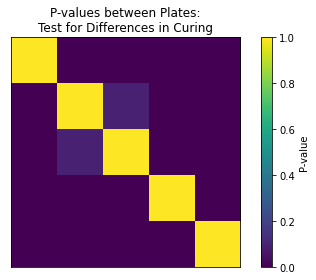

In [ ]:
#all_plate_names = colony_data['Plate Name'].unique()
#all_sector_values = list(range(0, int(np.max(colony_data['Pred # Sectors']))+1))
max_sector_value = max(all_sector_values)
print(max_sector_value)
print(all_plate_names)
print(all_sector_values)
my_multiindex = pd.MultiIndex.from_product([all_plate_names, all_sector_values], names=['Plates', 'Pred # Sectors'])
#new_data_by_plate = pd.DataFrame()
new_colony_table = pd.DataFrame(index=my_multiindex, columns=['All Colonies', 'Cured Colonies', 'Un-cured Colonies'])
#print(new_colony_table)
#print(new_colony_table.loc[('Plate_2.jpg', 0):('Plate_2.jpg', 7)])
for (my_plate, my_count) in my_multiindex:
    #print(type(my_plate))
    #print(type(my_count))
    #print(len(colony_data[(colony_data['Plate Name'] == my_plate) & (colony_data['Pred # Sectors'] == my_count)]))
    this_subset_data = colony_data[(colony_data['Plate Name'] == my_plate) & (colony_data['Pred # Sectors'] == my_count)]
    new_colony_table.loc[(my_plate, my_count)]['All Colonies'] = len(this_subset_data)

    this_cured_data = this_subset_data[(this_subset_data['Red Area (Seg)'] / this_subset_data['Colony Area (Seg)']) >= 0.95]
    new_colony_table.loc[(my_plate, my_count)]['Cured Colonies'] = len(this_cured_data)

    this_uncured_data = this_subset_data[(this_subset_data['Red Area (Seg)'] / this_subset_data['Colony Area (Seg)']) < 0.95]
    new_colony_table.loc[(my_plate, my_count)]['Un-cured Colonies'] = len(this_uncured_data)
    #print(colony_data[colony_data['Pred # Sectors'] == my_count])
    #new_colony_table[(my_plate, my_count)] = len(colony_data[colony_data['Plate Name'] == my_plate & colony_data['Pred # Sectors'] == my_count])
print(new_colony_table)

# The above has created a table showing, per plate, the number of colonies with x number of sectors and number of cured colonies.
cured_list = []
uncured_list = []
for this_plate_name in all_plate_names:
    this_subset_data = colony_data[colony_data['Plate Name'] == this_plate_name]
    this_cured_data = this_subset_data[(this_subset_data['Red Area (Seg)'] / this_subset_data['Colony Area (Seg)']) >= 0.95]
    cured_list.append(len(this_cured_data))
    this_uncured_data = this_subset_data[(this_subset_data['Red Area (Seg)'] / this_subset_data['Colony Area (Seg)']) < 0.95]
    uncured_list.append(len(this_uncured_data))
cured_table = pd.DataFrame({'Cured Colonies':cured_list, 'Un-cured Colonies':uncured_list}, index=all_plate_names)
print(cured_table)

# Run tests on this data
# Source: https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/

from scipy.stats import fisher_exact

p_value_array = np.empty([len(all_plate_names),len(all_plate_names) ])
plate_number = 0
for reference_plate in all_plate_names:
    plate_number = plate_number + 1
    comparison_plate = 0
    for target_plate in all_plate_names:
        comparison_plate = comparison_plate + 1
        plate_1_cured = new_colony_table.loc[(reference_plate, 0):(reference_plate, max_sector_value)]['Cured Colonies'].sum()
        plate_1_uncured = new_colony_table.loc[(reference_plate, 0):(reference_plate, max_sector_value)]['Un-cured Colonies'].sum()
        plate_2_cured = new_colony_table.loc[(target_plate, 0):(target_plate, max_sector_value)]['Cured Colonies'].sum()
        plate_2_uncured = new_colony_table.loc[(target_plate, 0):(target_plate, max_sector_value)]['Un-cured Colonies'].sum()
        table = np.array([[plate_1_cured, plate_2_cured], [plate_1_uncured, plate_2_uncured]])
        oddsr, p = fisher_exact(table, alternative='two-sided')
        p_value_array[plate_number-1, comparison_plate-1] = p
        if p <= 0.001:
            print('Potential difference in curing found between plates ' + reference_plate + ' and ' + target_plate)
p_value_rounded_array = np.round(p_value_array, 3)
print(p_value_rounded_array)

fig, ax = plt.subplots()
im = ax.imshow(p_value_rounded_array)

#names_for_plates = list(['Plate 1','Plate 2','Plate 3','Plate 4','Plate 5'])
names_for_plates = list([])

ax.set_xticks(np.arange(len(names_for_plates)))
ax.set_yticks(np.arange(len(names_for_plates)))

ax.set_xticklabels(names_for_plates)
ax.set_yticklabels(names_for_plates)

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# for i in np.arange(len(names_for_plates)):
#     for j in np.arange(len(names_for_plates)):
#         text = ax.text(j, i, p_value_rounded_array[i, j], ha="center", va="center", color="w")

ax.set_title("P-values between Plates:\nTest for Differences in Curing")
#fig.colorbar(label="P-value", orientation="vertical")
fig.colorbar(plt.cm.ScalarMappable(norm=matplotlib.colors.Normalize(vmin=0, vmax=1), cmap='viridis'), ax=ax, label="P-value", orientation="vertical")
#plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), label="P-value", orientation="vertical")
fig.tight_layout()
plt.show()

# Mark where the extracted colonies were found

Looking at Plate_1.jpg:
362
Bad segementations: 0
Fully red colonies: 0
Fully white colonies: 362
Sectored colonies: 0
362


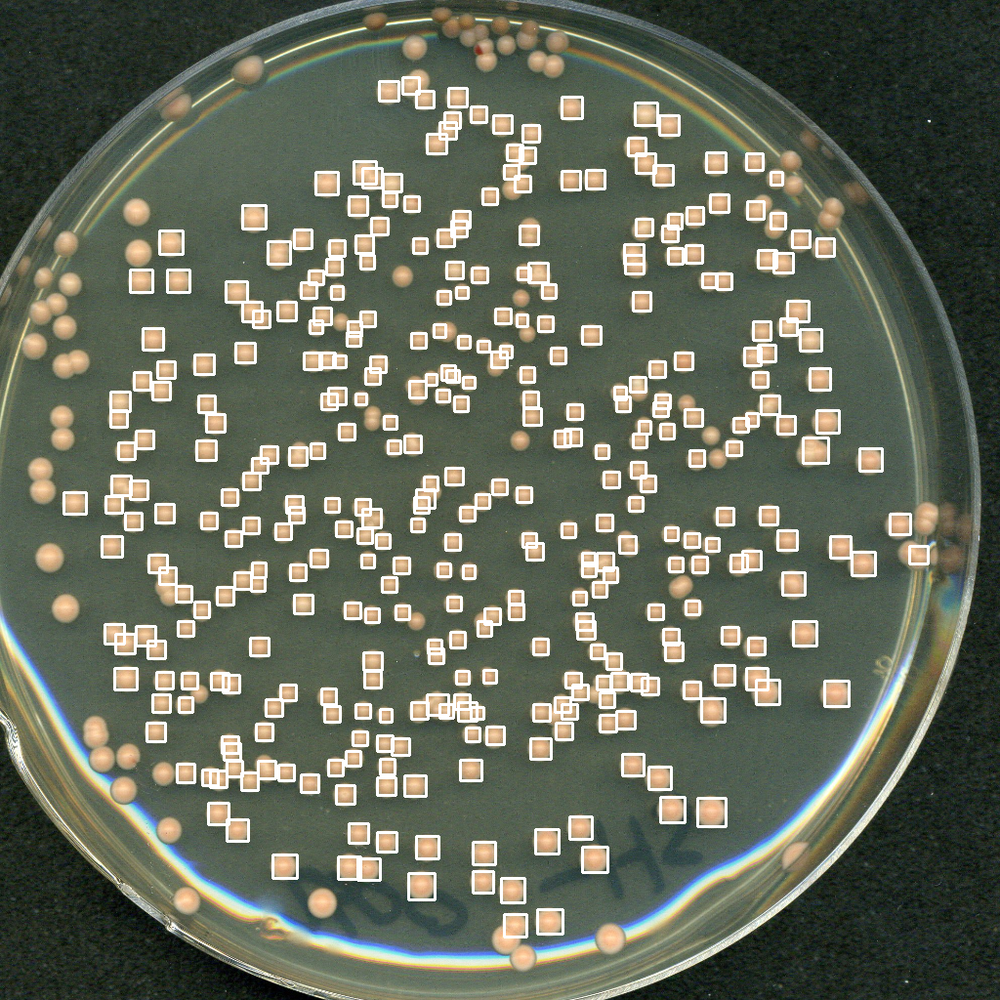

Looking at Plate_2.jpg:
228
Bad segementations: 0
Fully red colonies: 16
Fully white colonies: 51
Sectored colonies: 161
228


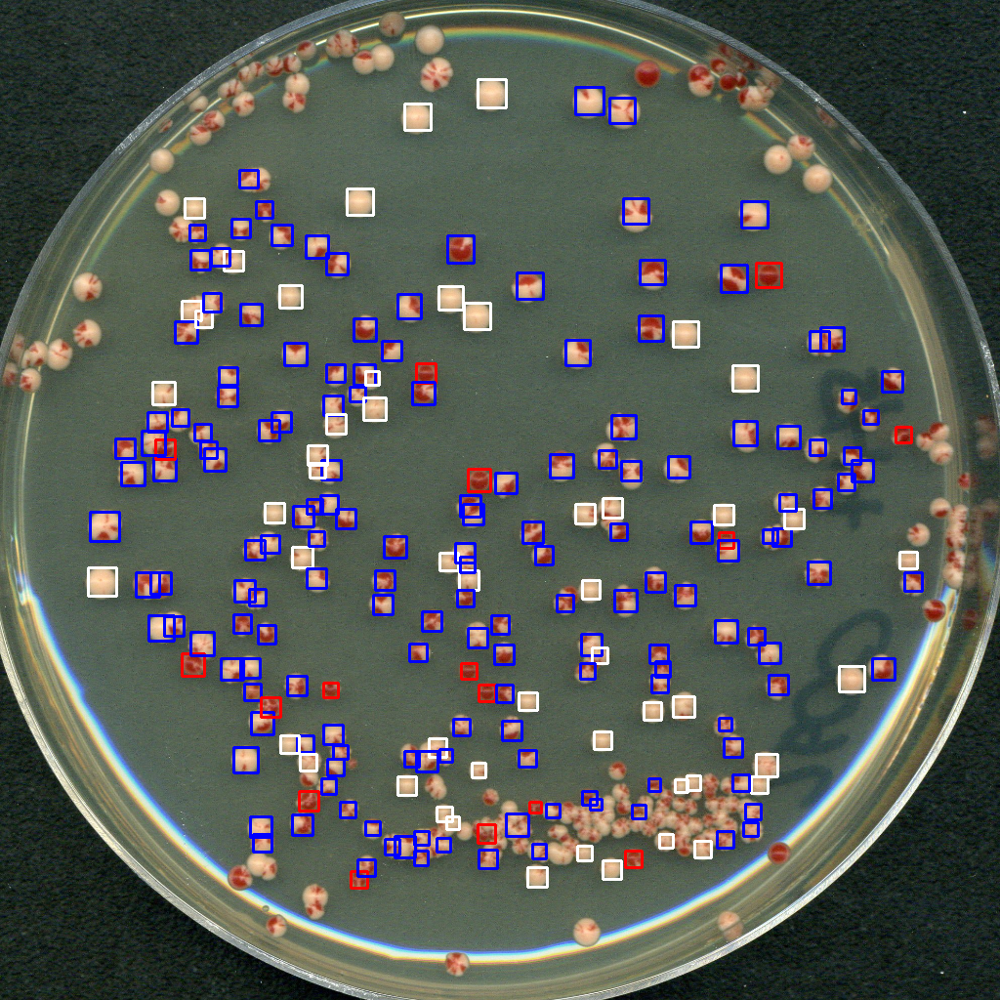

Looking at Plate_3.jpg:
332
Bad segementations: 0
Fully red colonies: 61
Fully white colonies: 221
Sectored colonies: 50
332


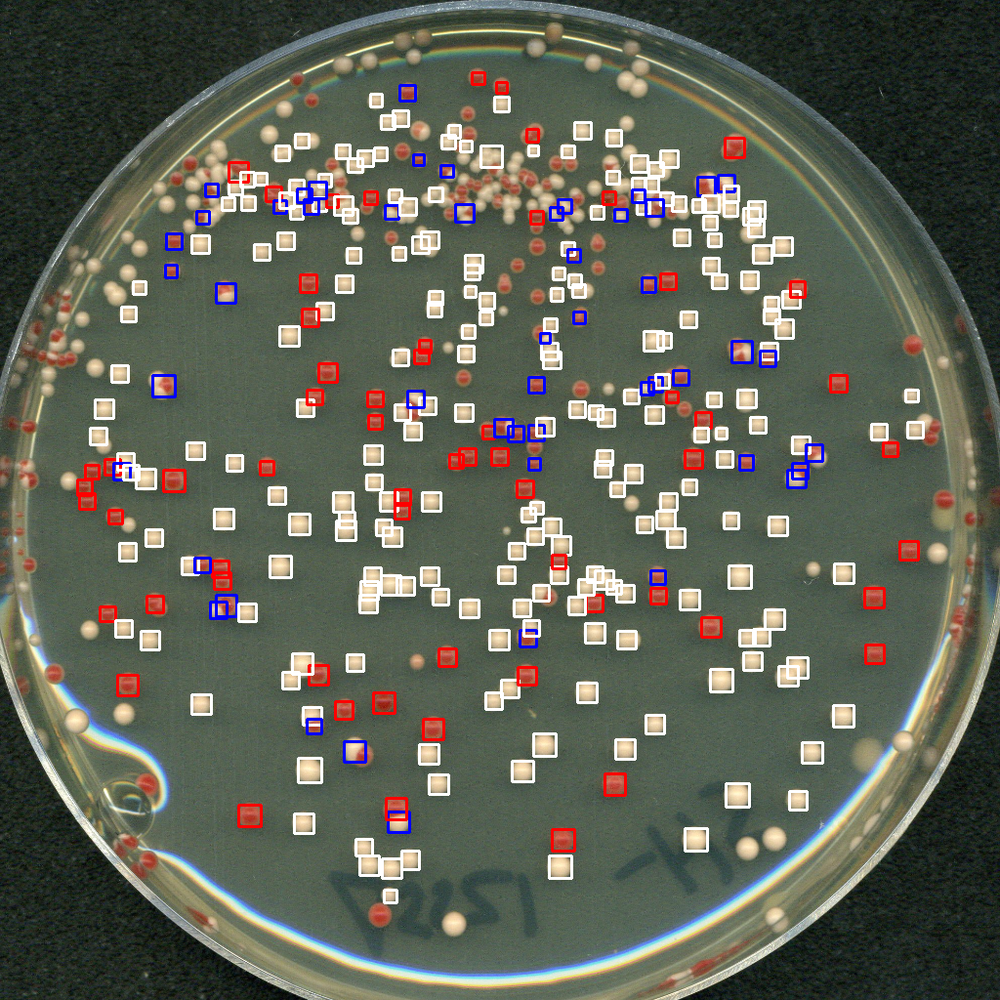

Looking at Plate_4.jpg:
275
Bad segementations: 0
Fully red colonies: 196
Fully white colonies: 27
Sectored colonies: 52
275


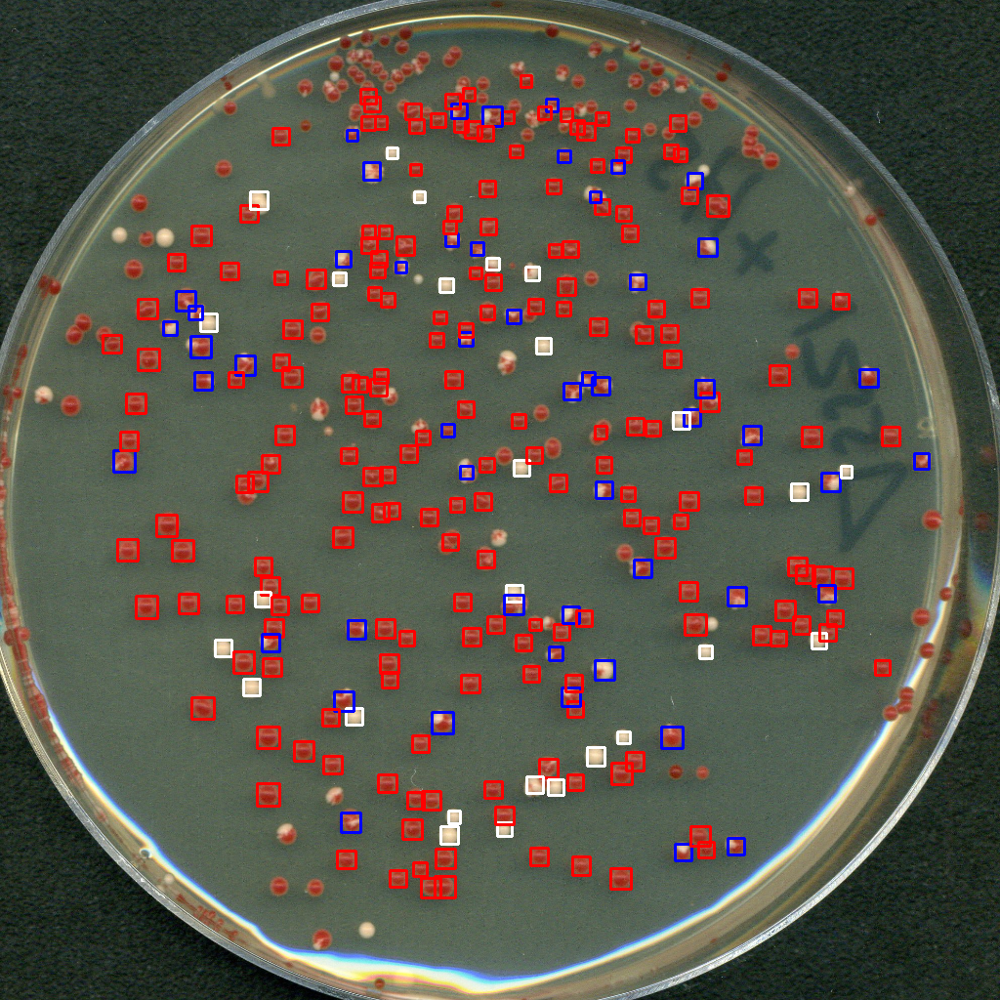

Looking at Plate_5.jpg:
191
Bad segementations: 0
Fully red colonies: 139
Fully white colonies: 10
Sectored colonies: 42
191


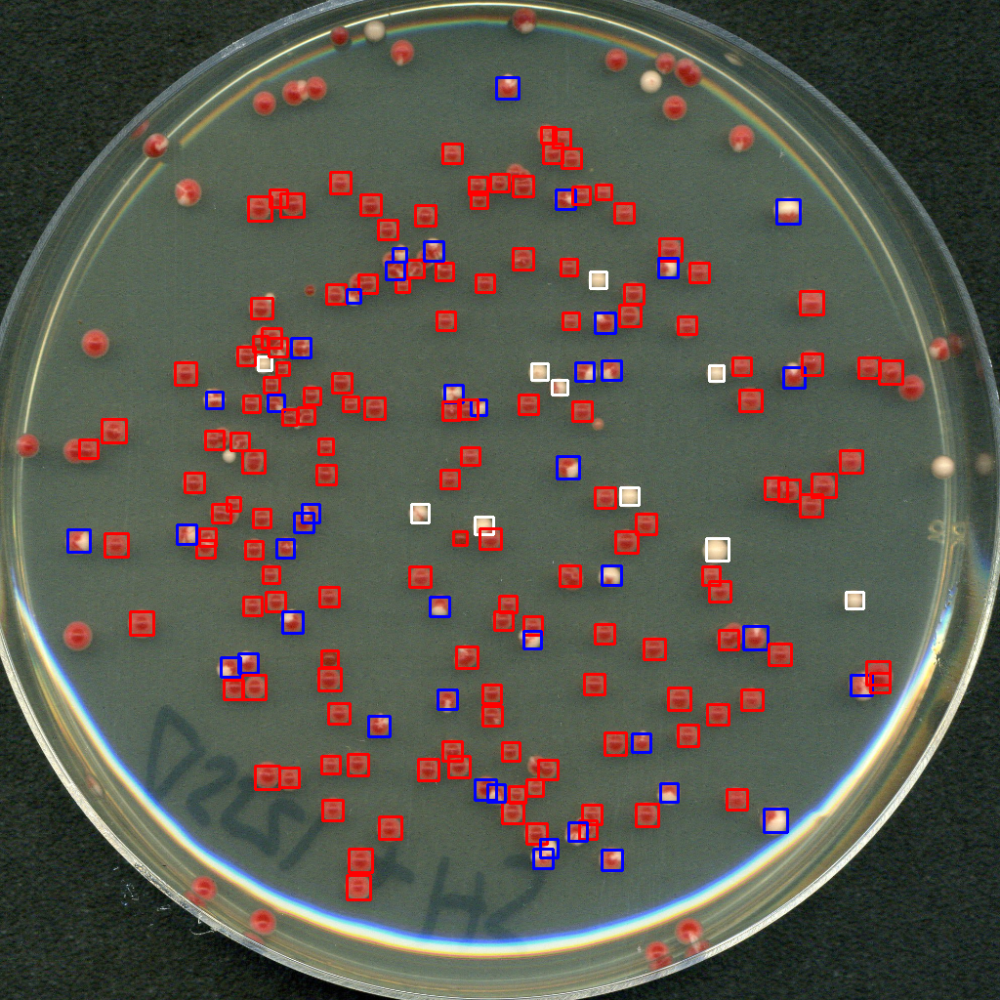

In [ ]:
def get_color_codes(p):
    if p == 0: # bad_seg
        color_code = (0,255,0)
    elif p == 1: # pink
        color_code = (255,0,255)
    elif p == 2: # red
        color_code = (0,0,255)
    elif p == 3: # variegating
        color_code = (255,0,0)
    elif p == 4: # white
        color_code = (255,255,255)
    return color_code

all_plate_names = colony_data['Plate Name'].unique()
all_sector_values = list(range(0, np.max(colony_data['Pred # Sectors'])+1))

# iterate through each plate
for this_plate_name in all_plate_names:

    this_plate_stem = os.path.splitext(this_plate_name)[0]
    print('Looking at ' + str(this_plate_name) + ':')
    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate_name]
    number_colonies = len(this_plate_data) # number of colonies found
    print(number_colonies)
    indicator_array = [] #initialize

    for this_colony in range(0, number_colonies):
        # Check if the colony was predicted to be red (cured)
        if (this_plate_data['(AC) Cured'].iloc[this_colony]) & (this_plate_data['Pred # Sectors'].iloc[this_colony] == 1):
            indicator_array.append(2)
        # Check if the colony was predicted to be white (stable)
        elif (this_plate_data['(AC) Stable'].iloc[this_colony]) & (this_plate_data['Pred # Sectors'].iloc[this_colony] == 0):
            indicator_array.append(4)
        # Check if the colony was predicted to be variegating (sectored, neither cured nor stable)
        elif (not ((this_plate_data['(AC) Stable'].iloc[this_colony]) | (this_plate_data['(AC) Cured'].iloc[this_colony]))) & (this_plate_data['Pred # Sectors'].iloc[this_colony] > 0):
            indicator_array.append(3)
        # Anything else is a bad segmentation.  Pink colonies are not considered, so 1 is not assigned
        else:
            indicator_array.append(0)
    
    indicator_array = np.array(indicator_array)
    # Display total number of colonies for each label
    print('Bad segementations: ' + str(np.sum(indicator_array == 0)))
    print('Fully red colonies: ' + str(np.sum(indicator_array == 2)))
    print('Fully white colonies: ' + str(np.sum(indicator_array == 4)))
    print('Sectored colonies: ' + str(np.sum(indicator_array == 3)))


    # Plot the boxes onto the image
    this_image = read_image(real_image_folder + '/' + this_plate_name)
    this_img_copy = copy.deepcopy(this_image)*255
    print(len(indicator_array))
    for this_row in range(0,number_colonies):
        this_pred = indicator_array[this_row]
        cv2.rectangle(this_img_copy, (this_plate_data['Side Left'].iloc[this_row], this_plate_data['Side Top'].iloc[this_row]), (this_plate_data['Side Right'].iloc[this_row], this_plate_data['Side Bottom'].iloc[this_row]), get_color_codes(this_pred), 2)
        #cv2.rectangle(this_img_copy, (this_plate_data['Side Top'].iloc[this_row], this_plate_data['Side Left'].iloc[this_row]), (this_plate_data['Side Bottom'].iloc[this_row], this_plate_data['Side Right'].iloc[this_row]), get_color_codes(this_pred), 2)
    cv2_imshow(this_img_copy)

    cv2.imwrite(test_boxes_folder + '/' + this_plate_stem + '.jpg', this_img_copy)

# Plotting Predictions

### Number of Red Regions and their Sizes

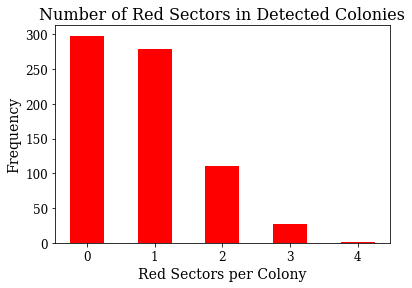

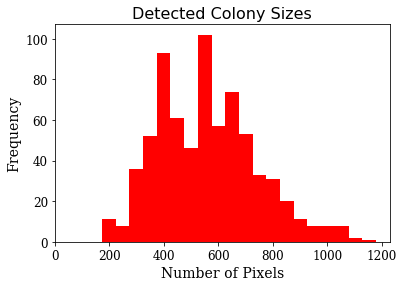

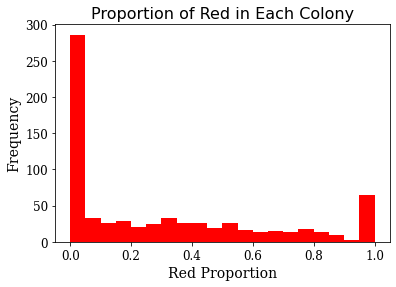

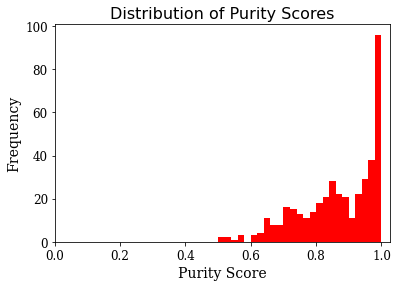

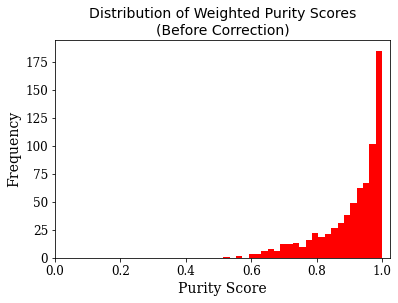

...

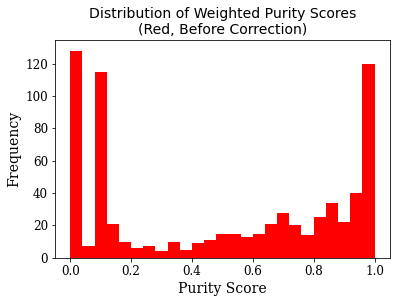

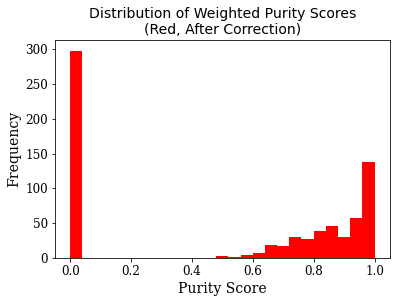

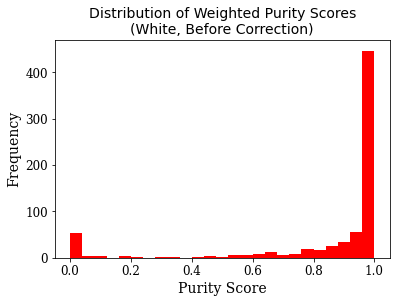

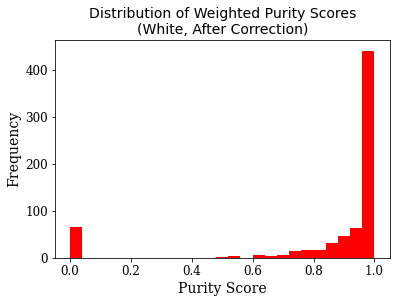

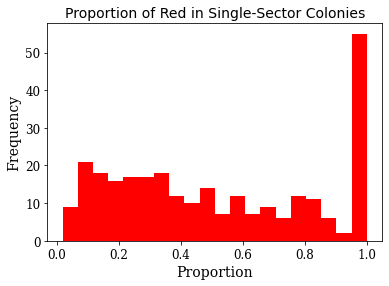

Number of single sector colonies extracted: 279
Number of single sector colonies extracted whose sectors cover more than 95% of colony: 56
Proportion of single sector colonies with more than 95% of colony covered by sector: 0.2007168458781362


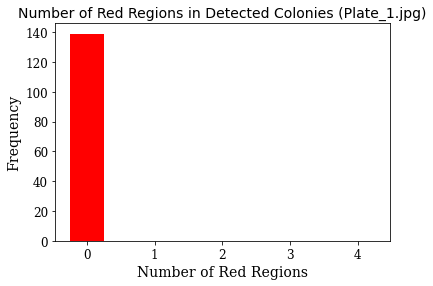

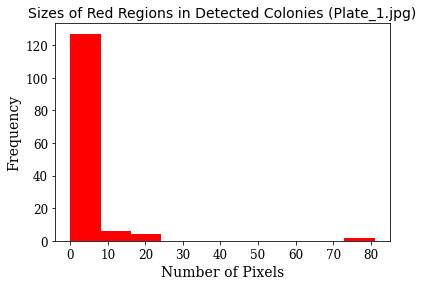

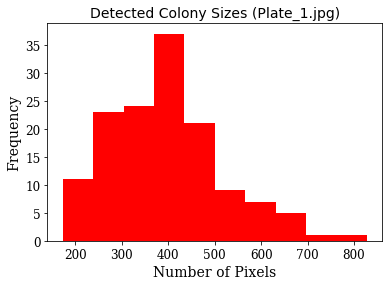

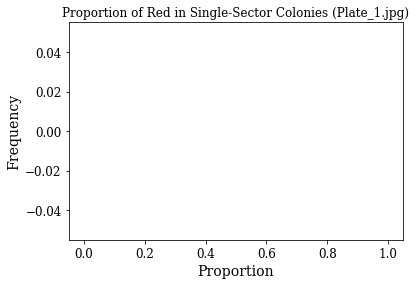

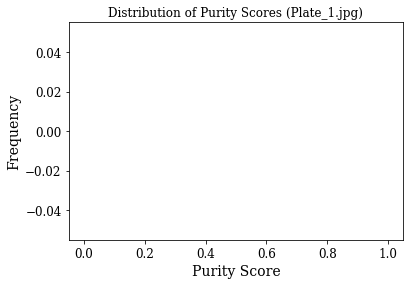

Number of single sector colonies extracted: 0
Number of single sector colonies extracted whose sectors cover more than 95% of colony: 0


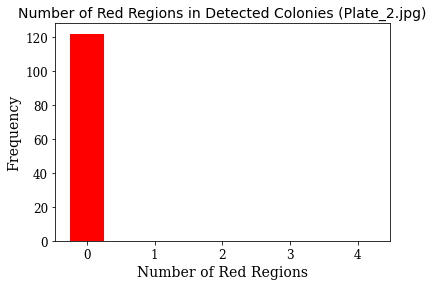

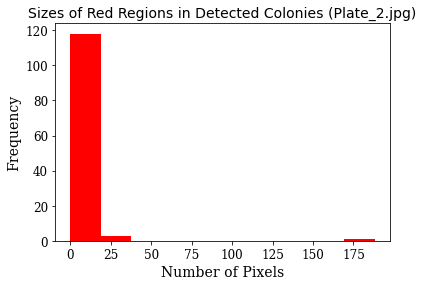

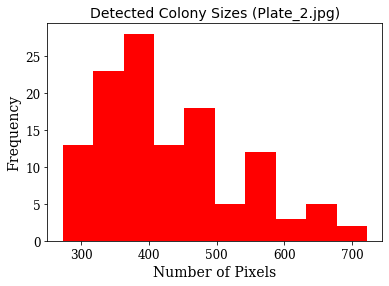

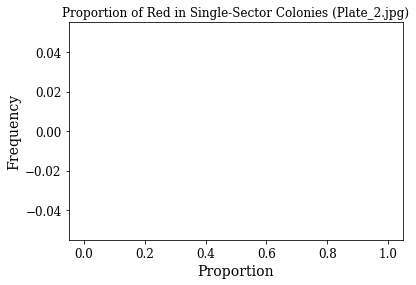

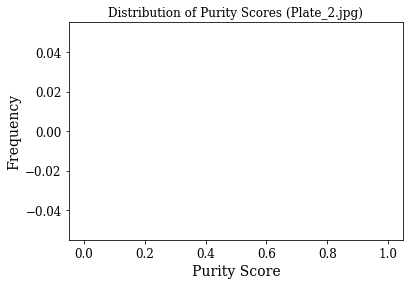

Number of single sector colonies extracted: 0
Number of single sector colonies extracted whose sectors cover more than 95% of colony: 0


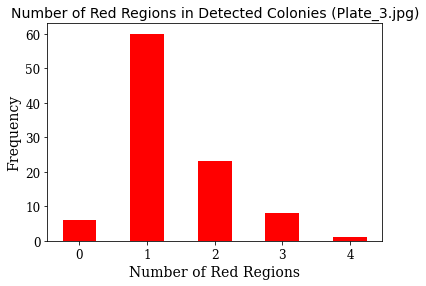

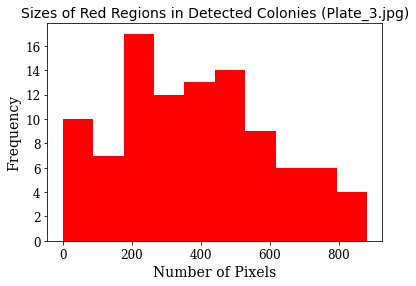

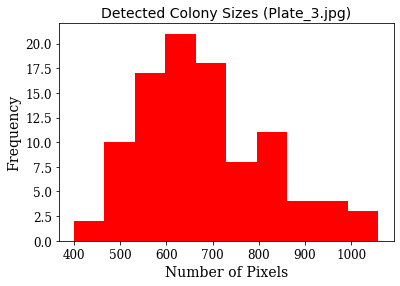

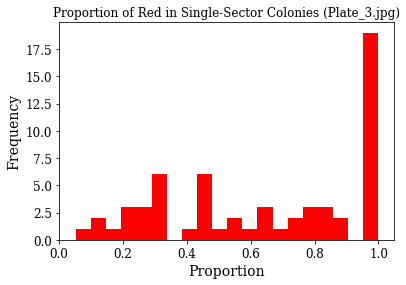

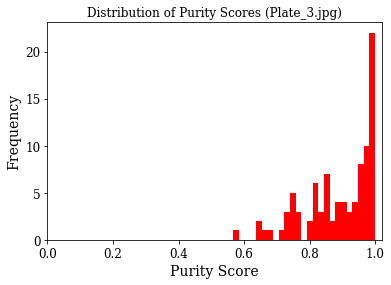

Number of single sector colonies extracted: 60
Number of single sector colonies extracted whose sectors cover more than 95% of colony: 19
Proportion of single sector colonies with more than 95% of colony covered by sector: 0.31666666666666665


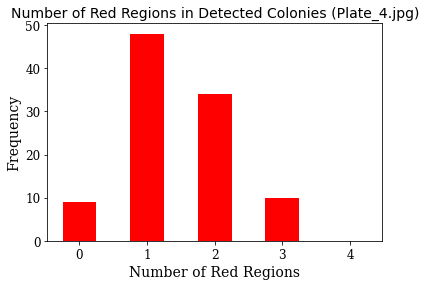

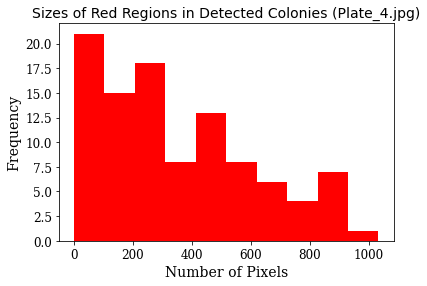

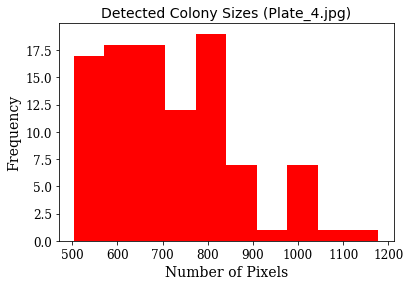

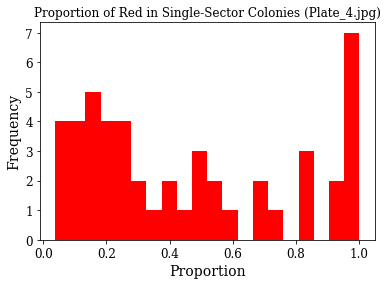

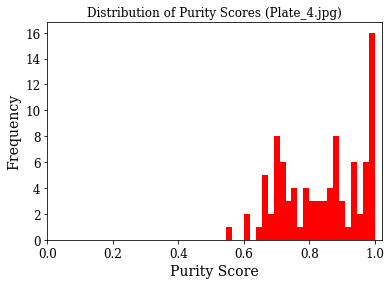

Number of single sector colonies extracted: 48
Number of single sector colonies extracted whose sectors cover more than 95% of colony: 8
Proportion of single sector colonies with more than 95% of colony covered by sector: 0.16666666666666666


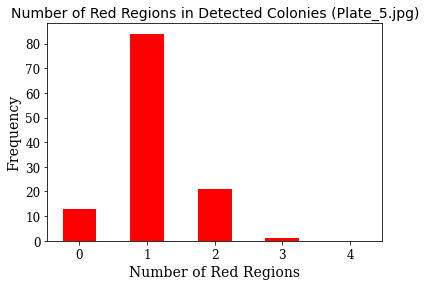

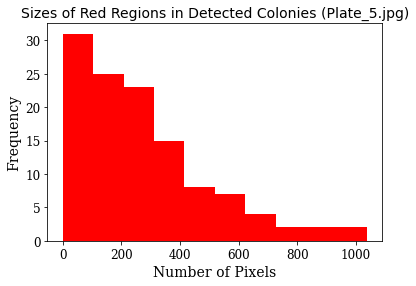

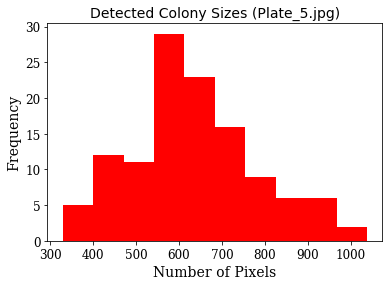

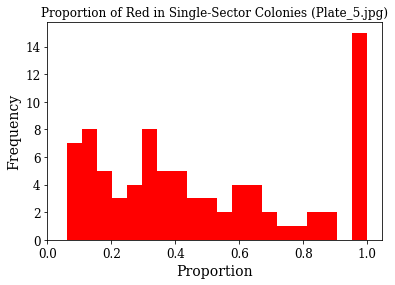

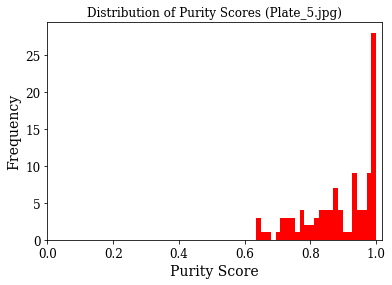

Number of single sector colonies extracted: 84
Number of single sector colonies extracted whose sectors cover more than 95% of colony: 15
Proportion of single sector colonies with more than 95% of colony covered by sector: 0.17857142857142858


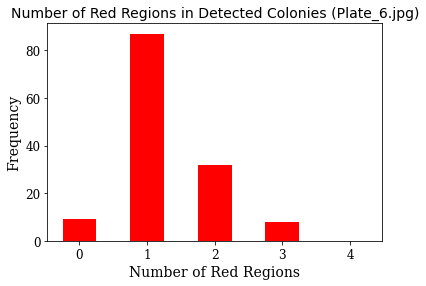

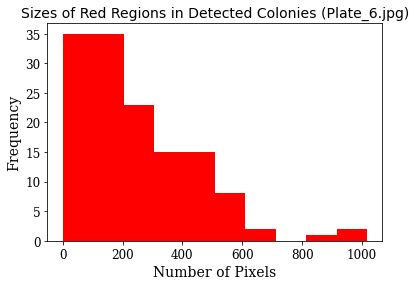

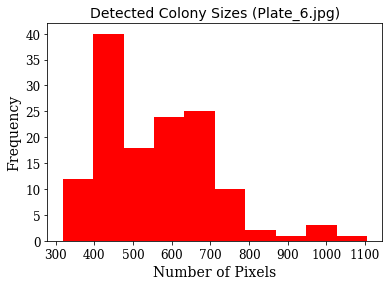

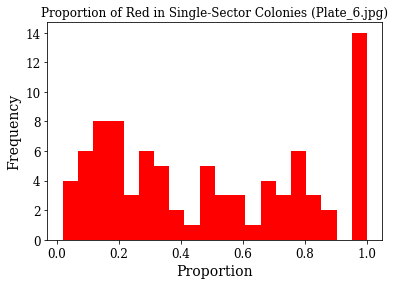

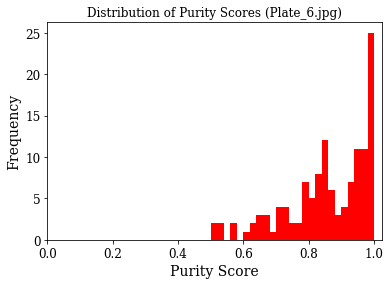

Number of single sector colonies extracted: 87
Number of single sector colonies extracted whose sectors cover more than 95% of colony: 14
Proportion of single sector colonies with more than 95% of colony covered by sector: 0.16091954022988506


In [ ]:
# Code to make nice plots
# What plots do you have in mind?
#   - Number of sectors per colony
#   - Sector Sizes per colony
#   - Number of cured colonies per plate
#   - Distribution of purity scores (red, white, and paired)
#   - 
#   - 

plt.rcParams["font.family"] = "serif"

# Get limiters for axes based on data gathered
max_sector_counts = np.max(colony_data['Pred # Sectors']) # max number of sectors in any colony in the dataset
min_prop_area = 0
max_prop_area = 1
min_colony_area = 0
max_colony_area = np.max(colony_data['Colony Area (Seg)'])

# AGGREGATED DATA

full_sector_counts_array = np.array(colony_data['Pred # Sectors'])
full_sector_sizes_array = np.array(colony_data['Red Area (Seg)'])
full_nonsector_sizes_array = np.array(colony_data['White Area (Seg)'])
full_colony_sizes_array = np.array(colony_data['Colony Area (Seg)'])
full_red_prop_array = np.array(colony_data['Red Area (Seg)'] / colony_data['Colony Area (Seg)'])
full_purity_scores_array = np.array(colony_data['Avg Sector Score'])
full_weighted_purity_scores_before_array = np.array(colony_data['(BC) Weighted Full Average Score'])
full_weighted_purity_scores_after_array = np.array(colony_data['(AC) Weighted Full Average Score'])
full_sector_scores_array = full_purity_scores_array[full_purity_scores_array > 0]

full_weighted_red_purity_scores_before_array = np.array(colony_data['(BC) Weighted Red Average Score'])
full_weighted_white_purity_scores_before_array = np.array(colony_data['(BC) Weighted White Average Score'])

full_weighted_red_purity_scores_after_array = np.array(colony_data['(AC) Weighted Red Average Score'])
full_weighted_white_purity_scores_after_array = np.array(colony_data['(AC) Weighted White Average Score'])

interesting_red_colonies = colony_data[(colony_data['Pred # Sectors'] == 1) | (colony_data['(AC) Cured'] == True)]
single_sector_colonies = interesting_red_colonies[(interesting_red_colonies['Pred # Sectors'] == 1) & (interesting_red_colonies['(AC) Cured'] == False)] # These are the 'sectored' colonies
full_cured_colonies = interesting_red_colonies[(interesting_red_colonies['Pred # Sectors'] == 1) & (interesting_red_colonies['(AC) Cured'] == True)] # These are the 'cured' colonies
other_sectored_colonies = interesting_red_colonies[(interesting_red_colonies['Pred # Sectors'] != 1)] # These are the 'cured' colonies that had more than one sector (should be little to none)

# Now, from the data you have, look into the single red region colonies, and divide them between cured and sectored
single_region_colonies = colony_data[colony_data['Pred # Sectors'] == 1]

#print(other_sectored_colonies[['Pred # Sectors']])



#raise NameError('Done here')

#full_cured_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == True]
#single_sector_colonies = colony_data[colony_data['Pred # Sectors'] == 1]
#no_sector_colonies
#full_cured_colonies = colony_data.iloc[full_cured_colonies]['(AC) Cured']
#print(full_cured_colonies)

fig, ax = plt.subplots(1)
plt.hist(full_sector_counts_array, bins=np.arange(max_sector_counts + 2)- 0.5, color = 'red', rwidth=0.5)
# plt.rcParams['text.usetex'] = True
# plt.rcParams.update({
#     "text.usetex": True,
#     "font.family": "serif",
#     "font.serif": ["Palatino"],
# })
plt.title('Number of Red Sectors in Detected Colonies', fontfamily="serif", Fontsize=14)
plt.xlabel('Red Sectors per Colony')
plt.ylabel('Frequency')
plt.xticks(range(max_sector_counts + 1), fontsize=12)
plt.yticks(fontsize=12)
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Sector_Counts_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_colony_sizes_array, color = 'red', bins=20)
plt.title('Detected Colony Sizes', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Number of Pixels')
plt.ylabel('Frequency')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_xlim(left=0)
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Colony_Sizes_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_red_prop_array, color = 'red', bins=20)
plt.title('Proportion of Red in Each Colony', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Red Proportion')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2), fontsize=12)
plt.yticks(fontsize=12)
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Red_Prop_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_sector_scores_array, color = 'red', bins=25)
plt.title('Distribution of Purity Scores', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Dist_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_purity_scores_before_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores\n(Before Correction)', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
#ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_Before_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_purity_scores_after_array, color = 'red', bins=np.linspace(0, 1, 25, endpoint=True))
plt.title('Distribution of Weighted Purity Scores', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
#ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_After_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_red_purity_scores_before_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores\n(Red, Before Correction)', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
#ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_Red_Before_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_red_purity_scores_after_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores\n(Red, After Correction)', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
#ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_Red_After_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_white_purity_scores_before_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores\n(White, Before Correction)', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
#ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_White_Before_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_white_purity_scores_after_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores\n(White, After Correction)', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
#ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_White_After_All.png', bbox_inches='tight', dpi=300)

full_single_sector_table = colony_data[colony_data["Pred # Sectors"] == 1]
full_single_sector_prop = full_single_sector_table['Red Area (Seg)'] / full_single_sector_table['Colony Area (Seg)']
full_sector_prop_array = np.array(full_single_sector_table['Red Area (Seg)'] / full_single_sector_table['Colony Area (Seg)'])

fig, ax = plt.subplots(1)
plt.hist(full_sector_prop_array, color = 'red', bins=20)
plt.title('Proportion of Red in Single-Sector Colonies', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Proportion')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
plt.yticks(fontsize=12)
#ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Red_Prop_Single_All.png', bbox_inches='tight', dpi=300)

print('Number of single sector colonies extracted: ' + str(len(full_sector_prop_array)))

sector_sufficient_array = full_sector_prop_array[full_sector_prop_array >= 0.95]
print('Number of single sector colonies extracted whose sectors cover more than 95% of colony: ' + str(len(sector_sufficient_array)))

if len(full_sector_prop_array) > 0:
    print('Proportion of single sector colonies with more than 95% of colony covered by sector: ' + str(len(sector_sufficient_array) / len(full_sector_prop_array)))






# PLATE BY PLATE PLOTS

for this_plate_name in all_plate_names:
  this_plate_stem = os.path.splitext(this_plate_name)[0]
  this_image_table = colony_data[colony_data["Plate Name"] == this_plate_name]

  these_sector_counts_array = np.array(this_image_table['Pred # Sectors'])
  these_sector_sizes_array = np.array(this_image_table['Red Area (Seg)'])
  these_colony_sizes_array = np.array(this_image_table['Colony Area (Seg)'])
  these_purity_scores_array = np.array(this_image_table['Avg Sector Score'])
  these_sector_scores_array = these_purity_scores_array[these_purity_scores_array > 0]

  fig, ax = plt.subplots(1)
  plt.hist(these_sector_counts_array, bins=np.arange(max_sector_counts + 2)- 0.5, color = 'red', rwidth=0.5)
  plt.title('Number of Red Regions in Detected Colonies (' + this_plate_name + ')', fontfamily="sans-serif", Fontsize=14)
  plt.xlabel('Number of Red Regions')
  plt.ylabel('Frequency')
  plt.xticks(range(max_sector_counts + 1), fontsize=12)
  plt.yticks(fontsize=12)
  ax.xaxis.label.set_fontsize(14)
  ax.yaxis.label.set_fontsize(14)
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Sector_Counts_' + str(this_plate_stem) + '.png', bbox_inches='tight')
  

  fig, ax = plt.subplots(1)
  plt.hist(these_sector_sizes_array, color = 'red', bins=10)
  plt.title('Sizes of Red Regions in Detected Colonies (' + this_plate_name + ')', fontfamily="sans-serif", Fontsize=14)
  plt.xlabel('Number of Pixels')
  plt.ylabel('Frequency')
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)
  ax.xaxis.label.set_fontsize(14)
  ax.yaxis.label.set_fontsize(14)
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Red_Sizes_' + str(this_plate_stem) + '.png', bbox_inches='tight')

  fig, ax = plt.subplots(1)
  plt.hist(these_colony_sizes_array, color = 'red', bins=10)
  plt.title('Detected Colony Sizes (' + this_plate_name + ')', fontfamily="sans-serif", Fontsize=14)
  plt.xlabel('Number of Pixels')
  plt.ylabel('Frequency')
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)
  ax.xaxis.label.set_fontsize(14)
  ax.yaxis.label.set_fontsize(14)
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Colony_Sizes_' + str(this_plate_stem) + '.png', bbox_inches='tight')

  # Get single-sector colonies, and plot how "cured" each colony is

  single_sector_table = this_image_table[this_image_table["Pred # Sectors"] == 1]

  single_sector_prop = single_sector_table['Red Area (Seg)'] / single_sector_table['Colony Area (Seg)']

  fig, ax = plt.subplots(1)
  plt.hist(single_sector_prop, color = 'red', bins=20)
  plt.title('Proportion of Red in Single-Sector Colonies (' + this_plate_name + ')')
  plt.xlabel('Proportion')
  plt.ylabel('Frequency')
  plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
  plt.yticks(fontsize=12)
  ax.xaxis.label.set_fontsize(14)
  ax.yaxis.label.set_fontsize(14)
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Red_Prop_Single_'+ str(this_plate_stem) + '.png', bbox_inches='tight')

  fig, ax = plt.subplots(1)
  plt.hist(these_sector_scores_array, color = 'red', bins=25)
  plt.title('Distribution of Purity Scores (' + this_plate_name + ')')
  plt.xlabel('Purity Score')
  plt.ylabel('Frequency')
  plt.xticks(np.arange(0, 1 + 1e-2, step=0.2),fontsize=12)
  plt.yticks(fontsize=12)
  ax.xaxis.label.set_fontsize(14)
  ax.yaxis.label.set_fontsize(14)
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Purity_Scores_'+ str(this_plate_stem) + '.png', bbox_inches='tight')

  sector_prop_array = np.array(single_sector_table['Red Area (Seg)'] / single_sector_table['Colony Area (Seg)'])
  print('Number of single sector colonies extracted: ' + str(len(sector_prop_array)))

  sector_sufficient_array = sector_prop_array[sector_prop_array >= 0.95]
  print('Number of single sector colonies extracted whose sectors cover more than 95% of colony: ' + str(len(sector_sufficient_array)))
  
  if len(sector_prop_array) > 0:
    print('Proportion of single sector colonies with more than 95% of colony covered by sector: ' + str(len(sector_sufficient_array) / len(sector_prop_array)))






### Cured vs Sectored Colonies

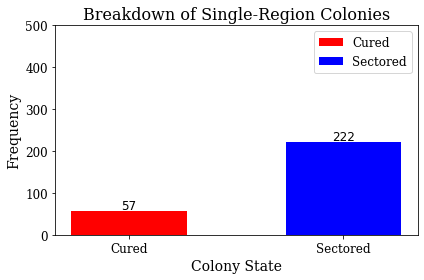

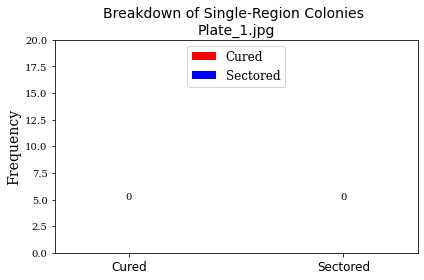

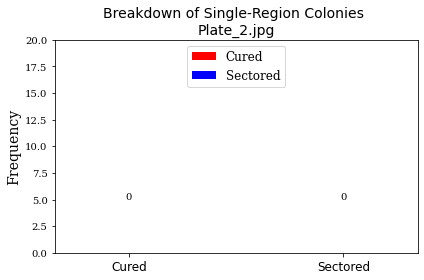

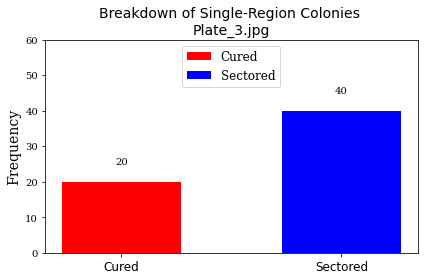

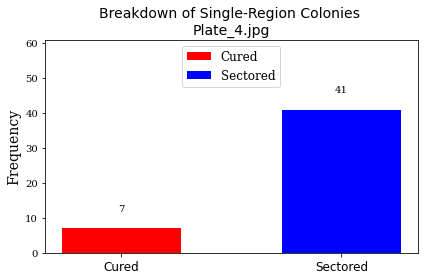

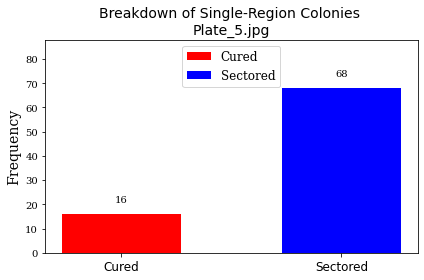

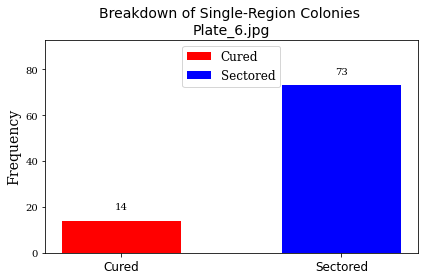

In [ ]:
single_sector_colonies = colony_data[colony_data['Pred # Sectors'] == 1]
cured_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == True]
sectored_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == False]

num_cured_colonies = len(cured_colonies)
num_sectored_colonies = len(sectored_colonies)

plot_labels = list([0, 1])

x = np.arange(len(plot_labels))  # the label locations
width = 0.35  # the width of the bars
#x - width/2

fig, ax = plt.subplots()
rects1 = ax.bar(0+(width/2), num_cured_colonies, width, label='Cured', color='red')
rects2 = ax.bar(1-(width/2), num_sectored_colonies, width, label='Sectored', color='blue')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Frequency')
ax.set_title('Breakdown of Single-Region Colonies', fontfamily = "serif", Fontsize=14)
ax.set_xlabel('Colony State')
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
#ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
ax.set_ylim(bottom=0, top=500)
ax.set_xticks([0+0.35/2,1-0.35/2])
ax.set_xticklabels(['Cured', 'Sectored'], Fontsize=12)
plt.yticks(fontsize=12)
ax.legend(loc='upper right', fontsize=12)
plt.text((0.35/2), num_cured_colonies+5, num_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
plt.text(1-(0.35/2), num_sectored_colonies+5, num_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
#addlabels_true(plot_labels, np.array(num_cured_colonies))
#addlabels_pred(plot_labels, np.array(num_sectored_colonies))

#plt.bar_label(rects1, padding=3)
#plt.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()
fig.savefig(output_plots_folder + '/' + 'Cured_v_Sectored_All.png', bbox_inches='tight', dpi=300)

for this_plate_name in all_plate_names:
    this_plate_stem = os.path.splitext(this_plate_name)[0]
    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate_name]
    single_sector_colonies = this_plate_data[this_plate_data['Pred # Sectors'] == 1]

    cured_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == True]
    sectored_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == False]

    num_cured_colonies = len(cured_colonies)
    num_sectored_colonies = len(sectored_colonies)

    plot_labels = list([0,1])

    x = np.arange(len(plot_labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    fig, ax = plt.subplots()
    rects1 = ax.bar(0+(width/2), num_cured_colonies, width, label='Cured', color='red')
    rects2 = ax.bar(1-(width/2), num_sectored_colonies, width, label='Sectored', color='blue')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Frequency', Fontsize=12)
    ax.set_title('Breakdown of Single-Region Colonies \n' + str(this_plate_name), fontfamily = "sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
    ax.set_xticks([0+0.35/2,1-0.35/2])
    ax.set_xticklabels(['Cured', 'Sectored'], fontfamily = "sans-serif", Fontsize = 12)
    ax.legend(loc='upper center', fontsize=12)

    # calling the function to add value labels
    plt.text((0.35/2), num_cured_colonies+5, num_cured_colonies, ha = 'center')
    plt.text(1-(0.35/2), num_sectored_colonies+5, num_sectored_colonies, ha = 'center')
    #addlabels_true(plot_labels, np.array(num_cured_colonies))
    #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()
    fig.savefig(output_plots_folder + '/' + 'Cured_v_Sectored_'+ str(this_plate_stem) + '.png', bbox_inches='tight')

### Purity Scores Before and After Pipeline

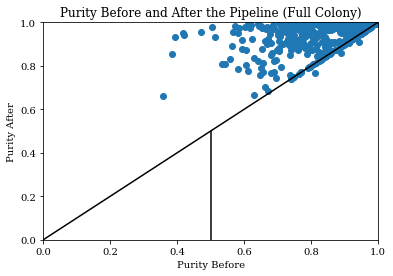

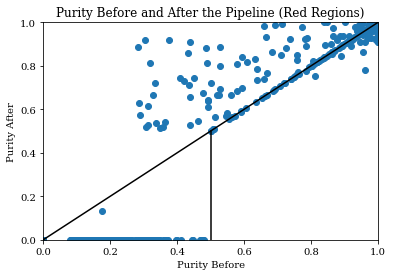

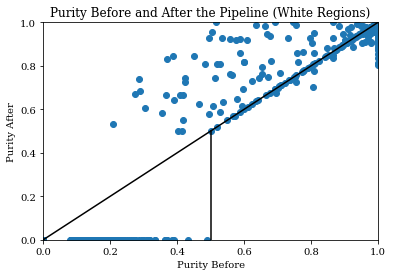

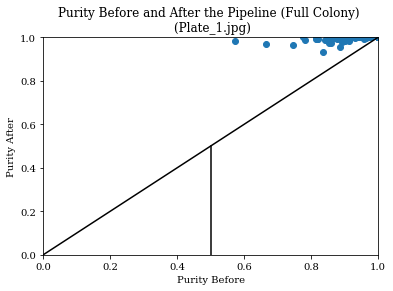

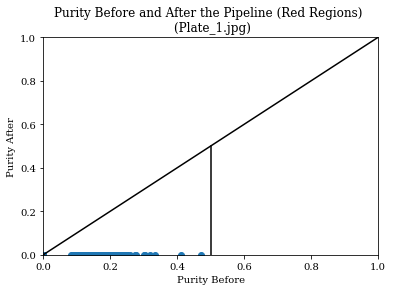

...

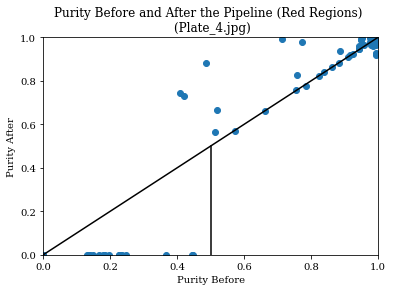

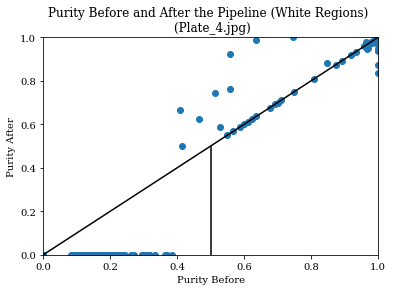

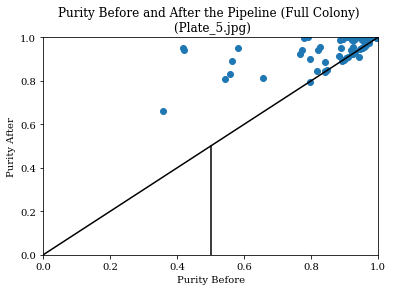

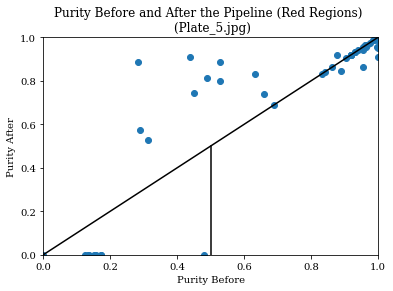

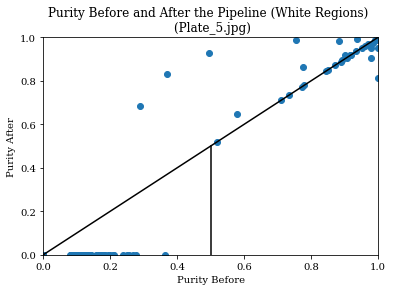

In [ ]:
#colony_data

# The purity scores before and after

fig,ax = plt.subplots()
ax.scatter(colony_data['(BC) Weighted Full Average Score'], colony_data['(AC) Weighted Full Average Score'])
ax.plot([0, 1], [0,1], color='black')
ax.plot([0.5, 0.5], [0,0.5], color='black')
ax.set_title('Purity Before and After the Pipeline (Full Colony)')
ax.set_xlim(left=0, right=1)
ax.set_ylim(bottom=0, top=1)
ax.set_xlabel('Purity Before')
ax.set_ylabel('Purity After')
plt.show()

fig,ax = plt.subplots()
ax.scatter(colony_data['(BC) Weighted Red Average Score'], colony_data['(AC) Weighted Red Average Score'])
ax.plot([0, 1], [0,1], color='black')
ax.plot([0.5, 0.5], [0,0.5], color='black')
ax.set_title('Purity Before and After the Pipeline (Red Regions)')
ax.set_xlim(left=0, right=1)
ax.set_ylim(bottom=0, top=1)
ax.set_xlabel('Purity Before')
ax.set_ylabel('Purity After')
plt.show()

fig,ax = plt.subplots()
ax.scatter(colony_data['(BC) Weighted White Average Score'], colony_data['(AC) Weighted White Average Score'])
ax.plot([0, 1], [0,1], color='black')
ax.plot([0.5, 0.5], [0,0.5], color='black')
ax.set_title('Purity Before and After the Pipeline (White Regions)')
ax.set_xlim(left=0, right=1)
ax.set_ylim(bottom=0, top=1)
ax.set_xlabel('Purity Before')
ax.set_ylabel('Purity After')
plt.show()

# Now, do the above by plate

for this_plate_name in all_plate_names:

    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate_name]

    fig,ax = plt.subplots()
    ax.scatter(this_plate_data['(BC) Weighted Full Average Score'], this_plate_data['(AC) Weighted Full Average Score'])
    ax.plot([0, 1], [0,1], color='black')
    ax.plot([0.5, 0.5], [0,0.5], color='black')
    ax.set_title('Purity Before and After the Pipeline (Full Colony) \n (' + str(this_plate_name) + ')')
    ax.set_xlim(left=0, right=1)
    ax.set_ylim(bottom=0, top=1)
    ax.set_xlabel('Purity Before')
    ax.set_ylabel('Purity After')
    plt.show()

    fig,ax = plt.subplots()
    ax.scatter(this_plate_data['(BC) Weighted Red Average Score'], this_plate_data['(AC) Weighted Red Average Score'])
    ax.plot([0, 1], [0,1], color='black')
    ax.plot([0.5, 0.5], [0,0.5], color='black')
    ax.set_title('Purity Before and After the Pipeline (Red Regions) \n (' + str(this_plate_name) + ')')
    ax.set_xlim(left=0, right=1)
    ax.set_ylim(bottom=0, top=1)
    ax.set_xlabel('Purity Before')
    ax.set_ylabel('Purity After')
    plt.show()

    fig,ax = plt.subplots()
    ax.scatter(this_plate_data['(BC) Weighted White Average Score'], this_plate_data['(AC) Weighted White Average Score'])
    ax.plot([0, 1], [0,1], color='black')
    ax.plot([0.5, 0.5], [0,0.5], color='black')
    ax.set_title('Purity Before and After the Pipeline (White Regions) \n (' + str(this_plate_name) + ')')
    ax.set_xlim(left=0, right=1)
    ax.set_ylim(bottom=0, top=1)
    ax.set_xlabel('Purity Before')
    ax.set_ylabel('Purity After')
    plt.show()



# Plotting Predictions (with [PSI+] and [psi-])

# Plots Involving True Data

### Quantifiable Colonies Only: Stable, Cured, and Sectored

In [ ]:
if use_expert_counts == True:
    # True quantifiable colonies and their labels
    quantifiable_colony_data = colony_data[colony_data['Quantifiable'] == True]
    quantifiable_cured_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Cured'] == True]
    quantifiable_stable_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Stable'] == True]
    quantifiable_sectored_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Sectored'] == True]

    num_cured_colonies = len(quantifiable_cured_colony_data)
    num_stable_colonies = len(quantifiable_stable_colony_data)
    num_sectored_colonies = len(quantifiable_sectored_colony_data)

    # True labels on quantifiable single-region colonies
    quantifiable_colony_data_single = colony_data[(colony_data['Quantifiable'] == True) & (colony_data['Pred # Sectors'] == 1)]
    quantifiable_cured_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Cured'] == True]
    quantifiable_stable_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Stable'] == True] # in the ideal case, this table should be empty
    quantifiable_sectored_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Sectored'] == True]

    num_cured_colonies_single = len(quantifiable_cured_colony_data_single)
    num_stable_colonies_single = len(quantifiable_stable_colony_data_single)
    num_sectored_colonies_single = len(quantifiable_sectored_colony_data_single)

    # Check where the labels match Wes's data

    correct_cured_colony_data = quantifiable_colony_data[(quantifiable_colony_data['Quantifiable Cured'] == True) & (quantifiable_colony_data['(AC) Cured'] == True)]
    correct_stable_colony_data = quantifiable_colony_data[(quantifiable_colony_data['Quantifiable Stable'] == True) & (quantifiable_colony_data['(AC) Stable'] == True)]
    correct_sectored_colony_data = quantifiable_colony_data[(quantifiable_colony_data['Quantifiable Sectored'] == True) & (quantifiable_colony_data['(AC) Cured'] == False) & (quantifiable_colony_data['(AC) Stable'] == False)]

    num_correct_cured_colonies = len(correct_cured_colony_data)
    num_correct_stable_colonies = len(correct_stable_colony_data)
    num_correct_sectored_colonies = len(correct_sectored_colony_data)

    # print(num_cured_colonies)
    # print(num_stable_colonies)
    # print(num_sectored_colonies)

    # Use the metrics package in sklearn to create confusion matrices
    #true_cm_labels = pd.concat([quantifiable_cured_colony_data['Quantifiable Cured'], quantifiable_stable_colony_data['Quantifiable Stable'], quantifiable_sectored_colony_data['Quantifiable Sectored']], axis=0, ignore_index=True)
    #pred_cm_labels = pd.concat([quantifiable_cured_colony_data['(AC) Cured'], quantifiable_stable_colony_data['(AC) Stable'], quantifiable_sectored_colony_data['(AC) Sectored']], axis=0, ignore_index=True)

    #print(quantifiable_colony_data[(quantifiable_colony_data['(AC) Cured'] == True) & (quantifiable_colony_data['(AC) Stable'] == True)])

    stable_mapper = {True : 1, False : 0}
    cured_mapper = {True : 2, False : 0}
    sectored_mapper = {True : 3, False : 0}
    anomaly_mapper = {0 : 4, 1 : 1, 2 : 2, 3 : 3, 4 : 4, 5 : 4, 6 : 4}

    # Map the "True"s to the respective numbers
    true_stable_rep = quantifiable_colony_data['Quantifiable Stable'].map(stable_mapper)
    true_cured_rep = quantifiable_colony_data['Quantifiable Cured'].map(cured_mapper)
    true_sectored_rep = quantifiable_colony_data['Quantifiable Sectored'].map(sectored_mapper)

    # Since all three are mutually exclusive, add all three columns
    true_rep = true_stable_rep + true_cured_rep + true_sectored_rep
    true_rep = true_rep.map(anomaly_mapper)

    # Map the predictions to the respective numbers
    pred_stable_rep = quantifiable_colony_data['(AC) Stable'].map(stable_mapper)
    pred_cured_rep = quantifiable_colony_data['(AC) Cured'].map(cured_mapper)
    pred_sectored_rep = quantifiable_colony_data['(AC) Sectored'].map(sectored_mapper)

    # Since all three are mutually exclusive, add all three columns
    pred_rep = pred_stable_rep + pred_cured_rep + pred_sectored_rep
    pred_rep = pred_rep.map(anomaly_mapper)


    # stable_stable_rep = quantifiable_colony_data['(AC) Stable'].map(stable_mapper)
    # stable_cured_rep = quantifiable_colony_data['(AC) Stable'].map(cured_mapper)
    # stable_sectored_rep = quantifiable_colony_data['(AC) Stable'].map(sectored_mapper)

    # cured_stable_rep = quantifiable_colony_data['(AC) Cured'].map(stable_mapper)
    # cured_cured_rep = quantifiable_colony_data['(AC) Cured'].map(cured_mapper)
    # cured_sectored_rep = quantifiable_colony_data['(AC) Cured'].map(sectored_mapper)

    # sectored_stable_rep = quantifiable_colony_data['(AC) Sectored'].map(stable_mapper)
    # sectored_cured_rep = quantifiable_colony_data['(AC) Sectored'].map(cured_mapper)
    # sectored_sectored_rep = quantifiable_colony_data['(AC) Sectored'].map(sectored_mapper)

    # # Since all three are mutually exclusive, add all three columns
    # stable_comps = stable_stable_rep + cured_stable_rep + sectored_stable_rep # indicator that the colony is predicted stable for example
    # cured_comps = stable_cured_rep + cured_cured_rep + sectored_cured_rep
    # sectored_comps = stable_sectored_rep + cured_sectored_rep + sectored_sectored_rep

    print(np.unique(true_rep))
    print(np.unique(pred_rep))

    confusion_matrix = sklearn.metrics.confusion_matrix(true_rep, pred_rep, labels=[1, 2, 3, 4]) 

    cm_display = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Stable', 'Cured', 'Sectored', 'Issue'])
    cm_display.plot()
    #sns.set(font_scale=3.0) # Adjust to fit
    plt.title('Confusion Matrix of Predicted Colony States')
    plt.xlabel('Predicted Colony Labels')
    plt.ylabel('True Colony Labels')
    plt.show()  

    # Make the bar plots for number of predicted labels

    plot_labels = list([0, 1, 2])

    x = np.arange(len(plot_labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    # Following the color scheme in the images
    fig, ax = plt.subplots()
    rects0 = ax.bar(0+(width/2), num_stable_colonies, width, label='Stable', color='red')
    rects1 = ax.bar(1+(width/2), num_cured_colonies, width, label='Cured', color='green')
    rects2 = ax.bar(2+(width/2), num_sectored_colonies, width, label='Sectored', color='blue')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Frequency')
    ax.set_title('Predicted Labels on Quantifiable Colonies', fontfamily = "sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(14)
    #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
    ax.set_ylim(bottom=0, top=500)
    ax.set_xticks([0+width/2,1+width/2, 2+width/2])
    ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
    plt.yticks(fontsize=12)
    ax.legend(loc='upper center', fontsize=12)
    plt.text((width/2), num_stable_colonies+5, num_stable_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(1+(width/2), num_cured_colonies+5, num_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(2+(width/2), num_sectored_colonies+5, num_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    #addlabels_true(plot_labels, np.array(num_cured_colonies))
    #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

    plot_labels = list([0, 1])

    x = np.arange(len(plot_labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    # Following the color scheme in the images
    fig, ax = plt.subplots()
    rects1 = ax.bar(0+(width/2), num_cured_colonies_single, width, label='Cured', color='green')
    rects2 = ax.bar(1+(width/2), num_sectored_colonies_single, width, label='Sectored', color='blue')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Frequency')
    ax.set_title('Predicted Labels on Quantifiable Single-Region Colonies', fontfamily = "sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(14)
    #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
    ax.set_ylim(bottom=0, top=500)
    ax.set_xticks([0+width/2,1+width/2])
    ax.set_xticklabels(['Cured', 'Sectored'], Fontsize=12)
    plt.yticks(fontsize=12)
    ax.legend(loc='upper center', fontsize=12)
    plt.text(0+(width/2), num_cured_colonies_single+5, num_cured_colonies_single, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(1+(width/2), num_sectored_colonies_single+5, num_sectored_colonies_single, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    #addlabels_true(plot_labels, np.array(num_cured_colonies))
    #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

    # Make bar plot for the number of labels that match Wes's data

    # print(num_sectored_colonies)

    # Make the bar plots for number of predicted labels

    plot_labels = list([0, 1, 2])

    x = np.arange(len(plot_labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    # Following the color scheme in the images
    fig, ax = plt.subplots()
    rects0 = ax.bar(0+(width/2), num_correct_stable_colonies, width, label='Stable', color='red')
    rects1 = ax.bar(1+(width/2), num_correct_cured_colonies, width, label='Cured', color='green')
    rects2 = ax.bar(2+(width/2), num_correct_sectored_colonies, width, label='Sectored', color='blue')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Frequency')
    ax.set_title('Correct Labels on Quantifiable Colonies', fontfamily = "sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(14)
    #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
    ax.set_ylim(bottom=0, top=500)
    ax.set_xticks([0+width/2,1+width/2, 2+width/2])
    ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
    plt.yticks(fontsize=12)
    ax.legend(loc='upper center', fontsize=12)
    plt.text((width/2), num_correct_stable_colonies+5, num_correct_stable_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(1+(width/2), num_correct_cured_colonies+5, num_correct_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(2+(width/2), num_correct_sectored_colonies+5, num_correct_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    #addlabels_true(plot_labels, np.array(num_cured_colonies))
    #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

    # Now, do the same by plate
    for this_plate_name in all_plate_names:
        this_plate_stem = os.path.splitext(this_plate_name)[0]
        this_image_table = colony_data[colony_data["Plate Name"] == this_plate_name]

        quantifiable_colony_data = this_image_table[this_image_table['Quantifiable'] == True]
        quantifiable_cured_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Cured'] == True]
        quantifiable_stable_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Stable'] == True]
        quantifiable_sectored_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Sectored'] == True]

        quantifiable_colony_data_single = this_image_table[(this_image_table['Quantifiable'] == True) & (this_image_table['Pred # Sectors'] == 1)]
        quantifiable_cured_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Cured'] == True]
        quantifiable_stable_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Stable'] == True]
        quantifiable_sectored_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Sectored'] == True]

        num_cured_colonies = len(quantifiable_cured_colony_data)
        num_stable_colonies = len(quantifiable_stable_colony_data)
        num_sectored_colonies = len(quantifiable_sectored_colony_data)
        
        # Quantifiable colonies that are cured vs sectored
        #print(len(quantifiable_colony_data))
        num_cured_colonies_single = len(quantifiable_cured_colony_data_single)
        num_stable_colonies_single = len(quantifiable_stable_colony_data_single)
        num_sectored_colonies_single = len(quantifiable_sectored_colony_data_single)

        # print(num_cured_colonies)
        # print(num_stable_colonies)
        # print(num_sectored_colonies)

        # Map the "True"s to the respective numbers
        true_stable_rep = quantifiable_colony_data['Quantifiable Stable'].map(stable_mapper)
        true_cured_rep = quantifiable_colony_data['Quantifiable Cured'].map(cured_mapper)
        true_sectored_rep = quantifiable_colony_data['Quantifiable Sectored'].map(sectored_mapper)

        # Since all three are mutually exclusive, add all three columns
        true_rep = true_stable_rep + true_cured_rep + true_sectored_rep
        true_rep = true_rep.map(anomaly_mapper)

        # Map the predictions to the respective numbers
        pred_stable_rep = quantifiable_colony_data['(AC) Stable'].map(stable_mapper)
        pred_cured_rep = quantifiable_colony_data['(AC) Cured'].map(cured_mapper)
        pred_sectored_rep = quantifiable_colony_data['(AC) Sectored'].map(sectored_mapper)

        # Since all three are mutually exclusive, add all three columns
        pred_rep = pred_stable_rep + pred_cured_rep + pred_sectored_rep
        pred_rep = pred_rep.map(anomaly_mapper)

        confusion_matrix = sklearn.metrics.confusion_matrix(true_rep, pred_rep, labels=[1, 2, 3, 4]) 

        cm_display = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Stable', 'Cured', 'Sectored', 'Issue'])
        cm_display.plot()
        #sns.set(font_scale=3.0) # Adjust to fit
        plt.title('Confusion Matrix of Predicted Colony States\n' + this_plate_name)
        plt.xlabel('Predicted Colony Labels')
        plt.ylabel('True Colony Labels')
        plt.show()

        plot_labels = list([0, 1, 2])

        x = np.arange(len(plot_labels))  # the label locations
        width = 0.35  # the width of the bars
        #x - width/2

        # Following the color scheme in the images
        fig, ax = plt.subplots()
        rects0 = ax.bar(0+(width/2), num_stable_colonies, width, label='Stable', color='red')
        rects1 = ax.bar(1+(width/2), num_cured_colonies, width, label='Cured', color='green')
        rects2 = ax.bar(2+(width/2), num_sectored_colonies, width, label='Sectored', color='blue')

        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax.set_ylabel('Frequency')
        ax.set_title('Breakdown of Quantifiable Colonies\n' + this_plate_name, fontfamily = "sans-serif", Fontsize=14)
        ax.xaxis.label.set_fontsize(16)
        ax.yaxis.label.set_fontsize(14)
        #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
        ax.set_ylim(bottom=0, top=400)
        ax.set_xticks([0+width/2,1+width/2, 2+width/2])
        ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
        plt.yticks(fontsize=12)
        ax.legend(loc='upper center', fontsize=12)
        plt.text((0.35/2), num_stable_colonies+5, num_stable_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        plt.text(1+(0.35/2), num_cured_colonies+5, num_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        plt.text(2+(0.35/2), num_sectored_colonies+5, num_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        #addlabels_true(plot_labels, np.array(num_cured_colonies))
        #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

        #plt.bar_label(rects1, padding=3)
        #plt.bar_label(rects2, padding=3)

        fig.tight_layout()

        plt.show()

        plot_labels = list([0, 1])

        x = np.arange(len(plot_labels))  # the label locations
        width = 0.35  # the width of the bars
        #x - width/2

        # Following the color scheme in the images
        fig, ax = plt.subplots()
        rects1 = ax.bar(0+(width/2), num_cured_colonies_single, width, label='Cured', color='green')
        rects2 = ax.bar(1+(width/2), num_sectored_colonies_single, width, label='Sectored', color='blue')

        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax.set_ylabel('Frequency')
        ax.set_title('Breakdown of Quantifiable Single-Region Colonies\n' + this_plate_name, fontfamily = "sans-serif", Fontsize=14)
        ax.xaxis.label.set_fontsize(16)
        ax.yaxis.label.set_fontsize(14)
        #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
        ax.set_ylim(bottom=0, top=400)
        ax.set_xticks([0+width/2,1+width/2])
        ax.set_xticklabels(['Cured', 'Sectored'], Fontsize=12)
        plt.yticks(fontsize=12)
        ax.legend(loc='upper center', fontsize=12)
        plt.text(0+(0.35/2), num_cured_colonies_single+5, num_cured_colonies_single, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        plt.text(1+(0.35/2), num_sectored_colonies_single+5, num_sectored_colonies_single, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        #addlabels_true(plot_labels, np.array(num_cured_colonies))
        #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

        #plt.bar_label(rects1, padding=3)
        #plt.bar_label(rects2, padding=3)

        fig.tight_layout()

        plt.show()



### Correct Labels

In [ ]:
# Plots showing the true number of correctly predicted,
# quantifiable stable, cured, and sectored colonies

if use_expert_counts == True:
    quantifiable_colony_data = colony_data[colony_data['Quantifiable'] == True]
    quantifiable_cured_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Cured'] == True]
    quantifiable_stable_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Stable'] == True]
    quantifiable_sectored_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Sectored'] == True]

    quantifiable_colony_data_single = colony_data[(colony_data['Quantifiable'] == True) & (colony_data['Pred # Sectors'] == 1)]
    quantifiable_cured_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Cured'] == True]
    quantifiable_stable_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Stable'] == True]
    quantifiable_sectored_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Sectored'] == True]

    num_cured_colonies = len(quantifiable_cured_colony_data)
    num_stable_colonies = len(quantifiable_stable_colony_data)
    num_sectored_colonies = len(quantifiable_sectored_colony_data)
    
    # Quantifiable colonies that are cured vs sectored
    #print(len(quantifiable_colony_data))
    num_cured_colonies_single = len(quantifiable_cured_colony_data_single)
    num_stable_colonies_single = len(quantifiable_stable_colony_data_single)
    num_sectored_colonies_single = len(quantifiable_sectored_colony_data_single)

    # Get those who true and predicted labels match
    num_correct_stable_colonies = len(quantifiable_stable_colony_data[quantifiable_stable_colony_data['(AC) Stable'] == True])
    num_correct_cured_colonies = len(quantifiable_cured_colony_data[quantifiable_cured_colony_data['(AC) Cured'] == True])
    num_correct_sectored_colonies = len(quantifiable_sectored_colony_data[(quantifiable_sectored_colony_data['(AC) Stable'] == False) & (quantifiable_sectored_colony_data['(AC) Cured'] == False)])

    # Plot this

    plot_labels = list([0, 1, 2])

    x = np.arange(len(plot_labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    fig, ax = plt.subplots()
    rects0_correct = ax.bar(0-(width/2), num_correct_stable_colonies, width, label='True Labels', color='red')
    rects0_all = ax.bar(0+(width/2), num_stable_colonies, width, label='All labels', color='blue')
    rects1_correct = ax.bar(1-(width/2), num_correct_cured_colonies, width, color='red')
    rects1_all = ax.bar(1+(width/2), num_cured_colonies, width, color='blue')
    rects2_correct = ax.bar(2-(width/2), num_correct_sectored_colonies, width, color='red')
    rects2_all = ax.bar(2+(width/2), num_sectored_colonies, width, color='blue')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Frequency')
    ax.set_title('Breakdown of Quantifiable Colonies\n' + 'Correct Predictions', fontfamily = "sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(14)
    #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
    ax.set_ylim(bottom=0, top=400)
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
    plt.yticks(fontsize=12)
    ax.legend(loc='upper center', fontsize=12)

    plt.text(-(width/2), num_correct_stable_colonies+5, num_correct_stable_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text((width/2), num_stable_colonies+5, num_stable_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)

    plt.text(1-(width/2), num_correct_cured_colonies+5, num_correct_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(1+(width/2), num_cured_colonies+5, num_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)

    plt.text(2-(width/2), num_correct_sectored_colonies+5, num_correct_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(2+(width/2), num_sectored_colonies+5, num_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    #addlabels_true(plot_labels, np.array(num_cured_colonies))
    #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

    for this_plate_name in all_plate_names:
        this_plate_stem = os.path.splitext(this_plate_name)[0]
        this_image_table = colony_data[colony_data["Plate Name"] == this_plate_name]

        quantifiable_colony_data = this_image_table[this_image_table['Quantifiable'] == True]
        quantifiable_cured_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Cured'] == True]
        quantifiable_stable_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Stable'] == True]
        quantifiable_sectored_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Sectored'] == True]

        quantifiable_colony_data_single = this_image_table[(this_image_table['Quantifiable'] == True) & (this_image_table['Pred # Sectors'] == 1)]
        quantifiable_cured_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Cured'] == True]
        quantifiable_stable_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Stable'] == True]
        quantifiable_sectored_colony_data_single = quantifiable_colony_data_single[quantifiable_colony_data_single['Quantifiable Sectored'] == True]

        num_cured_colonies = len(quantifiable_cured_colony_data)
        num_stable_colonies = len(quantifiable_stable_colony_data)
        num_sectored_colonies = len(quantifiable_sectored_colony_data)

        # Quantifiable colonies that are cured vs sectored
        #print(len(quantifiable_colony_data))
        num_cured_colonies_single = len(quantifiable_cured_colony_data_single)
        num_stable_colonies_single = len(quantifiable_stable_colony_data_single)
        num_sectored_colonies_single = len(quantifiable_sectored_colony_data_single)

        # Get those who true and predicted labels match
        num_correct_stable_colonies = len(quantifiable_stable_colony_data[quantifiable_stable_colony_data['(AC) Stable'] == True])
        num_correct_cured_colonies = len(quantifiable_cured_colony_data[quantifiable_cured_colony_data['(AC) Cured'] == True])
        num_correct_sectored_colonies = len(quantifiable_sectored_colony_data[(quantifiable_sectored_colony_data['(AC) Stable'] == False) & (quantifiable_sectored_colony_data['(AC) Cured'] == False)])

        # Plot this

        plot_labels = list([0, 1, 2])

        x = np.arange(len(plot_labels))  # the label locations
        width = 0.35  # the width of the bars
        #x - width/2

        fig, ax = plt.subplots()
        rects0_correct = ax.bar(0-(width/2), num_correct_stable_colonies, width, label='True Labels', color='red')
        rects0_all = ax.bar(0+(width/2), num_stable_colonies, width, label='All labels', color='blue')
        rects1_correct = ax.bar(1-(width/2), num_correct_cured_colonies, width, color='red')
        rects1_all = ax.bar(1+(width/2), num_cured_colonies, width, color='blue')
        rects2_correct = ax.bar(2-(width/2), num_correct_sectored_colonies, width, color='red')
        rects2_all = ax.bar(2+(width/2), num_sectored_colonies, width, color='blue')

        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax.set_ylabel('Frequency')
        ax.set_title('Breakdown of Quantifiable Colonies\n' + 'Correct Predictions (' + this_plate_name + ')', fontfamily = "sans-serif", Fontsize=14)
        ax.xaxis.label.set_fontsize(16)
        ax.yaxis.label.set_fontsize(14)
        #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
        ax.set_ylim(bottom=0, top=200)
        ax.set_xticks([0, 1, 2])
        ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
        plt.yticks(fontsize=12)
        ax.legend(loc='upper center', fontsize=12)

        plt.text(-(width/2), num_correct_stable_colonies+5, num_correct_stable_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        plt.text((width/2), num_stable_colonies+5, num_stable_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)

        plt.text(1-(width/2), num_correct_cured_colonies+5, num_correct_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        plt.text(1+(width/2), num_cured_colonies+5, num_cured_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)

        plt.text(2-(width/2), num_correct_sectored_colonies+5, num_correct_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        plt.text(2+(width/2), num_sectored_colonies+5, num_sectored_colonies, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
        #addlabels_true(plot_labels, np.array(num_cured_colonies))
        #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

        #plt.bar_label(rects1, padding=3)
        #plt.bar_label(rects2, padding=3)

        fig.tight_layout()

        plt.show()


### Other

In [ ]:
# Code to make nice plots
# What plots do you have in mind?
#   - Number of sectors per colony
#   - Sector Sizes per colony
#   - Number of cured colonies per plate
#   - Distribution of purity scores (red, white, and paired)
#   - 
#   - 

plt.rcParams["font.family"] = "serif"

# Get limiters for axes based on data gathered
max_sector_counts = np.max(colony_data['Pred # Sectors']) # max number of sectors in any colony in the dataset
min_prop_area = 0
max_prop_area = 1
min_colony_area = 0
max_colony_area = np.max(colony_data['Colony Area (Seg)'])

# AGGREGATED DATA

full_sector_counts_array = np.array(colony_data['Pred # Sectors'])
full_sector_sizes_array = np.array(colony_data['Red Area (Seg)'])
full_nonsector_sizes_array = np.array(colony_data['White Area (Seg)'])
full_colony_sizes_array = np.array(colony_data['Colony Area (Seg)'])
full_red_prop_array = np.array(colony_data['Red Area (Seg)'] / colony_data['Colony Area (Seg)'])
full_purity_scores_array = np.array(colony_data['Avg Sector Score'])
full_weighted_purity_scores_before_array = np.array(colony_data['(BC) Weighted Full Average Score'])
full_weighted_purity_scores_after_array = np.array(colony_data['(AC) Weighted Full Average Score'])
full_sector_scores_array = full_purity_scores_array[full_purity_scores_array > 0]

full_weighted_red_purity_scores_before_array = np.array(colony_data['(BC) Weighted Red Average Score'])
full_weighted_white_purity_scores_before_array = np.array(colony_data['(BC) Weighted White Average Score'])

full_weighted_red_purity_scores_after_array = np.array(colony_data['(AC) Weighted Red Average Score'])
full_weighted_white_purity_scores_after_array = np.array(colony_data['(AC) Weighted White Average Score'])

interesting_red_colonies = colony_data[(colony_data['Pred # Sectors'] == 1) | (colony_data['(AC) Cured'] == True)]
single_sector_colonies = interesting_red_colonies[(interesting_red_colonies['Pred # Sectors'] == 1) & (interesting_red_colonies['(AC) Cured'] == False)] # These are the 'sectored' colonies
full_cured_colonies = interesting_red_colonies[(interesting_red_colonies['Pred # Sectors'] == 1) & (interesting_red_colonies['(AC) Cured'] == True)] # These are the 'cured' colonies
other_sectored_colonies = interesting_red_colonies[(interesting_red_colonies['Pred # Sectors'] != 1)] # These are the 'cured' colonies that had more than one sector (should be little to none)

# Gather the true data
#true_sector_data = colony_data[colony_data['True # Sectors']]
if use_expert_counts == True:
    quantifiable_colony_data = colony_data[colony_data['Quantifiable'] == True]
    quantifiable_cured_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Cured'] == True]
    quantifiable_stable_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Stable'] == True]
    quantifiable_sectored_colony_data = quantifiable_colony_data[quantifiable_colony_data['Quantifiable Sectored'] == True]

    

    fig, ax = plt.subplots(1)
    plt.hist(np.array(quantifiable_colony_data['True # Sectors']), bins=np.arange(np.max(colony_data['Pred # Sectors']) + 2)- 0.5, color = 'blue', rwidth=0.5)
    # plt.rcParams['text.usetex'] = True
    # plt.rcParams.update({
    #     "text.usetex": True,
    #     "font.family": "serif",
    #     "font.serif": ["Palatino"],
    # })
    plt.title('True Number of Red Regions in Detected Colonies')
    plt.xlabel('Red Regions per Colony')
    plt.ylabel('Frequency')
    plt.xticks(range(max_sector_counts + 1), fontsize=12)
    ax.title.set_fontsize(16)
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    plt.show()

# Now, from the data you have, look into the single red region colonies, and divide them between cured and sectored
single_region_colonies = colony_data[colony_data['Pred # Sectors'] == 1]
if use_expert_counts == True:
    single_sector_colonies = single_region_colonies[single_region_colonies['Is Cured?'] == False]
    single_cured_colonies = single_region_colonies[single_region_colonies['Is Cured?'] == True]

    category_list = []
    category_list.append('Cured')
    category_list.append('Sectored')

    fig, ax = plt.subplots(1)
    plt.bar(category_list, list([len(single_cured_colonies), len(single_sector_colonies)]))
    plt.title('Status of Colonies with One Red Region')
    plt.ylabel('Frequency')
    ax.title.set_fontsize(16)
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    plt.show()

    print(other_sectored_colonies[['Pred # Sectors']])



#raise NameError('Done here')

#full_cured_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == True]
#single_sector_colonies = colony_data[colony_data['Pred # Sectors'] == 1]
#no_sector_colonies
#full_cured_colonies = colony_data.iloc[full_cured_colonies]['(AC) Cured']
#print(full_cured_colonies)

fig, ax = plt.subplots(1)
plt.hist(full_sector_counts_array, bins=np.arange(max_sector_counts + 2)- 0.5, color = 'red', rwidth=0.5)
# plt.rcParams['text.usetex'] = True
# plt.rcParams.update({
#     "text.usetex": True,
#     "font.family": "serif",
#     "font.serif": ["Palatino"],
# })
plt.title('Number of Red Sectors in Detected Colonies', fontfamily="sans-serif", Fontsize=14)
plt.xlabel('Red Sectors per Colony')
plt.ylabel('Frequency')
plt.xticks(range(max_sector_counts + 1), fontsize=12)
plt.yticks(fontsize=12)
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Sector_Counts_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_colony_sizes_array, color = 'red', bins=20)
plt.title('Detected Colony Sizes')
plt.xlabel('Number of Pixels')
plt.ylabel('Frequency')
ax.set_xlim(left=0)
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Colony_Sizes_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_red_prop_array, color = 'red', bins=20)
plt.title('Proportion of Red in Each Colony')
plt.xlabel('Red Proportion')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Red_Prop_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_sector_scores_array, color = 'red', bins=25)
plt.title('Distribution of Purity Scores')
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Dist_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_purity_scores_before_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores (Before Correction)')
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_Before_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_purity_scores_after_array, color = 'red', bins=np.linspace(0, 1, 25, endpoint=True))
plt.title('Distribution of Weighted Purity Scores')
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_After_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_red_purity_scores_before_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores (Red, Before Correction)')
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_Red_Before_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_red_purity_scores_after_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores (Red, After Correction)')
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_Red_After_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_white_purity_scores_before_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores (White, Before Correction)')
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_White_Before_All.png', bbox_inches='tight', dpi=300)

fig, ax = plt.subplots(1)
plt.hist(full_weighted_white_purity_scores_after_array, color = 'red', bins=25)
plt.title('Distribution of Weighted Purity Scores (White, After Correction)')
plt.xlabel('Purity Score')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_Weighted_Dist_White_After_All.png', bbox_inches='tight', dpi=300)

full_single_sector_table = colony_data[colony_data["Pred # Sectors"] == 1]
full_single_sector_prop = full_single_sector_table['Red Area (Seg)'] / full_single_sector_table['Colony Area (Seg)']
full_sector_prop_array = np.array(full_single_sector_table['Red Area (Seg)'] / full_single_sector_table['Colony Area (Seg)'])

fig, ax = plt.subplots(1)
plt.hist(full_sector_prop_array, color = 'red', bins=20)
plt.title('Proportion of Red in Single-Sector Colonies')
plt.xlabel('Proportion')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax.title.set_fontsize(16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
plt.show()
fig.savefig(output_plots_folder + '/' + 'Red_Prop_Single_All.png', bbox_inches='tight', dpi=300)

print('Number of single sector colonies extracted: ' + str(len(full_sector_prop_array)))

sector_sufficient_array = full_sector_prop_array[full_sector_prop_array >= 0.95]
print('Number of single sector colonies extracted whose sectors cover more than 95% of colony: ' + str(len(sector_sufficient_array)))

if len(full_sector_prop_array) > 0:
    print('Proportion of single sector colonies with more than 95% of colony covered by sector: ' + str(len(sector_sufficient_array) / len(full_sector_prop_array)))






# PLATE BY PLATE PLOTS

for this_plate_name in all_plate_names:
  this_plate_stem = os.path.splitext(this_plate_name)[0]
  this_image_table = colony_data[colony_data["Plate Name"] == this_plate_name]

  these_sector_counts_array = np.array(this_image_table['Pred # Sectors'])
  these_sector_sizes_array = np.array(this_image_table['Red Area (Seg)'])
  these_colony_sizes_array = np.array(this_image_table['Colony Area (Seg)'])
  these_purity_scores_array = np.array(this_image_table['Avg Sector Score'])
  these_sector_scores_array = these_purity_scores_array[these_purity_scores_array > 0]

  fig, ax = plt.subplots(1)
  plt.hist(these_sector_counts_array, bins=np.arange(max_sector_counts + 2)- 0.5, color = 'red', rwidth=0.5)
  plt.title('Number of Red Regions in Detected Colonies (' + this_plate_name + ')')
  plt.xlabel('Number of Red Regions')
  plt.ylabel('Frequency')
  plt.xticks(range(max_sector_counts + 1))
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Sector_Counts_' + str(this_plate_stem) + '.png', bbox_inches='tight')
  

  fig, ax = plt.subplots(1)
  plt.hist(these_sector_sizes_array, color = 'red', bins=10)
  plt.title('Sizes of Red Regions in Detected Colonies (' + this_plate_name + ')')
  plt.xlabel('Number of Pixels')
  plt.ylabel('Frequency')
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Red_Sizes_' + str(this_plate_stem) + '.png', bbox_inches='tight')

  fig, ax = plt.subplots(1)
  plt.hist(these_colony_sizes_array, color = 'red', bins=10)
  plt.title('Detected Colony Sizes (' + this_plate_name + ')')
  plt.xlabel('Number of Pixels')
  plt.ylabel('Frequency')
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Colony_Sizes_' + str(this_plate_stem) + '.png', bbox_inches='tight')

  # Get single-sector colonies, and plot how "cured" each colony is

  single_sector_table = this_image_table[this_image_table["Pred # Sectors"] == 1]

  single_sector_prop = single_sector_table['Red Area (Seg)'] / single_sector_table['Colony Area (Seg)']

  fig, ax = plt.subplots(1)
  plt.hist(single_sector_prop, color = 'red', bins=20)
  plt.title('Proportion of Red in Single-Sector Colonies (' + this_plate_name + ')')
  plt.xlabel('Proportion')
  plt.ylabel('Frequency')
  plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Red_Prop_Single_'+ str(this_plate_stem) + '.png', bbox_inches='tight')

  fig, ax = plt.subplots(1)
  plt.hist(these_sector_scores_array, color = 'red', bins=25)
  plt.title('Distribution of Purity Scores (' + this_plate_name + ')')
  plt.xlabel('Purity Score')
  plt.ylabel('Frequency')
  plt.xticks(np.arange(0, 1 + 1e-2, step=0.2))
  plt.show()
  fig.savefig(output_plots_folder + '/' + 'Purity_Scores_'+ str(this_plate_stem) + '.png', bbox_inches='tight')

  sector_prop_array = np.array(single_sector_table['Red Area (Seg)'] / single_sector_table['Colony Area (Seg)'])
  print('Number of single sector colonies extracted: ' + str(len(sector_prop_array)))

  sector_sufficient_array = sector_prop_array[sector_prop_array >= 0.95]
  print('Number of single sector colonies extracted whose sectors cover more than 95% of colony: ' + str(len(sector_sufficient_array)))
  
  if len(sector_prop_array) > 0:
    print('Proportion of single sector colonies with more than 95% of colony covered by sector: ' + str(len(sector_sufficient_array) / len(sector_prop_array)))






### Plotting the True Data Alongside the Predicted data

In [ ]:
def addlabels_true(x,y):
    for i in range(len(x)):
        plt.text(i-(0.35/2), y[i]+5, y[i], ha = 'center', fontfamily="sans-serif", Fontsize=12)

def addlabels_pred(x,y):
    for i in range(len(x)):
        plt.text(i+(0.35/2), y[i]+5, y[i], ha = 'center', fontfamily="sans-serif", Fontsize=12)

def addlabels_centered(x,y):
    for i in range(len(x)):
        plt.text(i, y[i]+5, y[i], ha = 'center', fontfamily="sans-serif", Fontsize=12)


if use_true_sector_counts == True:
    # Gather the true data

    # fig, ax = plt.subplots(1)
    # plt.hist(np.array(colony_data['True # Sectors']), bins=np.arange(np.max(colony_data['Pred # Sectors']) + 2)- 0.5, color = 'blue', rwidth=0.5)
    # # plt.rcParams['text.usetex'] = True
    # # plt.rcParams.update({
    # #     "text.usetex": True,
    # #     "font.family": "serif",
    # #     "font.serif": ["Palatino"],
    # # })
    # plt.title('True Number of Red Regions in Detected Colonies')
    # plt.xlabel('Red Regions per Colony')
    # plt.ylabel('Frequency')
    # plt.xticks(range(max_sector_counts + 1), fontsize=12)
    # ax.title.set_fontsize(16)
    # ax.xaxis.label.set_fontsize(14)
    # ax.yaxis.label.set_fontsize(14)
    # plt.show()

    # Now, from the data you have, look into the single red region colonies, and divide them between cured and sectored
    true_region_colonies = colony_data[colony_data['True # Sectors'] == 1]
    true_sector_colonies = true_region_colonies[true_region_colonies['Is Cured?'] == False]
    true_cured_colonies = true_region_colonies[true_region_colonies['Is Cured?'] == True]

    pred_region_colonies = colony_data[colony_data['Pred # Sectors'] == 1]
    pred_sector_colonies = pred_region_colonies[pred_region_colonies['Is Cured?'] == False]
    pred_cured_colonies = pred_region_colonies[pred_region_colonies['Is Cured?'] == True]

    category_list = []
    category_list.append('Cured')
    category_list.append('Sectored')

    # Use the template
    true_single_frequency = list([len(true_cured_colonies), len(true_sector_colonies)])
    pred_single_frequency = list([len(pred_cured_colonies), len(pred_sector_colonies)])

    x = np.arange(len(category_list))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    #x - width/2
    ax.set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency)+50)
    rects1 = ax.bar(x - width/2, true_single_frequency, width, label='True Counts', color='blue')
    rects2 = ax.bar(x + width/2, pred_single_frequency, width, label='Pred Counts', color='red')

    ax.set_ylabel('Frequency')
    ax.set_title('Status of Colonies with One Red Region')
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    ax.set_ylim(bottom=0, top=500)
    ax.set_xticks(np.arange(0, 2, step=1))
    ax.set_xticklabels(category_list)
    ax.legend(loc='upper center')

    addlabels_true(category_list, true_single_frequency)
    addlabels_pred(category_list, pred_single_frequency)

    fig.tight_layout()
    plt.show()

    # fig, ax = plt.subplots(1)
    # plt.bar(category_list, list([len(single_cured_colonies), len(single_sector_colonies)]))
    # plt.title('Status of Colonies with One Red Region')
    # plt.ylabel('Frequency')
    # ax.title.set_fontsize(16)
    # ax.xaxis.label.set_fontsize(14)
    # ax.yaxis.label.set_fontsize(14)
    # plt.show()

    # Using the template code
    labels = list(range(max(colony_data['True # Sectors']) + 1))
    true_counts = np.array(colony_data['True # Sectors'])
    pred_counts = np.array(colony_data['Pred # Sectors'])

    true_frequencies = []
    pred_frequencies = []
    for this_num_sectors in labels:
        true_frequencies.append(len(colony_data[colony_data['True # Sectors'] == this_num_sectors]))
        pred_frequencies.append(len(colony_data[colony_data['Pred # Sectors'] == this_num_sectors]))

    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, true_frequencies, width, label='True Counts', color='blue')
    rects2 = ax.bar(x + width/2, pred_frequencies, width, label='Pred Counts', color='red')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xlabel('Red Regions per Colony')
    ax.set_ylabel('Frequency')
    ax.set_title('Number of Red Regions in Detected Colonies')
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    #ax.set_ylim(bottom=0, top=max(true_frequencies + pred_frequencies)+20)
    ax.set_ylim(bottom=0, top=700)

    ax.set_xticks(x, labels)
    ax.legend()

    # calling the function to add value labels
    addlabels_true(labels, true_frequencies)
    addlabels_pred(labels, pred_frequencies)

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

    # Plate by plate plots
    for this_plate_name in all_plate_names:
        this_plate_stem = os.path.splitext(this_plate_name)[0]
        this_image_table = colony_data[colony_data["Plate Name"] == this_plate_name]

        these_sector_counts_array = np.array(this_image_table['Pred # Sectors'])
        these_sector_sizes_array = np.array(this_image_table['Red Area (Seg)'])
        these_colony_sizes_array = np.array(this_image_table['Colony Area (Seg)'])
        these_purity_scores_array = np.array(this_image_table['Avg Sector Score'])
        these_sector_scores_array = these_purity_scores_array[these_purity_scores_array > 0]

        # fig, ax = plt.subplots(1)
        # plt.hist(np.array(this_image_table['True # Sectors']), bins=np.arange(np.max(this_image_table['True # Sectors']) + 2) - 0.5, color = 'blue', rwidth=0.5)
        # # plt.rcParams['text.usetex'] = True
        # # plt.rcParams.update({
        # #     "text.usetex": True,
        # #     "font.family": "serif",
        # #     "font.serif": ["Palatino"],
        # # })
        # plt.title('True Number of Red Regions in Detected Colonies (' + str(this_plate_stem) + ')')
        # plt.xlabel('Red Regions per Colony')
        # plt.ylabel('Frequency')
        # plt.xticks(range(np.max(colony_data['True # Sectors']) + 1), fontsize=12)
        # ax.title.set_fontsize(16)
        # ax.xaxis.label.set_fontsize(14)
        # ax.yaxis.label.set_fontsize(14)
        # plt.show()

        # Now, from the data you have, look into the single red region colonies, and divide them between cured and sectored
        true_single_region_colonies = this_image_table[this_image_table['True # Sectors'] == 1]
        true_single_sector_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == False]
        true_single_cured_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == True]

        pred_single_region_colonies = this_image_table[this_image_table['Pred # Sectors'] == 1]
        pred_single_sector_colonies = pred_single_region_colonies[pred_single_region_colonies['Is Cured?'] == False]
        pred_single_cured_colonies = pred_single_region_colonies[pred_single_region_colonies['Is Cured?'] == True]

        category_list = []
        category_list.append('Cured')
        category_list.append('Sectored')

        print(category_list)

        # Use the template
        true_single_frequency = list([len(true_single_cured_colonies), len(true_single_sector_colonies)])
        pred_single_frequency = list([len(pred_single_cured_colonies), len(pred_single_sector_colonies)])

        x = np.arange(len(category_list))  # the label locations
        width = 0.35  # the width of the bars

        fig, ax = plt.subplots()
        #x - width/2
        ax.set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency)+20)
        rects1 = ax.bar(x - width/2, true_single_frequency, width, label='True Counts', color='blue')
        rects2 = ax.bar(x + width/2, pred_single_frequency, width, label='Pred Counts', color='red')
        
        print(true_single_frequency)
        print(pred_single_frequency)

        ax.set_ylabel('Frequency')
        ax.set_title('Status of Colonies with One Red Region (' + str(this_plate_stem) + ')', fontfamily="sans-serif")
        ax.xaxis.label.set_fontsize(14)
        ax.yaxis.label.set_fontsize(14)
        ax.set_xticks(np.arange(0, 2, step=1))
        ax.set_xticklabels(category_list)
        ax.legend(loc='upper center')

        addlabels_true(category_list, true_single_frequency)
        addlabels_pred(category_list, pred_single_frequency)

        fig.tight_layout()
        plt.show()
        #raise NameError('Done')

        # calling the function to add value labels
        

        # fig, ax = plt.subplots(1)

        # plt.bar(category_list, list([len(single_cured_colonies), len(single_sector_colonies)]))
        # plt.title('Status of Colonies with One Red Region (' + str(this_plate_stem) + ')')
        # plt.ylabel('Frequency')
        # ax.title.set_fontsize(16)
        # ax.xaxis.label.set_fontsize(14)
        # ax.yaxis.label.set_fontsize(14)
        # plt.show()

        # Using the template code
        labels = list(range(max(colony_data['True # Sectors']) + 1))
        true_counts = np.array(colony_data['True # Sectors'])
        pred_counts = np.array(colony_data['Pred # Sectors'])

        true_frequencies = []
        pred_frequencies = []
        for this_num_sectors in labels:
            true_frequencies.append(len(this_image_table[this_image_table['True # Sectors'] == this_num_sectors]))
            pred_frequencies.append(len(this_image_table[this_image_table['Pred # Sectors'] == this_num_sectors]))

        x = np.arange(len(labels))  # the label locations
        width = 0.35  # the width of the bars

        fig, ax = plt.subplots()
        rects1 = ax.bar(x - width/2, true_frequencies, width, label='True Counts', color='blue')
        rects2 = ax.bar(x + width/2, pred_frequencies, width, label='Pred Counts', color='red')

        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax.set_xlabel('Red Regions per Colony')
        ax.set_ylabel('Frequency')
        ax.set_title('Number of Red Regions in Detected Colonies (' + str(this_plate_stem) + ')')
        ax.set_ylim(bottom=0, top=max(true_frequencies + pred_frequencies)+20)
        ax.xaxis.label.set_fontsize(14)
        ax.yaxis.label.set_fontsize(14)
        ax.set_xticks(x, labels)
        ax.legend()

        # calling the function to add value labels on top of the bars
        addlabels_true(labels, true_frequencies)
        addlabels_pred(labels, pred_frequencies)

        #plt.bar_label(rects1, padding=3)
        #plt.bar_label(rects2, padding=3)

        fig.tight_layout()

        plt.show()

### More True Data to Plot

In [ ]:
# The number of red regions before and after

max_initial = np.max(colony_data['Initial # Regions'])
max_pred = np.max(colony_data['Pred # Sectors'])
max_all = np.max([max_initial, max_pred])
max_true = np.max(colony_data['True # Sectors'])
diff_count_before = np.abs(colony_data['Initial # Regions'] - colony_data['True # Sectors'])
diff_count_after = np.abs(colony_data['Pred # Sectors'] - colony_data['True # Sectors'])

fig,ax = plt.subplots()
ax.scatter(colony_data['Initial # Regions'], colony_data['Pred # Sectors'])
ax.plot([0, max_all], [0,max_all], color='black')
#ax.plot([0.5, 0.5], [0,0.5], color='black')
ax.set_title('Number of Red Regions Before and After')
ax.set_xlim(left=0, right = max_all)
ax.set_ylim(bottom=0, top = max_all)
ax.set_xlabel('# Red Regions Before')
ax.set_ylabel('# Red Regions After')
plt.show()

initial_correct_counts = []
post_correct_counts = []
all_counts = []

print(max_true)

if use_true_sector_counts == True:

    # Comparing counts before and after the pipeline

    # How many were correct?
    for this_num_sectors in range(0,max_true+1):
        initial_sector_counting_data = colony_data[colony_data['Initial # Regions'] == this_num_sectors]
        #post_sector_counting_data = colony_data[colony_data['Pred # Sectors'] == this_num_sectors]
        colonies_with_num_sectors = colony_data[colony_data['True # Sectors'] == this_num_sectors]
        total_colonies = len(colonies_with_num_sectors[['True # Sectors']])

        initial_correct_colonies = np.abs(colonies_with_num_sectors['True # Sectors'] - colonies_with_num_sectors['Initial # Regions'])
        initial_num_correct = len(initial_correct_colonies[initial_correct_colonies == 0])
        initial_correct_counts.append(initial_num_correct)
        #raise NameError('Done')
        #initial_matching_colonies = initial_correct_colonies[i]

        correct_colonies = colonies_with_num_sectors[colonies_with_num_sectors['Correct # Sectors?'] == True]
        total_correct_colonies = len(correct_colonies[['Correct # Sectors?']])
        post_correct_counts.append(total_correct_colonies)
        all_counts.append(total_colonies)

    x = np.arange(len(all_counts))

    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    #x - width/2
    ax.set_ylim(bottom=0, top=max(post_correct_counts + all_counts)+20)
    rects1 = ax.bar(x - width/2, post_correct_counts, width, label='Correct Colonies', color='blue')
    rects2 = ax.bar(x + width/2, all_counts, width, label='All Colonies', color='red')

    #print(true_single_frequency)
    #print(pred_single_frequency)

    ax.set_ylabel('Frequency')
    ax.set_title('Number of Colonies with Correct Labels by # Sectors (After)')
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    ax.set_xticks(np.arange(0, max_true+1, step=1))
    ax.set_xticklabels(np.arange(0, max_true+1, step=1))
    ax.legend(loc='upper center')

    addlabels_true(x, post_correct_counts)
    addlabels_pred(x, all_counts)

    fig.tight_layout()
    plt.show()

    fig, ax = plt.subplots()
    #x - width/2
    ax.set_ylim(bottom=0, top=max(initial_correct_counts + all_counts)+20)
    rects1 = ax.bar(x - width/2, initial_correct_counts, width, label='Correct Colonies', color='blue')
    rects2 = ax.bar(x + width/2, all_counts, width, label='All Colonies', color='red')

    #print(true_single_frequency)
    #print(pred_single_frequency)

    ax.set_ylabel('Frequency')
    ax.set_title('Number of Colonies with Correct Labels by # Sectors (Before)')
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    ax.set_xticks(np.arange(0, max_true+1, step=1))
    ax.set_xticklabels(np.arange(0, max_true+1, step=1))
    ax.legend(loc='upper center')

    addlabels_true(x, initial_correct_counts)
    addlabels_pred(x, all_counts)

    fig.tight_layout()
    plt.show()

# Have plot that shos breakdown of single-sector colnies cured/sectroed before and after the pipeline
# Identify if a single-sector colony was misclassified as multi-sectored at some point

# First, gather all the colonies that do have one region
# Second, gather all the colonies predicted to have one region, see where they intersect
#   - The interesection is the good spot: Colonies with one red region are predicted to be cured or sectored
#   - Colonies predicted to be cured but are not

    true_single_region_colonies = colony_data[colony_data['True # Sectors'] == 1]
    # From this set, divide them into cured vs sectored
    true_cured_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == True]
    true_sectored_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == False]
    # Now count them
    num_true_single_region_colonies = len(true_single_region_colonies)
    num_true_cured_colonies = len(true_cured_colonies)
    num_true_sectored_colonies = len(true_sectored_colonies)

    # Next, check if these colonies also have one predicted red region before the pipeline
    single_region_colonies_before = true_single_region_colonies['Initial # Regions'] == 1
    # Then, check if these colonies also have one predicted red region after the pipeline
    single_region_colonies_after = true_single_region_colonies['Pred # Sectors'] == 1
    # Finally, check if these colonies are cured
    single_cured_colonies_before = (single_region_colonies_before)*(true_single_region_colonies['Is Cured?'] == True)
    single_cured_colonies_after = (single_region_colonies_after)*(true_single_region_colonies['Is Cured?'] == True)
    # The rest must be sectored
    single_sectored_colonies_before = (single_region_colonies_before)*(true_single_region_colonies['Is Cured?'] == False)
    single_sectored_colonies_after = (single_region_colonies_after)*(true_single_region_colonies['Is Cured?'] == False)

    # Now, us ethe data to make two plots showing sectoed vs cured before and after the pipeline

    category_list = []
    category_list.append('Cured')
    category_list.append('Sectored')

    true_single_frequency = list([len(true_cured_colonies), len(true_sector_colonies)])

    pred_single_frequency_before = list([np.sum(single_cured_colonies_before), np.sum(single_sectored_colonies_before)])
    pred_single_frequency_after = list([np.sum(single_cured_colonies_after), np.sum(single_sectored_colonies_after)])

    x = np.arange(len(category_list))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    #x - width/2
    ax.set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency_before + pred_single_frequency_after)+50)
    rects1 = ax.bar(x - width/2, true_single_frequency, width, label='True Counts', color='blue')
    rects2 = ax.bar(x + width/2, pred_single_frequency_before, width, label='Pred Counts', color='red')

    ax.set_ylabel('Frequency')
    ax.set_title('Status of Colonies with One Red Region Before Pipeline \n Correctly Classified')
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    ax.set_xticks(np.arange(0, 2, step=1))
    ax.set_xticklabels(category_list, fontfamily="sans-serif", Fontsize=12)
    ax.set_ylim([0,500])
    ax.legend(loc='upper center')

    addlabels_true(category_list, true_single_frequency)
    addlabels_pred(category_list, pred_single_frequency_before)

    fig.tight_layout()
    plt.show()

    fig, ax = plt.subplots()
    #x - width/2
    ax.set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency_before + pred_single_frequency_after)+50)
    rects1 = ax.bar(x - width/2, true_single_frequency, width, label='True Counts', color='blue')
    rects2 = ax.bar(x + width/2, pred_single_frequency_after, width, label='Pred Counts', color='red')

    ax.set_ylabel('Frequency')
    ax.set_title('Status of Colonies with One Red Region After Pipeline \n Correctly Classified', fontfamily="sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    ax.set_xticks(np.arange(0, 2, step=1))
    ax.set_xticklabels(category_list, fontfamily="sans-serif", Fontsize=12)
    ax.set_ylim([0,500])
    plt.yticks(fontsize=12)
    ax.legend(loc='upper right', fontsize=12)

    addlabels_true(category_list, true_single_frequency)
    addlabels_pred(category_list, pred_single_frequency_after)

    fig.tight_layout()
    plt.show()

    # Gather colonies based on whether they match the true counts.  Need the following:
    #   - Colonies whose initial and post counts were correct (pipeline not needed)
    #   - Colonies whose initial counts were wrong but post counts were correct (pipeline did better)
    #   - Colonies whose initial counts were correct but post counts were wrong (pipeline did worse)
    #   - Colonies whose initial and post counts were wrong (pipeline did not improve)

    initial_correct_post_correct = colony_data.loc[((colony_data['Initial # Regions'] - colony_data['True # Sectors']) == 0) & ((colony_data['Pred # Sectors'] - colony_data['True # Sectors']) == 0)]
    initial_wrong_post_correct = colony_data.loc[((colony_data['Initial # Regions'] - colony_data['True # Sectors']) != 0) & ((colony_data['Pred # Sectors'] - colony_data['True # Sectors']) == 0)]
    initial_correct_post_wrong = colony_data.loc[((colony_data['Initial # Regions'] - colony_data['True # Sectors']) == 0) & ((colony_data['Pred # Sectors'] - colony_data['True # Sectors']) != 0)]
    initial_wrong_post_wrong = colony_data.loc[((colony_data['Initial # Regions'] - colony_data['True # Sectors']) != 0) & ((colony_data['Pred # Sectors'] - colony_data['True # Sectors']) != 0)]

    groupings = []
    groupings.append('Remained\nCorrect')
    groupings.append('Became\nCorrect')
    groupings.append('Became\nWrong')
    groupings.append('Remained\nWrong')
    x = np.arange(len(groupings))  # the label locations
    width = 0.35  # the width of the bars

    counts_of_groupings = list([len(initial_correct_post_correct), len(initial_wrong_post_correct), len(initial_correct_post_wrong), len(initial_wrong_post_wrong)])

    fig, ax = plt.subplots()
    #x - width/2
    ax.set_ylim(bottom=0, top=max(counts_of_groupings)+50)
    rects1 = ax.bar(x, counts_of_groupings, width, color='blue')
    ax.set_ylabel('Frequency')
    ax.set_title('How the Pipeline Affected the Predicted Number of Red Regions')
    ax.xaxis.label.set_fontsize(14)
    ax.yaxis.label.set_fontsize(14)
    ax.set_xticks(np.arange(0, 4, step=1))
    ax.set_xticklabels(groupings)
    #ax.legend(loc='upper center')

    addlabels_centered(groupings, counts_of_groupings)

    fig.tight_layout()
    plt.show()

    # Now, do this for each plate
    for this_plate_name in all_plate_names:

        this_plate_data = colony_data[colony_data['Plate Name'] == this_plate_name]

        initial_correct_post_correct = this_plate_data.loc[((this_plate_data['Initial # Regions'] - this_plate_data['True # Sectors']) == 0) & ((this_plate_data['Pred # Sectors'] - this_plate_data['True # Sectors']) == 0)]
        initial_wrong_post_correct = this_plate_data.loc[((this_plate_data['Initial # Regions'] - this_plate_data['True # Sectors']) != 0) & ((this_plate_data['Pred # Sectors'] - this_plate_data['True # Sectors']) == 0)]
        initial_correct_post_wrong = this_plate_data.loc[((this_plate_data['Initial # Regions'] - this_plate_data['True # Sectors']) == 0) & ((this_plate_data['Pred # Sectors'] - this_plate_data['True # Sectors']) != 0)]
        initial_wrong_post_wrong = this_plate_data.loc[((this_plate_data['Initial # Regions'] - this_plate_data['True # Sectors']) != 0) & ((this_plate_data['Pred # Sectors'] - this_plate_data['True # Sectors']) != 0)]

        groupings = []
        groupings.append('Remained\nCorrect')
        groupings.append('Became\nCorrect')
        groupings.append('Became\nWrong')
        groupings.append('Remained\nWrong')
        x = np.arange(len(groupings))  # the label locations
        width = 0.35  # the width of the bars

        counts_of_groupings = list([len(initial_correct_post_correct), len(initial_wrong_post_correct), len(initial_correct_post_wrong), len(initial_wrong_post_wrong)])

        fig, ax = plt.subplots()
        #x - width/2
        ax.set_ylim(bottom=0, top=max(counts_of_groupings)+50)
        rects1 = ax.bar(x, counts_of_groupings, width, color='blue')
        ax.set_ylabel('Frequency')
        ax.set_title('How the Pipeline Affected the Predicted Number of Red Regions \n (' + str(this_plate_name) + ')')
        ax.xaxis.label.set_fontsize(14)
        ax.yaxis.label.set_fontsize(14)
        ax.set_xticks(np.arange(0, 4, step=1))
        ax.set_xticklabels(groupings)
        #ax.legend(loc='upper center')

        addlabels_centered(groupings, counts_of_groupings)

        fig.tight_layout()
        plt.show()

# Plots Involving True Data 2

Compare across entire image set

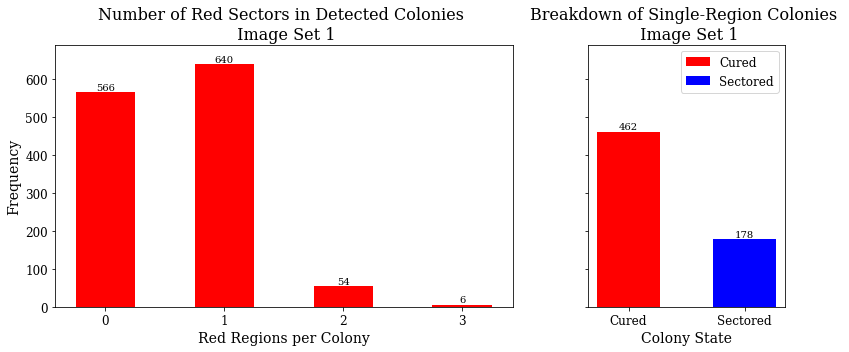

In [ ]:
def addlabels_centered(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i, y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=10)

max_sector_counts = np.max(colony_data['Pred # Sectors']) # max number of sectors in any colony in the dataset
full_sector_counts_array = np.array(colony_data['Pred # Sectors'])

num_sector_frequency = []

for this_num_sector in range(0, max_sector_counts+1):
    num_sector_frequency.append(len(colony_data[colony_data['Pred # Sectors'] == this_num_sector]))

fig, ax = plt.subplots(1, 2, figsize=(12,5), sharey=True, gridspec_kw={'width_ratios': [70, 30]})

ax[0].hist(full_sector_counts_array, bins=np.arange(max_sector_counts + 2)- 0.5, color = 'red', rwidth=0.5)
# plt.rcParams['text.usetex'] = True
# plt.rcParams.update({
#     "text.usetex": True,
#     "font.family": "serif",
#     "font.serif": ["Palatino"],
# })
ax[0].set_title('Number of Red Sectors in Detected Colonies \n Image Set 1', fontfamily="serif", Fontsize=16)
ax[0].set_xlabel('Red Regions per Colony')
ax[0].set_ylabel('Frequency')
ax[0].set_xticks(range(max_sector_counts + 1))
#ax[0].yticks(fontsize=12)
#ax[0].title.set_fontsize(16)
ax[0].xaxis.label.set_fontsize(14)
ax[0].yaxis.label.set_fontsize(14)
ax[0].tick_params(axis='both', labelsize=12)

ax[0].set_ylim(bottom=0, top=np.max(np.array(num_sector_frequency))+50)

addlabels_centered(range(max_sector_counts + 1), num_sector_frequency, 10, 0)

single_sector_colonies = colony_data[colony_data['Pred # Sectors'] == 1]
cured_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == True]
sectored_colonies = single_sector_colonies[single_sector_colonies['(AC) Cured'] == False]

num_cured_colonies = len(cured_colonies)
num_sectored_colonies = len(sectored_colonies)

plot_labels = list([0, 1])

x = np.arange(len(plot_labels))  # the label locations
width = 0.35  # the width of the bars
#x - width/2

rects1 = ax[1].bar(0+(width/2), num_cured_colonies, width, label='Cured', color='red')
rects2 = ax[1].bar(1-(width/2), num_sectored_colonies, width, label='Sectored', color='blue')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax[1].set_title('Breakdown of Single-Region Colonies \n Image Set 1', fontfamily = "serif", Fontsize=16)
ax[1].set_xlabel('Colony State')
ax[1].xaxis.label.set_fontsize(14)
ax[1].yaxis.label.set_fontsize(14)
#ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
#ax[1].set_ylim(bottom=0, top=500)
ax[1].set_xticks([0+0.35/2,1-0.35/2])
ax[1].set_xticklabels(['Cured', 'Sectored'])
ax[1].tick_params(axis='both', labelsize=12)
#plt.yticks(fontsize=12)
ax[1].legend(loc='upper right', fontsize=12)
plt.text((0.35/2), num_cured_colonies+5, num_cured_colonies, ha = 'center', fontfamily = "serif", Fontsize=10)
plt.text(1-(0.35/2), num_sectored_colonies+5, num_sectored_colonies, ha = 'center', fontfamily = "serif", Fontsize=10)
#addlabels_true(plot_labels, np.array(num_cured_colonies))
#addlabels_pred(plot_labels, np.array(num_sectored_colonies))

#plt.bar_label(rects1, padding=3)
#plt.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

# ax[1].set_title('Status of Colonies with \n One Red Region', fontfamily="serif", Fontsize=16)
# ax[1].set_xlabel('Colony State')
# ax[1].set_xticklabels(range(max_sector_counts + 1))
# ax[1].xaxis.label.set_fontsize(14)
# ax[1].yaxis.label.set_fontsize(14)
# plt.show()

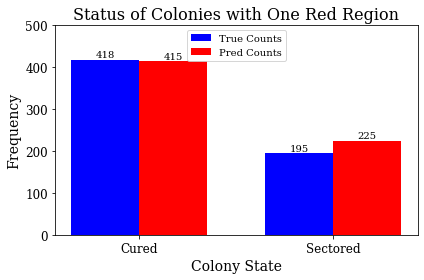

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:114: MatplotlibDeprecationWarning: Passing the minor parameter of set_xticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.


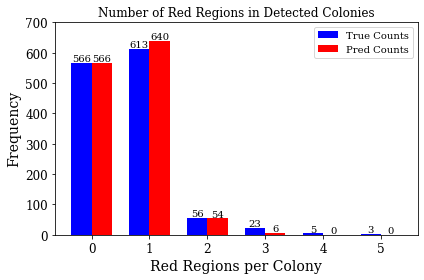

In [ ]:
def addlabels_true(x,y,fs):
    for i in range(len(x)):
        plt.text(i-(0.35/2), y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

def addlabels_pred(x,y,fs):
    for i in range(len(x)):
        plt.text(i+(0.35/2), y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

def addlabels_centered(x,y,fs):
    for i in range(len(x)):
        plt.text(i, y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=12)

plt.rcParams["font.family"] = "serif"
#if use_true_sector_counts == True:
# Gather the true data

# fig, ax = plt.subplots(1)
# plt.hist(np.array(colony_data['True # Sectors']), bins=np.arange(np.max(colony_data['Pred # Sectors']) + 2)- 0.5, color = 'blue', rwidth=0.5)
# # plt.rcParams['text.usetex'] = True
# # plt.rcParams.update({
# #     "text.usetex": True,
# #     "font.family": "serif",
# #     "font.serif": ["Palatino"],
# # })
# plt.title('True Number of Red Regions in Detected Colonies')
# plt.xlabel('Red Regions per Colony')
# plt.ylabel('Frequency')
# plt.xticks(range(max_sector_counts + 1), fontsize=12)
# ax.title.set_fontsize(16)
# ax.xaxis.label.set_fontsize(14)
# ax.yaxis.label.set_fontsize(14)
# plt.show()

# Now, from the data you have, look into the single red region colonies, and divide them between cured and sectored
true_region_colonies = colony_data[colony_data['True # Sectors'] == 1]
true_sector_colonies = true_region_colonies[true_region_colonies['Is Cured?'] == False]
true_cured_colonies = true_region_colonies[true_region_colonies['Is Cured?'] == True]

pred_region_colonies = colony_data[colony_data['Pred # Sectors'] == 1]
pred_sector_colonies = pred_region_colonies[pred_region_colonies['Is Cured?'] == False]
pred_cured_colonies = pred_region_colonies[pred_region_colonies['Is Cured?'] == True]

category_list = []
category_list.append('Cured')
category_list.append('Sectored')

# Use the template
true_single_frequency = list([len(true_cured_colonies), len(true_sector_colonies)])
pred_single_frequency = list([len(pred_cured_colonies), len(pred_sector_colonies)])

x = np.arange(len(category_list))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
#x - width/2
ax.set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency)+50)
rects1 = ax.bar(x - width/2, true_single_frequency, width, label='True Counts', color='blue')
rects2 = ax.bar(x + width/2, pred_single_frequency, width, label='Pred Counts', color='red')

ax.set_xlabel('Colony State')
ax.set_ylabel('Frequency')
ax.set_title('Status of Colonies with One Red Region', fontfamily="serif", Fontsize=16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
ax.set_ylim(bottom=0, top=500)
ax.set_xticks(np.arange(0, 2, step=1))
ax.set_xticklabels(category_list)
ax.tick_params(axis='both', labelsize=12)
ax.legend(loc='upper center')

addlabels_true(category_list, true_single_frequency, 10)
addlabels_pred(category_list, pred_single_frequency, 10)

fig.tight_layout()
plt.show()

    # fig, ax = plt.subplots(1)
    # plt.bar(category_list, list([len(single_cured_colonies), len(single_sector_colonies)]))
    # plt.title('Status of Colonies with One Red Region')
    # plt.ylabel('Frequency')
    # ax.title.set_fontsize(16)
    # ax.xaxis.label.set_fontsize(14)
    # ax.yaxis.label.set_fontsize(14)
    # plt.show()

# Using the template code
labels = list(range(max(colony_data['True # Sectors']) + 1))
true_counts = np.array(colony_data['True # Sectors'])
pred_counts = np.array(colony_data['Pred # Sectors'])

true_frequencies = []
pred_frequencies = []
for this_num_sectors in labels:
    true_frequencies.append(len(colony_data[colony_data['True # Sectors'] == this_num_sectors]))
    pred_frequencies.append(len(colony_data[colony_data['Pred # Sectors'] == this_num_sectors]))

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
#x - width/2

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, true_frequencies, width, label='True Counts', color='blue')
rects2 = ax.bar(x + width/2, pred_frequencies, width, label='Pred Counts', color='red')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Red Regions per Colony')
ax.set_ylabel('Frequency')
ax.set_title('Number of Red Regions in Detected Colonies')
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
#ax.set_ylim(bottom=0, top=max(true_frequencies + pred_frequencies)+20)
ax.set_ylim(bottom=0, top=700)

ax.set_xticks(x, labels)
ax.tick_params(axis='both', labelsize=12)
#ax.xticks.set_fontsize(12)
ax.legend()

# calling the function to add value labels
addlabels_true(labels, true_frequencies, 10)
addlabels_pred(labels, pred_frequencies, 10)

#plt.bar_label(rects1, padding=3)
#plt.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

    # # Plate by plate plots
    # for this_plate_name in all_plate_names:
    #     this_plate_stem = os.path.splitext(this_plate_name)[0]
    #     this_image_table = colony_data[colony_data["Plate Name"] == this_plate_name]

    #     these_sector_counts_array = np.array(this_image_table['Pred # Sectors'])
    #     these_sector_sizes_array = np.array(this_image_table['Red Area (Seg)'])
    #     these_colony_sizes_array = np.array(this_image_table['Colony Area (Seg)'])
    #     these_purity_scores_array = np.array(this_image_table['Avg Sector Score'])
    #     these_sector_scores_array = these_purity_scores_array[these_purity_scores_array > 0]

    #     # fig, ax = plt.subplots(1)
    #     # plt.hist(np.array(this_image_table['True # Sectors']), bins=np.arange(np.max(this_image_table['True # Sectors']) + 2) - 0.5, color = 'blue', rwidth=0.5)
    #     # # plt.rcParams['text.usetex'] = True
    #     # # plt.rcParams.update({
    #     # #     "text.usetex": True,
    #     # #     "font.family": "serif",
    #     # #     "font.serif": ["Palatino"],
    #     # # })
    #     # plt.title('True Number of Red Regions in Detected Colonies (' + str(this_plate_stem) + ')')
    #     # plt.xlabel('Red Regions per Colony')
    #     # plt.ylabel('Frequency')
    #     # plt.xticks(range(np.max(colony_data['True # Sectors']) + 1), fontsize=12)
    #     # ax.title.set_fontsize(16)
    #     # ax.xaxis.label.set_fontsize(14)
    #     # ax.yaxis.label.set_fontsize(14)
    #     # plt.show()

    #     # Now, from the data you have, look into the single red region colonies, and divide them between cured and sectored
    #     true_single_region_colonies = this_image_table[this_image_table['True # Sectors'] == 1]
    #     true_single_sector_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == False]
    #     true_single_cured_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == True]

    #     pred_single_region_colonies = this_image_table[this_image_table['Pred # Sectors'] == 1]
    #     pred_single_sector_colonies = pred_single_region_colonies[pred_single_region_colonies['Is Cured?'] == False]
    #     pred_single_cured_colonies = pred_single_region_colonies[pred_single_region_colonies['Is Cured?'] == True]

    #     category_list = []
    #     category_list.append('Cured')
    #     category_list.append('Sectored')

    #     print(category_list)

    #     # Use the template
    #     true_single_frequency = list([len(true_single_cured_colonies), len(true_single_sector_colonies)])
    #     pred_single_frequency = list([len(pred_single_cured_colonies), len(pred_single_sector_colonies)])

    #     x = np.arange(len(category_list))  # the label locations
    #     width = 0.35  # the width of the bars

    #     fig, ax = plt.subplots()
    #     #x - width/2
    #     ax.set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency)+20)
    #     rects1 = ax.bar(x - width/2, true_single_frequency, width, label='True Counts', color='blue')
    #     rects2 = ax.bar(x + width/2, pred_single_frequency, width, label='Pred Counts', color='red')
        
    #     print(true_single_frequency)
    #     print(pred_single_frequency)

    #     ax.set_ylabel('Frequency')
    #     ax.set_title('Status of Colonies with One Red Region (' + str(this_plate_stem) + ')', fontfamily="sans-serif")
    #     ax.xaxis.label.set_fontsize(14)
    #     ax.yaxis.label.set_fontsize(14)
    #     ax.set_xticks(np.arange(0, 2, step=1))
    #     ax.set_xticklabels(category_list)
    #     ax.legend(loc='upper center')

    #     addlabels_true(category_list, true_single_frequency)
    #     addlabels_pred(category_list, pred_single_frequency)

    #     fig.tight_layout()
    #     plt.show()
    #     #raise NameError('Done')

    #     # calling the function to add value labels
        

    #     # fig, ax = plt.subplots(1)

    #     # plt.bar(category_list, list([len(single_cured_colonies), len(single_sector_colonies)]))
    #     # plt.title('Status of Colonies with One Red Region (' + str(this_plate_stem) + ')')
    #     # plt.ylabel('Frequency')
    #     # ax.title.set_fontsize(16)
    #     # ax.xaxis.label.set_fontsize(14)
    #     # ax.yaxis.label.set_fontsize(14)
    #     # plt.show()

    #     # Using the template code
    #     labels = list(range(max(colony_data['True # Sectors']) + 1))
    #     true_counts = np.array(colony_data['True # Sectors'])
    #     pred_counts = np.array(colony_data['Pred # Sectors'])

    #     true_frequencies = []
    #     pred_frequencies = []
    #     for this_num_sectors in labels:
    #         true_frequencies.append(len(this_image_table[this_image_table['True # Sectors'] == this_num_sectors]))
    #         pred_frequencies.append(len(this_image_table[this_image_table['Pred # Sectors'] == this_num_sectors]))

    #     x = np.arange(len(labels))  # the label locations
    #     width = 0.35  # the width of the bars

    #     fig, ax = plt.subplots()
    #     rects1 = ax.bar(x - width/2, true_frequencies, width, label='True Counts', color='blue')
    #     rects2 = ax.bar(x + width/2, pred_frequencies, width, label='Pred Counts', color='red')

    #     # Add some text for labels, title and custom x-axis tick labels, etc.
    #     ax.set_xlabel('Red Regions per Colony')
    #     ax.set_ylabel('Frequency')
    #     ax.set_title('Number of Red Regions in Detected Colonies (' + str(this_plate_stem) + ')')
    #     ax.set_ylim(bottom=0, top=max(true_frequencies + pred_frequencies)+20)
    #     ax.xaxis.label.set_fontsize(14)
    #     ax.yaxis.label.set_fontsize(14)
    #     ax.set_xticks(x, labels)
    #     ax.legend()

    #     # calling the function to add value labels on top of the bars
    #     addlabels_true(labels, true_frequencies)
    #     addlabels_pred(labels, pred_frequencies)

    #     #plt.bar_label(rects1, padding=3)
    #     #plt.bar_label(rects2, padding=3)

    #     fig.tight_layout()

    #     plt.show()

KeyError: ignored

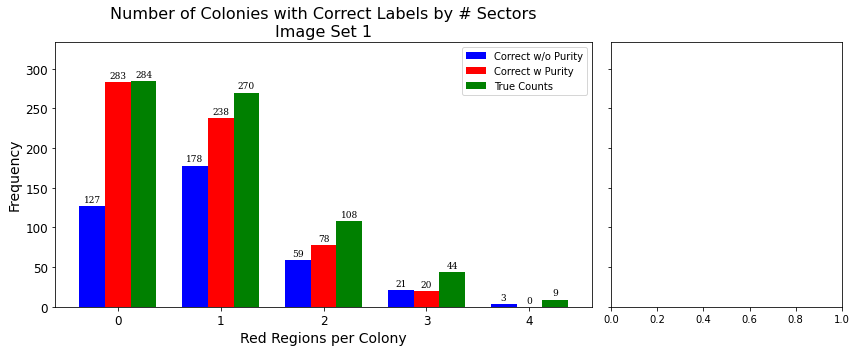

In [ ]:
def addlabels_initial_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i-(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

def addlabels_prediction_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i, y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

def addlabels_truemarks_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i+(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

max_initial = np.max(colony_data['Initial # Regions'])
max_pred = np.max(colony_data['Pred # Sectors'])
max_all = np.max([max_initial, max_pred])
max_true = np.max(colony_data['True # Sectors'])
diff_count_before = np.abs(colony_data['Initial # Regions'] - colony_data['True # Sectors'])
diff_count_after = np.abs(colony_data['Pred # Sectors'] - colony_data['True # Sectors'])

initial_correct_counts = []
post_correct_counts = []
true_correct_counts = []
all_counts = []

for this_num_sectors in range(0,max_true+1):
    initial_sector_counting_data = colony_data[colony_data['Initial # Regions'] == this_num_sectors]
    #post_sector_counting_data = colony_data[colony_data['Pred # Sectors'] == this_num_sectors]
    colonies_with_num_sectors = colony_data[colony_data['True # Sectors'] == this_num_sectors]
    total_colonies = len(colonies_with_num_sectors[['True # Sectors']])

    initial_correct_colonies = np.abs(colonies_with_num_sectors['True # Sectors'] - colonies_with_num_sectors['Initial # Regions'])
    initial_num_correct = len(initial_correct_colonies[initial_correct_colonies == 0])
    initial_correct_counts.append(initial_num_correct)
    true_correct_counts.append(len(colonies_with_num_sectors))
    #raise NameError('Done')
    #initial_matching_colonies = initial_correct_colonies[i]

    correct_colonies = colonies_with_num_sectors[colonies_with_num_sectors['Correct # Sectors?'] == True]
    total_correct_colonies = len(correct_colonies[['Correct # Sectors?']])
    post_correct_counts.append(total_correct_colonies)
    all_counts.append(total_colonies)

x = np.arange(len(all_counts))

width = 0.25  # the width of the bars

fig, ax = plt.subplots(1,2, figsize=(12,5), sharey=True, gridspec_kw={'width_ratios': [70, 30]})
#x - width/2
ax[0].set_ylim(bottom=0, top=max(initial_correct_counts + post_correct_counts + all_counts)+50)
rects1 = ax[0].bar(x - width, initial_correct_counts, width, label='Correct w/o Purity', color='blue')
rects2 = ax[0].bar(x, post_correct_counts, width, label='Correct w Purity', color='red')
#rects2 = ax.bar(x + width/2, all_counts, width, label='All Colonies', color='red')
rects3 = ax[0].bar(x + width, true_correct_counts, width, label='True Counts', color='green')

#print(true_single_frequency)
#print(pred_single_frequency)

ax[0].set_xlabel('Red Regions per Colony')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Number of Colonies with Correct Labels by # Sectors\nImage Set 1', Fontsize=16)
ax[0].xaxis.label.set_fontsize(14)
ax[0].yaxis.label.set_fontsize(14)
ax[0].set_xticks(np.arange(0, max_true+1, step=1))
ax[0].set_xticklabels(np.arange(0, max_true+1, step=1))
ax[0].tick_params(axis='both', labelsize=12)
ax[0].legend(loc='upper right')

addlabels_initial_ax(x, initial_correct_counts, 9, 0)
addlabels_prediction_ax(x, post_correct_counts, 9, 0)
#addlabels_pred(x, all_counts, 10)
addlabels_truemarks_ax(x, true_correct_counts, 9, 0)

fig.tight_layout()
#plt.show()

true_single_region_colonies = colony_data[colony_data['True # Sectors'] == 1]
# From this set, divide them into cured vs sectored
true_cured_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == True]
true_sectored_colonies = true_single_region_colonies[true_single_region_colonies['Is Cured?'] == False]
# Now count them
num_true_single_region_colonies = len(true_single_region_colonies)
num_true_cured_colonies = len(true_cured_colonies)
num_true_sectored_colonies = len(true_sectored_colonies)

# Next, check if these colonies also have one predicted red region before the pipeline
single_region_colonies_before = true_single_region_colonies['Initial # Regions'] == 1
# Then, check if these colonies also have one predicted red region after the pipeline
single_region_colonies_after = true_single_region_colonies['Pred # Sectors'] == 1
# Finally, check if these colonies are cured
single_cured_colonies_before = (single_region_colonies_before)*(true_single_region_colonies['Is Cured?'] == True)
single_cured_colonies_after = (single_region_colonies_after)*(true_single_region_colonies['Is Cured?'] == True)
# The rest must be sectored
single_sectored_colonies_before = (single_region_colonies_before)*(true_single_region_colonies['Is Cured?'] == False)
single_sectored_colonies_after = (single_region_colonies_after)*(true_single_region_colonies['Is Cured?'] == False)

# Now, use the data to make a plot showing sectored vs cured before and after the pipeline with the true counts on the side

category_list = []
category_list.append('Cured')
category_list.append('Sectored')

true_single_frequency = list([len(true_cured_colonies), len(true_sector_colonies)])

pred_single_frequency_before = list([np.sum(single_cured_colonies_before), np.sum(single_sectored_colonies_before)])
pred_single_frequency_after = list([np.sum(single_cured_colonies_after), np.sum(single_sectored_colonies_after)])

x = np.arange(len(category_list))  # the label locations
width = 0.25  # the width of the bars

#fig, ax = plt.subplots(figsize=(5,5))
#x - width/2
#ax[1].set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency_before + pred_single_frequency_after)+50)
rects1 = ax[1].bar(x - width, pred_single_frequency_before, width, label='Correct w/o Purity', color='blue')
rects2 = ax[1].bar(x, pred_single_frequency_after, width, label='Correct w Purity', color='red')
rects3 = ax[1].bar(x + width, true_single_frequency, width, label='True Counts', color='green')

ax[1].set_xlabel('Colony State')
#ax[1].set_ylabel('Frequency')
ax[1].set_title('Correct Single-Region Colonies\nImage Set 1', Fontsize=16)
ax[1].xaxis.label.set_fontsize(14)
ax[1].yaxis.label.set_fontsize(14)
ax[1].set_xticks(np.arange(0, 2, step=1))
ax[1].set_xticklabels(category_list, fontfamily="serif", Fontsize=12)
#ax[1].set_ylim([0,500])
ax[1].tick_params(axis='both', labelsize=12)
ax[1].legend(loc='upper right')

addlabels_initial_ax(x, pred_single_frequency_before, 9, 1)
addlabels_prediction_ax(x, pred_single_frequency_after, 9, 1)
#addlabels_pred(x, all_counts, 10)
addlabels_truemarks_ax(x, true_single_frequency, 9, 1)

fig.tight_layout()
plt.show()

# Plots Involving True Data 3

Number of quantifiable colonies: 961


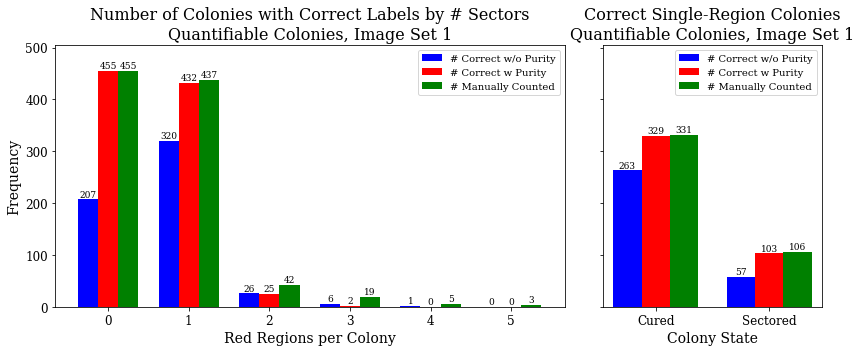

In [ ]:
matplotlib.rcParams['font.family'] = 'serif'

def addlabels_initial_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i-(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

def addlabels_prediction_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i, y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

def addlabels_truemarks_ax(x,y,fs, this_axis):
    for i in range(len(x)):
        ax[this_axis].text(i+(0.25), y[i]+5, y[i], ha = 'center', fontfamily="serif", Fontsize=fs)

quantifiable_colony_data = colony_data[colony_data['Quantifiable'] == True]
print('Number of quantifiable colonies:', str(len(quantifiable_colony_data)))

max_initial = np.max(quantifiable_colony_data['Initial # Regions'])
max_pred = np.max(quantifiable_colony_data['Pred # Sectors'])
max_all = np.max([max_initial, max_pred])
max_true = np.max(quantifiable_colony_data['True # Sectors'])
diff_count_before = np.abs(quantifiable_colony_data['Initial # Regions'] - quantifiable_colony_data['True # Sectors'])
diff_count_after = np.abs(quantifiable_colony_data['Pred # Sectors'] - quantifiable_colony_data['True # Sectors'])

initial_correct_counts = []
post_correct_counts = []
true_correct_counts = []
all_counts = []

for this_num_sectors in range(0,max_true+1):
    initial_sector_counting_data = quantifiable_colony_data[quantifiable_colony_data['Initial # Regions'] == this_num_sectors]
    #post_sector_counting_data = quantifiable_colony_data[quantifiable_colony_data['Pred # Sectors'] == this_num_sectors]
    colonies_with_num_sectors = quantifiable_colony_data[quantifiable_colony_data['True # Sectors'] == this_num_sectors]
    total_colonies = len(colonies_with_num_sectors[['True # Sectors']])

    initial_correct_colonies = np.abs(colonies_with_num_sectors['True # Sectors'] - colonies_with_num_sectors['Initial # Regions'])
    initial_num_correct = len(initial_correct_colonies[initial_correct_colonies == 0])
    initial_correct_counts.append(initial_num_correct)
    true_correct_counts.append(len(colonies_with_num_sectors))
    #raise NameError('Done')
    #initial_matching_colonies = initial_correct_colonies[i]

    correct_colonies = colonies_with_num_sectors[colonies_with_num_sectors['Correct # Sectors?'] == True]
    total_correct_colonies = len(correct_colonies[['Correct # Sectors?']])
    post_correct_counts.append(total_correct_colonies)
    all_counts.append(total_colonies)

x = np.arange(len(all_counts))

width = 0.25  # the width of the bars

fig, ax = plt.subplots(1,2, figsize=(12,5), sharey=True, gridspec_kw={'width_ratios': [70, 30]})
#x - width/2
ax[0].set_ylim(bottom=0, top=max(initial_correct_counts + post_correct_counts + all_counts)+50)
rects1 = ax[0].bar(x - width, initial_correct_counts, width, label='# Correct w/o Purity', color='blue')
rects2 = ax[0].bar(x, post_correct_counts, width, label='# Correct w Purity', color='red')
#rects2 = ax.bar(x + width/2, all_counts, width, label='All Colonies', color='red')
rects3 = ax[0].bar(x + width, true_correct_counts, width, label='# Manually Counted', color='green')

#print(true_single_frequency)
#print(pred_single_frequency)

ax[0].set_xlabel('Red Regions per Colony')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Number of Colonies with Correct Labels by # Sectors\nQuantifiable Colonies, Image Set 1', Fontsize=16)
ax[0].xaxis.label.set_fontsize(14)
ax[0].yaxis.label.set_fontsize(14)
ax[0].set_xticks(np.arange(0, max_true+1, step=1))
ax[0].set_xticklabels(np.arange(0, max_true+1, step=1))
ax[0].tick_params(axis='both', labelsize=12)
ax[0].legend(loc='upper right')

addlabels_initial_ax(x, initial_correct_counts, 9, 0)
addlabels_prediction_ax(x, post_correct_counts, 9, 0)
#addlabels_pred(x, all_counts, 10)
addlabels_truemarks_ax(x, true_correct_counts, 9, 0)

fig.tight_layout()
#plt.show()

true_single_region_colonies = quantifiable_colony_data[quantifiable_colony_data['True # Sectors'] == 1]
# From this set, divide them into cured vs sectored
true_cured_colonies = true_single_region_colonies[true_single_region_colonies['Quantifiable Cured'] == True]
true_sectored_colonies = true_single_region_colonies[true_single_region_colonies['Quantifiable Sectored'] == True]
# Now count them
num_true_single_region_colonies = len(true_single_region_colonies)
num_true_cured_colonies = len(true_cured_colonies)
num_true_sectored_colonies = len(true_sectored_colonies)

# Next, check if these colonies also have one predicted red region before the pipeline
single_region_colonies_before = true_single_region_colonies['Initial # Regions'] == 1
# Then, check if these colonies also have one predicted red region after the pipeline
single_region_colonies_after = true_single_region_colonies['Pred # Sectors'] == 1
# Finally, check if these colonies are cured
single_cured_colonies_before = (single_region_colonies_before)*(true_single_region_colonies['Quantifiable Cured'] == True)
single_cured_colonies_after = (single_region_colonies_after)*(true_single_region_colonies['Quantifiable Cured'] == True)
# The rest must be sectored
single_sectored_colonies_before = (single_region_colonies_before)*(true_single_region_colonies['Quantifiable Sectored'] == True)
single_sectored_colonies_after = (single_region_colonies_after)*(true_single_region_colonies['Quantifiable Sectored'] == True)

# Now, use the data to make a plot showing sectored vs cured before and after the pipeline with the true counts on the side

category_list = []
category_list.append('Cured')
category_list.append('Sectored')

true_single_frequency = list([len(true_cured_colonies), len(true_sectored_colonies)])

pred_single_frequency_before = list([np.sum(single_cured_colonies_before), np.sum(single_sectored_colonies_before)])
pred_single_frequency_after = list([np.sum(single_cured_colonies_after), np.sum(single_sectored_colonies_after)])

x = np.arange(len(category_list))  # the label locations
width = 0.25  # the width of the bars

#fig, ax = plt.subplots(figsize=(5,5))
#x - width/2
#ax[1].set_ylim(bottom=0, top=max(true_single_frequency + pred_single_frequency_before + pred_single_frequency_after)+50)
rects1 = ax[1].bar(x - width, pred_single_frequency_before, width, label='# Correct w/o Purity', color='blue')
rects2 = ax[1].bar(x, pred_single_frequency_after, width, label='# Correct w Purity', color='red')
rects3 = ax[1].bar(x + width, true_single_frequency, width, label='# Manually Counted', color='green')

ax[1].set_xlabel('Colony State')
#ax[1].set_ylabel('Frequency')
ax[1].set_title('Correct Single-Region Colonies\nQuantifiable Colonies, Image Set 1', Fontsize=16)
ax[1].xaxis.label.set_fontsize(14)
ax[1].yaxis.label.set_fontsize(14)
ax[1].set_xticks(np.arange(0, 2, step=1))
ax[1].set_xticklabels(category_list, fontfamily="serif", Fontsize=12)
#ax[1].set_ylim([0,500])
ax[1].tick_params(axis='both', labelsize=12)
ax[1].legend(loc='upper right')

addlabels_initial_ax(x, pred_single_frequency_before, 9, 1)
addlabels_prediction_ax(x, pred_single_frequency_after, 9, 1)
#addlabels_pred(x, all_counts, 10)
addlabels_truemarks_ax(x, true_single_frequency, 9, 1)

fig.tight_layout()
plt.show()

## Confusion Matrices

# Plots from [PSI] labeled colonies

## Get the labels of quantifiable colonies

In [ ]:
colony_states_before = np.array(['UNFILLED' for i in range(0, len(colony_data))])
colony_states_after = np.array(['UNFILLED' for i in range(0, len(colony_data))])
colony_states_true = np.array(['UNFILLED' for i in range(0, len(colony_data))])
#colony_states_set = set(colony_states)
#print(colony_states_set)

max_sector_count_before = max(colony_data['Initial # Regions'])
max_sector_count_after = max(colony_data['Pred # Sectors'])
max_sector_count_true = max(colony_data['True # Sectors'])

max_sector_count_all = max([max_sector_count_before, max_sector_count_after, max_sector_count_true])

# [PSI+]: Get all colonies with no red regions

colony_states_before[(colony_data['(BC) Stable'] == True)] = '[PSI+]'
colony_states_after[(colony_data['(AC) Stable'] == True)] = '[PSI+]'
colony_states_true[(colony_data['Is Stable?'] == True)] = '[PSI+]'

# [psi-]: Get all quantifiable colonies with no white regions

colony_states_before[(colony_data['(BC) Cured'] == True)] = '[psi-]'
colony_states_after[(colony_data['(AC) Cured'] == True)] = '[psi-]'
colony_states_true[(colony_data['Is Cured?'] == True)] = '[psi-]'

# Sx: Get all quantifiable colonies with at least 1 white region and exactly x red regions 

for num_regions in range(1, max_sector_count_all+1):
    colony_states_before[(colony_data['(BC) Cured'] == False) & (colony_data['(BC) Stable'] == False) & (colony_data['Initial # Regions'] == num_regions)] = str('S' + str(num_regions))
    colony_states_after[(colony_data['(AC) Cured'] == False) & (colony_data['(AC) Stable'] == False) & (colony_data['Pred # Sectors'] == num_regions)] = str('S' + str(num_regions))
    colony_states_true[(colony_data['Is Cured?'] == False) & (colony_data['Is Stable?'] == False) & (colony_data['True # Sectors'] == num_regions).astype(bool)] = str('S' + str(num_regions))

#print(np.unique(colony_states_before))
#print(np.unique(colony_states_after))
#print(np.unique(colony_states_true))

unmarked_locations = np.where(colony_states_true == 'UNFILLED')

# Make corrections to the table for unfilled locations


# Display any colony locations what are marked as UNFILLED

colony_row = colony_data.iloc[unmarked_locations]
#print(colony_row)
#print(colony_row.index)

#print(colony_states_before)

# If every location has been filled, then add these to the merged table
colony_data['Label Before'] = colony_states_before
colony_data['Label After'] = colony_states_after
colony_data['Label True'] = colony_states_true

#print(quantifiable_colony_data['Label Before'])
# counter = 0

# for ind in colony_row.index:
#     colony_number = colony_row['Colony Number'].iloc[counter]
#     plate_name = colony_row['Plate Name'].iloc[counter]
#     set_number = colony_row['Set'].iloc[counter]

#     #if counter == 0:
#     #    merged_table['Quantifiable Stable'] = 

#     # Get image
#     if set_number == 2:
#         image_to_display = read_image(sector_project_folder + '/Real Images/Wes Plates/Set 2 Prepro/' + plate_name)*255
#     image_to_display = cv2.rectangle(image_to_display, (colony_row['Side Left'].iloc[counter], colony_row['Side Top'].iloc[counter]), (colony_row['Side Right'].iloc[counter], colony_row['Side Bottom'].iloc[counter]), (255, 0, 0), 2)
#     #cv2_imshow(image_to_display)

## Use the labels defined and plot the aggregated predictions

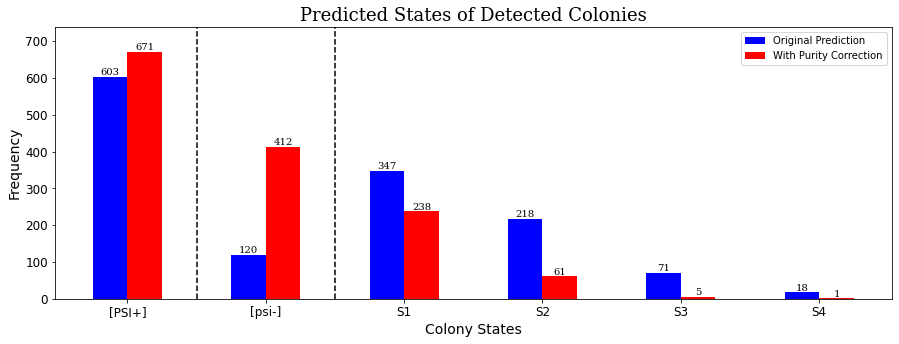

In [ ]:
post_counts_before = []
post_counts_after = []

plot_labels = ['[PSI+]', '[psi-]']

# get the [PSI+] colonies
white_colony_data_before = colony_data[colony_data['Label Before'] == '[PSI+]']
white_colony_data_after = colony_data[colony_data['Label After'] == '[PSI+]']

post_counts_before.append(len(white_colony_data_before))
post_counts_after.append(len(white_colony_data_after))

# get the [psi+] colonies
red_colony_data_before = colony_data[colony_data['Label Before'] == '[psi-]']
red_colony_data_after = colony_data[colony_data['Label After'] == '[psi-]']

post_counts_before.append(len(red_colony_data_before))
post_counts_after.append(len(red_colony_data_after))

# get the sectored colonies
max_sector_counts = np.nanmax( [ np.nanmax(colony_data['Pred # Sectors']), np.nanmax(colony_data['Pred # Sectors']), np.nanmax(colony_data['Pred # Sectors']) ] ).astype(int)
for j in range(1, max_sector_counts+1):
    sector_colony_data_before = colony_data[colony_data['Label Before'] == 'S' + str(j)]
    sector_colony_data_after = colony_data[colony_data['Label After'] == 'S' + str(j)]

    post_counts_before.append(len(sector_colony_data_before))
    post_counts_after.append(len(sector_colony_data_after))

    plot_labels.append('S'+str(j))

x = np.arange(np.max([3, max_sector_counts]) + 2)
width = 0.25

fig, ax = plt.subplots(figsize=(15,5), sharey=True)

rects1 = ax.bar(x-width/2, post_counts_before, width, color='blue', label='Original Prediction')
rects2 = ax.bar(x+width/2, post_counts_after, width, color='red', label='With Purity Correction')
#rects2 = ax.bar(x + width/2, all_counts, width, label='All Colonies', color='red')

ax.set_ylim(bottom=0, top=(1.1*max(post_counts_before + post_counts_after)))

ax.set_title('Predicted States of Detected Colonies', fontfamily="serif", fontsize=18)

ax.set_xlabel('Colony States', fontsize=14)
ax.set_xlabel('Colony States', fontsize=14)
ax.set_xlabel('Colony States', fontsize=14)

ax.set_ylabel('Frequency', fontsize=14)
#ax[1].set_ylabel('Frequency', fontsize=14)
#ax[2].set_ylabel('Frequency', fontsize=14)

ax.axvline(x = 0.5, color = 'k', linestyle = '--')
ax.axvline(x = 1.5, color = 'k', linestyle = '--')

ax.set_xticks(x)


ax.set_xticklabels(plot_labels)

ax.tick_params(axis="both", labelsize=12)
ax.legend()

# Get the counts directly


addlabels_centered(x-width/2, post_counts_before, 10)
addlabels_centered(x+width/2, post_counts_after, 10)

# plt.xlabel('Red Sectors per Colony')
# plt.ylabel('Frequency')
# plt.xticks(range(max_sector_counts + 1), fontsize=12)
# plt.yticks(fontsize=12)
# ax.title.set_fontsize(16)
# ax.xaxis.label.set_fontsize(14)
# ax.yaxis.label.set_fontsize(14)
plt.show()

# Write colony images to file using the subfolders

In [ ]:
# Code to print a pdf of the croppings
# 1. Sort data in table based on plate name, colony number and other elements.
# 2. Iterate through each row of the sorted table to get colony imformation
# 3. Add inforation to pdf document.
# 4. Repear for each colony and plate.
# 5. Output pdf.

# Do the same as above, but group based on the number of sectors detected



for this_plate in all_plate_names:

    # this_plate is the key to the correspnding subfolder in each annotation class
    # Initialize PDF writer
    pdf = FPDF()
    pdf = FPDF(unit = "pt", format = [850,1100])
    pdf.set_font('Arial', 'B', 16)
    target_height = float(40)
    left_margin = 10
    right_margin = 840
    bottom_margin = 1050
    number_spacing = 7
    uniform_spacing = 640


    row_number = 1 # initial row index
    col_position = 10 # initial column position
    col_margin = 40
    this_plate_stem = os.path.splitext(this_plate)[0]

    # all_cropped_images = sorted(glob.glob(output_crops_folder + '/Colony Cuts/' + this_plate_stem + '_' + '*.jpg'))
    # all_cropped_circles = sorted(glob.glob(output_crops_folder + '/Colony Circles/' + this_plate_stem + '_' + '*.jpg'))
    # all_cropped_masks = sorted(glob.glob(output_crops_folder + '/Colony Segs/' + this_plate_stem + '_' + '*.png'))

    # all_cropped_initial_regions = sorted(glob.glob(output_crops_folder + '/Colony Initial Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_initial_boundaries = sorted(glob.glob(output_crops_folder + '/Colony Initial Boundary/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_initial_bad_regions = sorted(glob.glob(output_crops_folder + '/Colony Initial Bad Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_initial_sector_bounds = sorted(glob.glob(output_crops_folder + '/Colony Initial Sector Bounds/' + this_plate_stem + '_' + '*.png'))

    # all_cropped_corrected_masks = sorted(glob.glob(output_crops_folder + '/Colony Corrected Segs/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_regions = sorted(glob.glob(output_crops_folder + '/Colony Corrected Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_boundaries = sorted(glob.glob(output_crops_folder + '/Colony Corrected Boundary/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_bad_regions = sorted(glob.glob(output_crops_folder + '/Colony Corrected Bad Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_sector_bounds = sorted(glob.glob(output_crops_folder + '/Colony Corrected Sector Bounds/' + this_plate_stem + '_' + '*.png'))

    # all_cropped_sectors = sorted(glob.glob(output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_sector_comps = sorted(glob.glob(output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_' + '*.png'))

    #print(all_cropped_images)
    #print(all_cropped_circles)
    #print(all_cropped_masks)
    #print(all_cropped_sectors)
    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate]
    #this_plate_data.set_index('Colony Number', inplace=True)
    max_num_sectors_in_plate = int(max(this_plate_data['Pred # Sectors']))
    pdf.add_page()

    pdf.text(col_position, target_height*row_number, 'Colonies detected in Plate ' + str(this_plate) + '.  ' + str(len(this_plate_data)) + ' colonies were detected.')
    pdf.text(col_position, target_height*row_number + 20, 'Group 1: Raw image data')
    pdf.text(col_position, target_height*row_number + 40, 'Group 2: Raw segmentation of whole colony and boundary')
    pdf.text(col_position, target_height*row_number + 60, 'Group 3: Regional breakdown and analysis before boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 80, 'Group 4: Segmentation with corrected boundary')
    pdf.text(col_position, target_height*row_number + 100, 'Group 5: Regional breakdown and analysis after boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 120, 'Group 6: Breakdown of red sectored regions and pixels after correction')

    row_number = row_number + 2

    for this_num_sectors in range(0,max_num_sectors_in_plate + 1):
        row_number = row_number + 1
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = this_plate_data[this_plate_data['Pred # Sectors'] == this_num_sectors]
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index()
        #print(this_plate_sector_data)
        if this_num_sectors == 1:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
        else:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['Avg Sector Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            #print('Colony ' + str(int(row['Colony Number'])))
            
            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            # cover_region = PIL.Image.open(cover_region_name, mode='r')
            # cover_bad_region = PIL.Image.open(cover_bad_region_name, mode='r')
            # cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            # cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')
            # cover_sector_bounds = PIL.Image.open(cover_sector_bounds_name, mode='r')
            #print('This Image: ')
            #print(pathlib.Path(all_cropped_images[index]).stem)
            #print(pathlib.Path(all_cropped_masks[index]).stem)
            #print(pathlib.Path(all_cropped_sectors[index]).stem)
            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            # current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            # current_col_position = current_col_position + scaled_width_ma

            # current_col_position = current_col_position + 10 # A margin to separate subsets of visualizations

            # pdf.image(cover_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            # current_col_position = current_col_position + scaled_width_annot
            
            # pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            # current_col_position = current_col_position + scaled_width_ma
            
            # pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            # current_col_position = current_col_position + scaled_width_ma
            #col_position = col_position + scaled_width_ma
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Avg Sc: ' + str(round(row['Avg Sector Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin

    # Write pdf file with output of colony data generated for this plate.
    pdf.output(output_details_folder + '/' + this_plate_stem + '.pdf', "F")
    print('Colonies from ' + this_plate_stem + ' printed.')



Colonies from Plate_1 printed.
Colonies from Plate_2 printed.
Colonies from Plate_3 printed.
Colonies from Plate_4 printed.
Colonies from Plate_5 printed.


Merge all pdf output generated into one file

In [ ]:
# Merge all pdf files printed.  This will concatenate data from all plates.
all_files = sorted(glob.glob(output_details_folder + '/*.pdf'))
merger = PdfMerger()
for this_file in all_files:
    merger.append(PdfReader(open(this_file, 'rb')))

merger.write(main_folder + '/' + colony_chart_doc + '.pdf')

# Redo of the above, but colonies are divided based on quantifiability

In [ ]:
# Code to print a pdf of the croppings
# 1. Sort data in table based on plate name, colony number and other elements.
# 2. Iterate through each row of the sorted table to get colony imformation
# 3. Add inforation to pdf document.
# 4. Repeat for each colony and plate.
# 5. Output pdf.

# Do the same as above, but group based on the number of sectors detected
#colony_data = pd.read_csv(output_data_folder + '/colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.csv')
all_plate_names = colony_data['Plate Name'].unique()
all_sector_values = list(range(0, np.max(colony_data['Pred # Sectors'])+1))


for this_plate in all_plate_names:

    # this_plate is the key to the correspnding subfolder in each annotation class
    # Initialize PDF writer
    pdf = FPDF()
    pdf = FPDF(unit = "pt", format = [850,1100])
    pdf.set_font('Arial', 'B', 16)
    target_height = float(40)
    left_margin = 10
    right_margin = 840
    bottom_margin = 1050
    number_spacing = 7
    uniform_spacing = 640


    row_number = 1 # initial row index
    col_position = 10 # initial column position
    col_margin = 40
    this_plate_stem = os.path.splitext(this_plate)[0]

    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate]
    #this_plate_data.set_index('Colony Number', inplace=True)
    max_num_sectors_in_plate = int(max(this_plate_data['Pred # Sectors']))
    pdf.add_page()

    pdf.text(col_position, target_height*row_number, 'Colonies detected in Plate ' + str(this_plate) + '.  ' + str(len(this_plate_data)) + ' colonies were detected.')
    pdf.text(col_position, target_height*row_number + 20, 'Group 1: Raw image data')
    pdf.text(col_position, target_height*row_number + 40, 'Group 2: Raw segmentation of whole colony and boundary')
    pdf.text(col_position, target_height*row_number + 60, 'Group 3: Regional breakdown and analysis before boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 80, 'Group 4: Segmentation with corrected boundary')
    pdf.text(col_position, target_height*row_number + 100, 'Group 5: Regional breakdown and analysis after boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 120, 'Group 6: Breakdown of red sectored regions and pixels after correction')

    row_number = row_number + 4

    # Get subset of colonies that are both quantifiable and have good segmentations
    # For good segmentations, use colonies that satisfy conditions 1, 2, and 3

    quantifiable_colonies = this_plate_data['Quantifiable'] == True # get all quantifiable colonies
    non_quantifiable_colonies = this_plate_data['Quantifiable'] == False # get all non-quantifiable colonies
    good_segmentations = np.multiply(this_plate_data['1 Comp'] == True, this_plate_data['No Holes'] == True) # get all colonies that have good segmentations
    bad_segmentations = np.logical_or(this_plate_data['1 Comp'] == False, this_plate_data['No Holes'] == False) # get all colonies that have bad segmentations

    good_quantifiable_colonies = np.multiply(quantifiable_colonies, good_segmentations) # quantifiable colonies with good segmentations
    good_non_quantifiable_colonies = np.multiply(non_quantifiable_colonies, good_segmentations) # non-quantifable colonies with good segmentations
    bad_quantifiable_colonies = np.multiply(quantifiable_colonies, bad_segmentations) # quantfiable colonies with bad segmentaitons
    bad_non_quantifiable_colonies = np.multiply(non_quantifiable_colonies, bad_segmentations) # non-quantifable colonies with bad segmentations

    good_quantifiable_colony_data = this_plate_data.loc[good_quantifiable_colonies] # quantifiable colonies with good segmentations
    bad_quantifiable_colony_data = this_plate_data.loc[bad_quantifiable_colonies] # quantfiable colonies with bad segmentaitons
    good_non_quantifiable_colony_data = this_plate_data.loc[good_non_quantifiable_colonies] # non-quantifable colonies with good segmentations
    bad_non_quantifiable_colony_data = this_plate_data.loc[bad_non_quantifiable_colonies] # non-quantifable colonies with bad segmentations

    # First, look through through the colonies that are quantifiable and have good segmentations

    print('Getting quantifiable colonies with good segmentations')

    col_position = 10
    pdf.text(col_position, target_height*row_number, 'Good quantifiable colonies with good segmentations')
    pdf.text(col_position, target_height*row_number + 20, 'Number of quantifiable colonies with good segmentations: ' + str(len(good_quantifiable_colony_data)))

    for this_num_sectors in range(0,max_num_sectors_in_plate + 1):
        row_number = row_number + 2
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = good_quantifiable_colony_data[good_quantifiable_colony_data['Pred # Sectors'] == this_num_sectors]
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index() # reset index to interate
        #print(this_plate_sector_data)
        if this_num_sectors == 1:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
        else:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['(AC) Weighted Full Average Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            #print('Colony ' + str(int(row['Colony Number'])))
            
            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Purity: ' + str(round(row['(AC) Weighted Full Average Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin

    # Second, look through through the colonies that are non-quantifiable and have good segmentations

    row_number = row_number + 2
    if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index

    print('Getting non-quantifiable colonies with good segmentations')

    col_position = 10
    pdf.text(col_position, target_height*row_number, 'Non-quantifiable colonies with good segmentations')
    pdf.text(col_position, target_height*row_number + 20, 'Number of non-quantifiable colonies with good segmentations: ' + str(len(good_non_quantifiable_colony_data)))

    for this_num_sectors in range(0,max_num_sectors_in_plate + 1):
        row_number = row_number + 2
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = good_non_quantifiable_colony_data[good_non_quantifiable_colony_data['Pred # Sectors'] == this_num_sectors]
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index() # reset index to interate
        #print(this_plate_sector_data)
        if this_num_sectors == 1:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
        else:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['(AC) Weighted Full Average Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Purity: ' + str(round(row['(AC) Weighted Full Average Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin

    # Third, look through through the colonies that are quantifiable and have bad segmentations

    row_number = row_number + 2
    if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index

    print('Getting quantifiable colonies with bad segmentations')

    col_position = 10
    pdf.text(col_position, target_height*row_number, 'Quantifiable colonies with bad segmentations')
    pdf.text(col_position, target_height*row_number + 20, 'Number of quantifiable colonies with bad segmentations: ' + str(len(bad_quantifiable_colony_data)))

    for this_num_sectors in range(0,max_num_sectors_in_plate + 1):
        row_number = row_number + 2
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = bad_quantifiable_colony_data[bad_quantifiable_colony_data['Pred # Sectors'] == this_num_sectors]
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index() # reset index to interate
        #print(this_plate_sector_data)
        if this_num_sectors == 1:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
        else:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['(AC) Weighted Full Average Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Purity: ' + str(round(row['(AC) Weighted Full Average Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin

    # Fourth, look through through the colonies that are non-quantifiable and have bad segmentations

    row_number = row_number + 2
    if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index

    print('Getting non-quantifiable colonies with bad segmentations')

    col_position = 10
    pdf.text(col_position, target_height*row_number, 'Non-quantifiable colonies with bad segmentations')
    pdf.text(col_position, target_height*row_number + 20, 'Number of non-quantifiable colonies with bad segmentations: ' + str(len(bad_non_quantifiable_colony_data)))

    for this_num_sectors in range(0,max_num_sectors_in_plate + 1):
        row_number = row_number + 2
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = bad_non_quantifiable_colony_data[bad_non_quantifiable_colony_data['Pred # Sectors'] == this_num_sectors]
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index() # reset index to interate
        #print(this_plate_sector_data)
        if this_num_sectors == 1:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
        else:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['(AC) Weighted Full Average Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Purity: ' + str(round(row['(AC) Weighted Full Average Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin

    # Write pdf file with output of colony data generated for this plate.
    pdf.output(output_details_folder + '/' + this_plate_stem + '.pdf', "F")
    print('Colonies from ' + this_plate_stem + ' printed.')
        



KeyError: ignored

In [ ]:
# Merge all pdf files printed.  This will concatenate data from all plates.
all_files = sorted(glob.glob(output_details_folder + '/*.pdf'))
merger = PdfFileMerger()
for this_file in all_files:
    merger.append(PdfFileReader(open(this_file, 'rb')))

merger.write(main_folder + '/' + colony_chart_doc + '.pdf')

# Write files containing only samples from each plate

In [ ]:
# Create folder for sampling
output_samples_folder = test_output_folder + '/PDF Samples'
if os.path.exists(output_samples_folder) == False:
    os.makedirs(output_samples_folder)

num_samples_per_plate = 40

# Set random number seed to sample from the colonies detected
np.random.seed(seed=2)
# seed 1: done on 80 samples per plate (1/12/2023)
# seed 2: done on 40 samples per plate (1/17/2023)

In [ ]:
# Code to print a pdf of the croppings
# 1. Sort data in table based on plate name, colony number and other elements.
# 2. Iterate through each row of the sorted table to get colony imformation
# 3. Add inforation to pdf document.
# 4. Repear for each colony and plate.
# 5. Output pdf.

# Do the same as above, but group based on the number of sectors detected



for this_plate in all_plate_names:

    # this_plate is the key to the correspnding subfolder in each annotation class
    # Initialize PDF writer
    pdf = FPDF()
    pdf = FPDF(unit = "pt", format = [850,1100])
    pdf.set_font('Arial', 'B', 16)
    target_height = float(40)
    left_margin = 10
    right_margin = 840
    bottom_margin = 1050
    number_spacing = 7
    uniform_spacing = 640


    row_number = 1 # initial row index
    col_position = 10 # initial column position
    col_margin = 40
    this_plate_stem = os.path.splitext(this_plate)[0]
    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate]

    print('Now looking at: ' + str(this_plate))

    # Sample rows from the table
    num_rows_in_data = len(this_plate_data)
    colony_ids = sorted(np.random.choice(num_rows_in_data, num_samples_per_plate, replace=False))
    print('Sampled ' + str(len(colony_ids)) + ' colonies.')
    print(colony_ids)
    this_sampled_plate_data = this_plate_data.iloc[colony_ids]

    #this_plate_data.set_index('Colony Number', inplace=True)
    max_num_sectors_in_plate = int(max(this_sampled_plate_data['Pred # Sectors']))
    pdf.add_page()

    #pdf.text(col_position, target_height*row_number, 'Colonies detected in Plate ' + str(this_plate) + '.  ' + str(len(this_plate_data)) + ' colonies were detected.')
    pdf.text(col_position, target_height*row_number, str(len(this_sampled_plate_data)) + 'detected colonies sampled from Plate ' + str(this_plate) + '.')
    pdf.text(col_position, target_height*row_number + 20, 'Group 1: Raw image data')
    pdf.text(col_position, target_height*row_number + 40, 'Group 2: Raw segmentation of whole colony and boundary')
    pdf.text(col_position, target_height*row_number + 60, 'Group 3: Regional breakdown and analysis before boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 80, 'Group 4: Segmentation with corrected boundary')
    pdf.text(col_position, target_height*row_number + 100, 'Group 5: Regional breakdown and analysis after boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 120, 'Group 6: Breakdown of red sectored regions and pixels after correction')

    row_number = row_number + 2

    for this_num_sectors in range(0,max_num_sectors_in_plate + 1):
        row_number = row_number + 1
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = this_sampled_plate_data[this_sampled_plate_data['Pred # Sectors'] == this_num_sectors]
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index()
        #print(this_plate_sector_data)
        if this_num_sectors == 1:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
        else:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['Avg Sector Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            #print('Colony ' + str(int(row['Colony Number'])))
            
            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            # cover_region = PIL.Image.open(cover_region_name, mode='r')
            # cover_bad_region = PIL.Image.open(cover_bad_region_name, mode='r')
            # cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            # cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')
            # cover_sector_bounds = PIL.Image.open(cover_sector_bounds_name, mode='r')
            #print('This Image: ')
            #print(pathlib.Path(all_cropped_images[index]).stem)
            #print(pathlib.Path(all_cropped_masks[index]).stem)
            #print(pathlib.Path(all_cropped_sectors[index]).stem)
            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            # current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            # current_col_position = current_col_position + scaled_width_ma

            # current_col_position = current_col_position + 10 # A margin to separate subsets of visualizations

            # pdf.image(cover_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            # current_col_position = current_col_position + scaled_width_annot
            
            # pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            # current_col_position = current_col_position + scaled_width_ma
            
            # pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            # current_col_position = current_col_position + scaled_width_ma
            #col_position = col_position + scaled_width_ma
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Avg Sc: ' + str(round(row['Avg Sector Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin

    # Write pdf file with output of colony data generated for this plate.
    pdf.output(output_samples_folder + '/' + this_plate_stem + '.pdf', "F")
    print('Colonies from ' + this_plate_stem + ' printed.')



Now looking at: 1_1.tiff
Sampled 40 colonies.
[3, 7, 12, 13, 29, 30, 55, 66, 67, 68, 70, 89, 94, 98, 99, 118, 126, 127, 146, 147, 161, 163, 172, 179, 184, 194, 203, 209, 216, 217, 220, 223, 230, 234, 241, 258, 274, 281, 298, 314]
Colonies from 1_1 printed.
Now looking at: 1_10.tiff
Sampled 40 colonies.
[16, 19, 26, 34, 39, 42, 49, 55, 56, 61, 63, 67, 72, 84, 89, 99, 121, 123, 129, 130, 134, 141, 142, 158, 161, 163, 171, 172, 187, 204, 212, 213, 220, 226, 236, 237, 247, 248, 257, 261]
Colonies from 1_10 printed.
Now looking at: 1_11.tiff
Sampled 40 colonies.
[7, 15, 20, 37, 45, 96, 99, 100, 104, 105, 118, 121, 131, 138, 141, 145, 151, 152, 155, 161, 166, 170, 173, 180, 184, 201, 206, 209, 212, 227, 230, 231, 237, 253, 260, 264, 267, 271, 275, 287]
Colonies from 1_11 printed.
Now looking at: 1_2.tiff
Sampled 40 colonies.
[3, 5, 17, 19, 20, 24, 34, 42, 46, 61, 64, 76, 94, 102, 105, 115, 160, 162, 163, 165, 177, 179, 199, 212, 214, 215, 218, 231, 238, 240, 248, 255, 260, 264, 266, 279, 286

In [ ]:
# Merge all pdf files printed.  This will concatenate data from all plates.
all_files = sorted(glob.glob(output_samples_folder + '/*.pdf'))
merger = PdfMerger()
for this_file in all_files:
    merger.append(PdfReader(open(this_file, 'rb')))

merger.write(main_folder + '/' + colony_chart_doc + '.pdf')

# Write same file, except coloines are labeled as [PSI+], [psi-], or Sectored

In [ ]:
# Code to print a pdf of the croppings
# 1. Sort data in table based on plate name, colony number and other elements.
# 2. Iterate through each row of the sorted table to get colony imformation
# 3. Add inforation to pdf document.
# 4. Repear for each colony and plate.
# 5. Output pdf.

# Do the same as above, but group based on the number of sectors detected



for this_plate in all_plate_names:

    # this_plate is the key to the correspnding subfolder in each annotation class
    # Initialize PDF writer
    pdf = FPDF()
    pdf = FPDF(unit = "pt", format = [850,1100])
    pdf.set_font('Arial', 'B', 16)
    target_height = float(40)
    left_margin = 10
    right_margin = 840
    bottom_margin = 1050
    number_spacing = 7
    uniform_spacing = 640


    row_number = 1 # initial row index
    col_position = 10 # initial column position
    col_margin = 40
    this_plate_stem = os.path.splitext(this_plate)[0]

    # all_cropped_images = sorted(glob.glob(output_crops_folder + '/Colony Cuts/' + this_plate_stem + '_' + '*.jpg'))
    # all_cropped_circles = sorted(glob.glob(output_crops_folder + '/Colony Circles/' + this_plate_stem + '_' + '*.jpg'))
    # all_cropped_masks = sorted(glob.glob(output_crops_folder + '/Colony Segs/' + this_plate_stem + '_' + '*.png'))

    # all_cropped_initial_regions = sorted(glob.glob(output_crops_folder + '/Colony Initial Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_initial_boundaries = sorted(glob.glob(output_crops_folder + '/Colony Initial Boundary/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_initial_bad_regions = sorted(glob.glob(output_crops_folder + '/Colony Initial Bad Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_initial_sector_bounds = sorted(glob.glob(output_crops_folder + '/Colony Initial Sector Bounds/' + this_plate_stem + '_' + '*.png'))

    # all_cropped_corrected_masks = sorted(glob.glob(output_crops_folder + '/Colony Corrected Segs/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_regions = sorted(glob.glob(output_crops_folder + '/Colony Corrected Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_boundaries = sorted(glob.glob(output_crops_folder + '/Colony Corrected Boundary/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_bad_regions = sorted(glob.glob(output_crops_folder + '/Colony Corrected Bad Regions/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_corrected_sector_bounds = sorted(glob.glob(output_crops_folder + '/Colony Corrected Sector Bounds/' + this_plate_stem + '_' + '*.png'))

    # all_cropped_sectors = sorted(glob.glob(output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_' + '*.png'))
    # all_cropped_sector_comps = sorted(glob.glob(output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_' + '*.png'))

    #print(all_cropped_images)
    #print(all_cropped_circles)
    #print(all_cropped_masks)
    #print(all_cropped_sectors)
    this_plate_data = colony_data[colony_data['Plate Name'] == this_plate]
    #this_plate_data.set_index('Colony Number', inplace=True)
    max_num_sectors_in_plate = int(max(this_plate_data['Pred # Sectors']))
    pdf.add_page()

    pdf.text(col_position, target_height*row_number, 'Colonies detected in Plate ' + str(this_plate) + '.  ' + str(len(this_plate_data)) + ' colonies were detected.')
    pdf.text(col_position, target_height*row_number + 20, 'Group 1: Raw image data')
    pdf.text(col_position, target_height*row_number + 40, 'Group 2: Raw segmentation of whole colony and boundary')
    pdf.text(col_position, target_height*row_number + 60, 'Group 3: Regional breakdown and analysis before boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 80, 'Group 4: Segmentation with corrected boundary')
    pdf.text(col_position, target_height*row_number + 100, 'Group 5: Regional breakdown and analysis after boundary corrections were made')
    pdf.text(col_position, target_height*row_number + 120, 'Group 6: Breakdown of red sectored regions and pixels after correction')

    row_number = row_number + 2

    # Start by collecting all of the [PSI+] predictions
    for this_num_sectors in range(0,1):
        row_number = row_number + 1
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = this_plate_data[this_plate_data['Label After'] == '[PSI+]']
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index()
        #print(this_plate_sector_data)
        pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies labeled [PSI+]: ' + str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['(AC) Weighted Full Average Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            #print('Colony ' + str(int(row['Colony Number'])))
            
            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            # cover_region = PIL.Image.open(cover_region_name, mode='r')
            # cover_bad_region = PIL.Image.open(cover_bad_region_name, mode='r')
            # cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            # cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')
            # cover_sector_bounds = PIL.Image.open(cover_sector_bounds_name, mode='r')
            #print('This Image: ')
            #print(pathlib.Path(all_cropped_images[index]).stem)
            #print(pathlib.Path(all_cropped_masks[index]).stem)
            #print(pathlib.Path(all_cropped_sectors[index]).stem)
            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            # current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            # current_col_position = current_col_position + scaled_width_ma

            # current_col_position = current_col_position + 10 # A margin to separate subsets of visualizations

            # pdf.image(cover_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            # current_col_position = current_col_position + scaled_width_annot
            
            # pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            # current_col_position = current_col_position + scaled_width_ma
            
            # pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            # current_col_position = current_col_position + scaled_width_ma
            #col_position = col_position + scaled_width_ma
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Avg Sc: ' + str(round(row['(AC) Weighted Full Average Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin


    # Next, do the same thing for [psi-] predictions
    for this_num_sectors in range(0,1):
        row_number = row_number + 1
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = this_plate_data[this_plate_data['Label After'] == '[psi-]']
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index()
        #print(this_plate_sector_data)
        pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies labeled [psi-]: ' + str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['(AC) Weighted Full Average Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            #print('Colony ' + str(int(row['Colony Number'])))
            
            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            # cover_region = PIL.Image.open(cover_region_name, mode='r')
            # cover_bad_region = PIL.Image.open(cover_bad_region_name, mode='r')
            # cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            # cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')
            # cover_sector_bounds = PIL.Image.open(cover_sector_bounds_name, mode='r')
            #print('This Image: ')
            #print(pathlib.Path(all_cropped_images[index]).stem)
            #print(pathlib.Path(all_cropped_masks[index]).stem)
            #print(pathlib.Path(all_cropped_sectors[index]).stem)
            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            # current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            # current_col_position = current_col_position + scaled_width_ma

            # current_col_position = current_col_position + 10 # A margin to separate subsets of visualizations

            # pdf.image(cover_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            # current_col_position = current_col_position + scaled_width_annot
            
            # pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            # current_col_position = current_col_position + scaled_width_ma
            
            # pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            # current_col_position = current_col_position + scaled_width_ma
            #col_position = col_position + scaled_width_ma
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Avg Sc: ' + str(round(row['(AC) Weighted Full Average Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin

    # Now, do this for sectored colonies with any number of sectors
    for this_num_sectors in range(1, max_num_sectors_in_plate + 1):
        row_number = row_number + 1
        col_position = 10
        if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
            pdf.add_page()
            row_number = 1 # initial row index
        #print(this_plate_data)
        this_plate_sector_data = this_plate_data[this_plate_data['Label After'] == 'S'+str(this_num_sectors)]
        #print(this_plate_sector_data)
        this_plate_sector_data.reset_index()
        #print(this_plate_sector_data)
        if this_num_sectors == 1:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
        else:
            pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
        row_number = row_number + 1

        # Sort this subtable by sector scores in descending order
        sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['(AC) Weighted Full Average Score', 'Colony Number'], ascending=[False, True])
        sorted_plate_sector_data.reset_index()

        for index, row in sorted_plate_sector_data.iterrows():

            #print('Colony ' + str(int(row['Colony Number'])))
            
            cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

            cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
            cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
            cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            if use_expert_counts == True:
                cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

            # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
            # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

            cover_image = PIL.Image.open(cover_image_name, mode='r')
            cover_circle = PIL.Image.open(cover_circle_name, mode='r')
            cover_mask = PIL.Image.open(cover_mask_name, mode='r')

            cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
            cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
            cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
            cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

            cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
            cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
            cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
            cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

            cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

            if use_expert_counts == True:
                cover_counts = PIL.Image.open(cover_counts_name, mode='r')

            # cover_region = PIL.Image.open(cover_region_name, mode='r')
            # cover_bad_region = PIL.Image.open(cover_bad_region_name, mode='r')
            # cover_sector = PIL.Image.open(cover_sector_name, mode='r')
            # cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')
            # cover_sector_bounds = PIL.Image.open(cover_sector_bounds_name, mode='r')
            #print('This Image: ')
            #print(pathlib.Path(all_cropped_images[index]).stem)
            #print(pathlib.Path(all_cropped_masks[index]).stem)
            #print(pathlib.Path(all_cropped_sectors[index]).stem)
            w_im,h_im = cover_image.size
            w_ma,h_ma = cover_mask.size
            w_annot,h_annot = cover_initial_sector_bounds.size
            scaling_factor_im = target_height / float(h_im)
            scaling_factor_ma = target_height / float(h_ma)
            scaling_factor_annot = target_height / float(h_annot)
            scaled_width_im = scaling_factor_im*w_im
            scaled_width_ma = scaling_factor_ma*w_ma
            scaled_width_annot = scaling_factor_annot*w_annot
            scaled_height_im = scaling_factor_im*h_im
            scaled_height_ma = scaling_factor_ma*h_ma
            scaled_height_annot = scaling_factor_annot*h_annot
            #image = all_cropped_images[this_colony]
            #mask = all_cropped_masks[this_colony]

            # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
            if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
                row_number = row_number + 1
                col_position = 10
                current_col_position = copy.deepcopy(col_position)
                if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
                    pdf.add_page()
                    row_number = 1 # initial row index
            else:
                current_col_position = copy.deepcopy(col_position)
            #print(all_cropped_images[index])
            # Add images and masks to the defined position

            # Cropping of colony
            pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
            current_col_position = current_col_position + scaled_width_im

            # Cropping of colony from Wes's annotations
            if use_expert_counts == True:
                pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
                current_col_position = current_col_position + scaled_width_im

            # Cropping of colony with circle
            pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
            current_col_position = current_col_position + scaled_width_im

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Raw semgentation
            pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the raw segmentation
            pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the raw segmentation
            pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations of where the red regions are found in the regional breakdown
            pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # The inconsistent regions located
            pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The segmentation such that boundary pixels inconsistent with their assigned region were changed
            pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # The boundary of the corrected segmentation
            pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # The regional breakdown of the corrected segmentation
            pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            current_col_position = current_col_position + scaled_width_ma

            # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
            pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            current_col_position = current_col_position + scaled_width_annot

            # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
            pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            current_col_position = current_col_position + scaled_width_ma

            current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

            # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
            pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            current_col_position = current_col_position + scaled_width_ma
            
            # A subset of the previous image with only the red pixels preserved.
            pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
            # current_col_position = current_col_position + scaled_width_ma

            # pdf.image(cover_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
            # current_col_position = current_col_position + scaled_width_ma

            # current_col_position = current_col_position + 10 # A margin to separate subsets of visualizations

            # pdf.image(cover_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
            # current_col_position = current_col_position + scaled_width_annot
            
            # pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
            # current_col_position = current_col_position + scaled_width_ma
            
            # pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
            # current_col_position = current_col_position + scaled_width_ma
            #col_position = col_position + scaled_width_ma
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
            pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Avg Sc: ' + str(round(row['(AC) Weighted Full Average Score'], 2))))
            #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

            # make space for the next set of images

            col_position = current_col_position + number_spacing + col_margin



    # for this_num_sectors in range(0,max_num_sectors_in_plate + 1):
    #     row_number = row_number + 1
    #     col_position = 10
    #     if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
    #         pdf.add_page()
    #         row_number = 1 # initial row index
    #     #print(this_plate_data)
    #     this_plate_sector_data = this_plate_data[this_plate_data['Pred # Sectors'] == this_num_sectors]
    #     #print(this_plate_sector_data)
    #     this_plate_sector_data.reset_index()
    #     #print(this_plate_sector_data)
    #     if this_num_sectors == 1:
    #         pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sector: ' +  str(len(this_plate_sector_data)))
    #     else:
    #         pdf.text(col_position, target_height*row_number + (target_height/2), 'Colonies with ' + str(num2words(this_num_sectors)) + ' sectors: ' +  str(len(this_plate_sector_data)))
    #     row_number = row_number + 1

    #     # Sort this subtable by sector scores in descending order
    #     sorted_plate_sector_data = this_plate_sector_data.sort_values(by=['Avg Sector Score', 'Colony Number'], ascending=[False, True])
    #     sorted_plate_sector_data.reset_index()

    #     for index, row in sorted_plate_sector_data.iterrows():

    #         #print('Colony ' + str(int(row['Colony Number'])))
            
    #         cured_status = 'Cured' if ((row['Red Area (Seg)'] / row['Colony Area (Seg)']) >= 0.95) else ''

    #         cover_image_name = output_crops_folder + '/raw/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
    #         cover_circle_name = output_crops_folder + '/circles/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.jpg'
    #         cover_mask_name = output_crops_folder + '/segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

    #         cover_initial_region_name = output_crops_folder + '/init_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_initial_boundary_name = output_crops_folder + '/init_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_initial_bad_region_name = output_crops_folder + '/init_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_initial_sector_bounds_name = output_crops_folder + '/init_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

    #         cover_corrected_mask_name = output_crops_folder + '/cor_segs/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_corrected_region_name = output_crops_folder + '/cor_regions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_corrected_boundary_name = output_crops_folder + '/cor_bounds/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_corrected_bad_region_name = output_crops_folder + '/cor_bad/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_corrected_sector_bounds_name = output_crops_folder + '/cor_partitions/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

    #         cover_sector_name = output_crops_folder + '/sectors/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'
    #         cover_sector_comp_name = output_crops_folder + '/sector_comps/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

    #         if use_expert_counts == True:
    #             cover_counts_name = output_crops_folder + '/counted/' + file_dict[this_plate] + '/' + this_plate_stem + '_c_' + str(int(row['Colony Number'])) + '.png'

    #         # cover_region_name = output_crops_folder + '/Colony Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
    #         # cover_bad_region_name = output_crops_folder + '/Colony Bad Regions/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
    #         # cover_sector_name = output_crops_folder + '/Colony Sectors/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
    #         # cover_sector_comp_name = output_crops_folder + '/Colony Sector Comps/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'
    #         # cover_sector_bounds_name = output_crops_folder + '/Colony Sector Bounds/' + this_plate_stem + '_Colony_' + str(int(row['Colony Number'])) + '.png'

    #         cover_image = PIL.Image.open(cover_image_name, mode='r')
    #         cover_circle = PIL.Image.open(cover_circle_name, mode='r')
    #         cover_mask = PIL.Image.open(cover_mask_name, mode='r')

    #         cover_initial_region = PIL.Image.open(cover_initial_region_name, mode='r')
    #         cover_initial_boundary = PIL.Image.open(cover_initial_boundary_name, mode='r')
    #         cover_initial_bad_region = PIL.Image.open(cover_initial_bad_region_name, mode='r')
    #         cover_initial_sector_bounds = PIL.Image.open(cover_initial_sector_bounds_name, mode='r')

    #         cover_corrected_region = PIL.Image.open(cover_corrected_region_name, mode='r')
    #         cover_corrected_boundary = PIL.Image.open(cover_corrected_boundary_name, mode='r')
    #         cover_corrected_bad_region = PIL.Image.open(cover_corrected_bad_region_name, mode='r')
    #         cover_corrected_sector_bounds = PIL.Image.open(cover_corrected_sector_bounds_name, mode='r')

    #         cover_sector = PIL.Image.open(cover_sector_name, mode='r')
    #         cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')

    #         if use_expert_counts == True:
    #             cover_counts = PIL.Image.open(cover_counts_name, mode='r')

    #         # cover_region = PIL.Image.open(cover_region_name, mode='r')
    #         # cover_bad_region = PIL.Image.open(cover_bad_region_name, mode='r')
    #         # cover_sector = PIL.Image.open(cover_sector_name, mode='r')
    #         # cover_sector_comp = PIL.Image.open(cover_sector_comp_name, mode='r')
    #         # cover_sector_bounds = PIL.Image.open(cover_sector_bounds_name, mode='r')
    #         #print('This Image: ')
    #         #print(pathlib.Path(all_cropped_images[index]).stem)
    #         #print(pathlib.Path(all_cropped_masks[index]).stem)
    #         #print(pathlib.Path(all_cropped_sectors[index]).stem)
    #         w_im,h_im = cover_image.size
    #         w_ma,h_ma = cover_mask.size
    #         w_annot,h_annot = cover_initial_sector_bounds.size
    #         scaling_factor_im = target_height / float(h_im)
    #         scaling_factor_ma = target_height / float(h_ma)
    #         scaling_factor_annot = target_height / float(h_annot)
    #         scaled_width_im = scaling_factor_im*w_im
    #         scaled_width_ma = scaling_factor_ma*w_ma
    #         scaled_width_annot = scaling_factor_annot*w_annot
    #         scaled_height_im = scaling_factor_im*h_im
    #         scaled_height_ma = scaling_factor_ma*h_ma
    #         scaled_height_annot = scaling_factor_annot*h_annot
    #         #image = all_cropped_images[this_colony]
    #         #mask = all_cropped_masks[this_colony]

    #         # Check that the image, mask, and number will fit inside the margins on the give row, and if not, move them to the next row
    #         if col_position + (3*scaled_width_im) + (10*scaled_width_ma) + (2*scaled_width_annot) + number_spacing > right_margin:
    #             row_number = row_number + 1
    #             col_position = 10
    #             current_col_position = copy.deepcopy(col_position)
    #             if (target_height*(row_number+1)) > bottom_margin: # If there is not enough room for rows, move the remaining images to a new page.
    #                 pdf.add_page()
    #                 row_number = 1 # initial row index
    #         else:
    #             current_col_position = copy.deepcopy(col_position)
    #         #print(all_cropped_images[index])
    #         # Add images and masks to the defined position

    #         # Cropping of colony
    #         pdf.image(cover_image_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
    #         current_col_position = current_col_position + scaled_width_im

    #         # Cropping of colony from Wes's annotations
    #         if use_expert_counts == True:
    #             pdf.image(cover_counts_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony
    #             current_col_position = current_col_position + scaled_width_im

    #         # Cropping of colony with circle
    #         pdf.image(cover_circle_name, current_col_position, target_height*row_number, scaled_width_im, scaled_height_im) # Insert cropping of colony with overlayed circle
    #         current_col_position = current_col_position + scaled_width_im

    #         current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

    #         # Raw semgentation
    #         pdf.image(cover_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
    #         current_col_position = current_col_position + scaled_width_ma

    #         # The boundary of the raw segmentation
    #         pdf.image(cover_initial_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert colony segmentation within the circle
    #         current_col_position = current_col_position + scaled_width_ma

    #         current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

    #         # The regional breakdown of the raw segmentation
    #         pdf.image(cover_initial_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
    #         current_col_position = current_col_position + scaled_width_ma

    #         # Annotations of where the red regions are found in the regional breakdown
    #         pdf.image(cover_initial_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
    #         current_col_position = current_col_position + scaled_width_annot

    #         # The inconsistent regions located
    #         pdf.image(cover_initial_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
    #         current_col_position = current_col_position + scaled_width_ma

    #         current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

    #         # The segmentation such that boundary pixels inconsistent with their assigned region were changed
    #         pdf.image(cover_corrected_mask_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
    #         current_col_position = current_col_position + scaled_width_ma

    #         # The boundary of the corrected segmentation
    #         pdf.image(cover_corrected_boundary_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
    #         current_col_position = current_col_position + scaled_width_ma

    #         current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

    #         # The regional breakdown of the corrected segmentation
    #         pdf.image(cover_corrected_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
    #         current_col_position = current_col_position + scaled_width_ma

    #         # Annotations on the corrected segmentations indicating where the red regions are (these should be the sectors)
    #         pdf.image(cover_corrected_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
    #         current_col_position = current_col_position + scaled_width_annot

    #         # Any inconsistent regions detected in the corrected segmentation (in theory, these should always be completely black)
    #         pdf.image(cover_corrected_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
    #         current_col_position = current_col_position + scaled_width_ma

    #         current_col_position = current_col_position + 5 # A margin to separate subsets of visualizations

    #         # Partitioning of the red regions found in the corrected segmentation (each shaed of gray is a different sector)
    #         pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
    #         current_col_position = current_col_position + scaled_width_ma
            
    #         # A subset of the previous image with only the red pixels preserved.
    #         pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
    #         current_col_position = current_col_position + scaled_width_ma

    #         # pdf.image(cover_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation showing the different regions of the colony
    #         # current_col_position = current_col_position + scaled_width_ma

    #         # pdf.image(cover_bad_region_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert segmentation that shows the regions that failed the consistency check
    #         # current_col_position = current_col_position + scaled_width_ma

    #         # current_col_position = current_col_position + 10 # A margin to separate subsets of visualizations

    #         # pdf.image(cover_sector_bounds_name, current_col_position, target_height*row_number, scaled_width_annot, scaled_height_annot) # Insert segmentaiton with boundaries of sectors annotated
    #         # current_col_position = current_col_position + scaled_width_annot
            
    #         # pdf.image(cover_sector_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert predicted sector regions
    #         # current_col_position = current_col_position + scaled_width_ma
            
    #         # pdf.image(cover_sector_comp_name, current_col_position, target_height*row_number, scaled_width_ma, scaled_height_ma) # Insert red pixel segmentations within the predicted secto regions.
    #         # current_col_position = current_col_position + scaled_width_ma
    #         #col_position = col_position + scaled_width_ma
    #         #pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('# Sec: ' + str(int(row['Pred # Sectors']))))
    #         pdf.text(current_col_position + number_spacing, target_height*row_number + 16, str('Col #: ' + str(row['Colony Number'])))
    #         pdf.text(current_col_position + number_spacing, target_height*row_number + 36, str('Avg Sc: ' + str(round(row['Avg Sector Score'], 2))))
    #         #pdf.text(current_col_position + number_spacing, target_height*row_number + 76, cured_status)

    #         # make space for the next set of images

    #         col_position = current_col_position + number_spacing + col_margin

    # Write pdf file with output of colony data generated for this plate.
    pdf.output(output_details_folder + '/' + this_plate_stem + '.pdf', "F")
    print('Colonies from ' + this_plate_stem + ' printed.')



Colonies from Plate_1 printed.
Colonies from Plate_2 printed.
Colonies from Plate_3 printed.
Colonies from Plate_4 printed.
Colonies from Plate_5 printed.


In [ ]:
# Merge all pdf files printed.  This will concatenate data from all plates.
all_files = sorted(glob.glob(output_details_folder + '/*.pdf'))
merger = PdfMerger()
for this_file in all_files:
    merger.append(PdfReader(open(this_file, 'rb')))

merger.write(main_folder + '/' + colony_chart_doc + '.pdf')

# Supplemental or Experiemental Code

Don't run everything

## Comparing the results of the two classification schemes

Load the data from the two schemes.

In [ ]:
colony_data_old = pd.read_csv(output_data_folder + '/colony_data_CHT_' + str(num_classes) + '.csv')
colony_data_new = pd.read_csv(output_data_folder + '/colony_data_CHT_' + str(num_classes) + '_puritycheck.csv')
all_plate_names = colony_data_old['Plate Name'].unique()
max1 = np.max(colony_data_old['Pred # Sectors'])+1
max2 = np.max(colony_data_new['Pred # Sectors'])+1
max_num_sectors = max(max1, max2)
all_sector_values = list(range(0, max_num_sectors))

Get plots showing both data simultaneously

In [ ]:
min_prop_area = 0
max_prop_area = 1
min_colony_area = 0
max_colony_area = max(np.max(colony_data_old['Colony Area (Seg)']), np.max(colony_data_new['Colony Area (Seg)']))

# AGGREGATED DATA

full_sector_counts_array_old = np.array(colony_data_old['Pred # Sectors'])
full_sector_sizes_array_old = np.array(colony_data_old['Red Area (Seg)'])
full_nonsector_sizes_array_old = np.array(colony_data_old['White Area (Seg)'])
full_colony_sizes_array_old = np.array(colony_data_old['Colony Area (Seg)'])
full_red_prop_array_old = np.array(colony_data_old['Red Area (Seg)'] / colony_data_old['Colony Area (Seg)'])
full_purity_scores_array_old = np.array(colony_data_old['Avg Sector Score'])
full_sector_scores_array_old = full_purity_scores_array_old[full_purity_scores_array_old > 0]

full_sector_counts_array_new = np.array(colony_data_new['Pred # Sectors'])
full_sector_sizes_array_new = np.array(colony_data_new['Red Area (Seg)'])
full_nonsector_sizes_array_new = np.array(colony_data_new['White Area (Seg)'])
full_colony_sizes_array_new = np.array(colony_data_new['Colony Area (Seg)'])
full_red_prop_array_new = np.array(colony_data_new['Red Area (Seg)'] / colony_data_new['Colony Area (Seg)'])
full_purity_scores_array_new = np.array(colony_data_new['Avg Sector Score'])
full_sector_scores_array_new = full_purity_scores_array_new[full_purity_scores_array_new > 0]

fig, ax = plt.subplots(1, 2, figsize=(9, 5))
plt.suptitle('Number of Red Regions in Detected Colonies')
ax[0].hist(full_sector_counts_array_old, bins=np.arange(max_num_sectors + 2)- 0.5, color = 'red', rwidth=0.5)
ax[0].title.set_text('Older Method (N=' + str(len(full_sector_counts_array_old)) + ')')
ax[0].set_xlabel('Red Regions')
ax[0].set_ylabel('Frequency')
ax[0].set_xticks(range(max_num_sectors + 1))
ax[1].hist(full_sector_counts_array_new, bins=np.arange(max_num_sectors + 2)- 0.5, color = 'red', rwidth=0.5)
ax[1].title.set_text('New Method (N=' + str(len(full_sector_counts_array_new)) + ')')
ax[1].set_xlabel('Red Regions')
ax[1].set_ylabel('Frequency')
ax[1].set_xticks(range(max_num_sectors + 1))

ymin1, ymax1 = ax[0].get_ylim()
ymin2, ymax2 = ax[1].get_ylim()
ymax_all = max(ymax1, ymax2)
ax[0].set_ylim(ymax=ymax_all)
ax[1].set_ylim(ymax=ymax_all)

plt.show()
fig.savefig(output_plots_folder + '/' + 'Sector_Counts_All.png', bbox_inches='tight')

fig, ax = plt.subplots(1, 2, figsize=(9, 5))
plt.suptitle('Proportion of Red in Each Colony')
ax[0].hist(full_red_prop_array_old,  color = 'red', bins=20)
ax[0].title.set_text('Older Method (N=' + str(len(full_red_prop_array_old)) + ')')
ax[0].set_xlabel('Red Proportion')
ax[0].set_ylabel('Frequency')
ax[0].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax[1].hist(full_red_prop_array_new,  color = 'red', bins=20)
ax[1].title.set_text('New Method (N=' + str(len(full_red_prop_array_new)) + ')')
ax[1].set_xlabel('Red Proportion')
ax[1].set_ylabel('Frequency')
ax[1].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))

ymin1, ymax1 = ax[0].get_ylim()
ymin2, ymax2 = ax[1].get_ylim()
ymax_all = max(ymax1, ymax2)
ax[0].set_ylim(ymax=ymax_all)
ax[1].set_ylim(ymax=ymax_all)

plt.show()
fig.savefig(output_plots_folder + '/' + 'Red_Prop_All.png', bbox_inches='tight')

fig, ax = plt.subplots(1, 2, figsize=(9, 5))
plt.suptitle('Distribution of Purity Scores')
ax[0].hist(full_sector_scores_array_old,  color = 'red', bins=20)
ax[0].title.set_text('Older Method (N=' + str(len(full_sector_scores_array_old)) + ')')
ax[0].set_xlabel('Purity Score')
ax[0].set_ylabel('Frequency')
ax[0].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax[1].hist(full_sector_scores_array_new,  color = 'red', bins=20)
ax[1].title.set_text('New Method (N=' + str(len(full_sector_scores_array_new)) + ')')
ax[1].set_xlabel('Purity Score')
ax[1].set_ylabel('Frequency')
ax[1].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))

ymin1, ymax1 = ax[0].get_ylim()
ymin2, ymax2 = ax[1].get_ylim()
ymax_all = max(ymax1, ymax2)
ax[0].set_ylim(ymax=ymax_all)
ax[1].set_ylim(ymax=ymax_all)

plt.show()
fig.savefig(output_plots_folder + '/' + 'Purity_All.png', bbox_inches='tight')


#plt.show()
#fig.savefig(output_crops_folder + '/' + 'Sector_Counts_All.png', bbox_inches='tight')

full_single_sector_table_old = colony_data_old[colony_data_old["Pred # Sectors"] == 1]
full_single_sector_prop_old = full_single_sector_table_old['Red Area (Seg)'] / full_single_sector_table_old['Colony Area (Seg)']
full_sector_prop_array_old = np.array(full_single_sector_table_old['Red Area (Seg)'] / full_single_sector_table_old['Colony Area (Seg)'])

full_single_sector_table_new = colony_data_new[colony_data_new["Pred # Sectors"] == 1]
full_single_sector_prop_new = full_single_sector_table_new['Red Area (Seg)'] / full_single_sector_table_new['Colony Area (Seg)']
full_sector_prop_array_new = np.array(full_single_sector_table_new['Red Area (Seg)'] / full_single_sector_table_new['Colony Area (Seg)'])

fig, ax = plt.subplots(1, 2, figsize=(9, 5))
plt.suptitle('Proportion of Red in Single-Sector Colonies')
ax[0].hist(full_sector_prop_array_old, color = 'red', bins=20)
ax[0].title.set_text('Older Method (N=' + str(len(full_sector_prop_array_old)) + ')')
ax[0].set_xlabel('Proportion')
ax[0].set_ylabel('Frequency')
ax[0].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))
ax[1].hist(full_sector_prop_array_new, color = 'red', bins=20)
ax[1].title.set_text('New Method (N=' + str(len(full_sector_prop_array_new)) + ')')
ax[1].set_xlabel('Proportion')
ax[1].set_ylabel('Frequency')
ax[1].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))

ymin1, ymax1 = ax[0].get_ylim()
ymin2, ymax2 = ax[1].get_ylim()
ymax_all = max(ymax1, ymax2)
ax[0].set_ylim(ymax=ymax_all)
ax[1].set_ylim(ymax=ymax_all)

plt.show()
fig.savefig(output_plots_folder + '/' + 'Single_Sector_Prop_All.png', bbox_inches='tight')

# PLATE BY PLATE PLOTS

for this_plate_name in all_plate_names:
    this_plate_stem = os.path.splitext(this_plate_name)[0]
    this_image_table_old = colony_data_old[colony_data_old["Plate Name"] == this_plate_name]
    this_image_table_new = colony_data_new[colony_data_new["Plate Name"] == this_plate_name]

    these_sector_counts_array_old = np.array(this_image_table_old['Pred # Sectors'])
    these_sector_sizes_array_old = np.array(this_image_table_old['Red Area (Seg)'])
    these_colony_sizes_array_old = np.array(this_image_table_old['Colony Area (Seg)'])
    these_red_prop_array_old = these_sector_sizes_array_old / these_colony_sizes_array_old
    these_purity_scores_array_old = np.array(this_image_table_old['Avg Sector Score'])
    these_sector_scores_array_old = these_purity_scores_array_old[these_purity_scores_array_old > 0]

    these_sector_counts_array_new = np.array(this_image_table_new['Pred # Sectors'])
    these_sector_sizes_array_new = np.array(this_image_table_new['Red Area (Seg)'])
    these_colony_sizes_array_new = np.array(this_image_table_new['Colony Area (Seg)'])
    these_red_prop_array_new = these_sector_sizes_array_new / these_colony_sizes_array_new
    these_purity_scores_array_new = np.array(this_image_table_new['Avg Sector Score'])
    these_sector_scores_array_new = these_purity_scores_array_new[these_purity_scores_array_new > 0]

    fig, ax = plt.subplots(1, 2, figsize=(9, 5))
    plt.suptitle('Number of Red Regions in Detected Colonies (' + this_plate_name + ')')
    ax[0].hist(these_sector_counts_array_old, bins=np.arange(max_num_sectors + 2)- 0.5, color = 'red', rwidth=0.5)
    ax[0].title.set_text('Older Method (N=' + str(len(these_sector_counts_array_old)) + ')')
    ax[0].set_xlabel('Red Regions')
    ax[0].set_ylabel('Frequency')
    ax[0].set_xticks(range(max_num_sectors + 1))
    ax[1].hist(these_sector_counts_array_new, bins=np.arange(max_num_sectors + 2)- 0.5, color = 'red', rwidth=0.5)
    ax[1].title.set_text('New Method (N=' + str(len(these_sector_counts_array_new)) + ')')
    ax[1].set_xlabel('Red Regions')
    ax[1].set_ylabel('Frequency')
    ax[1].set_xticks(range(max_num_sectors + 1))

    ymin1, ymax1 = ax[0].get_ylim()
    ymin2, ymax2 = ax[1].get_ylim()
    ymax_all = max(ymax1, ymax2)
    ax[0].set_ylim(ymax=ymax_all)
    ax[1].set_ylim(ymax=ymax_all)

    plt.show()
    fig.savefig(output_plots_folder + '/' + 'Sector_Counts_' + str(this_plate_stem) + '.png', bbox_inches='tight')

    fig, ax = plt.subplots(1, 2, figsize=(9, 5))
    plt.suptitle('Proportion of Red in Each Colony (' + this_plate_name + ')')
    ax[0].hist(these_red_prop_array_old,  color = 'red', bins=20)
    ax[0].title.set_text('Older Method (N=' + str(len(these_red_prop_array_old)) + ')')
    ax[0].set_xlabel('Red Proportion')
    ax[0].set_ylabel('Frequency')
    ax[0].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))
    ax[1].hist(full_red_prop_array_new,  color = 'red', bins=20)
    ax[1].title.set_text('New Method (N=' + str(len(these_red_prop_array_new)) + ')')
    ax[1].set_xlabel('Red Proportion')
    ax[1].set_ylabel('Frequency')
    ax[1].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))

    ymin1, ymax1 = ax[0].get_ylim()
    ymin2, ymax2 = ax[1].get_ylim()
    ymax_all = max(ymax1, ymax2)
    ax[0].set_ylim(ymax=ymax_all)
    ax[1].set_ylim(ymax=ymax_all)

    plt.show()
    fig.savefig(output_plots_folder + '/' + 'Red_Prop_' + str(this_plate_stem) + '.png', bbox_inches='tight')

    fig, ax = plt.subplots(1, 2, figsize=(9, 5))
    plt.suptitle('Distribution of Purity Scores (' + this_plate_name + ')')
    ax[0].hist(these_sector_scores_array_old,  color = 'red', bins=20)
    ax[0].title.set_text('Older Method (N=' + str(len(these_sector_scores_array_old)) + ')')
    ax[0].set_xlabel('Purity Score')
    ax[0].set_ylabel('Frequency')
    ax[0].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))
    ax[1].hist(these_sector_scores_array_new,  color = 'red', bins=20)
    ax[1].title.set_text('New Method (N=' + str(len(these_sector_scores_array_new)) + ')')
    ax[1].set_xlabel('Purity Score')
    ax[1].set_ylabel('Frequency')
    ax[1].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))

    ymin1, ymax1 = ax[0].get_ylim()
    ymin2, ymax2 = ax[1].get_ylim()
    ymax_all = max(ymax1, ymax2)
    ax[0].set_ylim(ymax=ymax_all)
    ax[1].set_ylim(ymax=ymax_all)

    plt.show()
    fig.savefig(output_plots_folder + '/' + 'Purity_' + str(this_plate_stem) + '.png', bbox_inches='tight')


    #plt.show()
    #fig.savefig(output_crops_folder + '/' + 'Sector_Counts_All.png', bbox_inches='tight')

    this_sector_table_old = this_image_table_old[this_image_table_old["Pred # Sectors"] == 1]
    this_single_sector_prop_old = this_sector_table_old['Red Area (Seg)'] / this_sector_table_old['Colony Area (Seg)']
    this_sector_prop_array_old = np.array(this_single_sector_prop_old)

    this_sector_table_new = this_image_table_new[this_image_table_new["Pred # Sectors"] == 1]
    this_single_sector_prop_new = this_sector_table_new['Red Area (Seg)'] / this_sector_table_new['Colony Area (Seg)']
    this_sector_prop_array_new = np.array(this_single_sector_prop_new)

    fig, ax = plt.subplots(1, 2, figsize=(9, 5))
    plt.suptitle('Proportion of Red in Single-Sector Colonies (' + this_plate_name + ')')
    ax[0].hist(this_sector_prop_array_old, color = 'red', bins=20)
    ax[0].title.set_text('Older Method (N=' + str(len(this_sector_prop_array_old)) + ')')
    ax[0].set_xlabel('Proportion')
    ax[0].set_ylabel('Frequency')
    ax[0].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))
    ax[1].hist(this_sector_prop_array_new, color = 'red', bins=20)
    ax[1].title.set_text('New Method (N=' + str(len(this_sector_prop_array_new)) + ')')
    ax[1].set_xlabel('Proportion')
    ax[1].set_ylabel('Frequency')
    ax[1].set_xticks(np.arange(0, 1 + 1e-2, step=0.2))

    ymin1, ymax1 = ax[0].get_ylim()
    ymin2, ymax2 = ax[1].get_ylim()
    ymax_all = max(ymax1, ymax2)
    ax[0].set_ylim(ymax=ymax_all)
    ax[1].set_ylim(ymax=ymax_all)

    plt.show()
    fig.savefig(output_plots_folder + '/' + 'Single_Sector_Prop_' + str(this_plate_stem) + '.png', bbox_inches='tight')

## Testing brightness and contrast tensorflow functions

Test adjusting brightness and contrast for one image

In [ ]:
this_plate = pathlib.PurePath(test_images[0])
plate_name = this_plate.name
x = read_image(test_images[0])
print('Original Image')
#cv2_imshow(x*255)
y = tf.image.adjust_brightness(x, 0.1).numpy()
y = tf.image.adjust_contrast(y, 1.5).numpy()
#y = tf.image.adjust_brightness(y, -0.1).numpy()
print('Adjusted')
cv2_imshow(y*255)

#print('Reading plate: ' + str(plate_name))
#print(test_images[0])


Now, apply the adjustments you did above to an entire image set.

In [ ]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
#test_images = test_folder + '/Testing/5_05_Wes_4'
this_plate = pathlib.PurePath(test_images[0])
plate_name = this_plate.name
#print('Reading plate: ' + str(plate_name))
#print(test_images[0])
x = read_image(test_images[0])

# Loop through possible settings

for this_brightness in np.linspace(1,4,4):
    for this_contrast in np.linspace(0,9,10):
        if ((this_brightness == 0) & (this_contrast == 0)):
            continue
        y = tf.image.adjust_brightness(x, -0.05*this_brightness).numpy()
        y = tf.image.adjust_contrast(y, 1+0.1*this_contrast).numpy()
        #print('Original')
        #cv2_imshow(x*255)
        #print('Adjusted')
        #cv2_imshow(y*255)
        cv2.imwrite(test_image_folder + '/' + 'test_1_b_' + str(int(this_brightness)) + '_c_' + str(int(this_contrast)) + '.jpg', y*255)

Make a new subfolder in the real images folder containing the best adjustment so far.

In [ ]:
search_this_folder = repo_body_folder + '/' + 'Real_Images/Testing/5_06_Wes'
store_in_this_folder = repo_body_folder + '/' + 'Real_Images/Testing/5_06_Wes_2'
this_folder_contents = sorted(glob.glob(search_this_folder + '/' + '*'))
for this_test_image in this_folder_contents:
    this_plate = pathlib.PurePath(this_test_image)
    plate_name = this_plate.stem
    print(plate_name)
    x = read_image(this_test_image)
    y = tf.image.adjust_brightness(x, 0.3).numpy()
    y = tf.image.adjust_contrast(y, 1.5).numpy()
    cv2.imwrite(store_in_this_folder + '/' + plate_name + '.jpg', y*255)

In [ ]:
#this_folder_contents
x = read_image(this_folder_contents[0])
y = tf.image.adjust_brightness(x, -0.2).numpy()
y = tf.image.adjust_contrast(y, 1.5).numpy()
cv2.imwrite(store_in_this_folder + '/' + plate_name + '.jpg', y*255)

## Pull out the quantifiable colonies

In [ ]:
quantifiable_colony = []
quantifiable_cured = []
quantifiable_stable = []
quantifiable_sectored = []

dot_quant_images = sorted(glob.glob(additional_data_folder + '/Quant/' + '*'))
dot_state_images = sorted(glob.glob(additional_data_folder + '/State/' + '*'))

for (this_quant_image, this_state_image) in zip(dot_quant_images, dot_state_images):

    this_plate = pathlib.PurePath(this_quant_image)
    plate_name = this_plate.name
    plate_stem = os.path.splitext(plate_name)[0]

    print('Plate: ' + str(plate_name) + ':')
    # if save_all_annotations == True:
    #     print('Annotations will be saved within subfolders named ' + "\'" + file_dict[plate_name] + "\'")

    # Read images of the plate
    x_quant = read_image(this_quant_image)
    x_state = read_image(this_state_image)

    colony_locations = pd.read_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

    print(str(len(colony_locations["Radius"])) + ' colonies found using circle Hough transform')
    plate_names = np.repeat(plate_name, len(colony_locations["Radius"]))
    colony_numbers = np.array(range(len(colony_locations["Radius"])))

    #---------------------------------------------------------------------

    # Look for the quantifiable colonies (these are colonies with overlayed black dots)

    for this_index in range(0,len(colony_numbers)):

        #print('')
        #print('Colony ' + str(this_index))
        # get example image using bounding indices
        #this_index = 2

        # Copy location data from colony image
        top_left_x = colony_locations["Top Left (x)"][this_index]
        top_left_y = colony_locations["Top Left (y)"][this_index]
        box_width = colony_locations["Width"][this_index]
        box_height = colony_locations["Height"][this_index]

        # sides_vert_top.append(top_left_y)
        # sides_vert_bottom.append(top_left_y + box_height - 1)
        # sides_horz_left.append(top_left_x)
        # sides_horz_right.append(top_left_x + box_width - 1)

        # Grab colony from image using coordinates copied above
        colony_image_quant = x_quant[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]
        colony_image_state = x_state[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]

        cv2_imshow(colony_image_state*255)


        if use_expert_counts == True:
            #----------------------------------
            # Determine if colony is quantifiable

            # Set color boundaries for the markers in the counted images
            black_dot_boundaries = [([0, 0, 0], [5, 5, 5])]

            for (lower, upper) in black_dot_boundaries:
            # create NumPy arrays from the boundaries
                lower = np.array(lower, dtype = "uint8")
                upper = np.array(upper, dtype = "uint8")
                # find the colors within the specified boundaries and apply
                # the mask
                dot_mask = cv2.inRange((colony_image_quant*255).astype(np.uint8), lower, upper)
                #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                # Get connected components of the detected pixels
                black_labels = label(dot_mask)
                num_black_labels = len(np.unique(black_labels))
                if num_black_labels <= 1:
                    # No dot was detected.  Thus the colony was considered non-quantifiable.
                    colony_is_quantifiable = False
                else:
                    # Loop through each component.  Find one component that is not too small and is directly on the colony
                    colony_center_y = (colony_image_quant.shape[0] - 1) / 2.0
                    colony_center_x = (colony_image_quant.shape[1] - 1) / 2.0
                    for this_comp in range(1, num_black_labels):
                        this_dot_comp = black_labels == this_comp
                        # Get centroid of component
                        (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                        dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                        if dot_dist < colony_locations["Radius"][this_index]:
                            colony_is_quantifiable = True
                            break
                            # end the loop, as we found a dot on the colony
                        
                        if this_comp == (num_black_labels - 1):
                            # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                            colony_is_quantifiable = False

            quantifiable_colony.append(colony_is_quantifiable)

            #print('Colony', this_index, ': Quantifiable:', colony_is_quantifiable)

            #----------------------------------------
            # Determine if colony is cured, stable, or sectored

            # RGB version
            # cured_dot_boundaries = [([34-5, 177-5, 76-5], [34+5, 177+5, 76+5])]
            # stable_dot_boundaries = [([237-5, 28-5, 36-5], [237+5, 28+5, 36+5])]
            # sectored_dot_boundaries = [([63-5, 72-5, 204-5], [63+5, 72+5, 204+5])]

            # BGR version
            # Wes annotations
            cured_dot_boundaries = [([76-5, 177-5, 34-5], [76+5, 177+5, 34+5])]
            stable_dot_boundaries = [([36-5, 28-5, 237-5], [36+5, 28+5, 237+5])]
            sectored_dot_boundaries = [([204-5, 72-5, 63-5], [204+5, 72+5, 63+5])]

            # Nicole annotations
            # cured_dot_boundaries = [([0, 250, 0], [0, 255, 0])]
            # stable_dot_boundaries = [([0, 0, 250], [0, 0, 255])]
            # sectored_dot_boundaries = [([250, 250, 0], [255, 255, 0])]

            # Warning: Some images are not rendered in the same color scheme.  Consider what to do with those.

            # cured_dot_boundaries = [([0, 250, 0], [0, 255, 0])]
            # stable_dot_boundaries = [([0, 0, 250], [0, 0, 255])]
            # sectored_dot_boundaries = [([250, 0, 0], [255, 0, 0])]

            for (lower, upper) in cured_dot_boundaries:
            # create NumPy arrays from the boundaries
                lower = np.array(lower, dtype = "uint8")
                upper = np.array(upper, dtype = "uint8")
                # find the colors within the specified boundaries and apply
                # the mask
                #print(np.unique((colony_image*255).astype(np.uint8)))
                dot_mask = cv2.inRange((colony_image_state*255).astype(np.uint8), lower, upper)
                #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                # Get connected components of the detected pixels
                #print(np.unique(dot_mask))
                cured_labels = label(dot_mask)
                num_cured_labels = len(np.unique(cured_labels))
                if num_cured_labels <= 1:
                    # No dot was detected.  Thus the colony was considered non-quantifiable.
                    colony_is_cured = False
                else:
                    # Loop through each component.  Find one component that is not too small and is directly on the colony
                    colony_center_y = (colony_image_state.shape[0] - 1) / 2.0
                    colony_center_x = (colony_image_state.shape[1] - 1) / 2.0
                    for this_comp in range(1, num_cured_labels):
                        this_dot_comp = cured_labels == this_comp
                        # Get centroid of component
                        (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                        dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                        if dot_dist < colony_locations["Radius"][this_index]:
                            colony_is_cured = True
                            break
                            # end the loop, as we found a dot on the colony
                        
                        if this_comp == (num_cured_labels - 1):
                            # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                            colony_is_cured = False

            quantifiable_cured.append(colony_is_cured)

            print('Colony', this_index, ': Cured:', colony_is_cured)


            for (lower, upper) in stable_dot_boundaries:
            # create NumPy arrays from the boundaries
                lower = np.array(lower, dtype = "uint8")
                upper = np.array(upper, dtype = "uint8")
                # find the colors within the specified boundaries and apply
                # the mask
                #print(np.unique((colony_image*255).astype(np.uint8)))
                dot_mask = cv2.inRange((colony_image_state*255).astype(np.uint8), lower, upper)
                #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                # Get connected components of the detected pixels
                #print(np.unique(dot_mask))
                stable_labels = label(dot_mask)
                num_stable_labels = len(np.unique(stable_labels))
                if num_stable_labels <= 1:
                    # No dot was detected.  Thus the colony was considered non-quantifiable.
                    colony_is_stable = False
                else:
                    # Loop through each component.  Find one component that is not too small and is directly on the colony
                    colony_center_y = (colony_image_state.shape[0] - 1) / 2.0
                    colony_center_x = (colony_image_state.shape[1] - 1) / 2.0
                    for this_comp in range(1, num_stable_labels):
                        this_dot_comp = stable_labels == this_comp
                        # Get centroid of component
                        (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                        dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                        if dot_dist < colony_locations["Radius"][this_index]:
                            colony_is_stable = True
                            break
                            # end the loop, as we found a dot on the colony
                        
                        if this_comp == (num_stable_labels - 1):
                            # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                            colony_is_stable = False

            quantifiable_stable.append(colony_is_stable)

            print('Colony', this_index, ': Stable:', colony_is_stable)


            for (lower, upper) in sectored_dot_boundaries:
            # create NumPy arrays from the boundaries
                lower = np.array(lower, dtype = "uint8")
                upper = np.array(upper, dtype = "uint8")
                # find the colors within the specified boundaries and apply
                # the mask
                #print(np.unique((colony_image*255).astype(np.uint8)))
                dot_mask = cv2.inRange((colony_image_state*255).astype(np.uint8), lower, upper)
                #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                # Get connected components of the detected pixels
                #print(np.unique(dot_mask))
                sectored_labels = label(dot_mask)
                num_sectored_labels = len(np.unique(sectored_labels))
                if num_sectored_labels <= 1:
                    # No dot was detected.  Thus the colony was considered non-quantifiable.
                    colony_is_sectored = False
                else:
                    # Loop through each component.  Find one component that is not too small and is directly on the colony
                    colony_center_y = (colony_image_state.shape[0] - 1) / 2.0
                    colony_center_x = (colony_image_state.shape[1] - 1) / 2.0
                    for this_comp in range(1, num_sectored_labels):
                        this_dot_comp = sectored_labels == this_comp
                        # Get centroid of component
                        (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                        dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                        if dot_dist < colony_locations["Radius"][this_index]:
                            colony_is_sectored = True
                            break
                            # end the loop, as we found a dot on the colony
                        
                        if this_comp == (num_sectored_labels - 1):
                            # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                            colony_is_sectored = False

            quantifiable_sectored.append(colony_is_sectored)

            print('Colony', this_index, ': Sectored:', colony_is_sectored)

In [ ]:
colony_data['Quantifiable'] = np.array(quantifiable_colony)
colony_data['Quantifiable Cured'] = np.array(quantifiable_cured)
colony_data['Quantifiable Stable'] = np.array(quantifiable_stable)
colony_data['Quantifiable Sectored'] = np.array(quantifiable_sectored)

## Find the colony labels

Plate: 0411_1N__1.tif:
59 colonies found using circle Hough transform
LABELS:
Quantifiable labels: 83
Cured labels: 18
Stable labels: 4
Sectored labels: 58
Label counts are off by 3
DETECTIONS:
Quantifiable Colonies detected: 49
Cured Colonies detected: 9
Stable Colonies detected: 4
Sectored Colonies detected: 36
Non-Quantifiable or Erroneous Colonies detected: 10


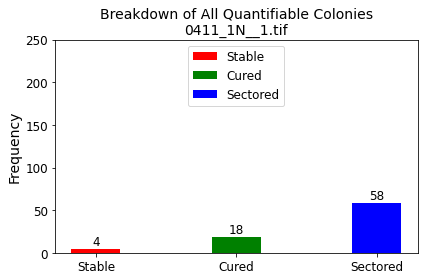

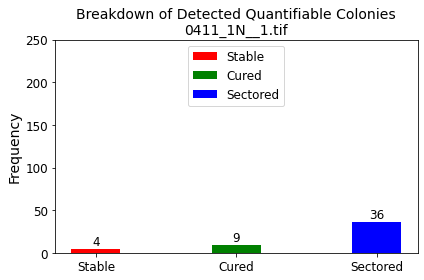

Plate: 0419_1N__2.tif:
92 colonies found using circle Hough transform
LABELS:
Quantifiable labels: 79
Cured labels: 0
Stable labels: 79
Sectored labels: 0
DETECTIONS:
Quantifiable Colonies detected: 49
Cured Colonies detected: 0
Stable Colonies detected: 49
Sectored Colonies detected: 0
Non-Quantifiable or Erroneous Colonies detected: 43


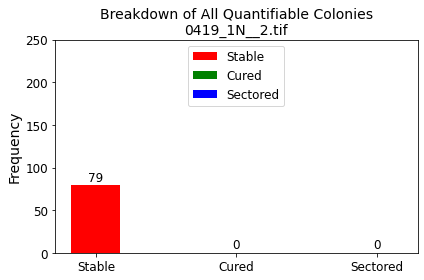

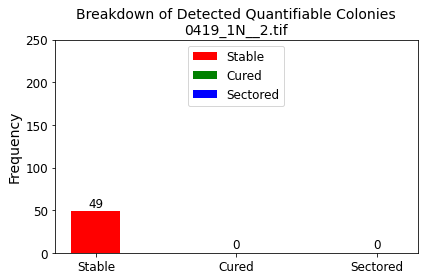

Plate: 0419_1N__3.tif:
70 colonies found using circle Hough transform
LABELS:
Quantifiable labels: 89
Cured labels: 37
Stable labels: 8
Sectored labels: 44
DETECTIONS:
Quantifiable Colonies detected: 54
Cured Colonies detected: 16
Stable Colonies detected: 8
Sectored Colonies detected: 30
Non-Quantifiable or Erroneous Colonies detected: 16


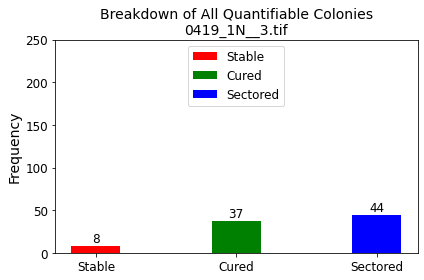

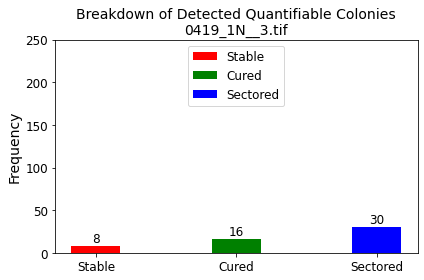

Plate: 0501_4N__1.tif:
33 colonies found using circle Hough transform
LABELS:
Quantifiable labels: 67
Cured labels: 45
Stable labels: 3
Sectored labels: 19
DETECTIONS:
Quantifiable Colonies detected: 19
Cured Colonies detected: 16
Stable Colonies detected: 2
Sectored Colonies detected: 1
Non-Quantifiable or Erroneous Colonies detected: 14


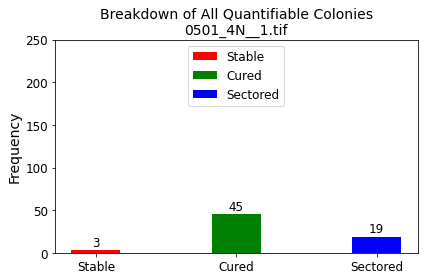

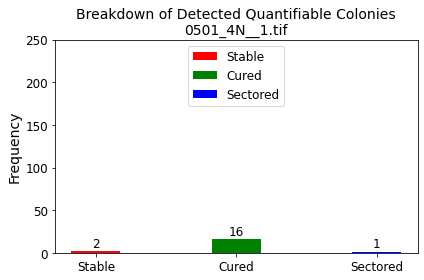

Plate: 0501_4N__3.tif:
31 colonies found using circle Hough transform
LABELS:
Quantifiable labels: 88
Cured labels: 62
Stable labels: 6
Sectored labels: 20
DETECTIONS:
Quantifiable Colonies detected: 16
Cured Colonies detected: 15
Stable Colonies detected: 0
Sectored Colonies detected: 1
Non-Quantifiable or Erroneous Colonies detected: 15


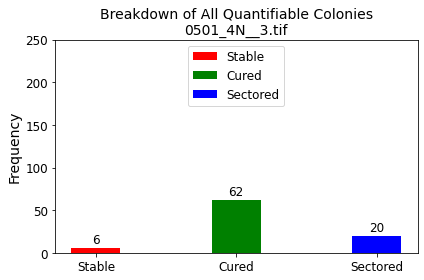

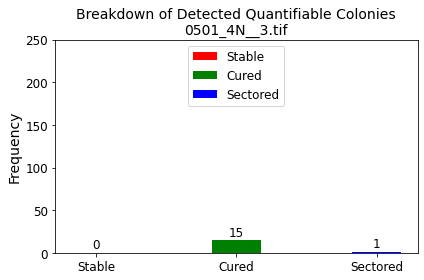

Plate: 0501_sir2__1.tif:
78 colonies found using circle Hough transform
LABELS:
Quantifiable labels: 99
Cured labels: 79
Stable labels: 5
Sectored labels: 15
DETECTIONS:
Quantifiable Colonies detected: 62
Cured Colonies detected: 58
Stable Colonies detected: 1
Sectored Colonies detected: 3
Non-Quantifiable or Erroneous Colonies detected: 16


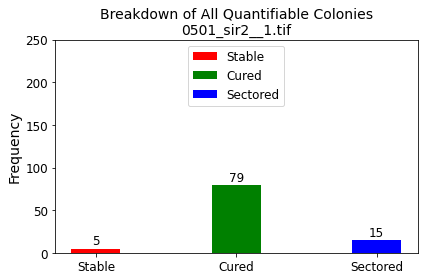

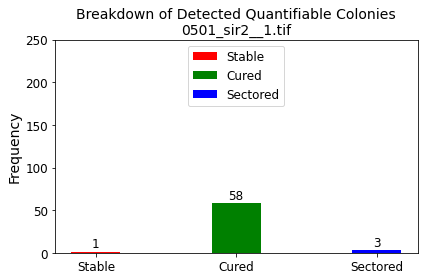

Plate: 0501_sir2__3.tif:
76 colonies found using circle Hough transform
LABELS:
Quantifiable labels: 100
Cured labels: 74
Stable labels: 10
Sectored labels: 16
DETECTIONS:
Quantifiable Colonies detected: 50
Cured Colonies detected: 42
Stable Colonies detected: 5
Sectored Colonies detected: 3
Non-Quantifiable or Erroneous Colonies detected: 26


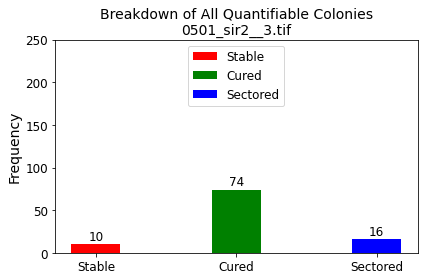

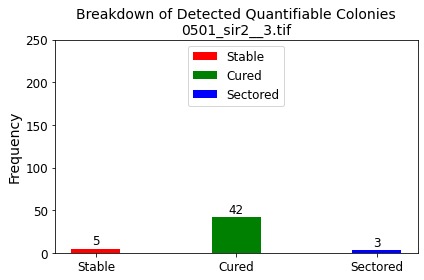

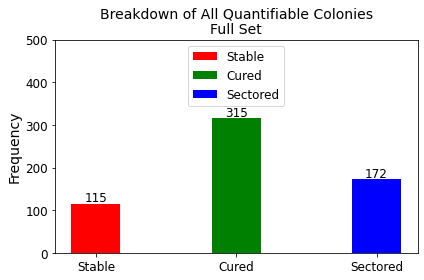

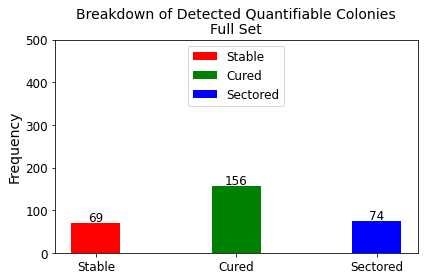

In [ ]:
quantifiable_colony = []
quantifiable_cured = []
quantifiable_stable = []
quantifiable_sectored = []

dot_quant_images = sorted(glob.glob(additional_data_folder + '/Quant/' + '*'))
dot_state_images = sorted(glob.glob(additional_data_folder + '/State/' + '*'))

total_cured_labels = 0
total_stable_labels = 0
total_sectored_labels = 0

total_detected_cured_labels = 0
total_detected_stable_labels = 0
total_detected_sectored_labels = 0

for (this_quant_image, this_state_image) in zip(dot_quant_images, dot_state_images):

    this_plate = pathlib.PurePath(this_quant_image) # path to quantifiable image
    plate_name = this_plate.name #name of the file at the end of the path (should be same in quant and state)
    plate_stem = os.path.splitext(plate_name)[0] # remove the extension of the file

    print('Plate: ' + str(plate_name) + ':')
    # if save_all_annotations == True:
    #     print('Annotations will be saved within subfolders named ' + "\'" + file_dict[plate_name] + "\'")

    # Read images of the plate
    x_quant = read_image(this_quant_image)
    x_state = read_image(this_state_image)

    colony_locations = pd.read_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

    print(str(len(colony_locations["Radius"])) + ' colonies found using circle Hough transform')
    plate_names = np.repeat(plate_name, len(colony_locations["Radius"]))
    colony_numbers = np.array(range(len(colony_locations["Radius"])))

    # Find the colonies marked with a black dot.
    # This indicates quantifiable

    # Create a mask showing where those dots are.
    quantifable_range = np.array([0, 0, 0], dtype="uint8")

    quantifiable_mask = cv2.inRange((x_quant*255).astype(np.uint8), quantifable_range, quantifable_range)

    # Wes dots
    #cured_dot_boundaries = [([76-5, 177-5, 34-5], [76+5, 177+5, 34+5])]
    #stable_dot_boundaries = [([36-5, 28-5, 237-5], [36+5, 28+5, 237+5])]
    #sectored_dot_boundaries = [([204-5, 72-5, 63-5], [204+5, 72+5, 63+5])]
    
    # First possible labels (Wes images which render as is)
    cured_dot_boundaries_lower_1 = np.array([76-5, 177-5, 34-5], dtype = "uint8")
    stable_dot_boundaries_lower_1 = np.array([36-5, 28-5, 237-5], dtype = "uint8")
    sectored_dot_boundaries_lower_1 = np.array([204-5, 72-5, 63-5], dtype = "uint8")

    cured_dot_boundaries_upper_1 = np.array([76+5, 177+5, 34+5], dtype = "uint8")
    stable_dot_boundaries_upper_1 = np.array([36+5, 28+5, 237+5], dtype = "uint8")
    sectored_dot_boundaries_upper_1 = np.array([204+5, 72+5, 63+5], dtype = "uint8")

    # Second possible labels (Nicole and Wes images which render differently for some reason, but conveniently give pure colors)
    cured_dot_boundaries_lower_2 = np.array([0, 250, 0], dtype = "uint8")
    stable_dot_boundaries_lower_2 = np.array([0, 0, 250], dtype = "uint8")
    sectored_dot_boundaries_lower_2 = np.array([250, 250, 0], dtype = "uint8")

    cured_dot_boundaries_upper_2 = np.array([0, 255, 0], dtype = "uint8")
    stable_dot_boundaries_upper_2 = np.array([0, 0, 255], dtype = "uint8")
    sectored_dot_boundaries_upper_2 = np.array([255, 255, 0], dtype = "uint8")

    # Third possible labels
    cured_dot_boundaries_lower_3 = np.array([80-5, 165-5, 0], dtype = "uint8")
    stable_dot_boundaries_lower_3 = np.array([23-5, 0, 194-5], dtype = "uint8")
    sectored_dot_boundaries_lower_3 = np.array([239-5, 173-5, 0], dtype = "uint8")

    cured_dot_boundaries_upper_3 = np.array([80+5, 165+5, 0+5], dtype = "uint8")
    stable_dot_boundaries_upper_3 = np.array([23+5, 0+5, 194+5], dtype = "uint8")
    sectored_dot_boundaries_upper_3 = np.array([239+5, 173+5, 0+5], dtype = "uint8")

    # Third Possible labels (Labels whihc aren't rendering the same way as the rest of the image)
    cured_dot_boundaries_lower_3 = np.array([80-5, 165-5, 0], dtype = "uint8")
    stable_dot_boundaries_lower_3 = np.array([47-5, 47-5, 191-5], dtype = "uint8")
    sectored_dot_boundaries_lower_3 = np.array([239-5, 173-5, 0], dtype = "uint8")

    cured_dot_boundaries_upper_3 = np.array([80+5, 165+5, 0+5], dtype = "uint8")
    stable_dot_boundaries_upper_3 = np.array([47+5, 47+5, 191+5], dtype = "uint8")
    sectored_dot_boundaries_upper_3 = np.array([239+5, 173+5, 0+5], dtype = "uint8")

    # Fourth possible labels (One of Nicole images which renders in a differnt way)
    #cured_dot_boundaries_lower_4 = np.array([80-5, 165-5, 0], dtype = "uint8")
    stable_dot_boundaries_lower_4 = np.array([23-5, 0, 194-5], dtype = "uint8")
    sectored_dot_boundaries_lower_4 = np.array([255-5, 217-5, 77-5], dtype = "uint8")

    #cured_dot_boundaries_upper_4 = np.array([80+5, 165+5, 0+5], dtype = "uint8")
    stable_dot_boundaries_upper_4 = np.array([23+5, 0+5, 194+5], dtype = "uint8")
    sectored_dot_boundaries_upper_4 = np.array([255, 217+5, 77+5], dtype = "uint8")

    cured_dot_mask_1 = cv2.inRange((x_state*255).astype(np.uint8), cured_dot_boundaries_lower_1, cured_dot_boundaries_upper_1)
    stable_dot_mask_1 = cv2.inRange((x_state*255).astype(np.uint8), stable_dot_boundaries_lower_1, stable_dot_boundaries_upper_1)
    sectored_dot_mask_1 = cv2.inRange((x_state*255).astype(np.uint8), sectored_dot_boundaries_lower_1, sectored_dot_boundaries_upper_1)

    cured_dot_mask_2 = cv2.inRange((x_state*255).astype(np.uint8), cured_dot_boundaries_lower_2, cured_dot_boundaries_upper_2)
    stable_dot_mask_2 = cv2.inRange((x_state*255).astype(np.uint8), stable_dot_boundaries_lower_2, stable_dot_boundaries_upper_2)
    sectored_dot_mask_2 = cv2.inRange((x_state*255).astype(np.uint8), sectored_dot_boundaries_lower_2, sectored_dot_boundaries_upper_2)

    cured_dot_mask_3 = cv2.inRange((x_state*255).astype(np.uint8), cured_dot_boundaries_lower_3, cured_dot_boundaries_upper_3)
    stable_dot_mask_3 = cv2.inRange((x_state*255).astype(np.uint8), stable_dot_boundaries_lower_3, stable_dot_boundaries_upper_3)
    sectored_dot_mask_3 = cv2.inRange((x_state*255).astype(np.uint8), sectored_dot_boundaries_lower_3, sectored_dot_boundaries_upper_3)

    stable_dot_mask_4 = cv2.inRange((x_state*255).astype(np.uint8), stable_dot_boundaries_lower_4, stable_dot_boundaries_upper_4)
    sectored_dot_mask_4 = cv2.inRange((x_state*255).astype(np.uint8), sectored_dot_boundaries_lower_4, sectored_dot_boundaries_upper_4)

    cured_dot_mask = cured_dot_mask_1 | cured_dot_mask_2 | cured_dot_mask_3
    stable_dot_mask = stable_dot_mask_1 | stable_dot_mask_2 | stable_dot_mask_3 | stable_dot_mask_4
    sectored_dot_mask = sectored_dot_mask_1 | sectored_dot_mask_2 | sectored_dot_mask_3 | sectored_dot_mask_4

    quantifiable_mask_2 = quantifiable_mask[int(0.1*quantifiable_mask.shape[0]):int(0.9*quantifiable_mask.shape[0]), int(0.1*quantifiable_mask.shape[1]):int(0.9*quantifiable_mask.shape[1])]

    quantifiable_labels = label(quantifiable_mask)
    cured_labels = label(cured_dot_mask)
    stable_labels = label(stable_dot_mask)
    sectored_labels = label(sectored_dot_mask)

    #print('Quantifiable labels:', len(np.unique(label(quantifiable_mask_2)))-1)
    print('LABELS:')
    print('Quantifiable labels:', len(np.unique(quantifiable_labels))-1)
    print('Cured labels:', len(np.unique(cured_labels))-1)
    print('Stable labels:', len(np.unique(stable_labels))-1)
    print('Sectored labels:', len(np.unique(sectored_labels))-1)

    total_cured_labels = total_cured_labels + len(np.unique(cured_labels))-1
    total_stable_labels = total_stable_labels + len(np.unique(stable_labels))-1
    total_sectored_labels = total_sectored_labels + len(np.unique(sectored_labels))-1

    label_sum = len(np.unique(cured_labels))-1 + len(np.unique(stable_labels))-1 + len(np.unique(sectored_labels))-1
    if label_sum != (len(np.unique(quantifiable_labels))-1):
        diff_label_count = np.abs(label_sum - (len(np.unique(quantifiable_labels))-1))
        print('Label counts are off by', diff_label_count)

    classified_dot_mask = cured_dot_mask | stable_dot_mask| sectored_dot_mask

    image_dot = np.dstack((x_state[:,:,0]*(classified_dot_mask // 255), x_state[:,:,1]*(classified_dot_mask // 255), x_state[:,:,2]*(classified_dot_mask // 255)))

    #cv2_imshow(image_dot*255)

    detected_quantifiable = 0
    detected_cured = 0
    detected_stable = 0
    detected_sectored = 0
    #num_quantifiable_colonies = 0

    for this_index in range(0,len(colony_numbers)):

        #print('')
        #print('Colony ' + str(this_index))
        # get example image using bounding indices
        #this_index = 2

        # Copy location data from colony image
        top_left_x = colony_locations["Top Left (x)"][this_index]
        top_left_y = colony_locations["Top Left (y)"][this_index]
        box_width = colony_locations["Width"][this_index]
        box_height = colony_locations["Height"][this_index]

        # sides_vert_top.append(top_left_y)
        # sides_vert_bottom.append(top_left_y + box_height - 1)
        # sides_horz_left.append(top_left_x)
        # sides_horz_right.append(top_left_x + box_width - 1)

        # Grab colony from image using coordinates copied above
        colony_image_quant = x_quant[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]
        colony_image_state = x_state[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]
        colony_image_dot = image_dot[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]

        colony_dot_mask = classified_dot_mask[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]
        colony_cured_mask = cured_dot_mask[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]
        colony_stable_mask = stable_dot_mask[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]
        colony_sectored_mask = sectored_dot_mask[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]
        colony_quant_mask = quantifiable_mask[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]

        label_quantifiable = label(colony_quant_mask)
        label_cured = label(colony_cured_mask)
        label_stable = label(colony_stable_mask)
        label_sectored = label(colony_sectored_mask)

        num_quant_labels = len(np.unique(label_quantifiable))
        num_cured_labels = len(np.unique(label_cured))
        num_stable_labels = len(np.unique(label_stable))
        num_sectored_labels = len(np.unique(label_sectored))

        # Check if a label exists
        # print(num_quant_labels)
        # print(num_cured_labels)
        # print(num_stable_labels)
        # print(num_sectored_labels)

        # Quantifiable Colonies
        if num_quant_labels <= 1:
            colony_is_quantifiable = False
        else:
            colony_center_y = (colony_image_quant.shape[0] - 1) / 2.0
            colony_center_x = (colony_image_quant.shape[1] - 1) / 2.0
            for this_comp in range(1, num_quant_labels):
                this_dot_comp = label_quantifiable == this_comp
                # Get centroid of component
                (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                if dot_dist < colony_locations["Radius"][this_index]:
                    colony_is_quantifiable = True
                    detected_quantifiable = detected_quantifiable + 1
                    break
                    # end the loop, as we found a dot on the colony
                
                if this_comp == (num_quant_labels - 1):
                    # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                    colony_is_quantifiable = False

        quantifiable_colony.append(colony_is_quantifiable)

        # Cured Colonies
        if num_cured_labels <= 1:
            colony_is_cured = False
        else:
            colony_center_y = (colony_image_state.shape[0] - 1) / 2.0
            colony_center_x = (colony_image_state.shape[1] - 1) / 2.0
            for this_comp in range(1, num_cured_labels):
                this_dot_comp = label_cured == this_comp
                # Get centroid of component
                (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                if dot_dist < colony_locations["Radius"][this_index]:
                    colony_is_cured = True
                    # Check that colony has the quantifiable label as well
                    quant_center_y = (colony_image_quant.shape[0] - 1) / 2.0
                    quant_center_x = (colony_image_quant.shape[1] - 1) / 2.0
                    for this_comp_2 in range(1, num_quant_labels):
                        this_dot_comp = label_quantifiable == this_comp
                        # Get centroid of component
                        (quant_centroid_y, quant_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                        quant_dot_dist = math.sqrt(((quant_centroid_y - comp_centroid_y) ** 2) + ((quant_centroid_x - comp_centroid_x) ** 2))
                        if quant_dot_dist < 2*colony_locations["Radius"][this_index]:
                            detected_cured = detected_cured + 1
                            break
                    break
                    # end the loop, as we found a dot on the colony
                
                if this_comp == (num_cured_labels - 1):
                    # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                    colony_is_cured = False

        quantifiable_cured.append(colony_is_cured)

        # Stable Colonies
        if num_stable_labels <= 1:
            colony_is_stable = False
        else:
            colony_center_y = (colony_image_state.shape[0] - 1) / 2.0
            colony_center_x = (colony_image_state.shape[1] - 1) / 2.0
            for this_comp in range(1, num_stable_labels):
                this_dot_comp = label_stable == this_comp
                # Get centroid of component
                (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                if dot_dist < colony_locations["Radius"][this_index]:
                    colony_is_stable = True
                    # Check that colony has the quantifiable label as well
                    quant_center_y = (colony_image_quant.shape[0] - 1) / 2.0
                    quant_center_x = (colony_image_quant.shape[1] - 1) / 2.0
                    for this_comp_2 in range(1, num_quant_labels):
                        this_dot_comp = label_quantifiable == this_comp
                        # Get centroid of component
                        (quant_centroid_y, quant_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                        quant_dot_dist = math.sqrt(((quant_centroid_y - comp_centroid_y) ** 2) + ((quant_centroid_x - comp_centroid_x) ** 2))
                        if quant_dot_dist < 2*colony_locations["Radius"][this_index]:
                            detected_stable = detected_stable + 1
                            break
                    break
                    # end the loop, as we found a dot on the colony
                
                if this_comp == (num_stable_labels - 1):
                    # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                    colony_is_stable = False

        quantifiable_stable.append(colony_is_stable)

        # Sectored Colonies
        if num_sectored_labels <= 1:
            colony_is_sectored = False
        else:
            colony_center_y = (colony_image_state.shape[0] - 1) / 2.0
            colony_center_x = (colony_image_state.shape[1] - 1) / 2.0
            for this_comp in range(1, num_sectored_labels):
                this_dot_comp = label_sectored == this_comp
                # Get centroid of component
                (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                if dot_dist < colony_locations["Radius"][this_index]:
                    colony_is_sectored = True
                    # Check that colony has the quantifiable label as well
                    quant_center_y = (colony_image_quant.shape[0] - 1) / 2.0
                    quant_center_x = (colony_image_quant.shape[1] - 1) / 2.0
                    for this_comp_2 in range(1, num_quant_labels):
                        this_dot_comp = label_quantifiable == this_comp
                        # Get centroid of component
                        (quant_centroid_y, quant_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                        quant_dot_dist = math.sqrt(((quant_centroid_y - comp_centroid_y) ** 2) + ((quant_centroid_x - comp_centroid_x) ** 2))
                        if quant_dot_dist < 2*colony_locations["Radius"][this_index]:
                            detected_sectored = detected_sectored + 1
                            break
                    break
                    # end the loop, as we found a dot on the colony
                
                if this_comp == (num_sectored_labels - 1):
                    # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                    colony_is_sectored = False

        quantifiable_sectored.append(colony_is_sectored)
        #cv2_imshow(np.concatenate((colony_image_quant, colony_image_state), axis=1)*255)

        # print('Colony', this_index, ': Quantifiable:', colony_is_quantifiable)
        # print('Colony', this_index, ': Cured:', colony_is_cured)
        # print('Colony', this_index, ': Stable:', colony_is_stable)
        # print('Colony', this_index, ': Sectored:', colony_is_sectored)
    print('DETECTIONS:')
    print('Quantifiable Colonies detected:', detected_quantifiable)
    print('Cured Colonies detected:', detected_cured)
    print('Stable Colonies detected:', detected_stable)
    print('Sectored Colonies detected:', detected_sectored)
    print('Non-Quantifiable or Erroneous Colonies detected:', len(colony_locations["Radius"]) - detected_quantifiable)

    total_detected_cured_labels = total_detected_cured_labels + detected_cured
    total_detected_stable_labels = total_detected_stable_labels + detected_stable
    total_detected_sectored_labels = total_detected_sectored_labels + detected_sectored

    # Create barplots of true labels only
    plot_labels = list([0, 1, 2])

    x = np.arange(len(plot_labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    # Following the color scheme in the images
    fig, ax = plt.subplots()
    rects0 = ax.bar(0+(width/2), len(np.unique(stable_labels))-1, width, label='Stable', color='red')
    rects1 = ax.bar(1+(width/2), len(np.unique(cured_labels))-1, width, label='Cured', color='green')
    rects2 = ax.bar(2+(width/2), len(np.unique(sectored_labels))-1, width, label='Sectored', color='blue')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Frequency')
    ax.set_title('Breakdown of All Quantifiable Colonies\n' + plate_name, fontfamily = "sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(14)
    #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
    ax.set_ylim(bottom=0, top=250)
    ax.set_xticks([0+width/2,1+width/2, 2+width/2])
    ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
    plt.yticks(fontsize=12)
    ax.legend(loc='upper center', fontsize=12)
    plt.text((width/2), len(np.unique(stable_labels))+4, len(np.unique(stable_labels))-1, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(1+(width/2), len(np.unique(cured_labels))+4, len(np.unique(cured_labels))-1, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(2+(width/2), len(np.unique(sectored_labels))+4, len(np.unique(sectored_labels))-1, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    #addlabels_true(plot_labels, np.array(num_cured_colonies))
    #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

    # Create barplots of labels for the detected quantifiable colonies only
    plot_labels = list([0, 1, 2])

    x = np.arange(len(plot_labels))  # the label locations
    width = 0.35  # the width of the bars
    #x - width/2

    # Following the color scheme in the images
    fig, ax = plt.subplots()
    rects0 = ax.bar(0+(width/2), detected_stable, width, label='Stable', color='red')
    rects1 = ax.bar(1+(width/2), detected_cured, width, label='Cured', color='green')
    rects2 = ax.bar(2+(width/2), detected_sectored, width, label='Sectored', color='blue')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Frequency')
    ax.set_title('Breakdown of Detected Quantifiable Colonies\n' + plate_name, fontfamily = "sans-serif", Fontsize=14)
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(14)
    #ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
    ax.set_ylim(bottom=0, top=250)
    ax.set_xticks([0+width/2,1+width/2, 2+width/2])
    ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
    plt.yticks(fontsize=12)
    ax.legend(loc='upper center', fontsize=12)
    plt.text((width/2), detected_stable+5, detected_stable, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(1+(width/2), detected_cured+5, detected_cured, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    plt.text(2+(width/2), detected_sectored+5, detected_sectored, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
    #addlabels_true(plot_labels, np.array(num_cured_colonies))
    #addlabels_pred(plot_labels, np.array(num_sectored_colonies))

    #plt.bar_label(rects1, padding=3)
    #plt.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()

# Plot with all the labeled colonies

plot_labels = list([0, 1, 2])

x = np.arange(len(plot_labels))  # the label locations
width = 0.35  # the width of the bars
#x - width/2

# Following the color scheme in the images
fig, ax = plt.subplots()
rects0 = ax.bar(0+(width/2), total_stable_labels, width, label='Stable', color='red')
rects1 = ax.bar(1+(width/2), total_cured_labels, width, label='Cured', color='green')
rects2 = ax.bar(2+(width/2), total_sectored_labels, width, label='Sectored', color='blue')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Frequency')
ax.set_title('Breakdown of All Quantifiable Colonies\n' + 'Full Set', fontfamily = "sans-serif", Fontsize=14)
ax.xaxis.label.set_fontsize(16)
ax.yaxis.label.set_fontsize(14)
#ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
ax.set_ylim(bottom=0, top=500)
ax.set_xticks([0+width/2,1+width/2, 2+width/2])
ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
plt.yticks(fontsize=12)
ax.legend(loc='upper center', fontsize=12)
plt.text((width/2), total_stable_labels+5, total_stable_labels, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
plt.text(1+(width/2), total_cured_labels+5, total_cured_labels, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
plt.text(2+(width/2), total_sectored_labels+5, total_sectored_labels, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
#addlabels_true(plot_labels, np.array(num_cured_colonies))
#addlabels_pred(plot_labels, np.array(num_sectored_colonies))

#plt.bar_label(rects1, padding=3)
#plt.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

plot_labels = list([0, 1, 2])

x = np.arange(len(plot_labels))  # the label locations
width = 0.35  # the width of the bars
#x - width/2

# Following the color scheme in the images
fig, ax = plt.subplots()
rects0 = ax.bar(0+(width/2), total_detected_stable_labels, width, label='Stable', color='red')
rects1 = ax.bar(1+(width/2), total_detected_cured_labels, width, label='Cured', color='green')
rects2 = ax.bar(2+(width/2), total_detected_sectored_labels, width, label='Sectored', color='blue')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Frequency')
ax.set_title('Breakdown of Detected Quantifiable Colonies\n' + 'Full Set', fontfamily = "sans-serif", Fontsize=14)
ax.xaxis.label.set_fontsize(16)
ax.yaxis.label.set_fontsize(14)
#ax.set_ylim(bottom=0, top=max([num_cured_colonies, num_sectored_colonies])+20)
ax.set_ylim(bottom=0, top=500)
ax.set_xticks([0+width/2,1+width/2, 2+width/2])
ax.set_xticklabels(['Stable', 'Cured', 'Sectored'], Fontsize=12)
plt.yticks(fontsize=12)
ax.legend(loc='upper center', fontsize=12)
plt.text((width/2), total_detected_stable_labels+5, total_detected_stable_labels, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
plt.text(1+(width/2), total_detected_cured_labels+5, total_detected_cured_labels, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
plt.text(2+(width/2), total_detected_sectored_labels+5, total_detected_sectored_labels, ha = 'center', fontfamily = "sans-serif", Fontsize=12)
#addlabels_true(plot_labels, np.array(num_cured_colonies))
#addlabels_pred(plot_labels, np.array(num_sectored_colonies))

#plt.bar_label(rects1, padding=3)
#plt.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

In [ ]:
colony_data['Quantifiable'] = np.array(quantifiable_colony)
colony_data['Quantifiable Cured'] = np.array(quantifiable_cured)
colony_data['Quantifiable Stable'] = np.array(quantifiable_stable)
colony_data['Quantifiable Sectored'] = np.array(quantifiable_sectored)

# Get a 'sectored' prediction label in the table
colony_data['(AC) Sectored'] = (colony_data['(AC) Cured'] == False) & (colony_data['(AC) Stable'] == False)

## 07/19 Classification Code

In [ ]:
# Code for colony classification (this should be all python code)
# 1. Read in image and corresponding segmentation.
# 2. Read in csv files containg circle locations.
# 3. For each row in the csv file, crop out the circular region, estimate size.
# 4. Restrict data collection to pixels within the circle detected, exclusing all other pixels.
# 5. Split the components of the image into red, white and background.
# 6. Get boundary components of the colony, check for consistency.
# 7. Output predicted number of sectors and their sizes after the consistency check.
# 8. Save the cropping of the colony in a few ways:
#   - the raw colony
#   - the raw colony with circle overlayed
#   - the segmentation of the colony within the circular region
#   - the segmentation of the colony with lines drawn on the image to repreent sector borders
#   - the predicted sector like regions, where each sector is a different shade of gray.
#   - similar to the previous, but keeping pixels classified only as red pixels.
#   - the segmentation that is corrected following the consistency check (possibly doing an additional check on the white pixels)
# 9. Save data on the colony itself, including the sector information, to a row in a table.
# 10. Save the table to a csv file.
# 11. Repeat all steps above for each image.

# Implementation already existing:

image_padding = 5

if classify_results == True:

    %matplotlib inline

    starting_image = True


    # Run each plate through the classification pipeline

    for (test_image, CHT_image) in test_image_pairs:

        # Get plate name 
        this_plate = pathlib.PurePath(test_image)
        plate_name = this_plate.name
        plate_stem = os.path.splitext(plate_name)[0]

        print('Plate: ' + str(plate_name) + ':')
        if save_all_annotations == True:
            print('Annotations will be saved within subfolders named ' + "\'" + file_dict[plate_name] + "\'")

        # Read images of the plate
        x = read_image(test_image)
        x_CHT = read_image(CHT_image)

        # initialize lists for storing values
        all_cropped_colonies = []

        white_region_sum = []
        red_region_sum = []
        colony_region_sum = []
        sector_region_sum = []
        initial_region_counts = []
        all_sector_counts = []
        true_sector_counts = []

        true_white_region_sum = []
        true_red_region_sum = []
        true_colony_region_sum = []
        true_sector_region_sum = []

        corrected_white_region_sum = []
        corrected_red_region_sum = []
        corrected_sector_region_sum = []

        boundary_region_sum = []
        colony_prop_sum = []

        average_sector_score = []
        average_sector_iou = []

        weighted_sector_score_before = []
        weighted_red_sector_score_before = []
        weighted_white_sector_score_before = []

        weighted_sector_score_after = []
        weighted_red_sector_score_after = []
        weighted_white_sector_score_after = []

        sides_vert_top = [];
        sides_vert_bottom = [];
        sides_horz_left = [];
        sides_horz_right = [];

        # Test lists
        colony_is_connected = []
        colony_is_approx_connected = []
        boundary_is_connected = []
        colony_is_whole = []
        boundary_is_hamilton = []
        colony_is_approx_convex = []
        colony_is_approx_circular = []
        hausdorff_dist_convex = []
        hausdorff_dist_circle = []

        # Lists to store purity scores of each region and the color of the region
        region_purity_before = []
        region_color_before = []
        region_sizes_before = []

        weighted_purity_before = []
        weighted_purity_red_before = []
        weighted_purity_white_before = []

        region_purity_after = []
        region_color_after = []
        region_sizes_after = []

        weighted_purity_after = []
        weighted_purity_red_after = []
        weighted_purity_white_after = []

        cured_colony_before = []
        cured_colony_after = []

        stable_colony_before = []
        stable_colony_after = []

        if use_expert_counts == True:
            x_count = read_image(counts_folder + '/' + plate_stem + '_count.png')
            quantifiable_colony = []
        
        # Read the segmentation of the plate, and keep track of which class each pixel belongs to
        p = read_mask(test_seg_folder + '/' + this_plate.stem + '.png')
        #p = read_mask(main_folder + '/Test Segs/' + specific_test_folder + '/Class_3/' + this_plate.stem + '.png')

        p_full = tf.identity(p).numpy()
        in_class = tf.math.greater(tf.constant(p_full), tf.constant([0])).numpy()

        p = p.astype(np.uint8)
        p_1 = tf.math.equal(tf.constant(p_full), tf.constant([127])).numpy().astype(np.uint8) * 255
        p_2 = tf.math.equal(tf.constant(p_full), tf.constant([255])).numpy().astype(np.uint8) * 255
        p_full = 255 * in_class.astype(np.uint8)

        # Gather the location and radii data from the colonies
        # If there are no colonies detected, or there is no table, skip this section at once

        colony_locations = pd.read_csv(test_circle_data_folder + '/' + pathlib.Path(test_image).stem + '.csv')
        #colony_locations = pd.read_csv(main_folder + '/Test Segs CHT Data/' + specific_test_folder + '/Class_3/' + pathlib.Path(test_image).stem + '.csv')

        # Output information from the imported csv

        print(str(len(colony_locations["Radius"])) + ' colonies found using circle Hough transform')
        plate_names = np.repeat(plate_name, len(colony_locations["Radius"]))
        colony_numbers = np.array(range(len(colony_locations["Radius"])))

        #---------------------------------------------------------------------

        # CLASSIFICATION PIPELINE START
        # Pre-processing step

        # Images to save:
        # - Cropping of the colony
        # - Cropping of the colony with the overalyed circle
        # - Original colony segmentation, such that only the pixels inside the overlayed circle are considered.

        for this_index in range(0,len(colony_numbers)):

            print('')
            print('Colony ' + str(this_index))
            # get example image using bounding indices
            #this_index = 2

            # Copy location data from colony image
            top_left_x = colony_locations["Top Left (x)"][this_index]
            top_left_y = colony_locations["Top Left (y)"][this_index]
            box_width = colony_locations["Width"][this_index]
            box_height = colony_locations["Height"][this_index]

            sides_vert_top.append(top_left_y)
            sides_vert_bottom.append(top_left_y + box_height - 1)
            sides_horz_left.append(top_left_x)
            sides_horz_right.append(top_left_x + box_width - 1)

            # Grab image using coordinates copied above
            # The colony image is NOT a boolean array
            colony_image = p[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]
            ellipse_array = create_filled_ellipse_in_array(colony_image)
            colony_image = np.multiply(colony_image, ellipse_array) # unpadded segmentation with the pixels inside the overlayed circle

            if use_expert_counts == True:
                count_image = x_count[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]

            # The colony mask IS a boolean array
            white_colony_mask = p_1[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)] > 0
            red_colony_mask = p_2[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)] > 0 
            colony_mask = np.logical_or(white_colony_mask, red_colony_mask) # sanity check to see of this is the same as colony image

            # Add segmentation of the pixels inside the circular region of detection, and apply the mask.  This ensures we only use the pixels inside the circle for analysis.
            # Booleans are inputs, and booleans are outputs
            white_colony_mask = np.multiply(white_colony_mask, ellipse_array)
            red_colony_mask = np.multiply(red_colony_mask, ellipse_array)
            colony_mask = np.logical_or(white_colony_mask, red_colony_mask)

            # Get initial measure of the sizes of the red and white regions of the colony
            white_region_sum.append(np.sum(white_colony_mask))
            red_region_sum.append(np.sum(red_colony_mask))
            colony_region_sum.append(np.sum(colony_mask))
            sector_region_sum.append(np.sum(red_colony_mask) / np.sum(colony_mask))

            # Find colony boundaries, ensuring that the boundaries are ON the colony, not ADJACENT to it.
            edge_mask_unpadded = get_colony_boundary_binary(colony_image) # The function is above
            interior_mask_unpadded = np.logical_xor(colony_image > 0, edge_mask_unpadded) # Second mask containing only the interior pixels of the segmentation
            interior_colony = np.multiply(colony_image, interior_mask_unpadded) # This is NOT a boolean

            if use_expert_counts == True:
                #----------------------------------
                # Determine if colony is quantifiable
                # Set color boundaries for the markers in the counted images
                green_dot_boundaries = [([0, 230, 0], [25, 255, 25])]

                for (lower, upper) in green_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    dot_mask = cv2.inRange((count_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected pixels
                    green_labels = label(dot_mask)
                    num_green_labels = len(np.unique(green_labels))
                    if num_green_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_quantifiable = False
                    else:
                        # Loop through each component.  Find one component that is not to small and isdirectly on the colony
                        count_center_y = (count_image.shape[0] - 1) / 2.0
                        count_center_x = (count_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_green_labels):
                            this_dot_comp = green_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - count_center_y) ** 2) + ((comp_centroid_x - count_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_quantifiable = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_green_labels - 1):
                                # We looped through all the dots, but none of them werer on the colony.  Don't analyze this colony
                                colony_is_quantifiable = False

                quantifiable_colony.append(colony_is_quantifiable)


                #----------------------------------

            #--------------------------------------
            # Get connectedness properties of the segmentation

            # Use this information to test whether the segmentation meets the conditions

            # Condition 1 test: is the segmentation one connected component?
            condition_1_test_strong, condition_1_test_weak = check_components_of_colony(colony_mask)
            colony_is_connected.append(condition_1_test_strong)
            colony_is_approx_connected.append(condition_1_test_weak)
            #print('Condition 1: Seg is one component: ' + str(condition_1_test_strong))
            #print("Condition 1: Seg is \'approximately\' one component: " + str(condition_1_test_weak))

            # Condition 2 test: Is the boundary one connected component?
            condition_2_test = check_components_of_boundary(edge_mask_unpadded)
            boundary_is_connected.append(condition_2_test)
            #print('Condition 2: Boundary is one component: ' + str(condition_2_test))

            # Condition 3 test: Are there holes in the segmentation?
            condition_3_test = check_for_holes(colony_mask, edge_mask_unpadded)
            colony_is_whole.append(condition_3_test)
            #print('Condition 3: Segmentation has no holes: ' + str(condition_3_test))

            # Condition 4 test: Is the boundary a Hamiltonian cycle? (no ready yet)
            #condition_4_test = get_hamilton_cycle(colony_mask, edge_mask_unpadded)
            #print('Has Hamiltonian cycle: ' + str(condition_4_test))

            # Condition 5: Check circularity and convexity
            condition_5_convex, condition_5_circular = compare_convex_hull(colony_mask, edge_mask_unpadded)
            colony_is_approx_convex.append(condition_5_convex)
            colony_is_approx_circular.append(condition_5_circular)
            #print('Condition 5: Segmentation is approximately convex: ' + str(condition_5_convex))
            #print('Condition 5: Segmentation is approximately circular: ' + str(condition_5_circular))

            # Condition 6: Check hausdorff distance
            hausdorff_chull, hausdorff_circle = get_hausdorff_distance(colony_mask, edge_mask_unpadded)
            hausdorff_dist_convex.append(hausdorff_chull)
            hausdorff_dist_circle.append(hausdorff_circle)
            #print('Condition 6: Hausdorff distance between boundary and convex hull: ' + str(hausdorff_chull))
            #print('Condition 6: Hausdorff distance between boundary and circle: ' + str(hausdorff_circle))

            #----------------------------------------
            # Get boundaries

            # Get 'ideal' boundary of the colony
            ideal_circle = create_circle_boundary(edge_mask_unpadded, colony_locations["Radius"][this_index])

            # Find connected components of the red and white pixels found on the boundary
            red_boundary_skeleton, white_boundary_skeleton, boundary_mask_h, boundary_mask_w = get_boundary_partitions(red_colony_mask, white_colony_mask, edge_mask_unpadded)

            #plt.imshow(red_boundary_skeleton)
            #plt.title('Red Boundary Skeleton')

            # Save the three images using this data
            padded_x = 255 * x[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
            padded_x_CHT = 255 * x_CHT[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
            padded_mask = p[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1)]
            ellipse_array_2 = create_filled_ellipse_in_array(padded_mask, padding = image_padding)
            padded_mask = np.multiply(padded_mask, ellipse_array_2)

            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/raw/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.jpg', padded_x):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/circles/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.jpg', padded_x_CHT):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/segs/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', padded_mask):
                    raise Exception('Could not write image.')

            if use_expert_counts == True:
                padded_x_count = 255 * x_count[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
                if not cv2.imwrite(output_crops_folder + '/counted/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', padded_x_count):
                    raise Exception('Could not write image.')
            #-------------------------------------------------------------

            # CLASSIFICATION STEP BEGINS
            # GET INITIAL REGIONAL BREAKDOWN AND RED REGION ANNOTATIONS OF THE COLONY

            # Images to save in this section
            # - Regional segmentation
            # - Boundary of the colony
            # - Red region boundary annotation
            # - Regions that fail consistency check

            # Plot padded version of the initial segmentation.  Annotations will be saved onto the image.
            colony_image_padded = np.pad(colony_image, 5)
            fig1, ax1 = plt.subplots()
            ax1.imshow(colony_image_padded, cmap='gray')


            recheck_boundaries = False # initialized

            # Using boundary information, find and extract potential red and white regions of the colony

            red_labels = label(red_boundary_skeleton)
            white_labels = label(white_boundary_skeleton)

            # Initialize masks separating potential red and white regions
            initial_red_region_mask = np.zeros_like(red_boundary_skeleton)
            initial_white_region_mask = np.zeros_like(white_boundary_skeleton)
            initial_red_boundary_mask = np.zeros_like(red_boundary_skeleton)
            initial_white_boundary_mask = np.zeros_like(white_boundary_skeleton)
            initial_bad_red_score_mask = np.zeros_like(red_boundary_skeleton)
            initial_bad_white_score_mask = np.zeros_like(white_boundary_skeleton)


            boundary_correction = np.zeros_like(red_boundary_skeleton)

            # Initialize lists to store charaxcteristics about each region
            # This includes endpoints on the sector, the prity of the sector, and an indicator for the purity being above the 50 percent threshold
            red_component_endpoints = []
            red_component_scores = []
            red_component_checks = []
            red_component_sizes = []

            white_component_endpoints = []
            white_component_scores = []
            white_component_checks = []
            white_component_sizes = []

            num_red_boundaries = len(np.unique(red_labels)[1:]) # number of red boundaries present
            num_white_boundaries = len(np.unique(white_labels)[1:]) # number of white boundaries present

            initial_region_counts.append(num_red_boundaries)

            if ((num_red_boundaries == 1) & (num_white_boundaries == 0)):
                cured_colony_before.append(True)
            else:
                cured_colony_before.append(False)

            if ((num_red_boundaries == 0) & (num_white_boundaries == 1)):
                stable_colony_before.append(True)
            else:
                stable_colony_before.append(False)

            # Analyze the inital red regions of the colony
            for this_label in np.unique(red_labels)[1:]:
                red_component = copy.deepcopy(red_labels)
                red_component = red_component == this_label
                red_component = red_component.astype(np.int32)

                initial_red_boundary_mask = np.logical_or(initial_red_boundary_mask, red_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], red_component)

                # If exactly two points are found, then everything's good.

                # Get the magle of the endpoints relative to the colony center
                [endpoint_angles, endpoint_locations, endpoints_x, endpoints_y] = get_endpoint_locations(full_endpoints_list, colony_mask, colony_locations["Radius"][this_index])

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                initial_red_region_mask = np.logical_or(initial_red_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, red_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    recheck_boundaries = True
                    initial_bad_red_score_mask = np.logical_or(initial_bad_red_score_mask, sector_filled)

                # Append scores and info to lists
                red_component_endpoints.append(full_endpoints_list)
                red_component_scores.append(prop_interior)
                red_component_checks.append(confirm_check)
                red_component_sizes.append(np.sum(initial_red_region_mask))

                # Plot the lines of the sector (and the boundary line) onto the colony segmentation
                length_points = len(endpoints_x)
                #print(length_points)
                #print(endpoints_x)
                if len(np.unique(red_labels)[1:]) > 0: # only plots lines if there are divided regions
                    plot_bounds_x = []
                    plot_bounds_y = []
                    plot_bounds_x.append(endpoints_x[0] + image_padding)
                    plot_bounds_y.append(endpoints_y[0] + image_padding)
                    # Get list of center and endpoints on the boundary
                    for this_bound in range(0, length_points-1):
                        plot_bounds_x.append(endpoints_x[this_bound+1] + image_padding)
                        plot_bounds_y.append(endpoints_y[this_bound+1] + image_padding)
                        #plt.plot(plot_points_y, plot_points_x, color='blue')
                        #print(endpoints_x[0:2])
                        #print(endpoints_y[0:2])
                    plot_bounds_x = np.roll(np.array(plot_bounds_x), 1)
                    plot_bounds_y = np.roll(np.array(plot_bounds_y), 1)
                    #print(plot_bounds_x)
                    #print(plot_bounds_y)
                    line_style = ':' if (len(plot_bounds_x) == 2) else '-'
                    ax1.plot(plot_bounds_y, plot_bounds_x, linewidth=5, linestyle=line_style, alpha=0.85)
                    if len(plot_bounds_x) == 1:
                        full_circle = Circle((plot_bounds_y, plot_bounds_x), radius=colony_locations["Radius"][this_index], color='blue', fill=False, linewidth=5, alpha=0.85)
                        ax1.add_patch(full_circle)


            # Do the same for the white regions
            for this_label in np.unique(white_labels)[1:]:
                white_component = copy.deepcopy(white_labels)
                white_component = white_component == this_label
                white_component = white_component.astype(np.int32)

                initial_white_boundary_mask = np.logical_or(initial_white_boundary_mask, white_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                initial_white_region_mask = np.logical_or(initial_white_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    recheck_boundaries = True
                    initial_bad_white_score_mask = np.logical_or(initial_bad_white_score_mask, sector_filled)

                # Append scores and info to lists
                white_component_endpoints.append(full_endpoints_list)
                white_component_scores.append(prop_interior)
                white_component_checks.append(confirm_check)
                white_component_sizes.append(np.sum(initial_white_region_mask))

            # At this point, you should have two masks, one for the red and white regions respectivey.
            # You should also have the endponts of each component, stored as a collection of lists, one list per component
            # Finally, you should have a score for those components

            # Store the purity scores in a sublist, along with a second sublist indicating the color of each region

            all_component_scores = []
            all_region_colors = []
            all_region_sizes = []

            if not red_component_scores:
                all_region_colors = all_region_colors + ['red']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['red'] * len(red_component_scores))
                all_component_scores = all_component_scores + red_component_scores
                all_region_sizes = all_region_sizes + red_component_sizes

            if not white_component_scores:
                all_region_colors = all_region_colors + ['white']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['white'] * len(white_component_scores))
                all_component_scores = all_component_scores + white_component_scores
                all_region_sizes = all_region_sizes + white_component_sizes

            region_purity_before.append(all_component_scores)
            region_color_before.append(all_region_colors)
            region_sizes_before.append(all_region_sizes)

            # Compute weighted purity scores over all regions, for white only, and for red only

            total_red_sum = np.nansum(red_component_sizes)
            total_white_sum = np.nansum(white_component_sizes)

            if not red_component_scores:
                red_region_weights = np.array([0])
                weighted_red_scores = np.array([0])
            else:
                red_region_weights = np.divide(np.array(red_component_sizes), total_red_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_red_scores = np.multiply(np.array(red_component_scores), red_region_weights)

            if not white_component_scores:
                white_region_weights = np.array([0])
                weighted_white_scores = np.array([0])
            else:
                white_region_weights = np.divide(np.array(white_component_sizes), total_white_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_white_scores = np.multiply(np.array(white_component_scores), white_region_weights)

            # Get weighted average over both regions together
            all_region_sum = np.nansum(all_region_sizes)
            all_region_weights = np.divide(np.array(red_component_sizes + white_component_sizes), all_region_sum)
            all_region_weighted_scores = np.multiply(np.array(red_component_scores + white_component_scores), all_region_weights)

            weighted_purity_red_before.append(list(weighted_red_scores))
            weighted_purity_white_before.append(list(weighted_white_scores))
            weighted_purity_before.append(list(all_region_weighted_scores))
            weighted_red_sector_score_before.append(np.nansum(weighted_red_scores))
            weighted_white_sector_score_before.append(np.nansum(weighted_white_scores))
            weighted_sector_score_before.append(np.nansum(all_region_weighted_scores))

            # Now, create the masks containing the initial_regions
            initial_region_mask = np.maximum(initial_red_region_mask.astype(np.uint8), 2*initial_white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            initial_boundary_mask = np.maximum(initial_red_boundary_mask.astype(np.uint8), 2*initial_white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            initial_score_mask = np.maximum(initial_bad_red_score_mask.astype(np.uint8), 2*initial_bad_white_score_mask.astype(np.uint8))*(255/(num_classes-1))


            initial_region_mask = np.pad(initial_region_mask, image_padding)
            initial_boundary_mask = np.pad(initial_boundary_mask, image_padding)
            initial_score_mask = np.pad(initial_score_mask, image_padding)

            # Save the initial region mask region mask in particular
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/init_regions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_region_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/init_bounds/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_boundary_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/init_bad/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_score_mask):
                    raise Exception('Could not write image.')
            plt.axis('off')
            if save_all_annotations == True:
                fig1.savefig(output_crops_folder + '/init_partitions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            plt.close(fig1);




            #------------------------------------------------------------------

            # CLASS SWITCH STEP

            # This is only applied to regions where the consistency check fails.
            # i.e. less than 50% of pixels in the predicted region are of the same class
            # as the outer boundary pixels

            # The process will repeat until all regions pass the consisency check

            # NOTE: This section is only executed if one of either the red or
            # white regions etimated above, fails the constency check.
            # If all regions predicted are consistent in class, the below will
            # not execute, as it will do exactly the same stuff as just done above.

            repetition_counter = 0
            performing_correction = False # initialize at the beginning

            while recheck_boundaries == True:

                recheck_boundaries = False # reset.
                repetition_counter = repetition_counter + 1

                # The above should be switched back to True if there is a potentially misclassified boundary


                # Find the connected components of the skeleton.
                # The number of red connected components gives the initial number of sectors.
                # The number of white connected components are the regions separating the red sectors.
                # A score for sectoriness will be applied to both sets of regions.
                red_labels = label(red_boundary_skeleton)
                white_labels = label(white_boundary_skeleton)

                # Initialize masks separating potential red and white regions
                red_region_mask = np.zeros_like(red_boundary_skeleton)
                white_region_mask = np.zeros_like(white_boundary_skeleton)
                red_boundary_mask = np.zeros_like(red_boundary_skeleton)
                white_boundary_mask = np.zeros_like(white_boundary_skeleton)
                red_score_mask = np.zeros_like(red_boundary_skeleton)
                white_score_mask = np.zeros_like(white_boundary_skeleton)

                # Intialize array to change boundary.
                # This is only updated when there is a potentially misclassified boundary.
                boundary_correction_red = np.zeros_like(red_boundary_skeleton)
                boundary_correction_white = np.zeros_like(white_boundary_skeleton)

                # Generate regions directly from segmentation
                # Iterate through each component and collect some information

                red_component_endpoints = []
                red_component_scores = []
                red_component_checks = []

                white_component_endpoints = []
                white_component_scores = []
                white_component_checks = []

               # print('Number of red components: ' + str(max(np.unique(red_labels)[1:])))

                for this_label in np.unique(red_labels)[1:]:
                    #print('Running the red check.')
                    red_component = copy.deepcopy(red_labels)
                    red_component = red_component == this_label
                    red_component = red_component.astype(np.int32)

                    red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0)

                    # Function to get endpoints of connected component
                    full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], red_component)

                    # If exactly two points are found, then everything's good.

                    # Function to get mask representing sector boundary
                    sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                    # Fill initial region mask with the filled sector
                    red_region_mask = np.logical_or(red_region_mask, sector_filled)

                    # Apply consistency check to score region
                    confirm_check, prop_interior = check_for_consistency_2(sector_filled, red_colony_mask)

                    # Update score mask to denote where the consistency check failed
                    if confirm_check == False:
                        #performing_correction = True # This signifies that boundary information will be different from the initial breakdown
                        recheck_boundaries = True
                        boundary_correction_red = np.logical_or(boundary_correction_red, red_component)


                    # Append scores and info to lists
                    red_component_endpoints.append(full_endpoints_list)
                    red_component_scores.append(prop_interior)
                    red_component_checks.append(confirm_check)

                

                for this_label in np.unique(white_labels)[1:]:

                    white_component = copy.deepcopy(white_labels)
                    white_component = white_component == this_label
                    white_component = white_component.astype(np.int32)

                    white_boundary_mask = np.logical_or(white_boundary_mask, white_component > 0)

                    # Function to get endpoints of connected component
                    full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component)

                    # If exactly two points are found, then everything's good.

                    # Function to get mask representing sector boundary
                    sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                    # Fill initial region mask with the filled sector
                    white_region_mask = np.logical_or(white_region_mask, sector_filled)

                    # Apply consistency check to score region
                    confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)

                    # Update score mask to denote where the consistency check failed
                    if confirm_check == False:
                        #performing_correction = True # This signifies that boundary information will be different from the initial breakdown
                        recheck_boundaries = True
                        boundary_correction_white = np.logical_or(boundary_correction_white, white_component)

                    # Append scores and info to lists
                    white_component_endpoints.append(full_endpoints_list)
                    white_component_scores.append(prop_interior)
                    white_component_checks.append(confirm_check)

                # If there were regions that failed the consistency check, swap the classes on the boundary
                if recheck_boundaries == True:

                    performing_correction = True # This signifies that boundary information will be different from the initial breakdown

                    # Run the swap functions
                    red_boundary_skeleton = grow_boundary(red_boundary_skeleton, boundary_correction_white) # takes the bad white boundaries and switches them to the red class
                    red_boundary_skeleton = shrink_boundary(red_boundary_skeleton, boundary_correction_red) # removes the bad red boundaries

                    white_boundary_skeleton = grow_boundary(white_boundary_skeleton, boundary_correction_red) # takes the bad red boundaries and switches them to the white class
                    white_boundary_skeleton = shrink_boundary(white_boundary_skeleton, boundary_correction_white) # removes the bad white boundaries

                # Only run the block below if this colony cannot be analyzed appropriatly with this pipeline (may be an awful segmentation)
                if repetition_counter > 20:
                    warnings.warn('Corrections have been applied way too many times.  The colony segmentation used here is likely unsuitable for this pipeline.')
                    break

                    # Once the swap is done, you will head back to the top of this while loop.

            # At this point, you should have two masks, one for the red and white regions respectivey.
            # You should also have the endponts of each components, stored as a collection of lists, one list per component
            # Finally, you should have a score for those components

            # Now, create the masks containing the regions that pass the consistency check
            if performing_correction == True:
                corrected_region_mask = np.maximum(white_region_mask.astype(np.uint8), 2*red_region_mask.astype(np.uint8))*(255/(num_classes-1))
                corrected_boundary_mask = np.maximum(white_boundary_mask.astype(np.uint8), 2*red_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
                #score_mask = np.maximum(initial_bad_white_score_mask.astype(np.uint8), 2*initial_bad_red_score_mask.astype(np.uint8))*(255/(num_classes-1))
            else:
                corrected_region_mask = np.maximum(initial_white_region_mask.astype(np.uint8), 2*initial_red_region_mask.astype(np.uint8))*(255/(num_classes-1))
                corrected_boundary_mask = np.maximum(initial_white_boundary_mask.astype(np.uint8), 2*initial_red_boundary_mask.astype(np.uint8))*(255/(num_classes-1))

            corrected_region_mask = np.pad(corrected_region_mask, 5)
            #score_mask = np.pad(score_mask, 5)

            # Save the corrected region mask in different folder
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/cor_regions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_region_mask):
                    raise Exception('Could not write image.')

            #-------------------------------------------------------------------

            # PROCESSING THE CORRECTED REGIONS AFTER MERGING
            # If you got to this point, then the boundaries should be consistent with the interior of the colony.

            # Images to save in this section
            # - Regional segmentation with the corrected boundary
            # - Red region boundary annotation with the corrected boundary
            # - Red regions remaining after correction applied

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            # Re-partition the image following correction
            corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image
            #print(np.unique(corrected_colony_image))
            #plt.imshow(corrected_colony_mask, cmap='gray')
            #raise NameError('Corrected colony mask')


            #--------------------------------------------------
            # BEGIN THE SPLITTING STEP
            #--------------------------------------------------

            # For each region, find two points along the boundary to split it
            # This will create two or three subregions.
            # Objective is to maximize the purity of each subregion
            # Will splitting the regions increase purity overall?

            # NOTE: This will only let us to perform one split per region.  It's going
            # to get more complicated if we attempt to find two or more splits.

            min_region_tolerance = 3 # smallest number of pixels on the boundary to split a region
            #min_outer_regions_tolerance = 2 # smallest number of pixels on the boundary between the edge of the region and the suggested splitting region
            min_purity_for_split = 0.75 # smallest purity score required to split a region.  This must always be greater than 0.5.

            # For each region, draw a contour and get the ordered set of points

            # Find the connected components of the skeleton.
            # The number of red connected components gives the initial number of sectors.
            # The number of white connected components are the regions separating the red sectors.
            # A score for sectoriness will be applied to both sets of regions.



            # Get boundary information from the boundary corrected/merged segmentation
            corrected_red_boundary_skeleton, corrected_white_boundary_skeleton, corrected_boundary_mask_h, corrected_boundary_mask_w = get_boundary_partitions(corrected_red_colony_mask, corrected_white_colony_mask, edge_mask_unpadded)

            red_labels = label(corrected_red_boundary_skeleton)
            white_labels = label(corrected_white_boundary_skeleton)

            # Process for confirming that a split is a good choice:
            # 1. Is the purity of all three subregions greater than 0.5?
            #   -Yes: Move to step 2
            #   -No: Slide the inital suggested subregion and repeat until end of region.
            # 2. Is the purity of the two other subregions greater than the purity of the entire region?
            #   -Yes: Make note of these purities and stop sliding the region
            #   -No: Go back to step 1, slide suggested subregion
            # 3. Is the purity of all three subregions increasing?
            #   -Yes: Make a note of the endpoints and the purity scores.  Move one of the endpoints and repeat.
            #   -No: Revert to the previous endpoint and start moving the other endpoint, repeat the process.  If result is similar, then optimal region has been found.

            # Iterate through all the red boundaries first
            red_boundaries_to_change = np.zeros_like(corrected_colony_mask)

            for this_label in np.unique(red_labels)[1:]:
                #print(this_label)
                red_component = copy.deepcopy(red_labels)
                red_component = red_component == this_label
                red_component = red_component.astype(np.int32)

                #plt.imshow(red_component)
                #print('Some text')

                # Get info on the entire region
                starting_red_region_mask = red_component > 0 # Get the pixels on this component
                #red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0) 
                full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], red_component) # Get endpoints of component
                sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list) # Get masks of interior and boundary for the region
                #corrected_colony_region = np.logical_and(corrected_colony_mask, sector_filled) # Get the pixels in the colony mask that are within the region
                # If exactly two points are found, then everything's good.

                # Plot what the masks look like before moving on
                # fig_test, ax_test = plt.subplots(1,3)
                # #fig_test.suptitle('Red mask beore splitting')
                # ax_test[0].imshow(corrected_colony_image[:,:], cmap='gray')
                # ax_test[1].imshow(corrected_red_colony_mask, cmap='gray')
                # ax_test[2].imshow(sector_filled, cmap='gray')
                

                # Fill initial region mask with the filled sector
                #red_region_mask = np.logical_or(red_region_mask, sector_filled)

                # Apply consistency check to obtain score for entire region
                # prop_interior is the score
            
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_red_colony_mask)
                
                # Now, order the points on the component by drawing a contour
                full_red_contour, hierarchy = cv2.findContours(starting_red_region_mask.astype(np.uint8), cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
                full_red_contour = np.squeeze(full_red_contour[0], axis=1) # reduce to 2D: rows are the points, while columns are the coordinates in each dimension
                hierarchy = hierarchy[0][0][2]
                # place function here
                # attempt_to_split_region(current_region_mask, other_region_mask, region_contour, min_purity, min_purity_for_split, hierarchy, min_region_tolerance)
                make_split, bound_point_1, bound_point_2 = attempt_to_split_region(corrected_red_colony_mask, corrected_white_colony_mask, full_red_contour, prop_interior, min_purity_for_split, hierarchy, min_region_tolerance)
                #print(num_points_on_component)

                
                # The element of 'hierachy' above reveals whether or not the contour is open or closed
                # -1 indicates an open contour
                # 1 indicates a closed contour
                #print(hierarchy)

                # Get the pixels that are going to be changed

                if make_split == True:
                    perform_split = True
                    #print('Component', this_label, ': A white split can be made in this red region!')
                    for this_boundary_pixel in range(bound_point_1, bound_point_2+1):
                        red_boundaries_to_change[full_red_contour[this_boundary_pixel,1], full_red_contour[this_boundary_pixel, 0]] = True

            
            white_boundaries_to_change = np.zeros_like(corrected_colony_mask)

            for this_label in np.unique(white_labels)[1:]:
                
                white_component = copy.deepcopy(white_labels)
                white_component = white_component == this_label
                white_component = white_component.astype(np.int32)

                #plt.imshow(red_component)
                #print('Some text')

                # Get info on the entire region
                starting_white_region_mask = white_component > 0 # Get the pixels on this component
                #red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0) 
                full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component) # Get endpoints of component
                sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list) # Get masks of interior and boundary for the region
                # If exactly two points are found, then everything's good.

                # Plot what the masks look like before moving on
                # fig_test_2, ax_test_2 = plt.subplots(1,3)
                # ax_test_2[0].imshow(corrected_colony_image[:,:], cmap='gray')
                # ax_test_2[1].imshow(corrected_white_colony_mask, cmap='gray')
                # ax_test_2[2].imshow(sector_filled, cmap='gray')
                

                # Fill initial region mask with the filled sector
                #red_region_mask = np.logical_or(red_region_mask, sector_filled)

                # Apply consistency check to obtain score for entire region
                # prop_interior is the score
            
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)
                
                # Now, order the points on the component by drawing a contour
                full_white_contour, hierarchy = cv2.findContours(starting_white_region_mask.astype(np.uint8), cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
                full_white_contour = np.squeeze(full_white_contour[0], axis=1) # reduce to 2D: rows are the points, while columns are the coordinates in each dimension
                hierarchy = hierarchy[0][0][2]
                # place function here
                # attempt_to_split_region(current_region_mask, other_region_mask, region_contour, min_purity, min_purity_for_split, hierarchy, min_region_tolerance)
                make_split, bound_point_1, bound_point_2 = attempt_to_split_region(corrected_white_colony_mask, corrected_red_colony_mask, full_white_contour, prop_interior, min_purity_for_split, hierarchy, min_region_tolerance)
                #print(num_points_on_component)

                
                # The element of 'hierachy' above reveals whether or not the contour is open or closed
                # -1 indicates an open contour
                # 1 indicates a closed contour
                #print(hierarchy)

                # Get the pixels that are going to be changed

                if make_split == True:
                    perform_split = True
                    #print('Component', this_label, ': A red split can be made in this white region!')
                    # update this later
                    # Include the portion of the boundary in this region that needs to be changed
                    for this_boundary_pixel in range(bound_point_1, bound_point_2+1):
                        white_boundaries_to_change[full_white_contour[this_boundary_pixel,1], full_white_contour[this_boundary_pixel, 0]] = True


            if perform_split == True:

                # Run the swap functions
                corrected_red_boundary_skeleton = grow_boundary(corrected_red_boundary_skeleton, white_boundaries_to_change) # takes the bad white boundaries and switches them to the red class
                corrected_red_boundary_skeleton = shrink_boundary(corrected_red_boundary_skeleton, red_boundaries_to_change) # removes the bad red boundaries

                corrected_white_boundary_skeleton = grow_boundary(corrected_white_boundary_skeleton, red_boundaries_to_change) # takes the bad red boundaries and switches them to the white class
                corrected_white_boundary_skeleton = shrink_boundary(corrected_white_boundary_skeleton, white_boundaries_to_change) # removes the bad white boundaries


            #------------------------------------
            # Processing the corrected regions folllowing the splitting phase
            #------------------------------------

            red_labels = label(corrected_red_boundary_skeleton)
            white_labels = label(corrected_white_boundary_skeleton)

            corrected_boundary_mask = np.maximum((white_labels > 0).astype(np.uint8), 2*((red_labels > 0).astype(np.uint8)))*(255/(num_classes-1))

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            # Re-partition the image following correction
            corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image

            # Save the corrected segmenation
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/cor_segs/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_colony_image_padded):
                    raise Exception('Could not write image.')

            #------------------------------------
            # Create the final masks following all the correction steps
            #------------------------------------

            # initialize masks containing the sector locations
            all_sector_bounds = np.zeros_like(colony_mask).astype(np.int32)
            all_sector_filled = np.zeros_like(colony_mask).astype(np.int32)
            all_sector_filled_labels = np.zeros_like(colony_mask).astype(np.int32)

            # Initialize masks separating potential red and white regions
            post_red_region_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_region_mask = np.zeros_like(corrected_white_boundary_skeleton)
            post_red_boundary_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_boundary_mask = np.zeros_like(corrected_white_boundary_skeleton)
            post_red_score_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_score_mask = np.zeros_like(corrected_white_boundary_skeleton)

            red_labels = label(corrected_red_boundary_skeleton)
            white_labels = label(corrected_white_boundary_skeleton)

            # initialize counter for the number of sectors in this colony
            total_sectors = 0

            # Make copy of colony mask and place sectors on top
            #colony_mask_faded = copy.deepcopy(colony_mask).astype(np.uint8)
            #colony_mask_faded[colony_mask_faded > 0] = 20

            corrected_colony_mask_faded = copy.deepcopy(corrected_colony_mask).astype(np.uint8)
            corrected_colony_mask_faded[corrected_colony_mask_faded > 0] = 20

            sector_scores = []
            sector_ious = []

            # Create figure for annotating the corrected colony segmentations.  Annotations will be saved onto the image.
            fig2, ax2 = plt.subplots()
            ax2.imshow(corrected_colony_image_padded, cmap='gray')

            # Compute the scores of the regions one more time.
            # All regions should pass the consistency check by this point.  If not, then something is wrong.
            red_component_endpoints = []
            red_component_scores = []
            red_component_checks = []
            red_component_sizes = []

            white_component_endpoints = []
            white_component_scores = []
            white_component_checks = []
            white_component_sizes = []

            num_red_boundaries = len(np.unique(red_labels)[1:]) # number of red boundaries present
            num_white_boundaries = len(np.unique(white_labels)[1:]) # number of white boundaries present

            if ((num_red_boundaries == 1) & (num_white_boundaries == 0)):
                cured_colony_after.append(True)
            else:
                cured_colony_after.append(False)

            if ((num_red_boundaries == 0) & (num_white_boundaries == 1)):
                stable_colony_after.append(True)
            else:
                stable_colony_after.append(False)

            for this_label in np.unique(red_labels)[1:]:
                red_component = copy.deepcopy(red_labels)
                red_component = red_component == this_label
                red_component = red_component.astype(np.int32)

                post_red_boundary_mask = np.logical_or(post_red_boundary_mask, red_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], red_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                post_red_region_mask = np.logical_or(post_red_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_red_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    print('Double check your code.  The red consistency check failed for this colony with score ' + str(prop_interior))

                # Append scores and info to lists
                red_component_endpoints.append(full_endpoints_list)
                red_component_scores.append(prop_interior)
                red_component_checks.append(confirm_check)
                red_component_sizes.append(np.sum(post_red_region_mask))

                # Code for plotting the annotations

                # For the consistent sectors, get the angles of the endpoints relative to the center
                # colony mask, or any other array with the same size and shape, will work as input as it's only needed for size info
                [endpoint_angles, endpoint_locations, endpoints_x, endpoints_y] = get_endpoint_locations(full_endpoints_list, corrected_colony_mask, colony_locations["Radius"][this_index])
                #print(endpoints_x)

                # Add to mask containg sector locations
                #sector_filled = np.logical_or(sector_boundary, sector_interior)
                all_sector_bounds = np.logical_or(all_sector_bounds, sector_boundary)
                all_sector_filled = np.logical_or(all_sector_filled, sector_filled)
                all_sector_filled_labels[sector_filled.astype(bool)] = this_label
                total_sectors = total_sectors + 1
                corrected_colony_mask_faded[sector_filled.astype(bool)] = 255 / this_label

                # Get a score for sectoriness.  We want to be sure we are capturing the entire sector
                this_sector_mask = np.logical_and(sector_filled, red_colony_mask)
                this_union_mask = np.logical_or(sector_filled, red_colony_mask)
                this_sector_score = np.sum(this_sector_mask) / np.sum(sector_filled)
                this_sector_iou = np.sum(this_sector_mask) / np.sum(this_union_mask)
                sector_scores.append(this_sector_score)
                sector_ious.append(this_sector_iou)

                # Plot the lines of the sector (and the boundary line) onto the colony segmentation
                length_points = len(endpoints_x)
                #print(length_points)
                #print(endpoints_x)
                if len(np.unique(red_labels)[1:]) > 0:
                    plot_bounds_x = []
                    plot_bounds_y = []
                    plot_bounds_x.append(endpoints_x[0] + 5)
                    plot_bounds_y.append(endpoints_y[0] + 5)
                    # Get list of center and endpoints on the boundary
                    for this_bound in range(0, length_points-1):
                        plot_bounds_x.append(endpoints_x[this_bound+1] + 5)
                        plot_bounds_y.append(endpoints_y[this_bound+1] + 5)
                        #plt.plot(plot_points_y, plot_points_x, color='blue')
                        #print(endpoints_x[0:2])
                        #print(endpoints_y[0:2])
                    plot_bounds_x = np.roll(np.array(plot_bounds_x), 1)
                    plot_bounds_y = np.roll(np.array(plot_bounds_y), 1)
                    #print(plot_bounds_x)
                    #print(plot_bounds_y)
                    line_style = ':' if (len(plot_bounds_x) == 2) else '-'
                    ax2.plot(plot_bounds_y, plot_bounds_x, linewidth=5, linestyle=line_style, alpha=0.85)
                    if len(plot_bounds_x) == 1:
                        full_circle = Circle((plot_bounds_y, plot_bounds_x), radius=colony_locations["Radius"][this_index], color='blue', fill=False, linewidth=5, alpha=0.85)
                        ax2.add_patch(full_circle)



            for this_label in np.unique(white_labels)[1:]:
                white_component = copy.deepcopy(white_labels)
                white_component = white_component == this_label
                white_component = white_component.astype(np.int32)

                post_white_boundary_mask = np.logical_or(post_white_boundary_mask, white_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], white_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                post_white_region_mask = np.logical_or(post_white_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_white_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    print('Double check your code.  The white consistency check failed for this colony with score ' + str(prop_interior))

                # Append scores and info to lists
                white_component_endpoints.append(full_endpoints_list)
                white_component_scores.append(prop_interior)
                white_component_checks.append(confirm_check)
                white_component_sizes.append(np.sum(post_white_region_mask))

            print('Scores for red regions: ' + str(red_component_scores))
            print('Scores for white regions: ' + str(white_component_scores))

            # Store the purity scores in a sublist, along with a second sublist indicating the color of each region

            all_component_scores = []
            all_region_colors = []
            all_region_sizes = []

            if not red_component_scores:
                all_region_colors = all_region_colors + ['red']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['red'] * len(red_component_scores))
                all_component_scores = all_component_scores + red_component_scores
                all_region_sizes = all_region_sizes + red_component_sizes

            if not white_component_scores:
                all_region_colors = all_region_colors + ['white']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['white'] * len(white_component_scores))
                all_component_scores = all_component_scores + white_component_scores
                all_region_sizes = all_region_sizes + white_component_sizes

            region_purity_after.append(all_component_scores)
            region_color_after.append(all_region_colors)
            region_sizes_after.append(all_region_sizes)

            # Compute weighted purity scores over all regions, for white only, and for red only

            total_red_sum = np.nansum(red_component_sizes)
            total_white_sum = np.nansum(white_component_sizes)

            if not red_component_scores:
                red_region_weights = np.array([0])
                weighted_red_scores = np.array([0])
            else:
                red_region_weights = np.divide(np.array(red_component_sizes), total_red_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_red_scores = np.multiply(np.array(red_component_scores), red_region_weights)

            if not white_component_scores:
                white_region_weights = np.array([0])
                weighted_white_scores = np.array([0])
            else:
                white_region_weights = np.divide(np.array(white_component_sizes), total_white_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_white_scores = np.multiply(np.array(white_component_scores), white_region_weights)

            # Get weighted average over both regions together
            all_region_sum = np.nansum(all_region_sizes)
            all_region_weights = np.divide(np.array(red_component_sizes + white_component_sizes), all_region_sum)
            all_region_weighted_scores = np.multiply(np.array(red_component_scores + white_component_scores), all_region_weights)

            weighted_purity_red_after.append(list(weighted_red_scores))
            weighted_purity_white_after.append(list(weighted_white_scores))
            weighted_purity_after.append(list(all_region_weighted_scores))
            weighted_red_sector_score_after.append(np.nansum(weighted_red_scores))
            weighted_white_sector_score_after.append(np.nansum(weighted_white_scores))
            weighted_sector_score_after.append(np.nansum(all_region_weighted_scores))
  
            # Now, create the masks containing the initial_regions
            post_region_mask = np.maximum(post_white_region_mask.astype(np.uint8), 2*post_red_region_mask.astype(np.uint8))*(255/(num_classes-1))
            post_boundary_mask = np.maximum(post_white_boundary_mask.astype(np.uint8), 2*post_red_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            post_score_mask = np.maximum(post_white_score_mask.astype(np.uint8), 2*post_red_score_mask.astype(np.uint8))*(255/(num_classes-1))

            post_region_mask = np.pad(post_region_mask, image_padding)
            post_boundary_mask = np.pad(post_boundary_mask, image_padding)
            post_score_mask = np.pad(post_score_mask, image_padding)

            #if not cv2.imwrite(output_crops_folder + '/Colony Corrected Regions/' + pathlib.Path(test_image).stem + '_Colony_' + str(this_index) + '.png', post_region_mask):
            #    raise Exception('Could not write image.')
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/cor_bounds/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_boundary_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/cor_bad/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_score_mask):
                    raise Exception('Could not write image.')
            plt.axis('off')
            if save_all_annotations == True:
                fig2.savefig(output_crops_folder + '/cor_partitions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            plt.close(fig2);
            #if this_index > 0:
            #    raise NameError('Images printed.')
                    
                
            #------------------------------------------------------------------
            # PRINTING RESULTS OF COLONY
            #------------------------------------------------------------------

            if not sector_scores:
                sector_scores = 0
                sector_ious = 0
            average_sector_score.append(np.mean(sector_scores))
            average_sector_iou.append(np.mean(sector_ious))
            #print('Colony ' + str(this_index))
            print('Estimated number of sectors: ' + str(total_sectors))
            all_sector_counts.append(total_sectors)
            print('Average sector score: ' + str(average_sector_score[-1]))
            print('Average sector score (IoU): ' + str(average_sector_iou[-1]))

            # plt.axis('off')
            # plt.savefig(output_crops_folder + '/Colony Corrected Sector Bounds/' + pathlib.Path(test_image).stem + '_Colony_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            # plt.close();
            #raise NameError('Text to read') 

            corrected_white_region_sum.append(np.sum(np.logical_xor(corrected_colony_mask, all_sector_filled)))
            corrected_red_region_sum.append(np.sum(all_sector_filled))
            corrected_sector_region_sum.append(np.sum(all_sector_filled) / np.sum(corrected_colony_mask))

            true_sector_count = 0
            true_sector_counts.append(true_sector_count)
            true_sector_region_sum.append(0)
            corrected_colony_mask_faded[corrected_colony_mask == 0] = 0

            corrected_colony_mask_faded = np.pad(corrected_colony_mask_faded, image_padding)
            corrected_red_colony_mask_padded = np.pad(corrected_red_colony_mask, image_padding)
            corrected_sector_comp_mask = np.multiply(corrected_red_colony_mask_padded, corrected_colony_mask_faded)

            #colony_image_padded = np.pad(colony_image, image_padding)
            #cv2_imshow(colony_mask_faded)
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/sectors/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_colony_mask_faded):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/sector_comps/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_sector_comp_mask):
                    raise Exception('Could not write image.')
            
            # # Plot image and lines with matplotlib
            # Recall that endpoints_x[0], endpoints_y[0] is the center of the colony, and
            # endpoints_x[#], endpoints_y[#] is a point on the boundary representing the interfacial point of a sector
            

            # Output labellings of colonies to directory

            # 1. Get the sectors labellings you defined.
            # 2. Get intersection of this labelling with the colony mask.
            # 3. Create copy of colony mask that is faded.  (sectors will be overlayed on this in the next step)
            # 4. Save cropping to Colony Sectors folder 

            # colony_cropping = p[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]

            # height, width = colony_cropping.shape[:2]
            # # Do some plotting to see the results in action, and to find potential problems
            # cv2_imshow(255*cv2.resize(x[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)], (4*width, 4*height)))
            # cv2_imshow(cv2.resize(colony_cropping, (4*width, 4*height)))
            # fig, ax = plt.subplots(1,4)
            # ax[0].imshow(np.squeeze(colony_image))
            # ax[1].imshow(all_sector_bounds)
            # ax[2].imshow(all_sector_filled)
            # ax[3].imshow(all_sector_filled_labels * (255 / (total_sectors+1)))
            # plt.show()

            # these_thetas_sorted, sorted_points = sort_thetas(edge_mask_unpadded)
            # intensity_sum_red, full_seg_sum_red = get_intensity_map(red_colony_mask, sorted_points)
            # intensity_sum_white, full_seg_sum_white = get_intensity_map(white_colony_mask, sorted_points)
            # intensity_sum_full, full_seg_sum_full = get_intensity_map(colony_mask, sorted_points)

            # fig, ax = plt.subplots(1,3,subplot_kw={'projection': 'polar'}, figsize=(15, 4))

            # ax[0].plot(these_thetas_sorted, intensity_sum_red)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[0].set_rmax(max(colony_image.shape)/2.0)
            # ax[0].grid(True)
            # ax[0].set_title("Red Pixels by Angle", va='bottom')

            # ax[1].plot(these_thetas_sorted, intensity_sum_white)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[1].set_rmax(max(colony_image.shape)/2.0)
            # ax[1].grid(True)
            # ax[1].set_title("White Pixels by Angle", va='bottom')

            # ax[2].plot(these_thetas_sorted, intensity_sum_full)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[2].set_rmax(max(colony_image.shape)/2.0)
            # ax[2].grid(True)
            # ax[2].set_title("Colony Pixels by Angle", va='bottom')

            # plt.show()



        # This ends the loop on the isolated colonies

        # Ensure that the number of sectors are integers
        
        
        # Construct a dataframe with the nubmer of sectors and the proportion of red present

        all_sector_counts_array = np.array(all_sector_counts).astype(int)
        true_sector_counts = np.array(true_sector_counts).astype(int)
        #true_sector_counts = np.repeat(1,len(indiv_good))
        correct_sector_count = np.abs(true_sector_counts - all_sector_counts_array) == 0

        sides_vert_top_array = np.array(sides_vert_top)
        sides_vert_bottom_array = np.array(sides_vert_bottom)
        sides_horz_left_array = np.array(sides_horz_left)
        sides_horz_right_array = np.array(sides_horz_right)
        
        # Gather all data that that can be created as a numpy array
        d = {'Plate Name': plate_names,
            'Colony Number': colony_numbers.astype(int),
            'True # Sectors': true_sector_counts,
            'Initial # Regions': np.array(initial_region_counts).astype(int),
            'Pred # Sectors': all_sector_counts_array,
            'Correct # Sectors?': correct_sector_count,
            'White Area (Seg)': white_region_sum,
            'Red Area (Seg)': red_region_sum,
            'Colony Area (Seg)': (np.array(white_region_sum) + np.array(red_region_sum)),
            'White Area (Corr)': corrected_white_region_sum,
            'Red Area (Corr)': corrected_red_region_sum,
            'Colony Area (Corr)': (np.array(corrected_white_region_sum) + np.array(corrected_red_region_sum)),
            'Avg Sector Score': average_sector_score,
            'Avg Sector Score (IoU)': average_sector_iou,
            'Side Top': sides_vert_top_array,
            'Side Bottom': sides_vert_bottom_array,
            'Side Left': sides_horz_left_array,
            'Side Right': sides_horz_right_array,
            '1 Comp': np.array(colony_is_connected),
            '1 Comp (Approx)': np.array(colony_is_approx_connected),
            'Bound Comp': np.array(boundary_is_connected),
            'No Holes': np.array(colony_is_whole),
            'Approx Convex': np.array(colony_is_approx_convex),
            'Approx Circle': np.array(colony_is_approx_circular),
            'Hausdorff Convex': np.array(hausdorff_dist_convex),
            'Hausdorff Circle': np.array(hausdorff_dist_circle)}

        # Gasther data based on what else we used as input
        if use_expert_counts == True:
            d['Quantifiable'] = np.array(quantifiable_colony)

        df = pd.DataFrame(data=d)

        # Gather data that could NOT be stored as a numpy array, such as nested lists

        df['(BC) Regional Color Classes'] = list(region_color_before)
        df['(BC) Regional Sizes'] = list(region_sizes_before)
        df['(BC) Regional Purity Scores'] = list(region_purity_before)
        df['(BC) Red Purity Scores Weighted'] = list(weighted_purity_red_before)
        df['(BC) White Purity Scores Weighted'] = list(weighted_purity_white_before)
        df['(BC) Weighted Red Average Score'] = weighted_red_sector_score_before
        df['(BC) Weighted White Average Score'] = weighted_white_sector_score_before
        df['(BC) Weighted Full Average Score'] = weighted_sector_score_before
        df['(BC) Cured'] = cured_colony_before
        df['(BC) Stable'] = stable_colony_before

        df['(AC) Regional Color Classes'] = list(region_color_after)
        df['(AC) Regional Sizes'] = list(region_sizes_after)
        df['(AC) Regional Purity Scores'] = list(region_purity_after)
        df['(AC) Red Purity Scores Weighted'] = list(weighted_purity_red_after)
        df['(AC) White Purity Scores Weighted'] = list(weighted_purity_white_after)
        df['(AC) Weighted Red Average Score'] = weighted_red_sector_score_after
        df['(AC) Weighted White Average Score'] = weighted_white_sector_score_after
        df['(AC) Weighted Full Average Score'] = weighted_sector_score_after
        df['(AC) Cured'] = cured_colony_after
        df['(AC) Stable'] = stable_colony_after

        if starting_image == False:
            #print('This ran.')
            all_df = pd.concat([all_df, df], axis=0, ignore_index=True)
            #print('The dataframe was appended.')
        else:
            starting_image = False
            all_df = copy.deepcopy(df)

    #all_df
    all_df.to_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
    #all_df.to_pickle(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.pkl')

    unpickled_all_df = pd.read_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
    unpickled_all_df.to_csv(test_output_folder + '/' + str(weights_file) + '_colony_data.csv')
    #unpickled_all_df = pd.read_pickle(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.pkl')
    #unpickled_all_df.to_csv(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.csv')
    unpickled_all_df

Plate: Plate_1.jpg:
Annotations will be saved within subfolders named 'Plate 1'


NameError: ignored

# Training Image Segmentation/Classification

## Segment training images

In [ ]:
training_images_train = sorted(glob.glob(training_image_set + '/' + '*'))
training_images_val = sorted(glob.glob(validation_image_set + '/' + '*'))
training_images = sorted(training_images_train + training_images_val)
print('Number of images found: ' + str(len(training_images)))

Number of images found: 200


In [ ]:
# Code for image segmentation (involves Python and Octave code (requires oct2py module))
# 1. Python - Ready u_net for input.
# 2. Python - Feed image to U-Net.
# 3. Python - Get output segmentation of image.
# 4. Octave - Use isolated colonies to estimate a range of radii to search for circular colonies.
# 5. Octave - Obtain centers and radii in image with circle Hough transform.
# 6. Octave (or Python maybe pandas) - Save csv files of circle locations and sizes in each image respectively.
# 7. Octave (or Python maybe matplotlib) - Make mask of image showing where the circles are found.
# 8. Repeat steps 2-7 for each image

if get_training_segs == True:

    %matplotlib inline

    for this_image in training_images:

        # Steps 1-3: get output segmentation and save it

        this_plate = pathlib.PurePath(this_image)
        plate_name = this_plate.name

        print('Reading plate: ' + str(plate_name))

        x = read_image(this_image)
        
        # Predict the class of each pixel, and partition output the same way
        p = model.predict(np.expand_dims(x,axis=0))[0]
        p = np.argmax(p,axis=-1)
        p = np.expand_dims(p,axis=-1)
        p = p * (255/(num_classes-1))
        print(p.shape)
        #print(np.max(p))
        p = p.astype(np.int32)
        #print(np.max(p))

        p_full = tf.identity(p).numpy()
        in_class = tf.math.greater(tf.constant(p_full), tf.constant([0])).numpy()

        p = p.astype(np.uint8)
        # white pixels (should be 255)
        p_1 = tf.math.equal(tf.constant(p_full), tf.constant([255])).numpy().astype(np.uint8) * 255
        # red pixels (should be 127)
        p_2 = tf.math.equal(tf.constant(p_full), tf.constant([127])).numpy().astype(np.uint8) * 255
        p_full = 255 * in_class.astype(np.uint8)
        #print(p.shape)

        #cv2_imshow(p)
        
        # Show and/or save image
        #plt.imshow(p * 255/(num_classes-1))
        #cv2.cvtColor(p * 255/(num_classes-1), cv2.COLOR_BGR2RGB)
        #plt.imshow(cv2.cvtColor(p * 255/(num_classes-1), cv2.COLOR_BGR2GRAY))
        #plt.imshow(p, cmap='binary')
        #plt.show()
        #print(np.unique(p[20:40, 900:920]))
        my_image = PIL.Image.fromarray(np.squeeze(p, axis=-1), "L")
        #display(my_image.resize((256,256)))
        my_image.save(train_seg_folder + '/' + this_plate.stem + '.png')

        # Steps 4-6: Run Matlab code in Octave to use CHT, and store colony location data
        octave.feval('get_circular_data.m', this_image, train_seg_folder + '/' + this_plate.stem + '.png', train_circle_data_folder)
        try:
            radii_table = pd.read_csv(train_circle_data_folder + '/' + this_plate.stem + '.csv', header=None)
            radii_table.columns = ['Colony', 'Center (x)', 'Center (y)', 'Radius', 'Top Left (x)', 'Top Left (y)', 'Width', 'Height', 'Estimated Center (x)', 'Estimated Center (y)']
            radii_table.to_csv(train_circle_data_folder + '/' + this_plate.stem + '.csv')

            # Step 7: Plot the image with the circles overlayed, and save it
            #radii_table = pd.read_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

            #pylab.ioff()

            fig, ax = plt.subplots()
            ax.imshow(cv2.cvtColor(x, cv2.COLOR_BGR2RGB))
            fig.set_size_inches(1024/96, 1024/96)
            for index, row in radii_table.iterrows():
                full_circle = Circle((row['Estimated Center (x)'], row['Estimated Center (y)']), radius=row['Radius'], color='blue', fill=False, linewidth=1, alpha=0.9)
                ax.add_patch(full_circle)
            plt.axis('off')
            fig.savefig(train_circle_folder + '/' + pathlib.Path(this_image).stem + '.jpg', bbox_inches='tight', pad_inches=0)
            plt.close()
            #pylab.ion()

        except pd.errors.EmptyDataError: # If an error is about to be thrown due to an empty csv file, run these lines instead
            print('No colonies were detected.  Skipping this image.')
            my_table_columns = ['Colony', 'Center (x)', 'Center (y)', 'Radius', 'Top Left (x)', 'Top Left (y)', 'Width', 'Height', 'Estimated Center (x)', 'Estimated Center (y)']
            radii_table = pd.DataFrame(columns=my_table_columns)
            radii_table.to_csv(train_circle_data_folder + '/' + this_plate.stem + '.csv')

            # Step 7: Plot the image with the circles overlayed, and save it
            #radii_table = pd.read_csv(test_circle_data_folder + '/' + this_plate.stem + '.csv')

            #pylab.ioff()
            fig, ax = plt.subplots()
            ax.imshow(cv2.cvtColor(x, cv2.COLOR_BGR2RGB))
            fig.set_size_inches(1024/96, 1024/96) # set because the small screen pixel size is 96 dpi
            plt.axis('off')
            fig.savefig(train_circle_folder + '/' + pathlib.Path(this_image).stem + '.jpg', bbox_inches='tight', pad_inches=0)
            plt.close()
            #pylab.ion()
        #print(radii_table)
        #raise FileExistsError('The script finished without errors.')
        #octave.run('octave_test.m')

    # Swap the red and white pixls in the image so that:
    # white is white, and gray is red
    # 1. Create image of same size
    # 2. Let p_1 be 255
    # 3. Let p_2 be 127 (or 255/2 in this space)
    # p_image = np.zeros_like(p)
    # print(np.unique(p_1))
    # print(np.unique(p_2))
    # #print(p_image.shape)
    # #cv2_imshow(p_1)
    # p_image = (p_1.astype(np.uint8) + (p_2//2).astype(np.uint8))
    # print(np.unique(p_image))
    # cv2_imshow(np.squeeze(p_image, axis=-1))

    # my_image = PIL.Image.fromarray(np.squeeze(p_image, axis=-1), "L")
    # #display(my_image.resize((256,256)))
    # my_image.save(test_seg_folder + '/' + this_plate.stem + '.png')
        


Reading plate: 1.png
1/1 [==============================] - 20s 20s/step
(1024, 1024, 1)
Reading plate: 10.png
1/1 [==============================] - 0s 42ms/step
(1024, 1024, 1)
Reading plate: 100.png
1/1 [==============================] - 0s 88ms/step
(1024, 1024, 1)
Reading plate: 101.png
1/1 [==============================] - 0s 75ms/step
(1024, 1024, 1)
Reading plate: 102.png
1/1 [==============================] - 0s 121ms/step
(1024, 1024, 1)
Reading plate: 103.png
1/1 [==============================] - 0s 52ms/step
(1024, 1024, 1)
Reading plate: 104.png
1/1 [==============================] - 0s 78ms/step
(1024, 1024, 1)
Reading plate: 105.png
1/1 [==============================] - 0s 58ms/step
(1024, 1024, 1)
Reading plate: 106.png
1/1 [==============================] - 0s 80ms/step
(1024, 1024, 1)
Reading plate: 107.png
1/1 [==============================] - 0s 58ms/step
(1024, 1024, 1)
Reading plate: 108.png
1/1 [==============================] - 0s 57ms/step
(1024, 1024, 1)
R

## Get the names of the images segmented

In [ ]:
training_images_train = sorted(glob.glob(training_image_set + '/' + '*'))
training_images_val = sorted(glob.glob(validation_image_set + '/' + '*'))
training_images = sorted(training_images_train + training_images_val)
print('Number of images found: ' + str(len(training_images)))

train_CHT_images = sorted(glob.glob(train_circle_folder + '/' + '*'))

print('Number of images found: ' + str(len(train_CHT_images)))

train_image_pairs = tuple(zip(training_images, train_CHT_images))
print(train_image_pairs)

# Create reference table for plate names, and store it as a csv file in the main annotation directory
file_dict = {}
for this_plate_number in range(1, len(training_images)+1):
    this_plate = pathlib.PurePath(training_images[this_plate_number - 1])
    plate_name = this_plate.name
    plate_stem = os.path.splitext(plate_name)[0]
    file_dict[plate_name] = 'Plate ' + str(this_plate_number)
print(file_dict)
file_items = file_dict.items()
file_list = list(file_items)
file_df = pd.DataFrame(file_items, columns = ['Plate Name', 'Folder Name'])
print(file_df)

Number of images found: 200
Number of images found: 200
(('/content/gdrive/My Drive/Colab Notebooks/U-Net/data_23/train/images/1.png', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/CHT Circles/1.jpg'), ('/content/gdrive/My Drive/Colab Notebooks/U-Net/data_23/train/images/10.png', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/CHT Circles/10.jpg'), ('/content/gdrive/My Drive/Colab Notebooks/U-Net/data_23/train/images/100.png', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/CHT Circles/100.jpg'), ('/content/gdrive/My Drive/Colab Notebooks/U-Net/data_23/train/images/101.png', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/CHT Circles/101.jpg'), ('/content/gdrive/My Drive/Colab Notebooks/U-Net/data_23/train/images/102.png', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/o

## Classify training images

In [ ]:
# Code for colony classification (this should be all python code)
# 1. Read in image and corresponding segmentation.
# 2. Read in csv files containg circle locations.
# 3. For each row in the csv file, crop out the circular region, estimate size.
# 4. Restrict data collection to pixels within the circle detected, exclusing all other pixels.
# 5. Split the components of the image into red, white and background.
# 6. Get boundary components of the colony, check for consistency.
# 7. Output predicted number of sectors and their sizes after the consistency check.
# 8. Save the cropping of the colony in a few ways:
#   - the raw colony
#   - the raw colony with circle overlayed
#   - the segmentation of the colony within the circular region
#   - the segmentation of the colony with lines drawn on the image to repreent sector borders
#   - the predicted sector like regions, where each sector is a different shade of gray.
#   - similar to the previous, but keeping pixels classified only as red pixels.
#   - the segmentation that is corrected following the consistency check (possibly doing an additional check on the white pixels)
# 9. Save data on the colony itself, including the sector information, to a row in a table.
# 10. Save the table to a csv file.
# 11. Repeat all steps above for each image.

# Issues to work on:
# Verify that the purity metric is properly being utilized
# Figure out what to do with the holes inside colony segmentations.
#   -- A hole has its own boundary, so could look for the boundary of the hole.
#   -- The boundary of the hole MUST be smaller than the boundary of the entire colony
#   -- Find all connected compoents of the boundary, then exclude the LARGEST one.
#   -- For all other boundary components, these are expected to be the holes.  You need a procedure to fill them.
#   -- The procedure could be as simple as filling the hole with the class pertaining to the most common pixel on the boundary.

# Implementation already existing:



if classify_results == True:

    %matplotlib inline

    starting_image = True

    if use_expert_counts == True:
        dot_quant_images = sorted(glob.glob(additional_data_folder + '/Quant/' + '*'))
        dot_state_images = sorted(glob.glob(additional_data_folder + '/State/' + '*'))


    # Run each plate through the classification pipeline

    for (train_image, CHT_image) in train_image_pairs:

        # Get plate name 
        this_plate = pathlib.PurePath(train_image)
        plate_name = this_plate.name
        plate_stem = os.path.splitext(plate_name)[0]

        print('Plate: ' + str(plate_name) + ':')
        if save_all_annotations == True:
            print('Annotations will be saved within subfolders named ' + "\'" + file_dict[plate_name] + "\'")

        # Read images of the plate
        x = read_image(train_image)
        x_CHT = read_image(CHT_image)

        # initialize lists for storing values
        all_cropped_colonies = []

        # Sizes of regions in pixels
        white_region_sum = []
        red_region_sum = []
        colony_region_sum = []
        sector_region_sum = []

        corrected_white_region_sum = []
        corrected_red_region_sum = []
        corrected_sector_region_sum = []

        true_white_region_sum = []
        true_red_region_sum = []
        true_colony_region_sum = []
        true_sector_region_sum = []

        # Counting sectors
        initial_region_counts = []
        all_sector_counts = []
        true_sector_counts = []

        

        boundary_region_sum = []
        colony_prop_sum = []

        # Purity scores for regions and colonies
        average_sector_score = []
        average_sector_iou = []

        weighted_sector_score_before = []
        weighted_red_sector_score_before = []
        weighted_white_sector_score_before = []

        weighted_sector_score_after = []
        weighted_red_sector_score_after = []
        weighted_white_sector_score_after = []

        # Bounding box info for colonies in images
        sides_vert_top = [];
        sides_vert_bottom = [];
        sides_horz_left = [];
        sides_horz_right = [];

        # Test lists
        colony_is_connected = []
        colony_is_approx_connected = []
        boundary_is_connected = []
        colony_is_whole = []
        boundary_is_hamilton = []
        colony_is_approx_convex = []
        colony_is_approx_circular = []
        hausdorff_dist_convex = []
        hausdorff_dist_circle = []

        # Lists to store purity scores of each region and the color of the region
        region_purity_before = []
        region_color_before = []
        region_sizes_before = []

        weighted_purity_before = []
        weighted_purity_red_before = []
        weighted_purity_white_before = []

        region_purity_after = []
        region_color_after = []
        region_sizes_after = []

        weighted_purity_after = []
        weighted_purity_red_after = []
        weighted_purity_white_after = []

        cured_colony_before = []
        cured_colony_after = []

        stable_colony_before = []
        stable_colony_after = []

        # Load images here if using quantifable colony data/annotations
        if use_expert_counts == True:
            x_quant = read_image(additional_data_folder + '/Quant/' + plate_stem + '.tif')
            x_state = read_image(additional_data_folder + '/State/' + plate_stem + '.tif')
            quantifiable_colony = []
            quantifiable_cured = []
            quantifiable_stable = []
            quantifiable_sectored = []

        #------------------------------
        # Read in plate and locate colonies
        #------------------------------
        
        # Read the segmentation of the plate, and keep track of which class each pixel belongs to
        p = read_mask(train_seg_folder + '/' + this_plate.stem + '.png')
        #p = read_mask(main_folder + '/Test Segs/' + specific_test_folder + '/Class_3/' + this_plate.stem + '.png')

        p_full = tf.identity(p).numpy()
        in_class = tf.math.greater(tf.constant(p_full), tf.constant([0])).numpy()

        p = p.astype(np.uint8)
        # white pixels
        p_1 = tf.math.equal(tf.constant(p_full), tf.constant([255])).numpy().astype(np.uint8) * 255
        # red pixels
        p_2 = tf.math.equal(tf.constant(p_full), tf.constant([127])).numpy().astype(np.uint8) * 255
        p_full = 255 * in_class.astype(np.uint8)

        # Gather the location and radii data from the colonies
        # If there are no colonies detected, or there is no table, skip this section at once

        colony_locations = pd.read_csv(train_circle_data_folder + '/' + pathlib.Path(train_image).stem + '.csv')
        #colony_locations = pd.read_csv(main_folder + '/Test Segs CHT Data/' + specific_test_folder + '/Class_3/' + pathlib.Path(test_image).stem + '.csv')

        # Output information from the imported csv
        print(str(len(colony_locations["Radius"])) + ' colonies found using circle Hough transform')
        plate_names = np.repeat(plate_name, len(colony_locations["Radius"]))
        colony_numbers = np.array(range(len(colony_locations["Radius"])))

        #---------------------------------------------------------------------

        # CLASSIFICATION PIPELINE START
        # Pre-processing step

        # Images to save:
        # - Cropping of the colony
        # - Cropping of the colony with the overalyed circle
        # - Original colony segmentation, such that only the pixels inside the overlayed circle are considered.

        for this_index in range(0,len(colony_numbers)):

            print('')
            print('Colony ' + str(this_index))
            # get example image using bounding indices
            #this_index = 2

            # Copy location data from colony image
            top_left_x = colony_locations["Top Left (x)"][this_index]
            top_left_y = colony_locations["Top Left (y)"][this_index]
            box_width = colony_locations["Width"][this_index]
            box_height = colony_locations["Height"][this_index]

            # Store the locations in another set of lists
            sides_vert_top.append(top_left_y)
            sides_vert_bottom.append(top_left_y + box_height - 1)
            sides_horz_left.append(top_left_x)
            sides_horz_right.append(top_left_x + box_width - 1)

            # Grab segmentation of colony using coordinates copied above
            # The colony image is NOT a boolean array
            colony_image = p[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]
            ellipse_array = create_filled_ellipse_in_array(colony_image)
            colony_image = np.multiply(colony_image, ellipse_array) # unpadded segmentation with the pixels inside the overlayed circle

            if use_expert_counts == True:
                quant_image = x_quant[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]
                state_image = x_state[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1), :]

            # The colony mask IS a boolean array.  Keep all the pixels of each class.
            white_colony_mask = p_1[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)] > 0
            red_colony_mask = p_2[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)] > 0 
            colony_mask = np.logical_or(white_colony_mask, red_colony_mask) # sanity check to see of this is the same as colony image

            # Add segmentation of the pixels inside the circular region of detection, and apply the mask.  This ensures we only use the pixels inside the circle for analysis.
            # Booleans are inputs, and booleans are outputs
            # Force a circle in colonies detected in the circle detection step
            white_colony_mask = np.multiply(white_colony_mask, ellipse_array)
            red_colony_mask = np.multiply(red_colony_mask, ellipse_array)
            colony_mask = np.logical_or(white_colony_mask, red_colony_mask)

            # Get initial measure of the sizes of the red and white regions of the colony
            white_region_sum.append(np.sum(white_colony_mask))
            red_region_sum.append(np.sum(red_colony_mask))
            colony_region_sum.append(np.sum(colony_mask))
            sector_region_sum.append(np.sum(red_colony_mask) / np.sum(colony_mask))

            # Find colony boundaries, ensuring that the boundaries are ON the colony, not ADJACENT to it.
            edge_mask_unpadded = get_colony_boundary_binary(colony_image) # The function is above
            interior_mask_unpadded = np.logical_xor(colony_image > 0, edge_mask_unpadded) # Second mask containing only the interior pixels of the segmentation
            interior_colony = np.multiply(colony_image, interior_mask_unpadded) # This is NOT a boolean

            #---------------------------------------------------------------
            # Get quantifiable colony labels (if applicable)
            #---------------------------------------------------------------

            # If we have locations of quantifiable colonies, use this to gather the colonies.
            if use_expert_counts == True:
                #----------------------------------
                # Determine where the quantifiable colonies are (they have black dots on them)
                # Set color boundaries for the markers in the counted images
                black_dot_boundaries = [([0, 0, 0], [5, 5, 5])]

                for (lower, upper) in black_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    dot_mask = cv2.inRange((quant_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected pixels
                    black_labels = label(dot_mask)
                    num_black_labels = len(np.unique(black_labels))
                    if num_black_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_quantifiable = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (quant_image.shape[0] - 1) / 2.0
                        colony_center_x = (quant_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_black_labels):
                            this_dot_comp = black_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_quantifiable = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_black_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_quantifiable = False

                quantifiable_colony.append(colony_is_quantifiable)

                #print('Colony', this_index, ': Quantifiable:', colony_is_quantifiable)

                #----------------------------------------
                # Determine if colony is cured, stable, or sectored

                # RGB version
                # cured_dot_boundaries = [([34-5, 177-5, 76-5], [34+5, 177+5, 76+5])]
                # stable_dot_boundaries = [([237-5, 28-5, 36-5], [237+5, 28+5, 36+5])]
                # sectored_dot_boundaries = [([63-5, 72-5, 204-5], [63+5, 72+5, 204+5])]

                # BGR version (cv2 needs this)
                # Marker colors were manaully chosen, so info below is based on that.
                # Wes annotations
                cured_dot_boundaries = [([76-5, 177-5, 34-5], [76+5, 177+5, 34+5])]
                stable_dot_boundaries = [([36-5, 28-5, 237-5], [36+5, 28+5, 237+5])]
                sectored_dot_boundaries = [([204-5, 72-5, 63-5], [204+5, 72+5, 63+5])]

                # Nicole annotations
                # cured_dot_boundaries = [([0, 250, 0], [0, 255, 0])]
                # stable_dot_boundaries = [([0, 0, 250], [0, 0, 255])]
                # sectored_dot_boundaries = [([250, 250, 0], [255, 255, 0])]

                # cured_dot_boundaries = [([0, 250, 0], [0, 255, 0])]
                # stable_dot_boundaries = [([0, 0, 250], [0, 0, 255])]
                # sectored_dot_boundaries = [([250, 0, 0], [255, 0, 0])]

                for (lower, upper) in cured_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    #print(np.unique((colony_image*255).astype(np.uint8)))
                    dot_mask = cv2.inRange((state_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected dot pixels
                    #print(np.unique(dot_mask))
                    cured_labels = label(dot_mask)
                    num_cured_labels = len(np.unique(cured_labels))
                    if num_cured_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_cured = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (state_image.shape[0] - 1) / 2.0
                        colony_center_x = (state_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_cured_labels):
                            this_dot_comp = cured_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_cured = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_cured_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_cured = False

                quantifiable_cured.append(colony_is_cured)

                #print('Colony', this_index, ': Cured:', colony_is_cured)


                for (lower, upper) in stable_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    #print(np.unique((colony_image*255).astype(np.uint8)))
                    dot_mask = cv2.inRange((state_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected pixels
                    #print(np.unique(dot_mask))
                    stable_labels = label(dot_mask)
                    num_stable_labels = len(np.unique(stable_labels))
                    if num_stable_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_stable = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (state_image.shape[0] - 1) / 2.0
                        colony_center_x = (state_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_stable_labels):
                            this_dot_comp = stable_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_stable = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_stable_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_stable = False

                quantifiable_stable.append(colony_is_stable)

                #print('Colony', this_index, ': Stable:', colony_is_stable)


                for (lower, upper) in sectored_dot_boundaries:
                # create NumPy arrays from the boundaries
                    lower = np.array(lower, dtype = "uint8")
                    upper = np.array(upper, dtype = "uint8")
                    # find the colors within the specified boundaries and apply
                    # the mask
                    #print(np.unique((colony_image*255).astype(np.uint8)))
                    dot_mask = cv2.inRange((state_image*255).astype(np.uint8), lower, upper)
                    #dot_output = cv2.bitwise_and((count_image*255).astype(np.uint8), dot_mask)
                    # Get connected components of the detected pixels
                    #print(np.unique(dot_mask))
                    sectored_labels = label(dot_mask)
                    num_sectored_labels = len(np.unique(sectored_labels))
                    if num_sectored_labels <= 1:
                        # No dot was detected.  Thus the colony was considered non-quantifiable.
                        colony_is_sectored = False
                    else:
                        # Loop through each component.  Find one component that is not too small and is directly on the colony
                        colony_center_y = (state_image.shape[0] - 1) / 2.0
                        colony_center_x = (state_image.shape[1] - 1) / 2.0
                        for this_comp in range(1, num_sectored_labels):
                            this_dot_comp = sectored_labels == this_comp
                            # Get centroid of component
                            (comp_centroid_y, comp_centroid_x) = ndimage.center_of_mass(this_dot_comp)
                            dot_dist = math.sqrt(((comp_centroid_y - colony_center_y) ** 2) + ((comp_centroid_x - colony_center_x) ** 2))
                            if dot_dist < colony_locations["Radius"][this_index]:
                                colony_is_sectored = True
                                break
                                # end the loop, as we found a dot on the colony
                            
                            if this_comp == (num_sectored_labels - 1):
                                # We looped through all the dots, but none of them were on the colony.  Don't analyze this colony.
                                colony_is_sectored = False

                quantifiable_sectored.append(colony_is_sectored)

                #print('Colony', this_index, ': Sectored:', colony_is_sectored)


                #----------------------------------

            #-----------------------------------------------------
            # Get connectedness properties of the segmentation
            #-----------------------------------------------------

            # Use this information to test whether the segmentation meets the conditions

            # Condition 1 test: is the segmentation one connected component?
            condition_1_test_strong, condition_1_test_weak = check_components_of_colony(colony_mask)
            colony_is_connected.append(condition_1_test_strong)
            colony_is_approx_connected.append(condition_1_test_weak)
            #print('Condition 1: Seg is one component: ' + str(condition_1_test_strong))
            #print("Condition 1: Seg is \'approximately\' one component: " + str(condition_1_test_weak))

            # Condition 2 test: Is the boundary one connected component?
            condition_2_test = check_components_of_boundary(edge_mask_unpadded)
            boundary_is_connected.append(condition_2_test)
            #print('Condition 2: Boundary is one component: ' + str(condition_2_test))

            # Condition 3 test: Are there holes in the segmentation?
            condition_3_test = check_for_holes(colony_mask, edge_mask_unpadded)
            colony_is_whole.append(condition_3_test)
            #print('Condition 3: Segmentation has no holes: ' + str(condition_3_test))

            # Condition 4 test: Is the boundary a Hamiltonian cycle? (no ready yet)
            #condition_4_test = get_hamilton_cycle(colony_mask, edge_mask_unpadded)
            #print('Has Hamiltonian cycle: ' + str(condition_4_test))

            # Condition 5: Check circularity and convexity
            condition_5_convex, condition_5_circular = compare_convex_hull(colony_mask, edge_mask_unpadded)
            colony_is_approx_convex.append(condition_5_convex)
            colony_is_approx_circular.append(condition_5_circular)
            #print('Condition 5: Segmentation is approximately convex: ' + str(condition_5_convex))
            #print('Condition 5: Segmentation is approximately circular: ' + str(condition_5_circular))

            # Condition 6: Check hausdorff distance
            hausdorff_chull, hausdorff_circle = get_hausdorff_distance(colony_mask, edge_mask_unpadded)
            hausdorff_dist_convex.append(hausdorff_chull)
            hausdorff_dist_circle.append(hausdorff_circle)
            #print('Condition 6: Hausdorff distance between boundary and convex hull: ' + str(hausdorff_chull))
            #print('Condition 6: Hausdorff distance between boundary and circle: ' + str(hausdorff_circle))

            #----------------------------------------
            # Partition the boundaries into red and white components

            # Get 'ideal' boundary of the colony
            ideal_circle = create_circle_boundary(edge_mask_unpadded, colony_locations["Radius"][this_index])

            # Find connected components of the red and white pixels found on the boundary
            red_boundary_skeleton, white_boundary_skeleton, boundary_mask_h, boundary_mask_w = get_boundary_partitions(red_colony_mask, white_colony_mask, edge_mask_unpadded)

            #plt.imshow(red_boundary_skeleton)
            #plt.title('Red Boundary Skeleton')

            # Save the three images using this data
            #   - Oringinal image padded
            #   - CHT image padded
            #   - Segmentation padded
            # Force a circle like previously
            padded_x = 255 * x[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
            padded_x_CHT = 255 * x_CHT[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
            padded_mask = p[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1)]
            ellipse_array_2 = create_filled_ellipse_in_array(padded_mask, padding = image_padding)
            padded_mask = np.multiply(padded_mask, ellipse_array_2)

            # Save the colony images as previously
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/raw/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.jpg', padded_x):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/circles/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.jpg', padded_x_CHT):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/segs/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', padded_mask):
                    raise Exception('Could not write image.')

            # Save the croppings for individual colonies which were annotated
                if use_expert_counts == True:
                    padded_x_count = 255 * x_quant[max((top_left_y-1)-image_padding, 0):min((top_left_y + box_height - 1)+image_padding, H-1), max((top_left_x-1) - image_padding, 0):min((top_left_x + box_width - 1)+image_padding, W-1), :]
                    if not cv2.imwrite(output_crops_folder + '/counted/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', padded_x_count):
                        raise Exception('Could not write image.')
            #-------------------------------------------------------------

            # CLASSIFICATION STEP BEGINS
            # GET INITIAL REGIONAL BREAKDOWN AND RED REGION ANNOTATIONS OF THE COLONY

            # Should store information about the following:
            #   - Idealized red and white regions
            #   - The boundaries of each red and white region
            #   - The sizes of each region
            #   - The purity scores of each region
            #   - the states of each colony (cured, stable)

            # Images to save in this section
            # - Regional segmentation
            # - Boundary of the colony
            # - Red region boundary annotation
            # - Regions that fail consistency check

            # Plot padded version of the initial segmentation.  Annotations will be saved onto the image.
            colony_image_padded = np.pad(colony_image, 5)
            fig1, ax1 = plt.subplots()
            ax1.imshow(colony_image_padded, cmap='gray')


            recheck_boundaries = True # initialized to true so that we can look at show each step of the pipeline is performing

            # Using boundary information, find and extract potential red and white regions of the colony

            red_labels = label(red_boundary_skeleton)
            white_labels = label(white_boundary_skeleton)

            # Initialize masks separating potential red and white regions
            initial_red_region_mask = np.zeros_like(red_boundary_skeleton)
            initial_white_region_mask = np.zeros_like(white_boundary_skeleton)
            initial_red_boundary_mask = np.zeros_like(red_boundary_skeleton)
            initial_white_boundary_mask = np.zeros_like(white_boundary_skeleton)

            # keep track of regions which fail the consistency check
            initial_bad_red_score_mask = np.zeros_like(red_boundary_skeleton)
            initial_bad_white_score_mask = np.zeros_like(white_boundary_skeleton)

            # Keep track of boundaries whihc fail the consistency check
            boundary_correction = np.zeros_like(red_boundary_skeleton)

            # Initialize lists to store characteristics about each region
            # This includes endpoints on the sector, the purity of the sector, and an indicator for the purity being above the 50 percent threshold
            red_component_endpoints = []
            red_component_scores = []
            red_component_checks = []
            red_component_sizes = []

            white_component_endpoints = []
            white_component_scores = []
            white_component_checks = []
            white_component_sizes = []

            # How many boundaries of each color are there?
            num_red_boundaries = len(np.unique(red_labels)[1:]) # number of red boundaries present
            num_white_boundaries = len(np.unique(white_labels)[1:]) # number of white boundaries present

            # Initial count of the number of sectors is the number of red boundaries
            initial_region_counts.append(num_red_boundaries)

            # States can be initialy predicted using the number of red and white boundaries
            #if ((num_red_boundaries == 1) & (num_white_boundaries == 0)):
            if (num_white_boundaries == 0):
                cured_colony_before.append(True)
            else:
                cured_colony_before.append(False)

            #if ((num_red_boundaries == 0) & (num_white_boundaries == 1)):
            if (num_red_boundaries == 0):
                stable_colony_before.append(True)
            else:
                stable_colony_before.append(False)

            # Now, to analyze each of the regions to determine if they are sectored

            # Analyze the initial red regions of the colony
            for this_label in np.unique(red_labels)[1:]:
                red_component = copy.deepcopy(red_labels)
                red_component = red_component == this_label
                red_component = red_component.astype(np.int32)

                # Append the red boundary pixels on this component to the red boundary mask
                initial_red_boundary_mask = np.logical_or(initial_red_boundary_mask, red_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], red_component)

                # If exactly two points are found, then everything's good.

                # Get the angle of the endpoints relative to the colony center
                [endpoint_angles, endpoint_locations, endpoints_x, endpoints_y] = get_endpoint_locations(full_endpoints_list, colony_mask, colony_locations["Radius"][this_index])

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                # Append the predicted filled region to the red region mask
                initial_red_region_mask = np.logical_or(initial_red_region_mask, sector_filled)

                # Apply consistency check to score the region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, red_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    recheck_boundaries = True
                    initial_bad_red_score_mask = np.logical_or(initial_bad_red_score_mask, sector_filled)

                # Append scores and info to lists
                red_component_endpoints.append(full_endpoints_list) # endpoints of the connected compponent on the boundary
                red_component_scores.append(prop_interior) # purity score of the region
                red_component_checks.append(confirm_check) # whether the purity score was at least 0.5
                red_component_sizes.append(np.sum(initial_red_region_mask)) # the number of pixels in the region
                
                # ---ANNOTATION PROCEDURE---

                # Plot the lines of the sector (and the boundary line) onto the colony segmentation
                length_points = len(endpoints_x)
                #print(length_points)
                #print(endpoints_x)
                if len(np.unique(red_labels)[1:]) > 0: # only plots lines if there are divided regions
                    plot_bounds_x = []
                    plot_bounds_y = []
                    plot_bounds_x.append(endpoints_x[0] + image_padding)
                    plot_bounds_y.append(endpoints_y[0] + image_padding)
                    # Get list of center and endpoints on the boundary
                    for this_bound in range(0, length_points-1):
                        plot_bounds_x.append(endpoints_x[this_bound+1] + image_padding)
                        plot_bounds_y.append(endpoints_y[this_bound+1] + image_padding)
                        #plt.plot(plot_points_y, plot_points_x, color='blue')
                        #print(endpoints_x[0:2])
                        #print(endpoints_y[0:2])
                    plot_bounds_x = np.roll(np.array(plot_bounds_x), 1)
                    plot_bounds_y = np.roll(np.array(plot_bounds_y), 1)
                    #print(plot_bounds_x)
                    #print(plot_bounds_y)
                    line_style = ':' if (len(plot_bounds_x) == 2) else '-'
                    ax1.plot(plot_bounds_y, plot_bounds_x, linewidth=5, linestyle=line_style, alpha=0.85)
                    if len(plot_bounds_x) == 1:
                        full_circle = Circle((plot_bounds_y, plot_bounds_x), radius=colony_locations["Radius"][this_index], color='blue', fill=False, linewidth=5, alpha=0.85)
                        ax1.add_patch(full_circle)


            # Do the same for the white regions
            for this_label in np.unique(white_labels)[1:]:
                white_component = copy.deepcopy(white_labels)
                white_component = white_component == this_label
                white_component = white_component.astype(np.int32)

                initial_white_boundary_mask = np.logical_or(initial_white_boundary_mask, white_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                initial_white_region_mask = np.logical_or(initial_white_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    recheck_boundaries = True
                    initial_bad_white_score_mask = np.logical_or(initial_bad_white_score_mask, sector_filled)

                # Append scores and info to lists
                white_component_endpoints.append(full_endpoints_list)
                white_component_scores.append(prop_interior)
                white_component_checks.append(confirm_check)
                white_component_sizes.append(np.sum(initial_white_region_mask))

            # At this point, you should have two masks, one for the red and white regions respectivey.
            # You should also have the endponts of each component, stored as a collection of lists, one list per component
            # Finally, you should have a score for those components

            # -------------------------------------
            # Store the purity scores in a sublist, along with a second sublist indicating the color of each region
            # -------------------------------------

            all_component_scores = []
            all_region_colors = []
            all_region_sizes = []

            if not red_component_scores:
                all_region_colors = all_region_colors + ['red']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['red'] * len(red_component_scores))
                all_component_scores = all_component_scores + red_component_scores
                all_region_sizes = all_region_sizes + red_component_sizes

            if not white_component_scores:
                all_region_colors = all_region_colors + ['white']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['white'] * len(white_component_scores))
                all_component_scores = all_component_scores + white_component_scores
                all_region_sizes = all_region_sizes + white_component_sizes

            region_purity_before.append(all_component_scores)
            region_color_before.append(all_region_colors)
            region_sizes_before.append(all_region_sizes)

            # -------------------------------------
            # Do the same for the weighted purity scores across the entire colony
            # -------------------------------------

            # Compute weighted purity scores over all regions, for white only, and for red only

            total_red_sum = np.nansum(red_component_sizes)
            total_white_sum = np.nansum(white_component_sizes)

            if not red_component_scores:
                red_region_weights = np.array([0])
                weighted_red_scores = np.array([0])
            else:
                red_region_weights = np.divide(np.array(red_component_sizes), total_red_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_red_scores = np.multiply(np.array(red_component_scores), red_region_weights)

            if not white_component_scores:
                white_region_weights = np.array([0])
                weighted_white_scores = np.array([0])
            else:
                white_region_weights = np.divide(np.array(white_component_sizes), total_white_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_white_scores = np.multiply(np.array(white_component_scores), white_region_weights)

            # Get weighted average over both regions together
            all_region_sum = np.nansum(all_region_sizes)
            all_region_weights = np.divide(np.array(red_component_sizes + white_component_sizes), all_region_sum)
            all_region_weighted_scores = np.multiply(np.array(red_component_scores + white_component_scores), all_region_weights)

            weighted_purity_red_before.append(list(weighted_red_scores))
            weighted_purity_white_before.append(list(weighted_white_scores))
            weighted_purity_before.append(list(all_region_weighted_scores))
            weighted_red_sector_score_before.append(np.nansum(weighted_red_scores))
            weighted_white_sector_score_before.append(np.nansum(weighted_white_scores))
            weighted_sector_score_before.append(np.nansum(all_region_weighted_scores))

            # Now, create the masks containing the initial_regions
            initial_region_mask = np.maximum(initial_red_region_mask.astype(np.uint8), 2*initial_white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            initial_boundary_mask = np.maximum(initial_red_boundary_mask.astype(np.uint8), 2*initial_white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            initial_score_mask = np.maximum(initial_bad_red_score_mask.astype(np.uint8), 2*initial_bad_white_score_mask.astype(np.uint8))*(255/(num_classes-1))

            # Make sure to pad them in the same way as the output segmentation
            initial_region_mask = np.pad(initial_region_mask, image_padding)
            initial_boundary_mask = np.pad(initial_boundary_mask, image_padding)
            initial_score_mask = np.pad(initial_score_mask, image_padding)

            # Save the initial region and boundary mask.  Also save image indicating regions which should be investigted further.
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/init_regions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_region_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/init_bounds/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_boundary_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/init_bad/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', initial_score_mask):
                    raise Exception('Could not write image.')
            plt.axis('off')
            if save_all_annotations == True:
                fig1.savefig(output_crops_folder + '/init_partitions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            plt.close(fig1);




            #------------------------------------------------------------------

            # CLASS SWITCH/MERGING STEP

            # This is only applied to regions where the consistency check fails.
            # i.e. less than 50% of pixels in the predicted region are of the same class
            # as the outer boundary pixels

            # The process will repeat until all regions pass the consisency check

            # NOTE: This section is only executed if one of either the red or
            # white regions estimated above, fails the constency check.
            # If all regions predicted are consistent in class, the below will
            # not execute, as it will do exactly the same stuff as just done above.

            # Therefore, this section is purposely redundant and helps us keep
            # track of which regions are being updated.



            repetition_counter = 0
            performing_correction = False # initialize at the beginning

            while recheck_boundaries == True:

                recheck_boundaries = False # reset.
                repetition_counter = repetition_counter + 1

                # The above should be switched back to True if there is a potentially misclassified boundary


                # Find the connected components of the skeleton.
                # The number of red connected components gives the initial number of sectors.
                # The number of white connected components are the regions separating the red sectors.
                # A score for sectoriness will be applied to both sets of regions.
                red_labels = label(red_boundary_skeleton)
                white_labels = label(white_boundary_skeleton)

                # Initialize masks separating potential red and white regions
                red_region_mask = np.zeros_like(red_boundary_skeleton)
                white_region_mask = np.zeros_like(white_boundary_skeleton)
                red_boundary_mask = np.zeros_like(red_boundary_skeleton)
                white_boundary_mask = np.zeros_like(white_boundary_skeleton)
                red_score_mask = np.zeros_like(red_boundary_skeleton)
                white_score_mask = np.zeros_like(white_boundary_skeleton)

                # Intialize array to change boundary.
                # This is only updated when there is a potentially misclassified boundary.
                boundary_correction_red = np.zeros_like(red_boundary_skeleton)
                boundary_correction_white = np.zeros_like(white_boundary_skeleton)

                # Generate regions directly from segmentation
                # Iterate through each component and collect some information
                # Collect info about component endpoints and purity scores
                red_component_endpoints = []
                red_component_scores = []
                red_component_checks = []

                white_component_endpoints = []
                white_component_scores = []
                white_component_checks = []

               # print('Number of red components: ' + str(max(np.unique(red_labels)[1:])))

                # Iterate through the red components
                for this_label in np.unique(red_labels)[1:]:
                    #print('Running the red check.')
                    red_component = copy.deepcopy(red_labels)
                    red_component = red_component == this_label
                    red_component = red_component.astype(np.int32)

                    red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0)

                    # Function to get endpoints of connected component
                    full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], red_component)

                    # If exactly two points are found, then everything's good.

                    # Function to get mask representing sector boundary
                    sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                    # Fill initial region mask with the filled sector
                    red_region_mask = np.logical_or(red_region_mask, sector_filled)

                    # Apply consistency check to score region
                    confirm_check, prop_interior = check_for_consistency_2(sector_filled, red_colony_mask)

                    # Update score mask to denote where the consistency check failed
                    if confirm_check == False:
                        #performing_correction = True # This signifies that boundary information will be different from the initial breakdown
                        recheck_boundaries = True
                        boundary_correction_red = np.logical_or(boundary_correction_red, red_component)


                    # Append scores and info to lists
                    red_component_endpoints.append(full_endpoints_list)
                    red_component_scores.append(prop_interior)
                    red_component_checks.append(confirm_check)

                
                # Do the same for the white components
                for this_label in np.unique(white_labels)[1:]:

                    white_component = copy.deepcopy(white_labels)
                    white_component = white_component == this_label
                    white_component = white_component.astype(np.int32)

                    white_boundary_mask = np.logical_or(white_boundary_mask, white_component > 0)

                    # Function to get endpoints of connected component
                    full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component)

                    # If exactly two points are found, then everything's good.

                    # Function to get mask representing sector boundary
                    sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                    # Fill initial region mask with the filled sector
                    white_region_mask = np.logical_or(white_region_mask, sector_filled)

                    # Apply consistency check to score region
                    confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)

                    # Update score mask to denote where the consistency check failed
                    if confirm_check == False:
                        #performing_correction = True # This signifies that boundary information will be different from the initial breakdown
                        recheck_boundaries = True
                        boundary_correction_white = np.logical_or(boundary_correction_white, white_component)

                    # Append scores and info to lists
                    white_component_endpoints.append(full_endpoints_list)
                    white_component_scores.append(prop_interior)
                    white_component_checks.append(confirm_check)

                # If there were regions that failed the consistency check, swap the classes on the boundary
                if recheck_boundaries == True:

                    performing_correction = True # This signifies that boundary information will be different from the initial breakdown

                    # Run the swap functions
                    red_boundary_skeleton = grow_boundary(red_boundary_skeleton, boundary_correction_white) # takes the bad white boundaries and switches them to the red class
                    red_boundary_skeleton = shrink_boundary(red_boundary_skeleton, boundary_correction_red) # removes the bad red boundaries

                    white_boundary_skeleton = grow_boundary(white_boundary_skeleton, boundary_correction_red) # takes the bad red boundaries and switches them to the white class
                    white_boundary_skeleton = shrink_boundary(white_boundary_skeleton, boundary_correction_white) # removes the bad white boundaries

                # Only run the block below if this colony cannot be analyzed appropriatly with this pipeline (may be an awful segmentation)
                if repetition_counter > 20:
                    warnings.warn('Corrections have been applied too many times.  The colony segmentation used here is likely unsuitable for this pipeline.')
                    break

                    # Once the swap is done, you will head back to the top of this while loop.

            # At this point, you should have two masks, one for the red and white regions respectivey.
            # You should also have the endponts of each components, stored as a collection of lists, one list per component
            # Finally, you should have a score for those components

            # Now, create the masks containing the regions that pass the consistency check
            corrected_region_mask = np.maximum(red_region_mask.astype(np.uint8), 2*white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            corrected_boundary_mask = np.maximum(red_boundary_mask.astype(np.uint8), 2*white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))

            red_labels = label(red_boundary_skeleton)
            white_labels = label(white_boundary_skeleton)

            #corrected_boundary_mask = np.maximum((white_labels > 0).astype(np.uint8), 2*((red_labels > 0).astype(np.uint8)))*(255/(num_classes-1))

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            # Re-partition the image following correction
            corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image


            # if performing_correction == True:
            #     corrected_region_mask = np.maximum(white_region_mask.astype(np.uint8), 2*red_region_mask.astype(np.uint8))*(255/(num_classes-1))
            #     corrected_boundary_mask = np.maximum(white_boundary_mask.astype(np.uint8), 2*red_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            #     #score_mask = np.maximum(initial_bad_white_score_mask.astype(np.uint8), 2*initial_bad_red_score_mask.astype(np.uint8))*(255/(num_classes-1))
            # else:
            #     corrected_region_mask = np.maximum(initial_white_region_mask.astype(np.uint8), 2*initial_red_region_mask.astype(np.uint8))*(255/(num_classes-1))
            #     corrected_boundary_mask = np.maximum(initial_white_boundary_mask.astype(np.uint8), 2*initial_red_boundary_mask.astype(np.uint8))*(255/(num_classes-1))

            
            #score_mask = np.pad(score_mask, 5)

            #--------------------------------------------------
            # BEGIN THE SPLITTING STEP
            #--------------------------------------------------

            # For each region, find two points along the boundary to split it
            # This will create two or three subregions.
            # Objective is to maximize the purity of each subregion
            # Will splitting the regions increase purity overall?

            # NOTE: This will only let us to perform one split per region.  It's going
            # to get more complicated if we attempt to find two or more splits.

            

            # For each region, draw a contour and get the ordered set of points

            # Find the connected components of the skeleton.
            # The number of red connected components gives the initial number of sectors.
            # The number of white connected components are the regions separating the red sectors.
            # A score for sectoriness will be applied to both sets of regions.



            # Get boundary information from the boundary corrected/merged segmentation
            corrected_red_boundary_skeleton, corrected_white_boundary_skeleton, corrected_boundary_mask_h, corrected_boundary_mask_w = get_boundary_partitions(corrected_red_colony_mask, corrected_white_colony_mask, edge_mask_unpadded)

            # red_labels = label(corrected_red_boundary_skeleton)
            # white_labels = label(corrected_white_boundary_skeleton)

            # # Process for confirming that a split is a good choice:
            # # 1. Is the purity of all three subregions greater than 0.5?
            # #   -Yes: Move to step 2
            # #   -No: Slide the inital suggested subregion and repeat until end of region.
            # # 2. Is the purity of the two other subregions greater than the purity of the entire region?
            # #   -Yes: Make note of these purities and stop sliding the region
            # #   -No: Go back to step 1, slide suggested subregion
            # # 3. Is the purity of all three subregions increasing?
            # #   -Yes: Make a note of the endpoints and the purity scores.  Move one of the endpoints and repeat.
            # #   -No: Revert to the previous endpoint and start moving the other endpoint, repeat the process.  If result is similar, then optimal region has been found.

            # # Iterate through all the red boundaries first
            # red_boundaries_to_change = np.zeros_like(corrected_colony_mask)

            # for this_label in np.unique(red_labels)[1:]:
            #     #print(this_label)
            #     red_component = copy.deepcopy(red_labels)
            #     red_component = red_component == this_label
            #     red_component = red_component.astype(np.int32)

            #     #plt.imshow(red_component)
            #     #print('Some text')

            #     # Get info on the entire region
            #     starting_red_region_mask = red_component > 0 # Get the pixels on this component
            #     #red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0) 
            #     full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], red_component) # Get endpoints of component
            #     sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list) # Get masks of interior and boundary for the region
            #     #corrected_colony_region = np.logical_and(corrected_colony_mask, sector_filled) # Get the pixels in the colony mask that are within the region
            #     # If exactly two points are found, then everything's good.

            #     # Plot what the masks look like before moving on
            #     # fig_test, ax_test = plt.subplots(1,3)
            #     # #fig_test.suptitle('Red mask beore splitting')
            #     # ax_test[0].imshow(corrected_colony_image[:,:], cmap='gray')
            #     # ax_test[1].imshow(corrected_red_colony_mask, cmap='gray')
            #     # ax_test[2].imshow(sector_filled, cmap='gray')
                

            #     # Fill initial region mask with the filled sector
            #     #red_region_mask = np.logical_or(red_region_mask, sector_filled)

            #     # Apply consistency check to obtain score for entire region
            #     # prop_interior is the score
            
            #     confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_red_colony_mask)
                
            #     # Now, order the points on the component by drawing a contour
            #     full_red_contour, hierarchy = cv2.findContours(starting_red_region_mask.astype(np.uint8), cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
            #     full_red_contour = np.squeeze(full_red_contour[0], axis=1) # reduce to 2D: rows are the points, while columns are the coordinates in each dimension
            #     hierarchy = hierarchy[0][0][2]
            #     # place function here
            #     # attempt_to_split_region(current_region_mask, other_region_mask, region_contour, min_purity, min_purity_for_split, hierarchy, min_region_tolerance)
            #     make_split, bound_point_1, bound_point_2 = attempt_to_split_region(corrected_red_colony_mask, corrected_white_colony_mask, full_red_contour, prop_interior, min_purity_for_split, hierarchy, min_region_tolerance)
            #     #print(num_points_on_component)

                
            #     # The element of 'hierachy' above reveals whether or not the contour is open or closed
            #     # -1 indicates an open contour
            #     # 1 indicates a closed contour
            #     #print(hierarchy)

            #     # Get the pixels that are going to be changed

            #     if make_split == True:
            #         #perform_split = True
            #         #print('Component', this_label, ': A white split can be made in this red region!')
            #         for this_boundary_pixel in range(bound_point_1, bound_point_2+1):
            #             red_boundaries_to_change[full_red_contour[this_boundary_pixel,1], full_red_contour[this_boundary_pixel, 0]] = True

            
            # white_boundaries_to_change = np.zeros_like(corrected_colony_mask)

            # for this_label in np.unique(white_labels)[1:]:
                
            #     white_component = copy.deepcopy(white_labels)
            #     white_component = white_component == this_label
            #     white_component = white_component.astype(np.int32)

            #     #plt.imshow(red_component)
            #     #print('Some text')

            #     # Get info on the entire region
            #     starting_white_region_mask = white_component > 0 # Get the pixels on this component
            #     #red_boundary_mask = np.logical_or(red_boundary_mask, red_component > 0) 
            #     full_endpoints_list = get_boundary_component_endpoints(colony_image[:,:], white_component) # Get endpoints of component
            #     sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list) # Get masks of interior and boundary for the region
            #     # If exactly two points are found, then everything's good.

            #     # Plot what the masks look like before moving on
            #     # fig_test_2, ax_test_2 = plt.subplots(1,3)
            #     # ax_test_2[0].imshow(corrected_colony_image[:,:], cmap='gray')
            #     # ax_test_2[1].imshow(corrected_white_colony_mask, cmap='gray')
            #     # ax_test_2[2].imshow(sector_filled, cmap='gray')
                

            #     # Fill initial region mask with the filled sector
            #     #red_region_mask = np.logical_or(red_region_mask, sector_filled)

            #     # Apply consistency check to obtain score for entire region
            #     # prop_interior is the score
            
            #     confirm_check, prop_interior = check_for_consistency_2(sector_filled, white_colony_mask)
                
            #     # Now, order the points on the component by drawing a contour
            #     full_white_contour, hierarchy = cv2.findContours(starting_white_region_mask.astype(np.uint8), cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
            #     full_white_contour = np.squeeze(full_white_contour[0], axis=1) # reduce to 2D: rows are the points, while columns are the coordinates in each dimension
            #     hierarchy = hierarchy[0][0][2]
            #     # place function here
            #     # attempt_to_split_region(current_region_mask, other_region_mask, region_contour, min_purity, min_purity_for_split, hierarchy, min_region_tolerance)
            #     make_split, bound_point_1, bound_point_2 = attempt_to_split_region(corrected_white_colony_mask, corrected_red_colony_mask, full_white_contour, prop_interior, min_purity_for_split, hierarchy, min_region_tolerance)
            #     #print(num_points_on_component)

                
            #     # The element of 'hierachy' above reveals whether or not the contour is open or closed
            #     # -1 indicates an open contour
            #     # 1 indicates a closed contour
            #     #print(hierarchy)

            #     # Get the pixels that are going to be changed

            #     if make_split == True:
            #         #perform_split = True
            #         #print('Component', this_label, ': A red split can be made in this white region!')
            #         # update this later
            #         # Include the portion of the boundary in this region that needs to be changed
            #         for this_boundary_pixel in range(bound_point_1, bound_point_2+1):
            #             white_boundaries_to_change[full_white_contour[this_boundary_pixel,1], full_white_contour[this_boundary_pixel, 0]] = True


            # if make_split == True:

            #     # Run the swap functions
            #     corrected_red_boundary_skeleton = grow_boundary(corrected_red_boundary_skeleton, white_boundaries_to_change) # takes the bad white boundaries and switches them to the red class
            #     corrected_red_boundary_skeleton = shrink_boundary(corrected_red_boundary_skeleton, red_boundaries_to_change) # removes the bad red boundaries

            #     corrected_white_boundary_skeleton = grow_boundary(corrected_white_boundary_skeleton, red_boundaries_to_change) # takes the bad red boundaries and switches them to the white class
            #     corrected_white_boundary_skeleton = shrink_boundary(corrected_white_boundary_skeleton, white_boundaries_to_change) # removes the bad white boundaries


            #------------------------------------
            # Processing the corrected regions folllowing the splitting phase
            #------------------------------------

            red_labels = label(corrected_red_boundary_skeleton)
            white_labels = label(corrected_white_boundary_skeleton)

            corrected_boundary_mask = np.maximum((red_labels > 0).astype(np.uint8), 2*((white_labels > 0).astype(np.uint8)))*(255/(num_classes-1))

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            corrected_region_mask = np.maximum(red_region_mask.astype(np.uint8), 2*white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            corrected_boundary_mask = np.maximum(red_boundary_mask.astype(np.uint8), 2*white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            #score_mask = np.maximum(initial_bad_white_score_mask.astype(np.uint8), 2*initial_bad_red_score_mask.astype(np.uint8))*(255/(num_classes-1))

            # Re-partition the image following correction
            corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image

            

            #-------------------------------------------------------------------

            # PROCESSING THE CORRECTED REGIONS
            # If you got to this point, then the boundaries should be consistent with the interior of the colony.

            # Images to save in this section
            # - Regional segmentation with the corrected boundary
            # - Red region boundary annotation with the corrected boundary
            # - Red regions remaining after correction applied

            

            # initialize masks containing the sector locations
            all_sector_bounds = np.zeros_like(colony_mask).astype(np.int32)
            all_sector_filled = np.zeros_like(colony_mask).astype(np.int32)
            all_sector_filled_labels = np.zeros_like(colony_mask).astype(np.int32)

            # Use the corrected boundary_mask to piece together the corrected colony segmentation
            # corrected_colony_image = np.add(interior_colony, corrected_boundary_mask).astype(np.uint8)
            # corrected_colony_image_padded = np.pad(corrected_colony_image, image_padding)

            # # Re-partition the image followng correction
            # corrected_full = tf.identity(corrected_colony_image).numpy().astype(np.int32)
            # corrected_white_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([127])).numpy().astype(np.uint8)
            # corrected_red_colony_mask = tf.math.equal(tf.constant(corrected_full), tf.constant([255])).numpy().astype(np.uint8)
            # corrected_colony_mask = np.logical_or(corrected_white_colony_mask, corrected_red_colony_mask) # sanity check to see of this is the same as colony image
            #print(np.unique(corrected_colony_image))
            #plt.imshow(corrected_colony_mask, cmap='gray')
            #raise NameError('Corrected colony mask')

            # Save the corrected segmenation
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/cor_segs/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_colony_image_padded):
                    raise Exception('Could not write image.')

            # # Get boundary information from the corrected segmentation
            # corrected_red_boundary_skeleton, corrected_white_boundary_skeleton, corrected_boundary_mask_h, corrected_boundary_mask_w = get_boundary_partitions(corrected_red_colony_mask, corrected_white_colony_mask, edge_mask_unpadded)

            # Initialize masks separating potential red and white regions
            post_red_region_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_region_mask = np.zeros_like(corrected_white_boundary_skeleton)
            post_red_boundary_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_boundary_mask = np.zeros_like(corrected_white_boundary_skeleton)
            post_red_score_mask = np.zeros_like(corrected_red_boundary_skeleton)
            post_white_score_mask = np.zeros_like(corrected_white_boundary_skeleton)

            # red_labels = label(corrected_red_boundary_skeleton)
            # white_labels = label(corrected_white_boundary_skeleton)

            # initialize counter for the number of sectors in this colony
            total_sectors = 0

            # Make copy of colony mask and place sectors on top
            #colony_mask_faded = copy.deepcopy(colony_mask).astype(np.uint8)
            #colony_mask_faded[colony_mask_faded > 0] = 20

            corrected_colony_mask_faded = copy.deepcopy(corrected_colony_mask).astype(np.uint8)
            corrected_colony_mask_faded[corrected_colony_mask_faded > 0] = 20

            sector_scores = []
            sector_ious = []

            # Create figure for annotating the corrected colony segmentations.  Annotations will be saved onto the image.
            fig2, ax2 = plt.subplots()
            ax2.imshow(corrected_colony_image_padded, cmap='gray')

            # Compute the scores of the regions one more time.
            # All regions should pass the consistency check by this point.  If not, then something is wrong.
            red_component_endpoints = []
            red_component_scores = []
            red_component_checks = []
            red_component_sizes = []

            white_component_endpoints = []
            white_component_scores = []
            white_component_checks = []
            white_component_sizes = []

            num_red_boundaries = len(np.unique(red_labels)[1:]) # number of red boundaries present
            num_white_boundaries = len(np.unique(white_labels)[1:]) # number of white boundaries present

            #if ((num_red_boundaries == 1) & (num_white_boundaries == 0)):
            if (num_white_boundaries == 0):
                cured_colony_after.append(True)
            else:
                cured_colony_after.append(False)

            #if ((num_red_boundaries == 0) & (num_white_boundaries == 1)):
            if (num_red_boundaries == 0):
                stable_colony_after.append(True)
            else:
                stable_colony_after.append(False)

            for this_label in np.unique(red_labels)[1:]:
                red_component = copy.deepcopy(red_labels)
                red_component = red_component == this_label
                red_component = red_component.astype(np.int32)

                post_red_boundary_mask = np.logical_or(post_red_boundary_mask, red_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], red_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(red_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                post_red_region_mask = np.logical_or(post_red_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_red_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    print('Double check your code.  The red consistency check failed for this colony with score ' + str(prop_interior))
                    #raise IOError('Something is wrong with how regions are being scored')

                # Append scores and info to lists
                red_component_endpoints.append(full_endpoints_list)
                red_component_scores.append(prop_interior)
                red_component_checks.append(confirm_check)
                red_component_sizes.append(np.sum(post_red_region_mask))

                # Code for plotting the annotations

                # For the consistent sectors, get the angles of the endpoints relative to the center
                # colony mask, or any other array with the same size and shape, will work as input as it's only needed for size info
                [endpoint_angles, endpoint_locations, endpoints_x, endpoints_y] = get_endpoint_locations(full_endpoints_list, corrected_colony_mask, colony_locations["Radius"][this_index])
                #print(endpoints_x)

                # Add to mask containg sector locations
                #sector_filled = np.logical_or(sector_boundary, sector_interior)
                all_sector_bounds = np.logical_or(all_sector_bounds, sector_boundary)
                all_sector_filled = np.logical_or(all_sector_filled, sector_filled)
                all_sector_filled_labels[sector_filled.astype(bool)] = this_label
                total_sectors = total_sectors + 1
                corrected_colony_mask_faded[sector_filled.astype(bool)] = 255 / this_label

                # Get a score for sectoriness.  We want to be sure we are capturing the entire sector
                this_sector_mask = np.logical_and(sector_filled, red_colony_mask)
                this_union_mask = np.logical_or(sector_filled, red_colony_mask)
                this_sector_score = np.sum(this_sector_mask) / np.sum(sector_filled)
                this_sector_iou = np.sum(this_sector_mask) / np.sum(this_union_mask)
                sector_scores.append(this_sector_score)
                sector_ious.append(this_sector_iou)

                # Plot the lines of the sector (and the boundary line) onto the colony segmentation
                length_points = len(endpoints_x)
                #print(length_points)
                #print(endpoints_x)
                if len(np.unique(red_labels)[1:]) > 0:
                    plot_bounds_x = []
                    plot_bounds_y = []
                    plot_bounds_x.append(endpoints_x[0] + 5)
                    plot_bounds_y.append(endpoints_y[0] + 5)
                    # Get list of center and endpoints on the boundary
                    for this_bound in range(0, length_points-1):
                        plot_bounds_x.append(endpoints_x[this_bound+1] + 5)
                        plot_bounds_y.append(endpoints_y[this_bound+1] + 5)
                        #plt.plot(plot_points_y, plot_points_x, color='blue')
                        #print(endpoints_x[0:2])
                        #print(endpoints_y[0:2])
                    plot_bounds_x = np.roll(np.array(plot_bounds_x), 1)
                    plot_bounds_y = np.roll(np.array(plot_bounds_y), 1)
                    #print(plot_bounds_x)
                    #print(plot_bounds_y)
                    line_style = ':' if (len(plot_bounds_x) == 2) else '-'
                    ax2.plot(plot_bounds_y, plot_bounds_x, linewidth=5, linestyle=line_style, alpha=0.85)
                    if len(plot_bounds_x) == 1:
                        full_circle = Circle((plot_bounds_y, plot_bounds_x), radius=colony_locations["Radius"][this_index], color='blue', fill=False, linewidth=5, alpha=0.85)
                        ax2.add_patch(full_circle)



            for this_label in np.unique(white_labels)[1:]:
                white_component = copy.deepcopy(white_labels)
                white_component = white_component == this_label
                white_component = white_component.astype(np.int32)

                post_white_boundary_mask = np.logical_or(post_white_boundary_mask, white_component > 0)

                # Function to get endpoints of connected component
                full_endpoints_list = get_boundary_component_endpoints(corrected_colony_image[:,:], white_component)

                # If exactly two points are found, then everything's good.

                # Function to get mask representing sector boundary
                sector_boundary, sector_interior, sector_filled = get_sector_masks(white_component, full_endpoints_list)

                # Fill initial region mask with the filled sector
                post_white_region_mask = np.logical_or(post_white_region_mask, sector_filled)

                # Apply consistency check to score region
                confirm_check, prop_interior = check_for_consistency_2(sector_filled, corrected_white_colony_mask)

                # Update score mask to denote where the consistency check failed
                if confirm_check == False:
                    print('Double check your code.  The white consistency check failed for this colony with score ' + str(prop_interior))

                # Append scores and info to lists
                white_component_endpoints.append(full_endpoints_list)
                white_component_scores.append(prop_interior)
                white_component_checks.append(confirm_check)
                white_component_sizes.append(np.sum(post_white_region_mask))

            print('Scores for red regions: ' + str(red_component_scores))
            print('Scores for white regions: ' + str(white_component_scores))

            # Store the purity scores in a sublist, along with a second sublist indicating the color of each region

            all_component_scores = []
            all_region_colors = []
            all_region_sizes = []

            if not red_component_scores:
                all_region_colors = all_region_colors + ['red']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['red'] * len(red_component_scores))
                all_component_scores = all_component_scores + red_component_scores
                all_region_sizes = all_region_sizes + red_component_sizes

            if not white_component_scores:
                all_region_colors = all_region_colors + ['white']
                all_component_scores = all_component_scores + [np.nan]
                all_region_sizes = all_region_sizes + [np.nan]
            else:
                all_region_colors = all_region_colors + (['white'] * len(white_component_scores))
                all_component_scores = all_component_scores + white_component_scores
                all_region_sizes = all_region_sizes + white_component_sizes

            region_purity_after.append(all_component_scores)
            region_color_after.append(all_region_colors)
            region_sizes_after.append(all_region_sizes)

            # Compute weighted purity scores over all regions, for white only, and for red only

            total_red_sum = np.nansum(red_component_sizes)
            total_white_sum = np.nansum(white_component_sizes)

            if not red_component_scores:
                red_region_weights = np.array([0])
                weighted_red_scores = np.array([0])
            else:
                red_region_weights = np.divide(np.array(red_component_sizes), total_red_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_red_scores = np.multiply(np.array(red_component_scores), red_region_weights)

            if not white_component_scores:
                white_region_weights = np.array([0])
                weighted_white_scores = np.array([0])
            else:
                white_region_weights = np.divide(np.array(white_component_sizes), total_white_sum) # this vector should add to 1, as this is a normalization of the weights
                weighted_white_scores = np.multiply(np.array(white_component_scores), white_region_weights)

            # Get weighted average over both regions together
            all_region_sum = np.nansum(all_region_sizes)
            all_region_weights = np.divide(np.array(red_component_sizes + white_component_sizes), all_region_sum)
            all_region_weighted_scores = np.multiply(np.array(red_component_scores + white_component_scores), all_region_weights)

            weighted_purity_red_after.append(list(weighted_red_scores))
            weighted_purity_white_after.append(list(weighted_white_scores))
            weighted_purity_after.append(list(all_region_weighted_scores))
            weighted_red_sector_score_after.append(np.nansum(weighted_red_scores))
            weighted_white_sector_score_after.append(np.nansum(weighted_white_scores))
            weighted_sector_score_after.append(np.nansum(all_region_weighted_scores))
  
            # Now, create the masks containing the initial_regions
            post_region_mask = np.maximum(post_red_region_mask.astype(np.uint8), 2*post_white_region_mask.astype(np.uint8))*(255/(num_classes-1))
            post_boundary_mask = np.maximum(post_red_boundary_mask.astype(np.uint8), 2*post_white_boundary_mask.astype(np.uint8))*(255/(num_classes-1))
            post_score_mask = np.maximum(post_red_score_mask.astype(np.uint8), 2*post_white_score_mask.astype(np.uint8))*(255/(num_classes-1))

            post_region_mask = np.pad(post_region_mask, image_padding)
            post_boundary_mask = np.pad(post_boundary_mask, image_padding)
            post_score_mask = np.pad(post_score_mask, image_padding)

            #if not cv2.imwrite(output_crops_folder + '/Colony Corrected Regions/' + pathlib.Path(test_image).stem + '_Colony_' + str(this_index) + '.png', post_region_mask):
            #    raise Exception('Could not write image.')

            #post_region_mask = np.pad(post_region_mask, 5)
                
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/cor_bounds/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_boundary_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/cor_regions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_region_mask):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/cor_bad/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', post_score_mask):
                    raise Exception('Could not write image.')
            plt.axis('off')
            if save_all_annotations == True:
                fig2.savefig(output_crops_folder + '/cor_partitions/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            plt.close(fig2);
            #if this_index > 0:
            #    raise NameError('Images printed.')
                    
                
            #------------------------------------------------------------------

            # PRINTING RESULTS OF COLONY

            if not sector_scores:
                sector_scores = 0
                sector_ious = 0
            average_sector_score.append(np.mean(sector_scores))
            average_sector_iou.append(np.mean(sector_ious))
            #print('Colony ' + str(this_index))
            print('Estimated number of sectors: ' + str(total_sectors))
            all_sector_counts.append(total_sectors)
            print('Average sector score: ' + str(average_sector_score[-1]))
            print('Average sector score (IoU): ' + str(average_sector_iou[-1]))

            # plt.axis('off')
            # plt.savefig(output_crops_folder + '/Colony Corrected Sector Bounds/' + pathlib.Path(test_image).stem + '_Colony_' + str(this_index) + '.png', bbox_inches='tight', pad_inches=0)
            # plt.close();
            #raise NameError('Text to read') 

            corrected_white_region_sum.append(np.sum(np.logical_xor(corrected_colony_mask, all_sector_filled)))
            corrected_red_region_sum.append(np.sum(all_sector_filled))
            corrected_sector_region_sum.append(np.sum(all_sector_filled) / np.sum(corrected_colony_mask))

            true_sector_count = 0
            true_sector_counts.append(true_sector_count)
            true_sector_region_sum.append(0)
            corrected_colony_mask_faded[corrected_colony_mask == 0] = 0

            corrected_colony_mask_faded = np.pad(corrected_colony_mask_faded, image_padding)
            corrected_red_colony_mask_padded = np.pad(corrected_red_colony_mask, image_padding)
            corrected_sector_comp_mask = np.multiply(corrected_red_colony_mask_padded, corrected_colony_mask_faded)

            #colony_image_padded = np.pad(colony_image, image_padding)
            #cv2_imshow(colony_mask_faded)
            if save_all_annotations == True:
                if not cv2.imwrite(output_crops_folder + '/sectors/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_colony_mask_faded):
                    raise Exception('Could not write image.')
                if not cv2.imwrite(output_crops_folder + '/sector_comps/' + file_dict[plate_name] + '/' + pathlib.Path(test_image).stem + '_c_' + str(this_index) + '.png', corrected_sector_comp_mask):
                    raise Exception('Could not write image.')
            
            # # Plot image and lines with matplotlib
            # Recall that endpoints_x[0], endpoints_y[0] is the center of the colony, and
            # endpoints_x[#], endpoints_y[#] is a point on the boundary representing the interfacial point of a sector
            

            # Output labellings of colonies to directory

            # 1. Get the sectors labellings you defined.
            # 2. Get intersection of this labelling with the colony mask.
            # 3. Create copy of colony mask that is faded.  (sectors will be overlayed on this in the next step)
            # 4. Save cropping to Colony Sectors folder 

            # colony_cropping = p[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)]

            # height, width = colony_cropping.shape[:2]
            # # Do some plotting to see the results in action, and to find potential problems
            # cv2_imshow(255*cv2.resize(x[(top_left_y-1):(top_left_y + box_height - 1), (top_left_x-1):(top_left_x + box_width - 1)], (4*width, 4*height)))
            # cv2_imshow(cv2.resize(colony_cropping, (4*width, 4*height)))
            # fig, ax = plt.subplots(1,4)
            # ax[0].imshow(np.squeeze(colony_image))
            # ax[1].imshow(all_sector_bounds)
            # ax[2].imshow(all_sector_filled)
            # ax[3].imshow(all_sector_filled_labels * (255 / (total_sectors+1)))
            # plt.show()

            # these_thetas_sorted, sorted_points = sort_thetas(edge_mask_unpadded)
            # intensity_sum_red, full_seg_sum_red = get_intensity_map(red_colony_mask, sorted_points)
            # intensity_sum_white, full_seg_sum_white = get_intensity_map(white_colony_mask, sorted_points)
            # intensity_sum_full, full_seg_sum_full = get_intensity_map(colony_mask, sorted_points)

            # fig, ax = plt.subplots(1,3,subplot_kw={'projection': 'polar'}, figsize=(15, 4))

            # ax[0].plot(these_thetas_sorted, intensity_sum_red)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[0].set_rmax(max(colony_image.shape)/2.0)
            # ax[0].grid(True)
            # ax[0].set_title("Red Pixels by Angle", va='bottom')

            # ax[1].plot(these_thetas_sorted, intensity_sum_white)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[1].set_rmax(max(colony_image.shape)/2.0)
            # ax[1].grid(True)
            # ax[1].set_title("White Pixels by Angle", va='bottom')

            # ax[2].plot(these_thetas_sorted, intensity_sum_full)
            # #ax.plot(these_thetas_sorted, full_seg_sum)
            # ax[2].set_rmax(max(colony_image.shape)/2.0)
            # ax[2].grid(True)
            # ax[2].set_title("Colony Pixels by Angle", va='bottom')

            # plt.show()



        # This ends the loop on the isolated colonies

        # Ensure that the number of sectors are integers
        
        
        # Construct a dataframe with the nubmer of sectors and the proportion of red present

        all_sector_counts_array = np.array(all_sector_counts).astype(int)
        true_sector_counts = np.array(true_sector_counts).astype(int)
        #true_sector_counts = np.repeat(1,len(indiv_good))
        correct_sector_count = np.abs(true_sector_counts - all_sector_counts_array) == 0

        sides_vert_top_array = np.array(sides_vert_top)
        sides_vert_bottom_array = np.array(sides_vert_bottom)
        sides_horz_left_array = np.array(sides_horz_left)
        sides_horz_right_array = np.array(sides_horz_right)
        
        # Gather all data that that can be created as a numpy array
        d = {'Plate Name': plate_names,
            'Colony Number': colony_numbers.astype(int),
            'True # Sectors': true_sector_counts,
            'Initial # Regions': np.array(initial_region_counts).astype(int),
            'Pred # Sectors': all_sector_counts_array,
            'Correct # Sectors?': correct_sector_count,
            'White Area (Seg)': white_region_sum,
            'Red Area (Seg)': red_region_sum,
            'Colony Area (Seg)': (np.array(white_region_sum) + np.array(red_region_sum)),
            'White Area (Corr)': corrected_white_region_sum,
            'Red Area (Corr)': corrected_red_region_sum,
            'Colony Area (Corr)': (np.array(corrected_white_region_sum) + np.array(corrected_red_region_sum)),
            'Avg Sector Score': average_sector_score,
            'Avg Sector Score (IoU)': average_sector_iou,
            'Side Top': sides_vert_top_array,
            'Side Bottom': sides_vert_bottom_array,
            'Side Left': sides_horz_left_array,
            'Side Right': sides_horz_right_array,
            '1 Comp': np.array(colony_is_connected),
            '1 Comp (Approx)': np.array(colony_is_approx_connected),
            'Bound Comp': np.array(boundary_is_connected),
            'No Holes': np.array(colony_is_whole),
            'Approx Convex': np.array(colony_is_approx_convex),
            'Approx Circle': np.array(colony_is_approx_circular),
            'Hausdorff Convex': np.array(hausdorff_dist_convex),
            'Hausdorff Circle': np.array(hausdorff_dist_circle)}

        # Gasther data based on what else we used as input
        if use_expert_counts == True:
            d['Quantifiable'] = np.array(quantifiable_colony)
            d['Quantifiable Cured'] = np.array(quantifiable_cured)
            d['Quantifiable Stable'] = np.array(quantifiable_stable)
            d['Quantifiable Sectored'] = np.array(quantifiable_sectored)

        df = pd.DataFrame(data=d)

        # Gather data that could NOT be stored as a numpy array, such as nested lists

        df['(BC) Regional Color Classes'] = list(region_color_before)
        df['(BC) Regional Sizes'] = list(region_sizes_before)
        df['(BC) Regional Purity Scores'] = list(region_purity_before)
        df['(BC) Red Purity Scores Weighted'] = list(weighted_purity_red_before)
        df['(BC) White Purity Scores Weighted'] = list(weighted_purity_white_before)
        df['(BC) Weighted Red Average Score'] = weighted_red_sector_score_before
        df['(BC) Weighted White Average Score'] = weighted_white_sector_score_before
        df['(BC) Weighted Full Average Score'] = weighted_sector_score_before
        df['(BC) Cured'] = cured_colony_before
        df['(BC) Stable'] = stable_colony_before

        df['(AC) Regional Color Classes'] = list(region_color_after)
        df['(AC) Regional Sizes'] = list(region_sizes_after)
        df['(AC) Regional Purity Scores'] = list(region_purity_after)
        df['(AC) Red Purity Scores Weighted'] = list(weighted_purity_red_after)
        df['(AC) White Purity Scores Weighted'] = list(weighted_purity_white_after)
        df['(AC) Weighted Red Average Score'] = weighted_red_sector_score_after
        df['(AC) Weighted White Average Score'] = weighted_white_sector_score_after
        df['(AC) Weighted Full Average Score'] = weighted_sector_score_after
        df['(AC) Cured'] = cured_colony_after
        df['(AC) Stable'] = stable_colony_after

        df.to_pickle(train_output_table_folder + '/' + str(plate_stem) + '.pkl')

        # if starting_image == False:
        #     #print('This ran.')
        #     all_df = pd.concat([all_df, df], axis=0, ignore_index=True)
        #     #print('The dataframe was appended.')
        # else:
        #     starting_image = False
        #     all_df = copy.deepcopy(df)

    #all_df
    # all_df.to_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
    # unpickled_all_df = pd.read_pickle(test_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
    # unpickled_all_df.to_csv(test_output_folder + '/' + str(weights_file) + '_colony_data.csv')

    # unpickled_all_df

Plate: 1.png:
62 colonies found using circle Hough transform

Colony 0
Scores for red regions: [0.9540229885057471]
Scores for white regions: [0.9899497487437185]
Estimated number of sectors: 1
Average sector score: 0.9540229885057471
Average sector score (IoU): 0.9467680608365019

Colony 1
Scores for red regions: [0.9102990033222591]
Scores for white regions: [0.99644128113879]
Estimated number of sectors: 1
Average sector score: 0.9102990033222591
Average sector score (IoU): 0.9042904290429042

Colony 2
Scores for red regions: [0.9774236387782205]
Scores for white regions: [0.9459459459459459]
Estimated number of sectors: 1
Average sector score: 0.9774236387782205
Average sector score (IoU): 0.9748344370860927

Colony 3
Scores for red regions: [0.9713876967095851]
Scores for white regions: [0.9518072289156626]
Estimated number of sectors: 1
Average sector score: 0.9713876967095851
Average sector score (IoU): 0.9713876967095851

Colony 4
Scores for red regions: [1.0]
Scores for white 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9988179669030733]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 15
Scores for red regions: [0.8070175438596491]
Scores for white regions: [0.9937264742785445]
Estimated number of sectors: 1
Average sector score: 0.8070175438596491
Average sector score (IoU): 0.7540983606557377

Colony 16
Scores for red regions: [0.9773936170212766]
Scores for white regions: [0.9203539823008849]
Estimated number of sectors: 1
Average sector score: 0.9773936170212766
Average sector score (IoU): 0.9748010610079576

Colony 17
Scores for red regions: [0.9718120805369127]
Scores for white regions: [0.9130434782608695]
Estimated number of sectors: 1
Average sector score: 0.9718120805369127
Average sector score (IoU): 0.9627659574468085

Colony 18
Scores for red regions: [0.9875]
Scores for white regions: [0.9738317757009346]
Estimated number of sectors: 1
Average sector score: 0.9875
Average sector score

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 10
Scores for red regions: [0.8957345971563981]
Scores for white regions: [0.9938176197836167]
Estimated number of sectors: 1
Average sector score: 0.8957345971563981
Average sector score (IoU): 0.8957345971563981

Colony 11
Scores for red regions: [0.9854368932038835]
Scores for white regions: [0.925]
Estimated number of sectors: 1
Average sector score: 0.9854368932038835
Average sector score (IoU): 0.9854368932038835

Colony 12
Scores for red regions: [0.9266917293233082]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9266917293233082
Average sector score (IoU): 0.9266917293233082

Colony 13
Scores for red regions: [0.9984126984126984]
Scores for white regions: [0.9213973799126638]
Estimated number of sectors: 1
Average sector score: 0.9984126984126984
Average sector score (IoU): 0.976708074

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9905325443786982]
Scores for white regions: [0.625]
Estimated number of sectors: 1
Average sector score: 0.9905325443786982
Average sector score (IoU): 0.9893617021276596

Colony 16
Scores for red regions: [0.9116719242902208]
Scores for white regions: [0.9981718464351006]
Estimated number of sectors: 1
Average sector score: 0.9116719242902208
Average sector score (IoU): 0.9088050314465409

Colony 17
Scores for red regions: [0.9845605700712589]
Scores for white regions: [0.7916666666666666]
Estimated number of sectors: 1
Average sector score: 0.9845605700712589
Average sector score (IoU): 0.9845605700712589

Colony 18
Scores for red regions: [0.6923076923076923]
Scores for white regions: [0.9868891537544696]
Estimated number of sectors: 1
Average sector score: 0.6923076923076923
Average sector score (IoU): 0.5294117647058824

Colony 19
Scores for red regions: [1.0]
Scores for white regions: [0.9632829373650108]
Estimated number of sectors: 1
Average sector sc

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9824355971896955]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9800936768149883
Average sector score (IoU): 0.9800936768149883

Colony 5
Scores for red regions: [0.8673469387755102]
Scores for white regions: [0.9947575360419397]
Estimated number of sectors: 1
Average sector score: 0.8673469387755102
Average sector score (IoU): 0.8415841584158416

Colony 6
Scores for red regions: [0.971830985915493]
Scores for white regions: [0.9866666666666667]
Estimated number of sectors: 1
Average sector score: 0.971830985915493
Average sector score (IoU): 0.971830985915493

Colony 7
Scores for red regions: [0.9321428571428572]
Scores for white regions: [0.9965576592082617]
Estimated number of sectors: 1
Average sector score: 0.9321428571428572
Average sector score (IoU): 0.9288256227758007

Colony 8
Scores for red regions: [1.0]
Scores for white regions: [0.9365079365079365]
Estimated number of sectors: 1
Average sector score: 1.0
Ave

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9813519813519813]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9801864801864801
Average sector score (IoU): 0.9790454016298021

Colony 27
Scores for red regions: [0.9799139167862266]
Scores for white regions: [0.9411764705882353]
Estimated number of sectors: 1
Average sector score: 0.9799139167862266
Average sector score (IoU): 0.9757142857142858

Colony 28
Scores for red regions: [0.6724137931034483]
Scores for white regions: [0.9900373599003736]
Estimated number of sectors: 1
Average sector score: 0.6724137931034483
Average sector score (IoU): 0.5909090909090909

Colony 29
Scores for red regions: [0.994535519125683]
Scores for white regions: [0.9746268656716418]
Estimated number of sectors: 1
Average sector score: 0.994535519125683
Average sector score (IoU): 0.91

Colony 30
Scores for red regions: [0.9525316455696202]
Scores for white regions: [0.9944852941176471]
Estimated number of sectors: 1
Average sector score: 0

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9833333333333333]
Scores for white regions: [0.7058823529411765]
Estimated number of sectors: 1
Average sector score: 0.9833333333333333
Average sector score (IoU): 0.9833333333333333

Colony 9
Scores for red regions: [0.9842657342657343]
Scores for white regions: [0.9827586206896551]
Estimated number of sectors: 1
Average sector score: 0.9842657342657343
Average sector score (IoU): 0.9825479930191972

Colony 10
Scores for red regions: [0.9289617486338798]
Scores for white regions: [0.9941002949852508]
Estimated number of sectors: 1
Average sector score: 0.9289617486338798
Average sector score (IoU): 0.9289617486338798

Colony 11
Scores for red regions: [0.8181818181818182]
Scores for white regions: [0.9854191980558931]
Estimated number of sectors: 1
Average sector score: 0.8181818181818182
Average sector score (IoU): 0.675

Colony 12
Scores for red regions: [0.9778830963665087]
Scores for white regions: [0.9863636363636363]
Estimated number of sectors: 1
Ave

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9840764331210191]
Scores for white regions: [0.925764192139738]
Estimated number of sectors: 1
Average sector score: 0.9840764331210191
Average sector score (IoU): 0.9626168224299065

Colony 29
Scores for red regions: [0.9835234474017744]
Scores for white regions: [0.8813559322033898]
Estimated number of sectors: 1
Average sector score: 0.9835234474017744
Average sector score (IoU): 0.9810366624525917

Colony 30
Scores for red regions: [0.9017341040462428]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9017341040462428
Average sector score (IoU): 0.9017341040462428

Colony 31
Scores for red regions: [0.9856]
Scores for white regions: [0.9383259911894273]
Estimated number of sectors: 1
Average sector score: 0.9856
Average sector score (IoU): 0.9609984399375975

Colony 32
Scores for red regions: [0.9743589743589743]
Scores for white regions: [0.9854838709677419]
Estimated number of sectors: 1
Average sector score: 0.97435

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940968122786304]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 13
Scores for red regions: [1.0]
Scores for white regions: [0.9647749510763209]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.980225988700565

Colony 14
Scores for red regions: [1.0]
Scores for white regions: [0.9598540145985401]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9631901840490797

Colony 15
Scores for red regions: [0.8533333333333334]
Scores for white regions: [0.9923469387755102]
Estimated number of sectors: 1
Average sector score: 0.8533333333333334
Average sector score (IoU): 0.8533333333333334

Colony 16
Scores for red regions: [0.7068965517241379]
Scores for white regions: [0.9887218045112782]
Estimated number of sectors: 1
Average sector score: 0.7068965517241379
Average sector score (IoU): 0.6507936507936508

Colony 17

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9905100830367735]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9905100830367735
Average sector score (IoU): 0.9893364928909952

Colony 21
Scores for red regions: [0.8832116788321168]
Scores for white regions: [0.9985994397759104]
Estimated number of sectors: 1
Average sector score: 0.8832116788321168
Average sector score (IoU): 0.8581560283687943

Colony 22
Scores for red regions: [0.9085714285714286]
Scores for white regions: [0.983941605839416]
Estimated number of sectors: 1
Average sector score: 0.9085714285714286
Average sector score (IoU): 0.8833333333333333

Colony 23
Scores for red regions: [0.9988221436984688]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9988221436984688
Average sector score (IoU): 0.9988221436984688

Colony 24
Scores for red regions: []
Scores for white regions: [0.9905660377358491]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector sco

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9715909090909091]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9715909090909091
Average sector score (IoU): 0.9661016949152542

Colony 16
Scores for red regions: [0.9365671641791045]
Scores for white regions: [0.9979508196721312]
Estimated number of sectors: 1
Average sector score: 0.9365671641791045
Average sector score (IoU): 0.9330855018587361

Colony 17
Scores for red regions: [0.9982993197278912]
Scores for white regions: [0.9188191881918819]
Estimated number of sectors: 1
Average sector score: 0.9982993197278912
Average sector score (IoU): 0.9750830564784053

Colony 18
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 19
Scores for red regions: [0.9804177545691906]
Scores for white regions: [0.967391304347826]
Estimated number of sectors: 1
Average sector score: 0.9804177545691906
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9919893190921228]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9906542056074766
Average sector score (IoU): 0.9906542056074766

Colony 59
Scores for red regions: [0.9847328244274809]
Scores for white regions: [0.9765494137353434]
Estimated number of sectors: 1
Average sector score: 0.9847328244274809
Average sector score (IoU): 0.9591078066914498

Colony 60
Scores for red regions: [1.0]
Scores for white regions: [0.9556025369978859]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9663299663299664

Colony 61
Scores for red regions: [0.8813559322033898]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8813559322033898
Average sector score (IoU): 0.8813559322033898

Colony 62
Scores for red regions: [0.926984126984127]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.926984126984127
Average sector score (IoU): 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Estimated number of sectors: 1
Average sector score: 0.9941588785046729
Average sector score (IoU): 0.9941588785046729

Colony 3
Scores for red regions: [0.9051724137931034]
Scores for white regions: [0.9852150537634409]
Estimated number of sectors: 1
Average sector score: 0.9051724137931034
Average sector score (IoU): 0.8203125

Colony 4
Scores for red regions: [0.9760119940029985]
Scores for white regions: [0.9895287958115183]
Estimated number of sectors: 1
Average sector score: 0.9760119940029985
Average sector score (IoU): 0.9730941704035875

Colony 5
Scores for red regions: [1.0]
Scores for white regions: [0.9595141700404858]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9656084656084656

Colony 6
Scores for red regions: [0.9798488664987406]
Scores for white regions: [0.9830508474576272]
Estimated number of sectors: 1
Average sector score: 0.9798488664987406
Average sector score (IoU): 0.9798488664987406

Colony 7
Scores for red regions: [0

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 47
Scores for red regions: [0.9389671361502347]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9389671361502347
Average sector score (IoU): 0.9389671361502347

Colony 48
Scores for red regions: [0.9473684210526315]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9473684210526315
Average sector score (IoU): 0.9473684210526315

Colony 49
Scores for red regions: [0.9333333333333333]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9333333333333333
Average sector score (IoU): 0.930635838150289

Colony 50
Scores for red regions: [1.0]
Scores for white regions: [0.946969696969697]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.983957219251337

Colony 51
Scores for red regions: [1.0]
S

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905771495877503]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 6
Scores for red regions: [0.9725738396624473]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9725738396624473
Average sector score (IoU): 0.9705263157894737

Colony 7
Scores for red regions: [0.9399141630901288]
Scores for white regions: [0.991869918699187]
Estimated number of sectors: 1
Average sector score: 0.9399141630901288
Average sector score (IoU): 0.9163179916317992

Colony 8
Scores for red regions: [0.9908814589665653]
Scores for white regions: [0.9738317757009346]
Estimated number of sectors: 1
Average sector score: 0.9908814589665653
Average sector score (IoU): 0.9702380952380952

Colony 9
Scores for red regions: [0.9433551198257081]
Scores for white regions: [0.9975247524752475]
Estimated number of sectors: 1
Average sector score: 0.9433551198257081
Average sector s

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9846517119244392]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 3
Scores for red regions: [0.9319727891156463]
Scores for white regions: [0.9844413012729845]
Estimated number of sectors: 1
Average sector score: 0.9319727891156463
Average sector score (IoU): 0.8670886075949367

Colony 4
Scores for red regions: [0.8163265306122449]
Scores for white regions: [0.9933774834437086]
Estimated number of sectors: 1
Average sector score: 0.8163265306122449
Average sector score (IoU): 0.7766990291262136

Colony 5
Scores for red regions: [0.8854961832061069]
Scores for white regions: [0.9917081260364843]
Estimated number of sectors: 1
Average sector score: 0.8854961832061069
Average sector score (IoU): 0.8721804511278195

Colony 6
Scores for red regions: [0.9856115107913669]
Scores for white regions: [0.9844290657439446]
Estimated number of sectors: 1
Average sector score: 0.9856115107913669


<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905325443786982]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 4
Scores for red regions: [0.988997555012225]
Scores for white regions: [0.9333333333333333]
Estimated number of sectors: 1
Average sector score: 0.988997555012225
Average sector score (IoU): 0.988997555012225

Colony 5
Scores for red regions: [0.9815242494226328]
Scores for white regions: [0.983132530120482]
Estimated number of sectors: 1
Average sector score: 0.9815242494226328
Average sector score (IoU): 0.9725400457665904

Colony 6
Scores for red regions: [0.9753424657534246]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9753424657534246
Average sector score (IoU): 0.9726775956284153

Colony 7
Scores for red regions: [0.9122807017543859]
Scores for white regions: [0.9853137516688919]
Estimated number of sectors: 1
Average sector score: 0.9122807017543859
Average sector scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9988249118683902
Average sector score (IoU): 0.9988249118683902

Colony 2
Scores for red regions: [0.9433333333333334]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9433333333333334
Average sector score (IoU): 0.9433333333333334

Colony 3
Scores for red regions: [1.0]
Scores for white regions: [0.9128065395095368]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9590643274853801

Colony 4
Scores for red regions: [0.9771341463414634]
Scores for white regions: [0.9485981308411215]
Estimated number of sectors: 1
Average sector score: 0.9771341463414634
Average sector score (IoU): 0.9726858877086495

Colony 5
Scores for red regions: [0.78125]
Scores for white regions: [0.9899749373433584]
Estimated number of sectors: 1
Average sector score: 0.78125
Average sector score (IoU): 0.746268656716418

Colon

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.995221027479092]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 21
Scores for red regions: [0.9829787234042553]
Scores for white regions: [0.967948717948718]
Estimated number of sectors: 1
Average sector score: 0.9829787234042553
Average sector score (IoU): 0.9829787234042553

Colony 22
Scores for red regions: []
Scores for white regions: [0.9917355371900827]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 23
Scores for red regions: [0.9330985915492958]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9330985915492958
Average sector score (IoU): 0.9330985915492958

Colony 24
Scores for red regions: [0.8993288590604027]
Scores for white regions: [0.998587570621469]
Estimated number of sectors: 1
Average sector score: 0.8993288590604027
Average sector score (IoU): 0.8993288590604027

Colony 25
Scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9917743830787309]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 1
Scores for red regions: [0.9640287769784173]
Scores for white regions: [0.9901685393258427]
Estimated number of sectors: 1
Average sector score: 0.9640287769784173
Average sector score (IoU): 0.9571428571428572

Colony 2
Scores for red regions: [0.9914772727272727]
Scores for white regions: [0.9780439121756487]
Estimated number of sectors: 1
Average sector score: 0.9914772727272727
Average sector score (IoU): 0.9858757062146892

Colony 3
Scores for red regions: [0.9611307420494699]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9611307420494699
Average sector score (IoU): 0.9594356261022927

Colony 4
Scores for red regions: [0.9765625]
Scores for white regions: [0.9560439560439561]
Estimated number of sectors: 1
Average sector score: 0.9765625
Average sector score (IoU): 0.975

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9904988123515439]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 26
Scores for red regions: [0.9945205479452055]
Scores for white regions: [0.90625]
Estimated number of sectors: 1
Average sector score: 0.9945205479452055
Average sector score (IoU): 0.983739837398374

Colony 27
Scores for red regions: [0.9714285714285714]
Scores for white regions: [0.9799691833590138]
Estimated number of sectors: 1
Average sector score: 0.9714285714285714
Average sector score (IoU): 0.9532710280373832

Colony 28
Scores for red regions: [0.9455337690631809]
Scores for white regions: [0.9975369458128078]
Estimated number of sectors: 1
Average sector score: 0.9455337690631809
Average sector score (IoU): 0.9434782608695652

Colony 29
Scores for red regions: [0.9903147699757869]
Scores for white regions: [0.7857142857142857]
Estimated number of sectors: 1
Average sector score: 0.9903147699757869
Average 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9905437352245863]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 0.9905437352245863
Average sector score (IoU): 0.9893742621015348

Colony 48
Scores for red regions: [0.996694214876033]
Scores for white regions: [0.9271255060728745]
Estimated number of sectors: 1
Average sector score: 0.996694214876033
Average sector score (IoU): 0.9678972712680578

Colony 49
Scores for red regions: [0.9453125]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9453125
Average sector score (IoU): 0.9453125

Colony 50
Scores for red regions: [0.9175824175824175]
Scores for white regions: [0.9852724594992637]
Estimated number of sectors: 1
Average sector score: 0.9175824175824175
Average sector score (IoU): 0.8882978723404256

Colony 51
Scores for red regions: [1.0]
Scores for white regions: [0.9306930693069307]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9598308

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 1.0

Colony 24
Scores for red regions: [0.9983552631578947]
Scores for white regions: [0.9341085271317829]
Estimated number of sectors: 1
Average sector score: 0.9983552631578947
Average sector score (IoU): 0.9869918699186991

Colony 25
Scores for red regions: [0.8807339449541285]
Scores for white regions: [0.9969135802469136]
Estimated number of sectors: 1
Average sector score: 0.8807339449541285
Average sector score (IoU): 0.8767123287671232

Colony 26
Scores for red regions: [0.9516728624535316]
Scores for white regions: [0.9966216216216216]
Estimated number of sectors: 1
Average sector score: 0.9516728624535316
Average sector score (IoU): 0.9516728624535316

Colony 27
Scores for red regions: [0.986449864498645]
Scores for white regions: [0.9217391304347826]
Estimated number of sectors: 1
Average sector score: 0.986449864498645
Average secto

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.990632318501171]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 51
Scores for red regions: [0.9228855721393034]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9228855721393034
Average sector score (IoU): 0.9183168316831684

Colony 52
Scores for red regions: [0.9963369963369964]
Scores for white regions: [0.9692832764505119]
Estimated number of sectors: 1
Average sector score: 0.9963369963369964
Average sector score (IoU): 0.9543859649122807

Colony 53
Scores for red regions: [0.8975]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8975
Average sector score (IoU): 0.8975

Colony 54
Scores for red regions: [0.9977578475336323]
Scores for white regions: [0.9452380952380952]
Estimated number of sectors: 1
Average sector score: 0.9977578475336323
Average sector score (IoU): 0.978021978021978

Colony 55
Scores

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.985239852398524]
Scores for white regions: [0.9592760180995475]
Estimated number of sectors: 1
Average sector score: 0.985239852398524
Average sector score (IoU): 0.9834254143646409

Colony 2
Scores for red regions: [1.0]
Scores for white regions: [0.9323467230443975]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9253246753246753

Colony 3
Scores for red regions: [0.9881831610044313]
Scores for white regions: [0.9146341463414634]
Estimated number of sectors: 1
Average sector score: 0.9881831610044313
Average sector score (IoU): 0.9867256637168141

Colony 4
Scores for red regions: [0.9878048780487805]
Scores for white regions: [0.98046875]
Estimated number of sectors: 1
Average sector score: 0.9878048780487805
Average sector score (IoU): 0.972

Colony 5
Scores for red regions: [0.8881789137380192]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8881789137380192
Average sector score

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9906542056074766]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 13
Scores for red regions: [0.9674134419551935]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9674134419551935
Average sector score (IoU): 0.9654471544715447

Colony 14
Scores for red regions: [0.9572649572649573]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9572649572649573
Average sector score (IoU): 0.9572649572649573

Colony 15
Scores for red regions: [0.9479638009049773]
Scores for white regions: [0.9968253968253968]
Estimated number of sectors: 1
Average sector score: 0.9479638009049773
Average sector score (IoU): 0.945823927765237

Colony 16
Scores for red regions: [0.9666666666666667]
Scores for white regions: [0.9895209580838323]
Estimated number of sectors: 1
Average sector score: 0.9666666666666667
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.994061757719715]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 3
Scores for red regions: [0.8607594936708861]
Scores for white regions: [0.99002849002849]
Estimated number of sectors: 1
Average sector score: 0.8607594936708861
Average sector score (IoU): 0.84472049689441

Colony 4
Scores for red regions: [0.9790996784565916]
Scores for white regions: [0.9875]
Estimated number of sectors: 1
Average sector score: 0.9790996784565916
Average sector score (IoU): 0.9775280898876404

Colony 5
Scores for red regions: [0.989247311827957]
Scores for white regions: [0.9313725490196079]
Estimated number of sectors: 1
Average sector score: 0.989247311827957
Average sector score (IoU): 0.9826435246995995

Colony 6
Scores for red regions: [0.9310344827586207]
Scores for white regions: [0.9955817378497791]
Estimated number of sectors: 1
Average sector score: 0.9310344827586207
Average sector scor

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.7710843373493976]
Scores for white regions: [0.9831168831168832]
Estimated number of sectors: 1
Average sector score: 0.7710843373493976
Average sector score (IoU): 0.6666666666666666

Colony 14
Scores for red regions: [0.9774964838255977]
Scores for white regions: [0.993103448275862]
Estimated number of sectors: 1
Average sector score: 0.9774964838255977
Average sector score (IoU): 0.976123595505618

Colony 15
Scores for red regions: [0.9626168224299065]
Scores for white regions: [0.9904912836767037]
Estimated number of sectors: 1
Average sector score: 0.9626168224299065
Average sector score (IoU): 0.9493087557603687

Colony 16
Scores for red regions: [0.9765258215962441]
Scores for white regions: [0.9908045977011494]
Estimated number of sectors: 1
Average sector score: 0.9765258215962441
Average sector score (IoU): 0.9719626168224299

Colony 17
Scores for red regions: [0.671875]
Scores for white regions: [0.9898734177215189]
Estimated number of sectors: 1
A

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940758293838863]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 29
Scores for red regions: [0.9725776965265083]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9725776965265083
Average sector score (IoU): 0.9725776965265083

Colony 30
Scores for red regions: [1.0]
Scores for white regions: [0.935]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9790794979079498

Colony 31
Scores for red regions: [0.9417040358744395]
Scores for white regions: [0.9968602825745683]
Estimated number of sectors: 1
Average sector score: 0.9417040358744395
Average sector score (IoU): 0.9417040358744395

Colony 32
Scores for red regions: [0.9737609329446064]
Scores for white regions: [0.9942307692307693]
Estimated number of sectors: 1
Average sector score: 0.9737609329446064
Average sector score (IoU): 0.9709302325581395

Colony

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9964664310954063]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 19
Scores for red regions: [0.9782608695652174]
Scores for white regions: [0.9831081081081081]
Estimated number of sectors: 1
Average sector score: 0.9782608695652174
Average sector score (IoU): 0.9782608695652174

Colony 20
Scores for red regions: [0.9926470588235294]
Scores for white regions: [0.9090909090909091]
Estimated number of sectors: 1
Average sector score: 0.9926470588235294
Average sector score (IoU): 0.9897360703812317

Colony 21
Scores for red regions: [0.978515625]
Scores for white regions: [0.9721115537848606]
Estimated number of sectors: 1
Average sector score: 0.978515625
Average sector score (IoU): 0.978515625

Colony 22
Scores for red regions: [0.7254901960784313]
Scores for white regions: [0.995768688293371]
Estimated number of sectors: 1
Average sector score: 0.7254901960784313
Average sector sco

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.992797118847539]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 8
Scores for red regions: [0.9425837320574163]
Scores for white regions: [0.989329268292683]
Estimated number of sectors: 1
Average sector score: 0.9425837320574163
Average sector score (IoU): 0.9380952380952381

Colony 9
Scores for red regions: [0.9893475366178429]
Scores for white regions: [0.9642857142857143]
Estimated number of sectors: 1
Average sector score: 0.9893475366178429
Average sector score (IoU): 0.9893475366178429

Colony 10
Scores for red regions: [0.9713541666666666]
Scores for white regions: [0.9935622317596566]
Estimated number of sectors: 1
Average sector score: 0.9713541666666666
Average sector score (IoU): 0.9713541666666666

Colony 11
Scores for red regions: [0.9629629629629629]
Scores for white regions: [0.9864457831325302]
Estimated number of sectors: 1
Average sector score: 0.9629629629629629


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9858323494687131]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9846517119244392
Average sector score (IoU): 0.9846517119244392

Colony 27
Scores for red regions: [1.0]
Scores for white regions: [0.9056603773584906]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9818181818181818

Colony 28
Scores for red regions: [0.9888111888111888]
Scores for white regions: [0.8085106382978723]
Estimated number of sectors: 1
Average sector score: 0.9888111888111888
Average sector score (IoU): 0.9874301675977654

Colony 29
Scores for red regions: [0.8]
Scores for white regions: [0.9845201238390093]
Estimated number of sectors: 1
Average sector score: 0.8
Average sector score (IoU): 0.7652173913043478

Colony 30
Scores for red regions: [0.9816971713810316]
Scores for white regions: [0.9096774193548387]
Estimated number of sectors: 1
Average sector score: 0.9816971713810316
Average sector score (IoU)

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.8222222222222222]
Scores for white regions: [0.9948519948519948]
Estimated number of sectors: 1
Average sector score: 0.8222222222222222
Average sector score (IoU): 0.8222222222222222

Colony 3
Scores for red regions: [0.9400630914826499]
Scores for white regions: [0.996309963099631]
Estimated number of sectors: 1
Average sector score: 0.9400630914826499
Average sector score (IoU): 0.9400630914826499

Colony 4
Scores for red regions: [0.9752808988764045]
Scores for white regions: [0.9975124378109452]
Estimated number of sectors: 1
Average sector score: 0.9752808988764045
Average sector score (IoU): 0.970917225950783

Colony 5
Scores for red regions: [0.75]
Scores for white regions: [0.9925093632958801]
Estimated number of sectors: 1
Average sector score: 0.75
Average sector score (IoU): 0.7241379310344828

Colony 6
Scores for red regions: [0.9951923076923077]
Scores for white regions: [0.9616858237547893]
Estimated number of sectors: 1
Average sector score: 0

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952550415183867]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 35
Scores for red regions: [0.986322188449848]
Scores for white regions: [0.9672897196261683]
Estimated number of sectors: 1
Average sector score: 0.986322188449848
Average sector score (IoU): 0.986322188449848

Colony 36
Scores for red regions: [0.9676113360323887]
Scores for white regions: [0.9834162520729685]
Estimated number of sectors: 1
Average sector score: 0.9676113360323887
Average sector score (IoU): 0.952191235059761

Colony 37
Scores for red regions: [0.9722991689750693]
Scores for white regions: [0.9552238805970149]
Estimated number of sectors: 1
Average sector score: 0.9722991689750693
Average sector score (IoU): 0.9656121045392022

Colony 38
Scores for red regions: [0.8941176470588236]
Scores for white regions: [0.9922380336351876]
Estimated number of sectors: 1
Average sector score: 0.8941176470588236


<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: [0.965742251223491]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9425287356321839

Colony 33
Scores for red regions: [0.8235294117647058]
Scores for white regions: [0.9895424836601308]
Estimated number of sectors: 1
Average sector score: 0.8235294117647058
Average sector score (IoU): 0.8076923076923077

Colony 34
Scores for red regions: [0.9957627118644068]
Scores for white regions: [0.8961038961038961]
Estimated number of sectors: 1
Average sector score: 0.9957627118644068
Average sector score (IoU): 0.9791666666666666

Colony 35
Scores for red regions: [0.978562421185372]
Scores for white regions: [0.7301587301587301]
Estimated number of sectors: 1
Average sector score: 0.978562421185372
Average sector score (IoU): 0.9627791563275434

Colony 36
Scores for red regions: [0.9911032028469751]
Scores for white regions: [0.9563758389261745]
Estimated number of sectors: 1
Average sector score: 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9632465543644717]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9632465543644717
Average sector score (IoU): 0.9632465543644717

Colony 22
Scores for red regions: [0.9973684210526316]
Scores for white regions: [0.9556135770234987]
Estimated number of sectors: 1
Average sector score: 0.9973684210526316
Average sector score (IoU): 0.9869791666666666

Colony 23
Scores for red regions: [0.9857369255150554]
Scores for white regions: [0.9367088607594937]
Estimated number of sectors: 1
Average sector score: 0.9857369255150554
Average sector score (IoU): 0.9749216300940439

Colony 24
Scores for red regions: [0.9682539682539683]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9682539682539683
Average sector score (IoU): 0.9636650868878357

Colony 25
Scores for red regions: [0.7647058823529411]
Scores for white regions: [0.9889196675900277]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9806629834254144]
Scores for white regions: [0.9552238805970149]
Estimated number of sectors: 1
Average sector score: 0.9806629834254144
Average sector score (IoU): 0.9806629834254144

Colony 19
Scores for red regions: [0.9829931972789115]
Scores for white regions: [0.9777777777777777]
Estimated number of sectors: 1
Average sector score: 0.9829931972789115
Average sector score (IoU): 0.9796610169491525

Colony 20
Scores for red regions: [0.8991596638655462]
Scores for white regions: [0.9986282578875172]
Estimated number of sectors: 1
Average sector score: 0.8991596638655462
Average sector score (IoU): 0.8991596638655462

Colony 21
Scores for red regions: [1.0]
Scores for white regions: [0.9341176470588235]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9713656387665198

Colony 22
Scores for red regions: [0.9931740614334471]
Scores for white regions: [0.9628252788104089]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940758293838863]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 31
Scores for red regions: [0.9965156794425087]
Scores for white regions: [0.96]
Estimated number of sectors: 1
Average sector score: 0.9965156794425087
Average sector score (IoU): 0.9913344887348353

Colony 32
Scores for red regions: [0.9947735191637631]
Scores for white regions: [0.9477351916376306]
Estimated number of sectors: 1
Average sector score: 0.9947735191637631
Average sector score (IoU): 0.9947735191637631

Colony 33
Scores for red regions: [0.9861687413554634]
Scores for white regions: [0.9858156028368794]
Estimated number of sectors: 1
Average sector score: 0.9861687413554634
Average sector score (IoU): 0.9861687413554634

Colony 34
Scores for red regions: [0.9891696750902527]
Scores for white regions: [0.6111111111111112]
Estimated number of sectors: 1
Average sector score: 0.9891696750902527
Average se

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9762752075919335]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 8
Scores for red regions: [0.7741935483870968]
Scores for white regions: [0.9874843554443054]
Estimated number of sectors: 1
Average sector score: 0.7741935483870968
Average sector score (IoU): 0.7058823529411765

Colony 9
Scores for red regions: [0.9828220858895705]
Scores for white regions: [0.7916666666666666]
Estimated number of sectors: 1
Average sector score: 0.9828220858895705
Average sector score (IoU): 0.9804161566707467

Colony 10
Scores for red regions: [0.9838107098381071]
Scores for white regions: [0.71875]
Estimated number of sectors: 1
Average sector score: 0.9838107098381071
Average sector score (IoU): 0.9729064039408867

Colony 11
Scores for red regions: [0.9988276670574443]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9988276670574443
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9847058823529412]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 6
Scores for red regions: [0.9783393501805054]
Scores for white regions: [0.9794871794871794]
Estimated number of sectors: 1
Average sector score: 0.9783393501805054
Average sector score (IoU): 0.9713261648745519

Colony 7
Scores for red regions: [0.9842805320435308]
Scores for white regions: [0.7631578947368421]
Estimated number of sectors: 1
Average sector score: 0.9842805320435308
Average sector score (IoU): 0.9819059107358263

Colony 8
Scores for red regions: [0.9878493317132442]
Scores for white regions: [0.8333333333333334]
Estimated number of sectors: 1
Average sector score: 0.9878493317132442
Average sector score (IoU): 0.9878493317132442

Colony 9
Scores for red regions: [0.9847036328871893]
Scores for white regions: [0.9618768328445748]
Estimated number of sectors: 1
Average sector score: 0.9847036328871893


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9917452830188679]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 13
Scores for red regions: [0.9793672627235214]
Scores for white regions: [0.9007633587786259]
Estimated number of sectors: 1
Average sector score: 0.9793672627235214
Average sector score (IoU): 0.9634641407307172

Colony 14
Scores for red regions: [0.9981447124304267]
Scores for white regions: [0.9357798165137615]
Estimated number of sectors: 1
Average sector score: 0.9981447124304267
Average sector score (IoU): 0.9817518248175182

Colony 15
Scores for red regions: [0.9809160305343512]
Scores for white regions: [0.8055555555555556]
Estimated number of sectors: 1
Average sector score: 0.9809160305343512
Average sector score (IoU): 0.9734848484848485

Colony 16
Scores for red regions: [0.9847238542890717]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9835487661574618
Average sector

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9798792756539235]
Scores for white regions: [0.9811320754716981]
Estimated number of sectors: 1
Average sector score: 0.9798792756539235
Average sector score (IoU): 0.9779116465863453

Colony 16
Scores for red regions: [0.9826589595375722]
Scores for white regions: [0.8169014084507042]
Estimated number of sectors: 1
Average sector score: 0.9826589595375722
Average sector score (IoU): 0.975609756097561

Colony 17
Scores for red regions: [0.9717868338557993]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9717868338557993
Average sector score (IoU): 0.9702660406885759

Colony 18
Scores for red regions: [0.8977777777777778]
Scores for white regions: [0.9925788497217068]
Estimated number of sectors: 1
Average sector score: 0.8977777777777778
Average sector score (IoU): 0.8859649122807017

Colony 19
Scores for red regions: [0.9855282199710564]
Scores for white regions: [0.8970588235294118]
Estimated number of sectors: 1
Avera

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9919893190921228]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 28
Scores for red regions: [0.9384615384615385]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9384615384615385
Average sector score (IoU): 0.9336734693877551

Colony 29
Scores for red regions: [0.9570552147239264]
Scores for white regions: [0.986644407345576]
Estimated number of sectors: 1
Average sector score: 0.9570552147239264
Average sector score (IoU): 0.9512195121951219

Colony 30
Scores for red regions: [0.9693486590038314]
Scores for white regions: [0.979253112033195]
Estimated number of sectors: 1
Average sector score: 0.9693486590038314
Average sector score (IoU): 0.9693486590038314

Colony 31
Scores for red regions: [0.900497512437811]
Scores for white regions: [0.99822695035461]
Estimated number of sectors: 1
Average sector score: 0.900497512437811
Average sector sc

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9882903981264637]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9871194379391101
Average sector score (IoU): 0.9871194379391101

Colony 48
Scores for red regions: [0.9511278195488722]
Scores for white regions: [0.9832775919732442]
Estimated number of sectors: 1
Average sector score: 0.9511278195488722
Average sector score (IoU): 0.9405204460966543

Colony 49
Scores for red regions: [1.0]
Scores for white regions: [0.8779527559055118]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9774193548387097

Colony 50
Scores for red regions: [0.9816993464052287]
Scores for white regions: [0.9578947368421052]
Estimated number of sectors: 1
Average sector score: 0.9816993464052287
Average sector score (IoU): 0.9791395045632334

Colony 51
Scores for red regions: [0.9955290611028316]
Scores for white regions: [0.9183673469387755]
Estimated number of sectors: 1
Average sector score: 0.9955290611028

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9848484848484849]
Scores for white regions: [0.9743178170144462]
Estimated number of sectors: 1
Average sector score: 0.9848484848484849
Average sector score (IoU): 0.9027777777777778

Colony 2
Scores for red regions: [0.9382022471910112]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9382022471910112
Average sector score (IoU): 0.9382022471910112

Colony 3
Scores for red regions: [0.9837837837837838]
Scores for white regions: [0.9615384615384616]
Estimated number of sectors: 1
Average sector score: 0.9837837837837838
Average sector score (IoU): 0.9802513464991023

Colony 4
Scores for red regions: [1.0]
Scores for white regions: [0.95]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9758308157099698

Colony 5
Scores for red regions: [0.9905808477237049]
Scores for white regions: [0.9344262295081968]
Estimated number of sectors: 1
Average sector score: 0.9905808477237049
Average sec

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9720812182741116]
Scores for white regions: [0.9914346895074947]
Estimated number of sectors: 1
Average sector score: 0.9720812182741116
Average sector score (IoU): 0.964735516372796

Colony 10
Scores for red regions: [0.9860935524652339]
Scores for white regions: [0.9571428571428572]
Estimated number of sectors: 1
Average sector score: 0.9860935524652339
Average sector score (IoU): 0.9860935524652339

Colony 11
Scores for red regions: [0.9874213836477987]
Scores for white regions: [0.9661016949152542]
Estimated number of sectors: 1
Average sector score: 0.9874213836477987
Average sector score (IoU): 0.9861809045226131

Colony 12
Scores for red regions: [0.9860627177700348]
Scores for white regions: [0.9929577464788732]
Estimated number of sectors: 1
Average sector score: 0.9860627177700348
Average sector score (IoU): 0.9826388888888888

Colony 13
Scores for red regions: [0.9826302729528535]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Avera

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9785458879618594]
Scores for white regions: [0.8235294117647058]
Estimated number of sectors: 1
Average sector score: 0.9785458879618594
Average sector score (IoU): 0.9785458879618594

Colony 27
Scores for red regions: [0.9841017488076311]
Scores for white regions: [0.9906976744186047]
Estimated number of sectors: 1
Average sector score: 0.9841017488076311
Average sector score (IoU): 0.9841017488076311

Colony 28
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 29
Scores for red regions: [0.9971711456859972]
Scores for white regions: [0.8978102189781022]
Estimated number of sectors: 1
Average sector score: 0.9971711456859972
Average sector score (IoU): 0.9818941504178273

Colony 30
Scores for red regions: [0.9857651245551602]
Scores for white regions: [0.9772329246935202]
Estimated number of sectors: 1
Average sector score: 0.9857651245551602
Average sec

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9565217391304348]
Scores for white regions: [0.9844827586206897]
Estimated number of sectors: 1
Average sector score: 0.9565217391304348
Average sector score (IoU): 0.946236559139785

Colony 25
Scores for red regions: [0.9636963696369637]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9636963696369637
Average sector score (IoU): 0.9636963696369637

Colony 26
Scores for red regions: [0.9979508196721312]
Scores for white regions: [0.9440298507462687]
Estimated number of sectors: 1
Average sector score: 0.9979508196721312
Average sector score (IoU): 0.9818548387096774

Colony 27
Scores for red regions: [0.8660714285714286]
Scores for white regions: [0.9968992248062015]
Estimated number of sectors: 1
Average sector score: 0.8660714285714286
Average sector score (IoU): 0.8584070796460177

Colony 28
Scores for red regions: [0.9391727493917275]
Scores for white regions: [0.997134670487106]
Estimated number of sectors: 1
Averag

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.6428571428571429]
Scores for white regions: [0.9866131191432396]
Estimated number of sectors: 1
Average sector score: 0.6428571428571429
Average sector score (IoU): 0.5294117647058824

Colony 37
Scores for red regions: [0.990990990990991]
Scores for white regions: [0.9785202863961814]
Estimated number of sectors: 1
Average sector score: 0.990990990990991
Average sector score (IoU): 0.9734513274336283

Colony 38
Scores for red regions: [0.9339019189765458]
Scores for white regions: [0.9895833333333334]
Estimated number of sectors: 1
Average sector score: 0.9339019189765458
Average sector score (IoU): 0.9299363057324841

Colony 39
Scores for red regions: [0.9779005524861878]
Scores for white regions: [0.954337899543379]
Estimated number of sectors: 1
Average sector score: 0.9779005524861878
Average sector score (IoU): 0.9725274725274725

Colony 40
Scores for red regions: [0.9539641943734015]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: [0.9365079365079365]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9679633867276888

Colony 24
Scores for red regions: [1.0]
Scores for white regions: [0.9487870619946092]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9796747967479674

Colony 25
Scores for red regions: [0.711864406779661]
Scores for white regions: [0.9987515605493134]
Estimated number of sectors: 1
Average sector score: 0.711864406779661
Average sector score (IoU): 0.711864406779661

Colony 26
Scores for red regions: [0.9872448979591837]
Scores for white regions: [0.9253731343283582]
Estimated number of sectors: 1
Average sector score: 0.9872448979591837
Average sector score (IoU): 0.9847328244274809

Colony 27
Scores for red regions: [0.9335260115606936]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9335260115606936
Average sector score (IoU)

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9929411764705882]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 5
Scores for red regions: [0.9978902953586498]
Scores for white regions: [0.9407216494845361]
Estimated number of sectors: 1
Average sector score: 0.9978902953586498
Average sector score (IoU): 0.9813278008298755

Colony 6
Scores for red regions: [0.9619377162629758]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9619377162629758
Average sector score (IoU): 0.9602763385146805

Colony 7
Scores for red regions: [0.9847328244274809]
Scores for white regions: [0.9787234042553191]
Estimated number of sectors: 1
Average sector score: 0.9847328244274809
Average sector score (IoU): 0.9822335025380711

Colony 8
Scores for red regions: [0.9556650246305419]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9556650246305419
Average sector score (IoU): 0.

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.5294117647058824]
Scores for white regions: [0.9988038277511961]
Estimated number of sectors: 1
Average sector score: 0.5294117647058824
Average sector score (IoU): 0.5294117647058824

Colony 2
Scores for red regions: [0.9468599033816425]
Scores for white regions: [0.9977324263038548]
Estimated number of sectors: 1
Average sector score: 0.9468599033816425
Average sector score (IoU): 0.9400479616306955

Colony 3
Scores for red regions: [0.9760479041916168]
Scores for white regions: [0.9972222222222222]
Estimated number of sectors: 1
Average sector score: 0.9760479041916168
Average sector score (IoU): 0.9741035856573705

Colony 4
Scores for red regions: [0.9933110367892977]
Scores for white regions: [0.9676840215439856]
Estimated number of sectors: 1
Average sector score: 0.9933110367892977
Average sector score (IoU): 0.954983922829582

Colony 5
Scores for red regions: [0.8541666666666666]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average s

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9790697674418605]
Scores for white regions: [0.9880668257756563]
Estimated number of sectors: 1
Average sector score: 0.9790697674418605
Average sector score (IoU): 0.967816091954023

Colony 26
Scores for red regions: [0.868421052631579]
Scores for white regions: [0.9830028328611898]
Estimated number of sectors: 1
Average sector score: 0.868421052631579
Average sector score (IoU): 0.8354430379746836

Colony 27
Scores for red regions: [0.5333333333333333]
Scores for white regions: [0.9894117647058823]
Estimated number of sectors: 1
Average sector score: 0.5333333333333333
Average sector score (IoU): 0.47058823529411764

Colony 28
Scores for red regions: [0.9884020618556701]
Scores for white regions: [0.9651162790697675]
Estimated number of sectors: 1
Average sector score: 0.9884020618556701
Average sector score (IoU): 0.9871299871299871

Colony 29
Scores for red regions: [0.9822064056939501]
Scores for white regions: [0.9829351535836177]
Estimated number of se

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9862804878048781]
Scores for white regions: [0.75]
Estimated number of sectors: 1
Average sector score: 0.9862804878048781
Average sector score (IoU): 0.9862804878048781

Colony 9
Scores for red regions: [0.9685534591194969]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9685534591194969
Average sector score (IoU): 0.9625

Colony 10
Scores for red regions: [0.9761549925484352]
Scores for white regions: [0.9560439560439561]
Estimated number of sectors: 1
Average sector score: 0.9761549925484352
Average sector score (IoU): 0.9761549925484352

Colony 11
Scores for red regions: [0.9839857651245552]
Scores for white regions: [0.9965034965034965]
Estimated number of sectors: 1
Average sector score: 0.9839857651245552
Average sector score (IoU): 0.9787610619469026

Colony 12
Scores for red regions: [0.9613899613899614]
Scores for white regions: [0.9965986394557823]
Estimated number of sectors: 1
Average sector score: 0.9613899

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 16
Scores for red regions: [0.9876543209876543]
Scores for white regions: [0.9838187702265372]
Estimated number of sectors: 1
Average sector score: 0.9876543209876543
Average sector score (IoU): 0.9836065573770492

Colony 17
Scores for red regions: [0.9848484848484849]
Scores for white regions: [0.9669421487603306]
Estimated number of sectors: 1
Average sector score: 0.9848484848484849
Average sector score (IoU): 0.9807956104252401

Colony 18
Scores for red regions: [0.9849435382685069]
Scores for white regions: [0.9180327868852459]
Estimated number of sectors: 1
Average sector score: 0.9849435382685069
Average sector score (IoU): 0.9837092731829574

Colony 19
Scores for red regions: [0.9932975871313673]
Scores for white regions: [0.8703703703703703]
Estimated number of sectors: 1
Average sector score: 0.9932975871313673
Average sec

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 6
Scores for red regions: [0.9820627802690582]
Scores for white regions: [0.967741935483871]
Estimated number of sectors: 1
Average sector score: 0.9820627802690582
Average sector score (IoU): 0.9733333333333334

Colony 7
Scores for red regions: [0.9891500904159132]
Scores for white regions: [0.941747572815534]
Estimated number of sectors: 1
Average sector score: 0.9891500904159132
Average sector score (IoU): 0.9698581560283688

Colony 8
Scores for red regions: [0.9835443037974684]
Scores for white regions: [0.9696969696969697]
Estimated number of sectors: 1
Average sector score: 0.9835443037974684
Average sector score (IoU): 0.9785894206549118

Colony 9
Scores for red regions: [0.5892857142857143]
Scores for white regions: [0.9975155279503105]
Estimated number of sectors: 1
Average sector score: 0.5892857142857143
Average sector sc

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.985781990521327]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 20
Scores for red regions: [0.9914634146341463]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9914634146341463
Average sector score (IoU): 0.9854545454545455

Colony 21
Scores for red regions: [0.996309963099631]
Scores for white regions: [0.9394904458598726]
Estimated number of sectors: 1
Average sector score: 0.996309963099631
Average sector score (IoU): 0.972972972972973

Colony 22
Scores for red regions: [0.9216867469879518]
Scores for white regions: [0.9870875179340028]
Estimated number of sectors: 1
Average sector score: 0.9216867469879518
Average sector score (IoU): 0.9053254437869822

Colony 23
Scores for red regions: [0.8137931034482758]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8137931034482758
Average sector score (IoU): 0.

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9879839786381842]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9853137516688919
Average sector score (IoU): 0.9853137516688919

Colony 43
Scores for red regions: [0.9800796812749004]
Scores for white regions: [0.976]
Estimated number of sectors: 1
Average sector score: 0.9800796812749004
Average sector score (IoU): 0.9742574257425742

Colony 44
Scores for red regions: [0.8869047619047619]
Scores for white regions: [0.9914529914529915]
Estimated number of sectors: 1
Average sector score: 0.8869047619047619
Average sector score (IoU): 0.8764705882352941

Colony 45
Scores for red regions: [0.9933244325767691]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9906542056074766
Average sector score (IoU): 0.9906542056074766

Colony 46
Scores for red regions: [0.9583333333333334]
Scores for white regions: [0.994475138121547]
Estimated number of sectors: 1
Average sector score: 0.958333333333333

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9799732977303071]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9786381842456608
Average sector score (IoU): 0.9786381842456608
Plate: 139.png:
58 colonies found using circle Hough transform

Colony 0
Scores for red regions: [1.0]
Scores for white regions: [0.8721804511278195]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.985781990521327

Colony 1
Scores for red regions: [0.9037656903765691]
Scores for white regions: [0.9961904761904762]
Estimated number of sectors: 1
Average sector score: 0.9037656903765691
Average sector score (IoU): 0.9037656903765691

Colony 2
Scores for red regions: [0.9743223965763196]
Scores for white regions: [0.9]
Estimated number of sectors: 1
Average sector score: 0.9743223965763196
Average sector score (IoU): 0.9729344729344729

Colony 3
Scores for red regions: [0.9738134206219312]
Scores for white regions: [0.9150326797385621]
Estimated number of secto

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9799732977303071]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9786381842456608
Average sector score (IoU): 0.9786381842456608

Colony 15
Scores for red regions: [0.9902912621359223]
Scores for white regions: [0.7209302325581395]
Estimated number of sectors: 1
Average sector score: 0.9902912621359223
Average sector score (IoU): 0.9861878453038674

Colony 16
Scores for red regions: [0.9737654320987654]
Scores for white regions: [0.9739130434782609]
Estimated number of sectors: 1
Average sector score: 0.9737654320987654
Average sector score (IoU): 0.9737654320987654

Colony 17
Scores for red regions: [0.9942363112391931]
Scores for white regions: [0.94375]
Estimated number of sectors: 1
Average sector score: 0.9942363112391931
Average sector score (IoU): 0.9857142857142858

Colony 18
Scores for red regions: [0.9865771812080537]
Scores for white regions: [0.9371069182389937]
Estimated number of sectors: 1
Average sector sco

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9773049645390071]
Scores for white regions: [0.9352941176470588]
Estimated number of sectors: 1
Average sector score: 0.9773049645390071
Average sector score (IoU): 0.9745403111739745

Colony 24
Scores for red regions: [0.9876847290640394]
Scores for white regions: [0.8181818181818182]
Estimated number of sectors: 1
Average sector score: 0.9876847290640394
Average sector score (IoU): 0.986469864698647

Colony 25
Scores for red regions: [1.0]
Scores for white regions: [0.9400479616306955]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9609544468546638

Colony 26
Scores for red regions: [0.9727626459143969]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9727626459143969
Average sector score (IoU): 0.9702457956015524

Colony 27
Scores for red regions: [0.9338624338624338]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9338624338624338
Average s

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9928909952606635]
Scores for white regions: [0.8461538461538461]
Estimated number of sectors: 1
Average sector score: 0.9928909952606635
Average sector score (IoU): 0.9905437352245863

Colony 37
Scores for red regions: [0.9861460957178841]
Scores for white regions: [0.9402985074626866]
Estimated number of sectors: 1
Average sector score: 0.9861460957178841
Average sector score (IoU): 0.9799749687108886

Colony 38
Scores for red regions: []
Scores for white regions: [0.9917355371900827]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 39
Scores for red regions: [0.97953216374269]
Scores for white regions: [0.9885057471264368]
Estimated number of sectors: 1
Average sector score: 0.97953216374269
Average sector score (IoU): 0.975254730713246

Colony 40
Scores for red regions: [0.9321428571428572]
Scores for white regions: [0.9914383561643836]
Estimated number of sectors: 1
Average sector score: 0.9321428571428572
A

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9788235294117648]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9764705882352941
Average sector score (IoU): 0.9764705882352941

Colony 15
Scores for red regions: [0.5952380952380952]
Scores for white regions: [0.9963325183374083]
Estimated number of sectors: 1
Average sector score: 0.5952380952380952
Average sector score (IoU): 0.5813953488372093

Colony 16
Scores for red regions: [0.9822784810126582]
Scores for white regions: [0.9893617021276596]
Estimated number of sectors: 1
Average sector score: 0.9822784810126582
Average sector score (IoU): 0.9822784810126582

Colony 17
Scores for red regions: [0.9984051036682615]
Scores for white regions: [0.905829596412556]
Estimated number of sectors: 1
Average sector score: 0.9984051036682615
Average sector score (IoU): 0.9720496894409938

Colony 18
Scores for red regions: [0.9496402877697842]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952941176470588]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 38
Scores for red regions: [0.6666666666666666]
Scores for white regions: [0.9964243146603099]
Estimated number of sectors: 1
Average sector score: 0.6666666666666666
Average sector score (IoU): 0.5333333333333333

Colony 39
Scores for red regions: [0.9748822605965463]
Scores for white regions: [0.9775784753363229]
Estimated number of sectors: 1
Average sector score: 0.9748822605965463
Average sector score (IoU): 0.9733542319749217

Colony 40
Scores for red regions: [0.9767441860465116]
Scores for white regions: [0.8968253968253969]
Estimated number of sectors: 1
Average sector score: 0.9767441860465116
Average sector score (IoU): 0.967479674796748

Colony 41
Scores for red regions: [0.9639794168096055]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9639794168096055
Average sect

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9946595460614153]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9933244325767691
Average sector score (IoU): 0.9933244325767691

Colony 20
Scores for red regions: [1.0]
Scores for white regions: [0.9662027833001988]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9770992366412213

Colony 21
Scores for red regions: [0.7631578947368421]
Scores for white regions: [0.9861495844875346]
Estimated number of sectors: 1
Average sector score: 0.7631578947368421
Average sector score (IoU): 0.6590909090909091

Colony 22
Scores for red regions: [0.7045454545454546]
Scores for white regions: [0.9943899018232819]
Estimated number of sectors: 1
Average sector score: 0.7045454545454546
Average sector score (IoU): 0.6888888888888889

Colony 23
Scores for red regions: [0.9724517906336089]
Scores for white regions: [0.9974093264248705]
Estimated number of sectors: 1
Average sector score: 0.9724517906336

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9988207547169812]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9988207547169812
Average sector score (IoU): 0.9976442873969376

Colony 9
Scores for red regions: [0.9633802816901409]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9633802816901409
Average sector score (IoU): 0.9633802816901409

Colony 10
Scores for red regions: [0.9791666666666666]
Scores for white regions: [0.9865125240847784]
Estimated number of sectors: 1
Average sector score: 0.9791666666666666
Average sector score (IoU): 0.9705014749262537

Colony 11
Scores for red regions: [0.9301587301587302]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9301587301587302
Average sector score (IoU): 0.9301587301587302

Colony 12
Scores for red regions: [0.9184549356223176]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9184549356223176
Average sect

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9952550415183867]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 0.9952550415183867
Average sector score (IoU): 0.9952550415183867

Colony 20
Scores for red regions: [0.9498861047835991]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9498861047835991
Average sector score (IoU): 0.9498861047835991

Colony 21
Scores for red regions: [0.9976851851851852]
Scores for white regions: [0.9669811320754716]
Estimated number of sectors: 1
Average sector score: 0.9976851851851852
Average sector score (IoU): 0.9862700228832952

Colony 22
Scores for red regions: [0.9982608695652174]
Scores for white regions: [0.9303135888501742]
Estimated number of sectors: 1
Average sector score: 0.9982608695652174
Average sector score (IoU): 0.9862542955326461

Colony 23
Scores for red regions: [0.9310344827586207]
Scores for white regions: [0.9964664310954063]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.5714285714285714]
Scores for white regions: [0.9905325443786982]
Estimated number of sectors: 1
Average sector score: 0.5714285714285714
Average sector score (IoU): 0.42105263157894735

Colony 12
Scores for red regions: [0.9642324888226528]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9642324888226528
Average sector score (IoU): 0.9613670133729569

Colony 13
Scores for red regions: [0.9786432160804021]
Scores for white regions: [0.796875]
Estimated number of sectors: 1
Average sector score: 0.9786432160804021
Average sector score (IoU): 0.9761904761904762

Colony 14
Scores for red regions: [0.9727272727272728]
Scores for white regions: [0.9798927613941019]
Estimated number of sectors: 1
Average sector score: 0.9727272727272728
Average sector score (IoU): 0.8916666666666667

Colony 15
Scores for red regions: [1.0]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')



Colony 16
Scores for red regions: [0.9848484848484849]
Scores for white regions: [0.9807280513918629]
Estimated number of sectors: 1
Average sector score: 0.9848484848484849
Average sector score (IoU): 0.9848484848484849

Colony 17
Scores for red regions: [0.9764397905759162]
Scores for white regions: [0.8631578947368421]
Estimated number of sectors: 1
Average sector score: 0.9764397905759162
Average sector score (IoU): 0.9650711513583441

Colony 18
Scores for red regions: [0.7142857142857143]
Scores for white regions: [0.9949109414758269]
Estimated number of sectors: 1
Average sector score: 0.7142857142857143
Average sector score (IoU): 0.6521739130434783

Colony 19
Scores for red regions: [0.9]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9
Average sector score (IoU): 0.9

Colony 20
Scores for red regions: [1.0]
Scores for white regions: [0.9681050656660413]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9893617021276596]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9881796690307328
Average sector score (IoU): 0.9881796690307328

Colony 34
Scores for red regions: [0.9742765273311897]
Scores for white regions: [0.9824561403508771]
Estimated number of sectors: 1
Average sector score: 0.9742765273311897
Average sector score (IoU): 0.9696

Colony 35
Scores for red regions: [0.9766277128547579]
Scores for white regions: [0.985239852398524]
Estimated number of sectors: 1
Average sector score: 0.9766277128547579
Average sector score (IoU): 0.9766277128547579

Colony 36
Scores for red regions: [0.9804177545691906]
Scores for white regions: [0.8723404255319149]
Estimated number of sectors: 1
Average sector score: 0.9804177545691906
Average sector score (IoU): 0.9690322580645161

Colony 37
Scores for red regions: [0.9490196078431372]
Scores for white regions: [0.9934102141680395]
Estimated number of sectors: 1
Average sector score

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9929660023446659]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 5
Scores for red regions: [0.9201520912547528]
Scores for white regions: [0.9933665008291874]
Estimated number of sectors: 1
Average sector score: 0.9201520912547528
Average sector score (IoU): 0.9201520912547528

Colony 6
Scores for red regions: [0.9225352112676056]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9225352112676056
Average sector score (IoU): 0.9225352112676056

Colony 7
Scores for red regions: [0.9889589905362776]
Scores for white regions: [0.9356223175965666]
Estimated number of sectors: 1
Average sector score: 0.9889589905362776
Average sector score (IoU): 0.9751166407465007

Colony 8
Scores for red regions: [0.9642857142857143]
Scores for white regions: [0.9878787878787879]
Estimated number of sectors: 1
Average sector score: 0.9642857142857143
Average sector 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9928825622775801]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 2
Scores for red regions: [0.9488372093023256]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9488372093023256
Average sector score (IoU): 0.9488372093023256

Colony 3
Scores for red regions: [0.9691444600280504]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9691444600280504
Average sector score (IoU): 0.9691444600280504

Colony 4
Scores for red regions: [0.9352941176470588]
Scores for white regions: [0.9826839826839827]
Estimated number of sectors: 1
Average sector score: 0.9352941176470588
Average sector score (IoU): 0.9034090909090909

Colony 5
Scores for red regions: [0.9761904761904762]
Scores for white regions: [0.990909090909091]
Estimated number of sectors: 1
Average sector score: 0.9761904761904762
Average sector score (IoU): 0.9

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9957446808510638]
Scores for white regions: [0.9230769230769231]
Estimated number of sectors: 1
Average sector score: 0.9957446808510638
Average sector score (IoU): 0.9957446808510638

Colony 7
Scores for red regions: [0.9775]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9775
Average sector score (IoU): 0.9775

Colony 8
Scores for red regions: [0.9558359621451105]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9558359621451105
Average sector score (IoU): 0.9498432601880877

Colony 9
Scores for red regions: [0.9856115107913669]
Scores for white regions: [0.9737704918032787]
Estimated number of sectors: 1
Average sector score: 0.9856115107913669
Average sector score (IoU): 0.9856115107913669

Colony 10
Scores for red regions: [0.9387755102040817]
Scores for white regions: [0.9957805907172996]
Estimated number of sectors: 1
Average sector score: 0.9387755102040817
Average sector sc

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9988221436984688]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 21
Scores for red regions: [0.9869281045751634]
Scores for white regions: [0.9409448818897638]
Estimated number of sectors: 1
Average sector score: 0.9869281045751634
Average sector score (IoU): 0.975767366720517

Colony 22
Scores for red regions: [0.9429824561403509]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9429824561403509
Average sector score (IoU): 0.9429824561403509

Colony 23
Scores for red regions: [0.5263157894736842]
Scores for white regions: [0.9891435464414958]
Estimated number of sectors: 1
Average sector score: 0.5263157894736842
Average sector score (IoU): 0.3125

Colony 24
Scores for red regions: [0.9871630295250321]
Scores for white regions: [0.8850574712643678]
Estimated number of sectors: 1
Average sector score: 0.9871630295250321
Average sector score (Io

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9069767441860465]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9069767441860465
Average sector score (IoU): 0.9069767441860465

Colony 5
Scores for red regions: [0.6956521739130435]
Scores for white regions: [0.9874301675977654]
Estimated number of sectors: 1
Average sector score: 0.6956521739130435
Average sector score (IoU): 0.6274509803921569

Colony 6
Scores for red regions: [1.0]
Scores for white regions: [0.9427792915531336]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9826302729528535

Colony 7
Scores for red regions: [0.896774193548387]
Scores for white regions: [0.9901315789473685]
Estimated number of sectors: 1
Average sector score: 0.896774193548387
Average sector score (IoU): 0.896774193548387

Colony 8
Scores for red regions: [1.0]
Scores for white regions: [0.9166666666666666]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9894117647058823]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 15
Scores for red regions: [0.9170305676855895]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9170305676855895
Average sector score (IoU): 0.9170305676855895

Colony 16
Scores for red regions: [0.9869375907111756]
Scores for white regions: [0.9476744186046512]
Estimated number of sectors: 1
Average sector score: 0.9869375907111756
Average sector score (IoU): 0.9798270893371758

Colony 17
Scores for red regions: [0.9694533762057878]
Scores for white regions: [0.9485294117647058]
Estimated number of sectors: 1
Average sector score: 0.9694533762057878
Average sector score (IoU): 0.9678972712680578

Colony 18
Scores for red regions: [0.928921568627451]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.928921568627451
Average sector score (IoU): 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.8314606741573034]
Scores for white regions: [0.9850968703427719]
Estimated number of sectors: 1
Average sector score: 0.8314606741573034
Average sector score (IoU): 0.7872340425531915

Colony 34
Scores for red regions: [1.0]
Scores for white regions: [0.8895705521472392]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9884105960264901

Colony 35
Scores for red regions: [0.9045801526717557]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9045801526717557
Average sector score (IoU): 0.9045801526717557

Colony 36
Scores for red regions: [0.631578947368421]
Scores for white regions: [0.9986091794158554]
Estimated number of sectors: 1
Average sector score: 0.631578947368421
Average sector score (IoU): 0.5581395348837209

Colony 37
Scores for red regions: [1.0]
Scores for white regions: [0.9637561779242174]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 61
Scores for red regions: [0.8914473684210527]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8914473684210527
Average sector score (IoU): 0.8914473684210527
Plate: 16.png:
60 colonies found using circle Hough transform

Colony 0
Scores for red regions: [0.9102564102564102]
Scores for white regions: [0.9900426742532006]
Estimated number of sectors: 1
Average sector score: 0.9102564102564102
Average sector score (IoU): 0.8930817610062893

Colony 1
Scores for red regions: [0.9924385633270322]
Scores for white regions: [0.96]
Estimated number of sectors: 1
Average sector score: 0.9924385633270322
Average sector score (IoU): 0.9794776119402985

Colony 2
Scores for red regions: [0.9431818181818182]
Scores for white regions: [0.9975429975429976]
Estimated number of sectors: 1
Average sector score: 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9838926174496644]
Scores for white regions: [0.6666666666666666]
Estimated number of sectors: 1
Average sector score: 0.9838926174496644
Average sector score (IoU): 0.9838926174496644

Colony 23
Scores for red regions: [0.9196428571428571]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9196428571428571
Average sector score (IoU): 0.9169139465875371

Colony 24
Scores for red regions: [0.9737373737373738]
Scores for white regions: [0.9809885931558935]
Estimated number of sectors: 1
Average sector score: 0.9737373737373738
Average sector score (IoU): 0.9698189134808853

Colony 25
Scores for red regions: [0.9635922330097088]
Scores for white regions: [0.9971098265895953]
Estimated number of sectors: 1
Average sector score: 0.9635922330097088
Average sector score (IoU): 0.9566265060240964

Colony 26
Scores for red regions: [0.9895615866388309]
Scores for white regions: [0.9644128113879004]
Estimated number of sectors: 1
Aver

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9959946595460614]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 40
Scores for red regions: [0.85]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.85
Average sector score (IoU): 0.85

Colony 41
Scores for red regions: [0.9676923076923077]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9676923076923077
Average sector score (IoU): 0.9662058371735791

Colony 42
Scores for red regions: [0.9822695035460993]
Scores for white regions: [0.9396984924623115]
Estimated number of sectors: 1
Average sector score: 0.9822695035460993
Average sector score (IoU): 0.9753521126760564

Colony 43
Scores for red regions: [0.9878603945371776]
Scores for white regions: [0.8380952380952381]
Estimated number of sectors: 1
Average sector score: 0.9878603945371776
Average sector score (IoU): 0.9774774774774775

Colony 44
Scores for

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9788980070339977]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9765533411488863
Average sector score (IoU): 0.9765533411488863

Colony 9
Scores for red regions: [0.9293286219081273]
Scores for white regions: [0.9966996699669967]
Estimated number of sectors: 1
Average sector score: 0.9293286219081273
Average sector score (IoU): 0.9293286219081273

Colony 10
Scores for red regions: [0.9960238568588469]
Scores for white regions: [0.9749303621169917]
Estimated number of sectors: 1
Average sector score: 0.9960238568588469
Average sector score (IoU): 0.9940476190476191

Colony 11
Scores for red regions: [0.993322203672788]
Scores for white regions: [0.9473684210526315]
Estimated number of sectors: 1
Average sector score: 0.993322203672788
Average sector score (IoU): 0.9818481848184818

Colony 12
Scores for red regions: [0.9581151832460733]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905437352245863]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 22
Scores for red regions: [0.9248366013071896]
Scores for white regions: [0.9981785063752276]
Estimated number of sectors: 1
Average sector score: 0.9248366013071896
Average sector score (IoU): 0.9218241042345277

Colony 23
Scores for red regions: [0.9682539682539683]
Scores for white regions: [0.9937238493723849]
Estimated number of sectors: 1
Average sector score: 0.9682539682539683
Average sector score (IoU): 0.9682539682539683

Colony 24
Scores for red regions: [0.9789473684210527]
Scores for white regions: [0.9894957983193278]
Estimated number of sectors: 1
Average sector score: 0.9789473684210527
Average sector score (IoU): 0.9763779527559056

Colony 25
Scores for red regions: [0.9652777777777778]
Scores for white regions: [0.9842931937172775]
Estimated number of sectors: 1
Average sector score: 0.9652777777777

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9847417840375586]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 16
Scores for red regions: [0.8983050847457628]
Scores for white regions: [0.9865951742627346]
Estimated number of sectors: 1
Average sector score: 0.8983050847457628
Average sector score (IoU): 0.8548387096774194

Colony 17
Scores for red regions: [0.9774330042313117]
Scores for white regions: [0.9493670886075949]
Estimated number of sectors: 1
Average sector score: 0.9774330042313117
Average sector score (IoU): 0.976056338028169

Colony 18
Scores for red regions: [1.0]
Scores for white regions: [0.9564459930313589]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9435215946843853

Colony 19
Scores for red regions: [0.863013698630137]
Scores for white regions: [0.9936386768447837]
Estimated number of sectors: 1
Average sector score: 0.863013698630137
Average sector score (IoU): 0

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')



Colony 1
Scores for red regions: [0.9084507042253521]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9084507042253521
Average sector score (IoU): 0.9084507042253521

Colony 2
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 3
Scores for red regions: [0.9616858237547893]
Scores for white regions: [0.985]
Estimated number of sectors: 1
Average sector score: 0.9616858237547893
Average sector score (IoU): 0.9580152671755725

Colony 4
Scores for red regions: [0.9663865546218487]
Scores for white regions: [0.9961977186311787]
Estimated number of sectors: 1
Average sector score: 0.9663865546218487
Average sector score (IoU): 0.964765100671141

Colony 5
Scores for red regions: [0.9913544668587896]
Scores for white regions: [0.984313725490196]
Estimated number of sectors: 1
Average sector score: 0.9913544668587896
Average sector score (IoU): 0.99135

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9893238434163701]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 25
Scores for red regions: [0.9911838790931989]
Scores for white regions: [0.9420289855072463]
Estimated number of sectors: 1
Average sector score: 0.9911838790931989
Average sector score (IoU): 0.989937106918239

Colony 26
Scores for red regions: [0.9918144611186903]
Scores for white regions: [0.875]
Estimated number of sectors: 1
Average sector score: 0.9918144611186903
Average sector score (IoU): 0.9797843665768194

Colony 27
Scores for red regions: [0.8411214953271028]
Scores for white regions: [0.9880159786950732]
Estimated number of sectors: 1
Average sector score: 0.8411214953271028
Average sector score (IoU): 0.8333333333333334

Colony 28
Scores for red regions: [0.9880952380952381]
Scores for white regions: [0.9387755102040817]
Estimated number of sectors: 1
Average sector score: 0.9880952380952381
Average se

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9933244325767691]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9919893190921228
Average sector score (IoU): 0.9919893190921228

Colony 10
Scores for red regions: [0.9855699855699855]
Scores for white regions: [0.9244186046511628]
Estimated number of sectors: 1
Average sector score: 0.9855699855699855
Average sector score (IoU): 0.9799139167862266

Colony 11
Scores for red regions: [0.8981132075471698]
Scores for white regions: [0.9958932238193019]
Estimated number of sectors: 1
Average sector score: 0.8981132075471698
Average sector score (IoU): 0.8913857677902621

Colony 12
Scores for red regions: [1.0]
Scores for white regions: [0.9706666666666667]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.974025974025974

Colony 13
Scores for red regions: []
Scores for white regions: [0.9879839786381842]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9746328437917223]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9732977303070761
Average sector score (IoU): 0.9732977303070761

Colony 23
Scores for red regions: [0.9689213893967094]
Scores for white regions: [0.9583333333333334]
Estimated number of sectors: 1
Average sector score: 0.9689213893967094
Average sector score (IoU): 0.9653916211293261

Colony 24
Scores for red regions: [0.8842975206611571]
Scores for white regions: [0.9906103286384976]
Estimated number of sectors: 1
Average sector score: 0.8842975206611571
Average sector score (IoU): 0.8842975206611571

Colony 25
Scores for red regions: [0.9709401709401709]
Scores for white regions: [0.9269662921348315]
Estimated number of sectors: 1
Average sector score: 0.9709401709401709
Average sector score (IoU): 0.961082910321489

Colony 26
Scores for red regions: [0.9827586206896551]
Scores for white regions: [0.9792843691148776]
Estimated number of sectors: 1
Average 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 3
Scores for red regions: [0.75]
Scores for white regions: [0.9939759036144579]
Estimated number of sectors: 1
Average sector score: 0.75
Average sector score (IoU): 0.75

Colony 4
Scores for red regions: [0.9787798408488063]
Scores for white regions: [0.8627450980392157]
Estimated number of sectors: 1
Average sector score: 0.9787798408488063
Average sector score (IoU): 0.9659685863874345

Colony 5
Scores for red regions: [0.9581881533101045]
Scores for white regions: [0.99644128113879]
Estimated number of sectors: 1
Average sector score: 0.9581881533101045
Average sector score (IoU): 0.9581881533101045

Colony 6
Scores for red regions: [0.9986910994764397]
Scores for white regions: [0.8571428571428571]
Estimated number of sectors: 1
Average sector score: 0.9986910994764397
Average sector score (IoU): 0.9934895833333334

Colony 7
Sc

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9952324195470799]
Scores for white regions: [0.6153846153846154]
Estimated number of sectors: 1
Average sector score: 0.9952324195470799
Average sector score (IoU): 0.9905100830367735

Colony 30
Scores for red regions: [0.9814432989690721]
Scores for white regions: [0.9973333333333333]
Estimated number of sectors: 1
Average sector score: 0.9814432989690721
Average sector score (IoU): 0.9774127310061602

Colony 31
Scores for red regions: [0.8942307692307693]
Scores for white regions: [0.9790575916230366]
Estimated number of sectors: 1
Average sector score: 0.8942307692307693
Average sector score (IoU): 0.8378378378378378

Colony 32
Scores for red regions: [0.9686028257456829]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9686028257456829
Average sector score (IoU): 0.9686028257456829

Colony 33
Scores for red regions: [0.9268867924528302]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9651741293532339]
Scores for white regions: [0.987673343605547]
Estimated number of sectors: 1
Average sector score: 0.9651741293532339
Average sector score (IoU): 0.9238095238095239

Colony 10
Scores for red regions: [0.9905511811023622]
Scores for white regions: [0.9391304347826087]
Estimated number of sectors: 1
Average sector score: 0.9905511811023622
Average sector score (IoU): 0.9751937984496124

Colony 11
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 12
Scores for red regions: [0.6111111111111112]
Scores for white regions: [0.9927184466019418]
Estimated number of sectors: 1
Average sector score: 0.6111111111111112
Average sector score (IoU): 0.5789473684210527

Colony 13
Scores for red regions: [0.8686131386861314]
Scores for white regions: [0.9903181189488244]
Estimated number of sectors: 1
Average sector score: 0.8686131386861314
Average sect

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9916467780429594]
Scores for white regions: [0.9166666666666666]
Estimated number of sectors: 1
Average sector score: 0.9916467780429594
Average sector score (IoU): 0.9881093935790726

Colony 34
Scores for red regions: [0.9803030303030303]
Scores for white regions: [0.9660194174757282]
Estimated number of sectors: 1
Average sector score: 0.9803030303030303
Average sector score (IoU): 0.9773413897280967

Colony 35
Scores for red regions: [0.7258064516129032]
Scores for white regions: [0.9836065573770492]
Estimated number of sectors: 1
Average sector score: 0.7258064516129032
Average sector score (IoU): 0.6

Colony 36
Scores for red regions: [0.9807692307692307]
Scores for white regions: [0.9919354838709677]
Estimated number of sectors: 1
Average sector score: 0.9807692307692307
Average sector score (IoU): 0.9794238683127572

Colony 37
Scores for red regions: [1.0]
Scores for white regions: [0.9343832020997376]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9892729439809297]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 26
Scores for red regions: [0.9625779625779626]
Scores for white regions: [0.9973474801061007]
Estimated number of sectors: 1
Average sector score: 0.9625779625779626
Average sector score (IoU): 0.9625779625779626

Colony 27
Scores for red regions: [0.985]
Scores for white regions: [0.9672131147540983]
Estimated number of sectors: 1
Average sector score: 0.985
Average sector score (IoU): 0.985

Colony 28
Scores for red regions: [0.9753086419753086]
Scores for white regions: [0.9447004608294931]
Estimated number of sectors: 1
Average sector score: 0.9753086419753086
Average sector score (IoU): 0.9708141321044547

Colony 29
Scores for red regions: [0.9819694868238558]
Scores for white regions: [0.9230769230769231]
Estimated number of sectors: 1
Average sector score: 0.9819694868238558
Average sector score (IoU): 0.96853

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9706572769953051]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9683098591549296
Average sector score (IoU): 0.9683098591549296

Colony 3
Scores for red regions: [0.9915540540540541]
Scores for white regions: [0.9514925373134329]
Estimated number of sectors: 1
Average sector score: 0.9915540540540541
Average sector score (IoU): 0.9767054908485857

Colony 4
Scores for red regions: [0.9571984435797666]
Scores for white regions: [0.9885245901639345]
Estimated number of sectors: 1
Average sector score: 0.9571984435797666
Average sector score (IoU): 0.9571984435797666

Colony 5
Scores for red regions: [0.6785714285714286]
Scores for white regions: [0.9839108910891089]
Estimated number of sectors: 1
Average sector score: 0.6785714285714286
Average sector score (IoU): 0.5846153846153846

Colony 6
Scores for red regions: [0.9914841849148418]
Scores for white regions: [0.7916666666666666]
Estimated number of sectors: 1
Average sec

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9906542056074766]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 28
Scores for red regions: [0.9906890130353817]
Scores for white regions: [0.9254385964912281]
Estimated number of sectors: 1
Average sector score: 0.9906890130353817
Average sector score (IoU): 0.9833641404805915

Colony 29
Scores for red regions: [0.9076923076923077]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9076923076923077
Average sector score (IoU): 0.9076923076923077

Colony 30
Scores for red regions: [0.9444444444444444]
Scores for white regions: [0.997872340425532]
Estimated number of sectors: 1
Average sector score: 0.9444444444444444
Average sector score (IoU): 0.9420654911838791

Colony 31
Scores for red regions: [1.0]
Scores for white regions: [0.9552572706935123]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.947204968944

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9976190476190476]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 1
Scores for red regions: [0.8314606741573034]
Scores for white regions: [0.9985029940119761]
Estimated number of sectors: 1
Average sector score: 0.8314606741573034
Average sector score (IoU): 0.8222222222222222

Colony 2
Scores for red regions: [1.0]
Scores for white regions: [0.9373493975903614]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9637883008356546

Colony 3
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 4
Scores for red regions: [0.8421052631578947]
Scores for white regions: [0.9969924812030075]
Estimated number of sectors: 1
Average sector score: 0.8421052631578947
Average sector score (IoU): 0.8421052631578947

Colony 5
Scores for red regions: [0.965686274

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9988317757009346

Colony 1
Scores for red regions: [1.0]
Scores for white regions: [0.9593345656192237]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.948170731707317

Colony 2
Scores for red regions: [1.0]
Scores for white regions: [0.9438596491228071]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9292604501607717

Colony 3
Scores for red regions: [1.0]
Scores for white regions: [0.9385342789598109]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9622222222222222

Colony 4
Scores for red regions: [0.9906976744186047]
Scores for white regions: [0.9333333333333333]
Estimated number of sectors: 1
Average sector score: 0.9906976744186047
Average sector score (IoU): 0.9830769230769231

Colony 5


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9964747356051704]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 6
Scores for red regions: [0.9757033248081841]
Scores for white regions: [0.9625]
Estimated number of sectors: 1
Average sector score: 0.9757033248081841
Average sector score (IoU): 0.9757033248081841

Colony 7
Scores for red regions: [0.9768451519536903]
Scores for white regions: [0.9345238095238095]
Estimated number of sectors: 1
Average sector score: 0.9768451519536903
Average sector score (IoU): 0.9670487106017192

Colony 8
Scores for red regions: [0.9880239520958084]
Scores for white regions: [0.9681159420289855]
Estimated number of sectors: 1
Average sector score: 0.9880239520958084
Average sector score (IoU): 0.9322033898305084

Colony 9
Scores for red regions: [0.8767123287671232]
Scores for white regions: [0.9898348157560356]
Estimated number of sectors: 1
Average sector score: 0.8767123287671232
Average sect

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9976553341148886]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 5
Scores for red regions: [0.9376770538243626]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9376770538243626
Average sector score (IoU): 0.9376770538243626

Colony 6
Scores for red regions: [0.935672514619883]
Scores for white regions: [0.9897058823529412]
Estimated number of sectors: 1
Average sector score: 0.935672514619883
Average sector score (IoU): 0.9090909090909091

Colony 7
Scores for red regions: [0.9768115942028985]
Scores for white regions: [0.8947368421052632]
Estimated number of sectors: 1
Average sector score: 0.9768115942028985
Average sector score (IoU): 0.9546742209631728

Colony 8
Scores for red regions: [0.9702457956015524]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9702457956015524
Average sector score (IoU): 0.97

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.986784140969163]
Scores for white regions: [0.9701726844583988]
Estimated number of sectors: 1
Average sector score: 0.986784140969163
Average sector score (IoU): 0.9655172413793104

Colony 21
Scores for red regions: [0.7878787878787878]
Scores for white regions: [0.9887218045112782]
Estimated number of sectors: 1
Average sector score: 0.7878787878787878
Average sector score (IoU): 0.7323943661971831

Colony 22
Scores for red regions: [0.9255014326647565]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9255014326647565
Average sector score (IoU): 0.9228571428571428

Colony 23
Scores for red regions: [0.9305555555555556]
Scores for white regions: [0.9898477157360406]
Estimated number of sectors: 1
Average sector score: 0.9305555555555556
Average sector score (IoU): 0.9054054054054054

Colony 24
Scores for red regions: [0.9716129032258064]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score:

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.7142857142857143]
Scores for white regions: [0.986904761904762]
Estimated number of sectors: 1
Average sector score: 0.7142857142857143
Average sector score (IoU): 0.5263157894736842

Colony 9
Scores for red regions: [0.5789473684210527]
Scores for white regions: [0.9926829268292683]
Estimated number of sectors: 1
Average sector score: 0.5789473684210527
Average sector score (IoU): 0.5365853658536586

Colony 10


<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940898345153665]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 11
Scores for red regions: [0.9613733905579399]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9613733905579399
Average sector score (IoU): 0.96

Colony 12
Scores for red regions: [0.9847715736040609]
Scores for white regions: [0.987012987012987]
Estimated number of sectors: 1
Average sector score: 0.9847715736040609
Average sector score (IoU): 0.9627791563275434

Colony 13
Scores for red regions: [1.0]
Scores for white regions: [0.9757462686567164]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9907407407407407

Colony 14
Scores for red regions: [0.7192982456140351]
Scores for white regions: [0.9925925925925926]
Estimated number of sectors: 1
Average sector score: 0.7192982456140351
Average sector score (IoU): 0.7068965517241379

Colony 1

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9964580873671782]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 53
Scores for red regions: [0.5925925925925926]
Scores for white regions: [0.9976076555023924]
Estimated number of sectors: 1
Average sector score: 0.5925925925925926
Average sector score (IoU): 0.5925925925925926

Colony 54
Scores for red regions: [0.9247572815533981]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9247572815533981
Average sector score (IoU): 0.9247572815533981

Colony 55
Scores for red regions: [0.9781021897810219]
Scores for white regions: [0.9825581395348837]
Estimated number of sectors: 1
Average sector score: 0.9781021897810219
Average sector score (IoU): 0.975254730713246

Colony 56
Scores for red regions: [0.9348837209302325]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9348837209302325
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9730679156908665]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9707259953161592
Average sector score (IoU): 0.9707259953161592

Colony 15
Scores for red regions: [0.8614718614718615]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8614718614718615
Average sector score (IoU): 0.8614718614718615

Colony 16
Scores for red regions: [0.9855072463768116]
Scores for white regions: [0.825]
Estimated number of sectors: 1
Average sector score: 0.9855072463768116
Average sector score (IoU): 0.9843184559710495

Colony 17
Scores for red regions: [0.9741847826086957]
Scores for white regions: [0.9448818897637795]
Estimated number of sectors: 1
Average sector score: 0.9741847826086957
Average sector score (IoU): 0.9728629579375848

Colony 18
Scores for red regions: [0.9653379549393414]
Scores for white regions: [0.99644128113879]
Estimated number of sectors: 1
Average sector score: 0.9653379549393

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 41
Scores for red regions: [0.9732620320855615]
Scores for white regions: [0.9917864476386037]
Estimated number of sectors: 1
Average sector score: 0.9732620320855615
Average sector score (IoU): 0.9655172413793104

Colony 42
Scores for red regions: [0.9283276450511946]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9283276450511946
Average sector score (IoU): 0.9220338983050848

Colony 43
Scores for red regions: [1.0]
Scores for white regions: [0.967948717948718]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9421487603305785

Colony 44
Scores for red regions: [0.9819587628865979]
Scores for white regions: [0.8607594936708861]
Estimated number of sectors: 1
Average sector score: 0.9819587628865979
Average sector score (IoU): 0.9756722151088348

Colony 45

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.991764705882353]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 1
Scores for red regions: [0.9347826086956522]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9347826086956522
Average sector score (IoU): 0.9347826086956522

Colony 2
Scores for red regions: [0.9698681732580038]
Scores for white regions: [0.9938650306748467]
Estimated number of sectors: 1
Average sector score: 0.9698681732580038
Average sector score (IoU): 0.9698681732580038

Colony 3
Scores for red regions: [1.0]
Scores for white regions: [0.9668587896253602]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9252873563218391

Colony 4
Scores for red regions: [0.9798850574712644]
Scores for white regions: [0.9883268482490273]
Estimated number of sectors: 1
Average sector score: 0.9798850574712644
Average sector score (IoU): 0.9742857142857143

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 10
Scores for red regions: [0.9827160493827161]
Scores for white regions: [0.8653846153846154]
Estimated number of sectors: 1
Average sector score: 0.9827160493827161
Average sector score (IoU): 0.9827160493827161

Colony 11
Scores for red regions: [0.9236947791164659]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9236947791164659
Average sector score (IoU): 0.9236947791164659

Colony 12
Scores for red regions: [0.9558823529411765]
Scores for white regions: [0.99375]
Estimated number of sectors: 1
Average sector score: 0.9558823529411765
Average sector score (IoU): 0.9558823529411765

Colony 13
Scores for red regions: [0.9712351945854484]
Scores for white regions: [0.9925925925925926]
Estimated number of sectors: 1
Average sector score: 0.9712351945854484
Average sector score (IoU): 0.9663299

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9917061611374408]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 53
Scores for red regions: [0.9834183673469388]
Scores for white regions: [0.8658536585365854]
Estimated number of sectors: 1
Average sector score: 0.9834183673469388
Average sector score (IoU): 0.9796696315120712

Colony 54
Scores for red regions: [1.0]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9988235294117647

Colony 55
Scores for red regions: [0.9940476190476191]
Scores for white regions: [0.949438202247191]
Estimated number of sectors: 1
Average sector score: 0.9940476190476191
Average sector score (IoU): 0.9881656804733728

Colony 56
Scores for red regions: [0.9850993377483444]
Scores for white regions: [0.9573643410852714]
Estimated number of sectors: 1
Average sector score: 0.9850993377483444
Average sector score (IoU): 0.983471074380165

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9823609226594301]
Scores for white regions: [0.9212598425196851]
Estimated number of sectors: 1
Average sector score: 0.9823609226594301
Average sector score (IoU): 0.9731182795698925

Colony 12
Scores for red regions: [0.9926470588235294]
Scores for white regions: [0.9715189873417721]
Estimated number of sectors: 1
Average sector score: 0.9926470588235294
Average sector score (IoU): 0.9872029250457038

Colony 13
Scores for red regions: [0.9906291834002677]
Scores for white regions: [0.8760330578512396]
Estimated number of sectors: 1
Average sector score: 0.9906291834002677
Average sector score (IoU): 0.9814323607427056

Colony 14
Scores for red regions: [0.9865410497981157]
Scores for white regions: [0.905982905982906]
Estimated number of sectors: 1
Average sector score: 0.9865410497981157
Average sector score (IoU): 0.9773333333333334

Colony 15
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9870740305522914]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 7
Scores for red regions: [0.9576271186440678]
Scores for white regions: [0.9865771812080537]
Estimated number of sectors: 1
Average sector score: 0.9576271186440678
Average sector score (IoU): 0.9576271186440678

Colony 8
Scores for red regions: [0.9860869565217392]
Scores for white regions: [0.9395017793594306]
Estimated number of sectors: 1
Average sector score: 0.9860869565217392
Average sector score (IoU): 0.9725557461406518

Colony 9
Scores for red regions: [1.0]
Scores for white regions: [0.9424242424242424]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9833641404805915

Colony 10
Scores for red regions: [0.8931623931623932]
Scores for white regions: [0.9937304075235109]
Estimated number of sectors: 1
Average sector score: 0.8931623931623932
Average sector score (IoU): 0

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.982185273159145]
Scores for white regions: [0.625]
Estimated number of sectors: 1
Average sector score: 0.982185273159145
Average sector score (IoU): 0.9810201660735468

Colony 38
Scores for red regions: [1.0]
Scores for white regions: [0.9255952380952381]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9757462686567164

Colony 39
Scores for red regions: [1.0]
Scores for white regions: [0.9473684210526315]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9867549668874173

Colony 40
Scores for red regions: [0.9659090909090909]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9659090909090909
Average sector score (IoU): 0.9615384615384616

Colony 41
Scores for red regions: [0.9075144508670521]
Scores for white regions: [0.9868995633187773]
Estimated number of sectors: 1
Average sector score: 0.9075144508670521
Average sector score (IoU): 0.89204545

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.6]
Scores for white regions: [0.9987714987714987]
Estimated number of sectors: 1
Average sector score: 0.6
Average sector score (IoU): 0.6

Colony 54
Scores for red regions: [0.9576059850374065]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9576059850374065
Average sector score (IoU): 0.9576059850374065

Colony 55
Scores for red regions: [0.9672447013487476]
Scores for white regions: [0.9970414201183432]
Estimated number of sectors: 1
Average sector score: 0.9672447013487476
Average sector score (IoU): 0.9598470363288719

Colony 56
Scores for red regions: [0.9882044560943644]
Scores for white regions: [0.7941176470588235]
Estimated number of sectors: 1
Average sector score: 0.9882044560943644
Average sector score (IoU): 0.9679075738125802

Colony 57
Scores for red regions: [0.8852459016393442]
Scores for white regions: [0.9931787175989086]
Estimated number of sectors: 1
Average sector score: 0.8852459016393442
Average 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9882491186839013]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 35
Scores for red regions: [0.985]
Scores for white regions: [0.9771689497716894]
Estimated number of sectors: 1
Average sector score: 0.985
Average sector score (IoU): 0.933649289099526

Colony 36
Scores for red regions: [0.8796296296296297]
Scores for white regions: [0.9813333333333333]
Estimated number of sectors: 1
Average sector score: 0.8796296296296297
Average sector score (IoU): 0.7851239669421488

Colony 37
Scores for red regions: [0.9871428571428571]
Scores for white regions: [0.9308176100628931]
Estimated number of sectors: 1
Average sector score: 0.9871428571428571
Average sector score (IoU): 0.9787535410764873

Colony 38
Scores for red regions: [0.986904761904762]
Scores for white regions: [0.6363636363636364]
Estimated number of sectors: 1
Average sector score: 0.986904761904762
Average sector score (IoU

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9964454976303317]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 19
Scores for red regions: [0.9920159680638723]
Scores for white regions: [0.9772727272727273]
Estimated number of sectors: 1
Average sector score: 0.9920159680638723
Average sector score (IoU): 0.9861111111111112

Colony 20
Scores for red regions: [0.9875690607734806]
Scores for white regions: [0.9779411764705882]
Estimated number of sectors: 1
Average sector score: 0.9875690607734806
Average sector score (IoU): 0.9862068965517241

Colony 21
Scores for red regions: [0.9927095990279465]
Scores for white regions: [0.68]
Estimated number of sectors: 1
Average sector score: 0.9927095990279465
Average sector score (IoU): 0.9927095990279465

Colony 22
Scores for red regions: [0.97265625]
Scores for white regions: [0.988313856427379]
Estimated number of sectors: 1
Average sector score: 0.97265625
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9823113207547169]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 24
Scores for red regions: [0.9321663019693655]
Scores for white regions: [0.995085995085995]
Estimated number of sectors: 1
Average sector score: 0.9321663019693655
Average sector score (IoU): 0.9301310043668122

Colony 25
Scores for red regions: [0.9619205298013245]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9619205298013245
Average sector score (IoU): 0.9603305785123967

Colony 26
Scores for red regions: [0.920704845814978]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.920704845814978
Average sector score (IoU): 0.920704845814978

Colony 27
Scores for red regions: [0.9839506172839506]
Scores for white regions: [0.9375]
Estimated number of sectors: 1
Average sector score: 0.9839506172839506
Average sector score (IoU): 0.983950617283

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952996474735605]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 19
Scores for red regions: [0.9893617021276596]
Scores for white regions: [0.9704579025110783]
Estimated number of sectors: 1
Average sector score: 0.9893617021276596
Average sector score (IoU): 0.9538461538461539

Colony 20
Scores for red regions: [0.9354838709677419]
Scores for white regions: [0.9974554707379135]
Estimated number of sectors: 1
Average sector score: 0.9354838709677419
Average sector score (IoU): 0.9334763948497854

Colony 21
Scores for red regions: [0.9947368421052631]
Scores for white regions: [0.971252566735113]
Estimated number of sectors: 1
Average sector score: 0.9947368421052631
Average sector score (IoU): 0.9947368421052631

Colony 22
Scores for red regions: [0.9299363057324841]
Scores for white regions: [0.9974554707379135]
Estimated number of sectors: 1
Average sector score: 0.92993630573248

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9928825622775801]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 9
Scores for red regions: [0.9362637362637363]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9362637362637363
Average sector score (IoU): 0.9342105263157895

Colony 10
Scores for red regions: [0.9494773519163763]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9494773519163763
Average sector score (IoU): 0.9478260869565217

Colony 11
Scores for red regions: [0.9574468085106383]
Scores for white regions: [0.9807692307692307]
Estimated number of sectors: 1
Average sector score: 0.9574468085106383
Average sector score (IoU): 0.9326424870466321

Colony 12
Scores for red regions: [1.0]
Scores for white regions: [0.9740932642487047]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9824561403508771

Colony 13

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940828402366864]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 16
Scores for red regions: [0.963963963963964]
Scores for white regions: [0.9840425531914894]
Estimated number of sectors: 1
Average sector score: 0.963963963963964
Average sector score (IoU): 0.9145299145299145

Colony 17
Scores for red regions: [0.9898648648648649]
Scores for white regions: [0.9224806201550387]
Estimated number of sectors: 1
Average sector score: 0.9898648648648649
Average sector score (IoU): 0.9622331691297209

Colony 18
Scores for red regions: [0.9867256637168141]
Scores for white regions: [0.9411764705882353]
Estimated number of sectors: 1
Average sector score: 0.9867256637168141
Average sector score (IoU): 0.9780701754385965

Colony 19
Scores for red regions: [1.0]
Scores for white regions: [0.9515418502202643]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9438669438669439]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9438669438669439
Average sector score (IoU): 0.9399585921325052

Colony 36
Scores for red regions: [1.0]
Scores for white regions: [0.9671179883945842]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9739884393063584

Colony 37
Scores for red regions: [0.9844559585492227]
Scores for white regions: [0.9602888086642599]
Estimated number of sectors: 1
Average sector score: 0.9844559585492227
Average sector score (IoU): 0.979381443298969

Colony 38
Scores for red regions: [0.9866342648845686]
Scores for white regions: [0.9090909090909091]
Estimated number of sectors: 1
Average sector score: 0.9866342648845686
Average sector score (IoU): 0.9866342648845686

Colony 39
Scores for red regions: [0.9282178217821783]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9282178217821783
Average s

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 23
Scores for red regions: [0.9914529914529915]
Scores for white regions: [0.9261744966442953]
Estimated number of sectors: 1
Average sector score: 0.9914529914529915
Average sector score (IoU): 0.9858356940509915

Colony 24
Scores for red regions: [0.972972972972973]
Scores for white regions: [0.9930313588850174]
Estimated number of sectors: 1
Average sector score: 0.972972972972973
Average sector score (IoU): 0.9694793536804309

Colony 25
Scores for red regions: [0.864]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.864
Average sector score (IoU): 0.864

Colony 26
Scores for red regions: [0.975609756097561]
Scores for white regions: [0.9969418960244648]
Estimated number of sectors: 1
Average sector score: 0.975609756097561
Average sector score (IoU): 0.9737827715355806

Colony 27
Scores for 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9976218787158145]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 47
Scores for red regions: [0.848]
Scores for white regions: [0.9958847736625515]
Estimated number of sectors: 1
Average sector score: 0.848
Average sector score (IoU): 0.8346456692913385

Colony 48
Scores for red regions: [0.990909090909091]
Scores for white regions: [0.9570957095709571]
Estimated number of sectors: 1
Average sector score: 0.990909090909091
Average sector score (IoU): 0.9855334538878843

Colony 49
Scores for red regions: [0.9539007092198581]
Scores for white regions: [0.9948096885813149]
Estimated number of sectors: 1
Average sector score: 0.9539007092198581
Average sector score (IoU): 0.9539007092198581

Colony 50
Scores for red regions: [0.9259259259259259]
Scores for white regions: [0.9964476021314387]
Estimated number of sectors: 1
Average sector score: 0.9259259259259259
Average sector score (Io

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9933244325767691]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 5
Scores for red regions: []
Scores for white regions: [0.9906542056074766]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 6
Scores for red regions: [0.995085995085995]
Scores for white regions: [0.9686609686609686]
Estimated number of sectors: 1
Average sector score: 0.995085995085995
Average sector score (IoU): 0.9854014598540146

Colony 7
Scores for red regions: [0.9278350515463918]
Scores for white regions: [0.9978494623655914]
Estimated number of sectors: 1
Average sector score: 0.9278350515463918
Average sector score (IoU): 0.9246575342465754

Colony 8
Scores for red regions: [0.9090909090909091]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9090909090909091
Average sector score (IoU): 0.9090909090909091

Colony 9
Scores f

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 54
Scores for red regions: [0.9962476547842402]
Scores for white regions: [0.933920704845815]
Estimated number of sectors: 1
Average sector score: 0.9962476547842402
Average sector score (IoU): 0.9851576994434137

Colony 55
Scores for red regions: [1.0]
Scores for white regions: [0.9674657534246576]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9782608695652174

Colony 56
Scores for red regions: [0.9645390070921985]
Scores for white regions: [0.9822866344605475]
Estimated number of sectors: 1
Average sector score: 0.9645390070921985
Average sector score (IoU): 0.951048951048951

Colony 57
Scores for red regions: [0.8269230769230769]
Scores for white regions: [0.9943262411347518]
Estimated number of sectors: 1
Average sector score: 0.8269230769230769
Average sector score (IoU): 0.8113207547169

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952718676122931]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 21
Scores for red regions: [0.983739837398374]
Scores for white regions: [0.970954356846473]
Estimated number of sectors: 1
Average sector score: 0.983739837398374
Average sector score (IoU): 0.9805510534846029

Colony 22
Scores for red regions: [0.9347079037800687]
Scores for white regions: [0.9947552447552448]
Estimated number of sectors: 1
Average sector score: 0.9347079037800687
Average sector score (IoU): 0.9251700680272109

Colony 23
Scores for red regions: [0.9241379310344827]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9241379310344827
Average sector score (IoU): 0.9178082191780822

Colony 24
Scores for red regions: [0.8320610687022901]
Scores for white regions: [0.9986263736263736]
Estimated number of sectors: 1
Average sector score: 0.8320610687022901
Average sector

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9952380952380953]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 0.9952380952380953
Average sector score (IoU): 0.9893491124260355

Colony 31
Scores for red regions: [0.9977220956719818]
Scores for white regions: [0.9297820823244553]
Estimated number of sectors: 1
Average sector score: 0.9977220956719818
Average sector score (IoU): 0.9563318777292577

Colony 32
Scores for red regions: [0.9812138728323699]
Scores for white regions: [0.9868421052631579]
Estimated number of sectors: 1
Average sector score: 0.9812138728323699
Average sector score (IoU): 0.9755747126436781

Colony 33
Scores for red regions: [0.9736842105263158]
Scores for white regions: [0.9833795013850416]
Estimated number of sectors: 1
Average sector score: 0.9736842105263158
Average sector score (IoU): 0.9678068410462777

Colony 34
Scores for red regions: [0.9695340501792115]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9799732977303071]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9786381842456608
Average sector score (IoU): 0.9786381842456608

Colony 3
Scores for red regions: [0.9832402234636871]
Scores for white regions: [0.9811643835616438]
Estimated number of sectors: 1
Average sector score: 0.9832402234636871
Average sector score (IoU): 0.9832402234636871

Colony 4
Scores for red regions: [0.9223300970873787]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9223300970873787
Average sector score (IoU): 0.9223300970873787

Colony 5
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 6
Scores for red regions: [0.9292237442922374]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9292237442922374
Average sector score (IoU): 0.9292237442922374

Colony 7
Scores

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9905660377358491]
Scores for white regions: [0.6153846153846154]
Estimated number of sectors: 1
Average sector score: 0.9905660377358491
Average sector score (IoU): 0.9892328398384926

Colony 32
Scores for red regions: [1.0]
Scores for white regions: [0.9384615384615385]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9634464751958225

Colony 33
Scores for red regions: [0.9590643274853801]
Scores for white regions: [0.9845890410958904]
Estimated number of sectors: 1
Average sector score: 0.9590643274853801
Average sector score (IoU): 0.9213483146067416

Colony 34
Scores for red regions: [0.952054794520548]
Scores for white regions: [0.9885245901639345]
Estimated number of sectors: 1
Average sector score: 0.952054794520548
Average sector score (IoU): 0.9084967320261438

Colony 35
Scores for red regions: [1.0]
Scores for white regions: [0.9136904761904762]
Estimated number of sectors: 1
Average sector score: 1.0
Average se

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.986648865153538]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9853137516688919
Average sector score (IoU): 0.9853137516688919

Colony 44
Scores for red regions: [0.9923547400611621]
Scores for white regions: [0.9038461538461539]
Estimated number of sectors: 1
Average sector score: 0.9923547400611621
Average sector score (IoU): 0.9908396946564886

Colony 45
Scores for red regions: [0.96]
Scores for white regions: [0.99039780521262]
Estimated number of sectors: 1
Average sector score: 0.96
Average sector score (IoU): 0.9090909090909091

Colony 46
Scores for red regions: [0.968421052631579]
Scores for white regions: [0.9895561357702349]
Estimated number of sectors: 1
Average sector score: 0.968421052631579
Average sector score (IoU): 0.968421052631579

Colony 47
Scores for red regions: [0.9899497487437185]
Scores for white regions: [0.8333333333333334]
Estimated number of sectors: 1
Average sector score: 0.9899497487437185


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940688018979834]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 18
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 19
Scores for red regions: [0.9653543307086614]
Scores for white regions: [0.9955555555555555]
Estimated number of sectors: 1
Average sector score: 0.9653543307086614
Average sector score (IoU): 0.9653543307086614

Colony 20
Scores for red regions: [0.6666666666666666]
Scores for white regions: [0.9928400954653938]
Estimated number of sectors: 1
Average sector score: 0.6666666666666666
Average sector score (IoU): 0.5185185185185185

Colony 21
Scores for red regions: [0.9329268292682927]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9329268292682927
Average sector score (IoU): 0.9329268292682927

Colony 22
Scores for red r

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9883040935672515]
Scores for white regions: [0.9855491329479769]
Estimated number of sectors: 1
Average sector score: 0.9883040935672515
Average sector score (IoU): 0.9844660194174757

Colony 19
Scores for red regions: [0.9924906132665833]
Scores for white regions: [0.8703703703703703]
Estimated number of sectors: 1
Average sector score: 0.9924906132665833
Average sector score (IoU): 0.99125

Colony 20
Scores for red regions: [0.9718640093786636]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9695193434935522
Average sector score (IoU): 0.968384074941452

Colony 21
Scores for red regions: [1.0]
Scores for white regions: [0.9255813953488372]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9623059866962306

Colony 22


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9929078014184397]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 23
Scores for red regions: [0.958966565349544]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.958966565349544
Average sector score (IoU): 0.9575113808801214

Colony 24
Scores for red regions: [0.963855421686747]
Scores for white regions: [0.9812409812409812]
Estimated number of sectors: 1
Average sector score: 0.963855421686747
Average sector score (IoU): 0.9302325581395349

Colony 25
Scores for red regions: [0.9786666666666667]
Scores for white regions: [0.8181818181818182]
Estimated number of sectors: 1
Average sector score: 0.9786666666666667
Average sector score (IoU): 0.9607329842931938

Colony 26
Scores for red regions: [0.9584026622296173]
Scores for white regions: [0.9922178988326849]
Estimated number of sectors: 1
Average sector score: 0.9584026622296173
Average sector 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.995260663507109]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 17
Scores for red regions: [0.9973890339425587]
Scores for white regions: [0.8829787234042553]
Estimated number of sectors: 1
Average sector score: 0.9973890339425587
Average sector score (IoU): 0.9947916666666666

Colony 18
Scores for red regions: [0.9204545454545454]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9204545454545454
Average sector score (IoU): 0.9204545454545454

Colony 19
Scores for red regions: [1.0]
Scores for white regions: [0.9496402877697842]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9525316455696202

Colony 20
Scores for red regions: [0.9705882352941176]
Scores for white regions: [0.9904397705544933]
Estimated number of sectors: 1
Average sector score: 0.9705882352941176
Average sector score (IoU): 0.967741935483

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9941245593419507]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 15
Scores for red regions: [0.725]
Scores for white regions: [0.9878493317132442]
Estimated number of sectors: 1
Average sector score: 0.725
Average sector score (IoU): 0.6304347826086957

Colony 16
Scores for red regions: [0.9822866344605475]
Scores for white regions: [0.9590163934426229]
Estimated number of sectors: 1
Average sector score: 0.9822866344605475
Average sector score (IoU): 0.976

Colony 17
Scores for red regions: [0.9884763124199744]
Scores for white regions: [0.8780487804878049]
Estimated number of sectors: 1
Average sector score: 0.9884763124199744
Average sector score (IoU): 0.9821882951653944

Colony 18
Scores for red regions: [0.9791666666666666]
Scores for white regions: [0.9895470383275261]
Estimated number of sectors: 1
Average sector score: 0.9791666666666666
Average sector score (IoU): 0.97916

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9893867924528302]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9882075471698113
Average sector score (IoU): 0.9882075471698113

Colony 36
Scores for red regions: [0.8829787234042553]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8829787234042553
Average sector score (IoU): 0.8829787234042553

Colony 37
Scores for red regions: [0.9581993569131833]
Scores for white regions: [0.99581589958159]
Estimated number of sectors: 1
Average sector score: 0.9581993569131833
Average sector score (IoU): 0.956661316211878

Colony 38
Scores for red regions: [0.9811557788944724]
Scores for white regions: [0.9230769230769231]
Estimated number of sectors: 1
Average sector score: 0.9811557788944724
Average sector score (IoU): 0.9811557788944724

Colony 39
Scores for red regions: [0.9931506849315068]
Scores for white regions: [0.9787234042553191]
Estimated number of sectors: 1
Average sector score: 0.9

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9719626168224299]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9692923898531375
Average sector score (IoU): 0.9692923898531375

Colony 4
Scores for red regions: []
Scores for white regions: [0.9826435246995995]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 5
Scores for red regions: [0.9557522123893806]
Scores for white regions: [0.9720496894409938]
Estimated number of sectors: 1
Average sector score: 0.9557522123893806
Average sector score (IoU): 0.8503937007874016

Colony 6
Scores for red regions: [0.9553719008264463]
Scores for white regions: [0.993103448275862]
Estimated number of sectors: 1
Average sector score: 0.9553719008264463
Average sector score (IoU): 0.9553719008264463

Colony 7
Scores for red regions: [0.9895652173913043]
Scores for white regions: [0.9065934065934066]
Estimated number of sectors: 1
Average sector score: 0.9895652173913043
Average sector scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9986648865153538]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 44
Scores for red regions: [0.9088729016786571]
Scores for white regions: [0.9971098265895953]
Estimated number of sectors: 1
Average sector score: 0.9088729016786571
Average sector score (IoU): 0.9088729016786571

Colony 45
Scores for red regions: [0.8789808917197452]
Scores for white regions: [0.9927953890489913]
Estimated number of sectors: 1
Average sector score: 0.8789808917197452
Average sector score (IoU): 0.8571428571428571

Colony 46
Scores for red regions: [0.9778761061946902]
Scores for white regions: [0.8518518518518519]
Estimated number of sectors: 1
Average sector score: 0.9778761061946902
Average sector score (IoU): 0.9664723032069971

Colony 47
Scores for red regions: [0.8852459016393442]
Scores for white regions: [0.9905808477237049]
Estimated number of sectors: 1
Average sector score: 0.8852459016393

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.973621103117506]
Scores for white regions: [0.9907834101382489]
Estimated number of sectors: 1
Average sector score: 0.973621103117506
Average sector score (IoU): 0.973621103117506

Colony 8
Scores for red regions: [0.9032258064516129]
Scores for white regions: [0.9941089837997055]
Estimated number of sectors: 1
Average sector score: 0.9032258064516129
Average sector score (IoU): 0.9032258064516129

Colony 9
Scores for red regions: [0.9136363636363637]
Scores for white regions: [0.9968895800933126]
Estimated number of sectors: 1
Average sector score: 0.9136363636363637
Average sector score (IoU): 0.9136363636363637

Colony 10
Scores for red regions: [0.6712328767123288]
Scores for white regions: [0.9910600255427842]
Estimated number of sectors: 1
Average sector score: 0.6712328767123288
Average sector score (IoU): 0.6447368421052632

Colony 11
Scores for red regions: [0.9899328859060402]
Scores for white regions: [0.9732142857142857]
Estimated number of secto

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9893742621015348]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9881936245572609
Average sector score (IoU): 0.9881936245572609

Colony 22
Scores for red regions: [0.9858356940509915]
Scores for white regions: [0.9861660079051383]
Estimated number of sectors: 1
Average sector score: 0.9858356940509915
Average sector score (IoU): 0.9830508474576272

Colony 23
Scores for red regions: [0.9933422103861518]
Scores for white regions: [0.9326923076923077]
Estimated number of sectors: 1
Average sector score: 0.9933422103861518
Average sector score (IoU): 0.9907038512616202

Colony 24
Scores for red regions: [0.967128027681661]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.967128027681661
Average sector score (IoU): 0.967128027681661

Colony 25
Scores for red regions: [0.97265625]
Scores for white regions: [0.9848484848484849]
Estimated number of sectors: 1
Average sector score: 0.97265625


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9845971563981043]
Scores for white regions: [0.6666666666666666]
Estimated number of sectors: 1
Average sector score: 0.9845971563981043
Average sector score (IoU): 0.9834319526627219

Colony 2
Scores for red regions: [0.6]
Scores for white regions: [0.9927623642943305]
Estimated number of sectors: 1
Average sector score: 0.6
Average sector score (IoU): 0.45454545454545453

Colony 3
Scores for red regions: [0.984]
Scores for white regions: [0.9786184210526315]
Estimated number of sectors: 1
Average sector score: 0.984
Average sector score (IoU): 0.9609375

Colony 4
Scores for red regions: [0.986870897155361]
Scores for white regions: [0.9898477157360406]
Estimated number of sectors: 1
Average sector score: 0.986870897155361
Average sector score (IoU): 0.9825708061002179

Colony 5
Scores for red regions: [0.9292929292929293]
Scores for white regions: [0.9877862595419847]
Estimated number of sectors: 1
Average sector score: 0.9292929292929293
Average sector sco

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.7857142857142857]
Scores for white regions: [0.995049504950495]
Estimated number of sectors: 1
Average sector score: 0.7857142857142857
Average sector score (IoU): 0.7857142857142857

Colony 59
Scores for red regions: [1.0]
Scores for white regions: [0.94]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9607329842931938

Colony 60
Scores for red regions: [0.978562421185372]
Scores for white regions: [0.9583333333333334]
Estimated number of sectors: 1
Average sector score: 0.978562421185372
Average sector score (IoU): 0.9761006289308176

Colony 61
Scores for red regions: [0.9797211660329531]
Scores for white regions: [0.8552631578947368]
Estimated number of sectors: 1
Average sector score: 0.9797211660329531
Average sector score (IoU): 0.9723270440251572

Colony 62
Scores for red regions: [0.9850746268656716]
Scores for white regions: [0.946969696969697]
Estimated number of sectors: 1
Average sector score: 0.9850746268656

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9905149051490515]
Scores for white regions: [0.8181818181818182]
Estimated number of sectors: 1
Average sector score: 0.9905149051490515
Average sector score (IoU): 0.9891745602165088

Colony 12
Scores for red regions: [0.9330143540669856]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9330143540669856
Average sector score (IoU): 0.9330143540669856

Colony 13
Scores for red regions: [0.9748322147651006]
Scores for white regions: [0.9819277108433735]
Estimated number of sectors: 1
Average sector score: 0.9748322147651006
Average sector score (IoU): 0.9699499165275459

Colony 14
Scores for red regions: [0.7166666666666667]
Scores for white regions: [0.9928876244665719]
Estimated number of sectors: 1
Average sector score: 0.7166666666666667
Average sector score (IoU): 0.7049180327868853

Colony 15
Scores for red regions: [0.9944852941176471]
Scores for white regions: [0.9357798165137615]
Estimated number of sectors: 1
Aver

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9941383352872216]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 21
Scores for red regions: [0.9634146341463414]
Scores for white regions: [0.9911111111111112]
Estimated number of sectors: 1
Average sector score: 0.9634146341463414
Average sector score (IoU): 0.9518072289156626

Colony 22
Scores for red regions: [0.974512743628186]
Scores for white regions: [0.8404255319148937]
Estimated number of sectors: 1
Average sector score: 0.974512743628186
Average sector score (IoU): 0.9658246656760773

Colony 23
Scores for red regions: [0.9704861111111112]
Scores for white regions: [0.9777777777777777]
Estimated number of sectors: 1
Average sector score: 0.9704861111111112
Average sector score (IoU): 0.9704861111111112

Colony 24
Scores for red regions: [0.9484536082474226]
Scores for white regions: [0.986322188449848]
Estimated number of sectors: 1
Average sector score: 0.9484536082474226

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9906542056074766]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9893190921228304
Average sector score (IoU): 0.9893190921228304

Colony 8
Scores for red regions: [0.9926829268292683]
Scores for white regions: [0.9548022598870056]
Estimated number of sectors: 1
Average sector score: 0.9926829268292683
Average sector score (IoU): 0.9830917874396136

Colony 9
Scores for red regions: [0.9964476021314387]
Scores for white regions: [0.917098445595855]
Estimated number of sectors: 1
Average sector score: 0.9964476021314387
Average sector score (IoU): 0.9807692307692307

Colony 10
Scores for red regions: [0.9209726443768997]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9209726443768997
Average sector score (IoU): 0.9209726443768997

Colony 11
Scores for red regions: [0.987987987987988]
Scores for white regions: [0.8556701030927835]
Estimated number of sectors: 1
Average sector score: 0.98

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9954954954954955]
Scores for white regions: [0.9688995215311005]
Estimated number of sectors: 1
Average sector score: 0.9954954954954955
Average sector score (IoU): 0.9866071428571429

Colony 19
Scores for red regions: [0.8854961832061069]
Scores for white regions: [0.98224043715847]
Estimated number of sectors: 1
Average sector score: 0.8854961832061069
Average sector score (IoU): 0.8111888111888111

Colony 20
Scores for red regions: [0.9424603174603174]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9424603174603174
Average sector score (IoU): 0.9424603174603174

Colony 21
Scores for red regions: [0.9321608040201005]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9321608040201005
Average sector score (IoU): 0.9321608040201005

Colony 22
Scores for red regions: [0.9682539682539683]
Scores for white regions: [0.96]
Estimated number of sectors: 1
Average sector score: 0.96825396825

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9988193624557261]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 59
Scores for red regions: [0.958041958041958]
Scores for white regions: [0.9816643159379408]
Estimated number of sectors: 1
Average sector score: 0.958041958041958
Average sector score (IoU): 0.9133333333333333

Colony 60
Scores for red regions: [1.0]
Scores for white regions: [0.9701789264413518]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9861111111111112

Colony 61
Scores for red regions: [0.9928057553956835]
Scores for white regions: [0.9761570827489481]
Estimated number of sectors: 1
Average sector score: 0.9928057553956835
Average sector score (IoU): 0.9452054794520548

Colony 62
Scores for red regions: [1.0]
Scores for white regions: [0.9585326953748007]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9508196721311475

Colony 63


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 31
Scores for red regions: [0.9272030651340997]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9272030651340997
Average sector score (IoU): 0.9236641221374046

Colony 32
Scores for red regions: [0.6129032258064516]
Scores for white regions: [0.9900142653352354]
Estimated number of sectors: 1
Average sector score: 0.6129032258064516
Average sector score (IoU): 0.5846153846153846

Colony 33
Scores for red regions: [0.9945205479452055]
Scores for white regions: [0.9719387755102041]
Estimated number of sectors: 1
Average sector score: 0.9945205479452055
Average sector score (IoU): 0.981081081081081

Colony 34
Scores for red regions: [0.9585152838427947]
Scores for white regions: [0.995049504950495]
Estimated number of sectors: 1
Average sector score: 0.9585152838427947
Average sector score (IoU): 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9928994082840237]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 25
Scores for red regions: [0.9830508474576272]
Scores for white regions: [0.9768707482993197]
Estimated number of sectors: 1
Average sector score: 0.9830508474576272
Average sector score (IoU): 0.9133858267716536

Colony 26
Scores for red regions: [0.9716024340770791]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9716024340770791
Average sector score (IoU): 0.9676767676767677

Colony 27
Scores for red regions: [0.891566265060241]
Scores for white regions: [0.9830729166666666]
Estimated number of sectors: 1
Average sector score: 0.891566265060241
Average sector score (IoU): 0.7551020408163265

Colony 28
Scores for red regions: [0.8895027624309392]
Scores for white regions: [0.9941348973607038]
Estimated number of sectors: 1
Average sector score: 0.8895027624309392
Average secto

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9946595460614153]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9933244325767691
Average sector score (IoU): 0.9933244325767691

Colony 2
Scores for red regions: [0.9703196347031964]
Scores for white regions: [0.984375]
Estimated number of sectors: 1
Average sector score: 0.9703196347031964
Average sector score (IoU): 0.9593679458239278

Colony 3
Scores for red regions: [0.9778129952456418]
Scores for white regions: [0.936]
Estimated number of sectors: 1
Average sector score: 0.9778129952456418
Average sector score (IoU): 0.973186119873817

Colony 4
Scores for red regions: [0.9984447900466563]
Scores for white regions: [0.8810572687224669]
Estimated number of sectors: 1
Average sector score: 0.9984447900466563
Average sector score (IoU): 0.981651376146789

Colony 5
Scores for red regions: [0.9650655021834061]
Scores for white regions: [0.980327868852459]
Estimated number of sectors: 1
Average sector score: 0.9650655021834

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952662721893492]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 13
Scores for red regions: []
Scores for white regions: [0.990521327014218]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 14
Scores for red regions: [0.9791183294663574]
Scores for white regions: [0.9768518518518519]
Estimated number of sectors: 1
Average sector score: 0.9791183294663574
Average sector score (IoU): 0.9723502304147466

Colony 15
Scores for red regions: []
Scores for white regions: [0.9917550058892816]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 16
Scores for red regions: [0.5918367346938775]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.5918367346938775
Average sector score (IoU): 0.58

Colony 17
Scores for red regions: [0.9857752489331437]
Scores for white re

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 2
Scores for red regions: [0.9602803738317757]
Scores for white regions: [0.9970149253731343]
Estimated number of sectors: 1
Average sector score: 0.9602803738317757
Average sector score (IoU): 0.9602803738317757

Colony 3
Scores for red regions: [0.9917627677100495]
Scores for white regions: [0.9473684210526315]
Estimated number of sectors: 1
Average sector score: 0.9917627677100495
Average sector score (IoU): 0.9868852459016394

Colony 4
Scores for red regions: [0.9130434782608695]
Scores for white regions: [0.9910071942446043]
Estimated number of sectors: 1
Average sector score: 0.9130434782608695
Average sector score (IoU): 0.9086538461538461

Colony 5
Scores for red regions: [0.9748603351955307]
Scores for white regions: [0.9851851851851852]
Estimated number of sectors: 1
Average sector score: 0.9748603351955307
Average sector 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.99880810488677]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 20
Scores for red regions: [0.9855595667870036]
Scores for white regions: [0.9833333333333333]
Estimated number of sectors: 1
Average sector score: 0.9855595667870036
Average sector score (IoU): 0.9837837837837838

Colony 21
Scores for red regions: [0.9417989417989417]
Scores for white regions: [0.9909774436090225]
Estimated number of sectors: 1
Average sector score: 0.9417989417989417
Average sector score (IoU): 0.9270833333333334

Colony 22
Scores for red regions: [0.9608695652173913]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9608695652173913
Average sector score (IoU): 0.9608695652173913

Colony 23
Scores for red regions: [0.9408602150537635]
Scores for white regions: [0.9984615384615385]
Estimated number of sectors: 1
Average sector score: 0.9408602150537635
Average secto

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')



Colony 2
Scores for red regions: [0.9626334519572953]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9626334519572953
Average sector score (IoU): 0.9609236234458259

Colony 3
Scores for red regions: [0.9882525697503671]
Scores for white regions: [0.9764705882352941]
Estimated number of sectors: 1
Average sector score: 0.9882525697503671
Average sector score (IoU): 0.9868035190615836

Colony 4
Scores for red regions: [0.9863861386138614]
Scores for white regions: [0.926829268292683]
Estimated number of sectors: 1
Average sector score: 0.9863861386138614
Average sector score (IoU): 0.9863861386138614

Colony 5
Scores for red regions: [0.88]
Scores for white regions: [0.9961439588688946]
Estimated number of sectors: 1
Average sector score: 0.88
Average sector score (IoU): 0.8354430379746836

Colony 6
Scores for red regions: [0.9414225941422594]
Scores for white regions: [0.9952305246422893]
Estimated number of sectors: 1
Average sector score: 0.941

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9845053635280095]
Scores for white regions: [0.8]
Estimated number of sectors: 1
Average sector score: 0.9845053635280095
Average sector score (IoU): 0.9833333333333333

Colony 10
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 11
Scores for red regions: [0.926829268292683]
Scores for white regions: [0.9972826086956522]
Estimated number of sectors: 1
Average sector score: 0.926829268292683
Average sector score (IoU): 0.912

Colony 12
Scores for red regions: [0.9760956175298805]
Scores for white regions: [0.9933554817275747]
Estimated number of sectors: 1
Average sector score: 0.9760956175298805
Average sector score (IoU): 0.9496124031007752

Colony 13
Scores for red regions: [0.9801980198019802]
Scores for white regions: [0.9942028985507246]
Estimated number of sectors: 1
Average sector score: 0.9801980198019802
Average sector score (IoU): 0.97440944881

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9893742621015348]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 10
Scores for red regions: [0.9746646795827124]
Scores for white regions: [0.9744897959183674]
Estimated number of sectors: 1
Average sector score: 0.9746646795827124
Average sector score (IoU): 0.9746646795827124

Colony 11
Scores for red regions: [0.8805970149253731]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8805970149253731
Average sector score (IoU): 0.8805970149253731

Colony 12
Scores for red regions: [0.9781512605042016]
Scores for white regions: [0.9847908745247148]
Estimated number of sectors: 1
Average sector score: 0.9781512605042016
Average sector score (IoU): 0.9732441471571907

Colony 13
Scores for red regions: [0.9891472868217054]
Scores for white regions: [0.9330143540669856]
Estimated number of sectors: 1
Average sector score: 0.9891472868217054
Average sec

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 64
Scores for red regions: [0.9733333333333334]
Scores for white regions: [0.9333333333333333]
Estimated number of sectors: 1
Average sector score: 0.9733333333333334
Average sector score (IoU): 0.9681697612732095

Colony 65
Scores for red regions: [0.9951456310679612]
Scores for white regions: [0.9798657718120806]
Estimated number of sectors: 1
Average sector score: 0.9951456310679612
Average sector score (IoU): 0.9903381642512077

Colony 66
Scores for red regions: [0.9954954954954955]
Scores for white regions: [0.9615384615384616]
Estimated number of sectors: 1
Average sector score: 0.9954954954954955
Average sector score (IoU): 0.9800443458980045

Colony 67
Scores for red regions: [0.6285714285714286]
Scores for white regions: [0.9903264812575574]
Estimated number of sectors: 1
Average sector score: 0.6285714285714286
Average sec

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9905660377358491]
Scores for white regions: [0.625]
Estimated number of sectors: 1
Average sector score: 0.9905660377358491
Average sector score (IoU): 0.9905660377358491

Colony 29
Scores for red regions: [0.9179487179487179]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9179487179487179
Average sector score (IoU): 0.9179487179487179

Colony 30
Scores for red regions: [0.9904610492845787]
Scores for white regions: [0.9422222222222222]
Estimated number of sectors: 1
Average sector score: 0.9904610492845787
Average sector score (IoU): 0.9658914728682171

Colony 31
Scores for red regions: [0.9181818181818182]
Scores for white regions: [0.9891640866873065]
Estimated number of sectors: 1
Average sector score: 0.9181818181818182
Average sector score (IoU): 0.8938053097345132

Colony 32
Scores for red regions: [0.9273127753303965]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.92731277

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9933244325767691]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 37
Scores for red regions: [0.9726443768996961]
Scores for white regions: [0.98989898989899]
Estimated number of sectors: 1
Average sector score: 0.9726443768996961
Average sector score (IoU): 0.9726443768996961

Colony 38
Scores for red regions: [0.9918032786885246]
Scores for white regions: [0.9646302250803859]
Estimated number of sectors: 1
Average sector score: 0.9918032786885246
Average sector score (IoU): 0.9490196078431372

Colony 39
Scores for red regions: [0.9450800915331807]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9450800915331807
Average sector score (IoU): 0.9429223744292238

Colony 40
Scores for red regions: [0.9853587115666179]
Scores for white regions: [0.7922077922077922]
Estimated number of sectors: 1
Average sector score: 0.9853587115666179
Average secto

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9680365296803652]
Scores for white regions: [0.9842022116903634]
Estimated number of sectors: 1
Average sector score: 0.9680365296803652
Average sector score (IoU): 0.9298245614035088

Colony 12


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.984468339307049]
Scores for white regions: [0.8461538461538461]
Estimated number of sectors: 1
Average sector score: 0.984468339307049
Average sector score (IoU): 0.984468339307049

Colony 13
Scores for red regions: [0.9383886255924171]
Scores for white regions: [0.9785932721712538]
Estimated number of sectors: 1
Average sector score: 0.9383886255924171
Average sector score (IoU): 0.9041095890410958

Colony 14
Scores for red regions: [0.8987341772151899]
Scores for white regions: [0.9967897271268058]
Estimated number of sectors: 1
Average sector score: 0.8987341772151899
Average sector score (IoU): 0.8987341772151899

Colony 15
Scores for red regions: [0.984251968503937]
Scores for white regions: [0.8787878787878788]
Estimated number of sectors: 1
Average sector score: 0.984251968503937
Average sector score (IoU): 0.9778357235984355

Colony 16
Scores for red regions: [0.9326424870466321]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average s

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.8]
Scores for white regions: [0.9927745664739884]
Estimated number of sectors: 1
Average sector score: 0.8
Average sector score (IoU): 0.7761194029850746

Colony 10
Scores for red regions: [0.7916666666666666]
Scores for white regions: [0.9915373765867419]
Estimated number of sectors: 1
Average sector score: 0.7916666666666666
Average sector score (IoU): 0.7307692307692307

Colony 11
Scores for red regions: [0.9540229885057471]
Scores for white regions: [0.9920159680638723]
Estimated number of sectors: 1
Average sector score: 0.9540229885057471
Average sector score (IoU): 0.9540229885057471

Colony 12
Scores for red regions: [1.0]
Scores for white regions: [0.9530791788856305]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9882075471698113

Colony 13
Scores for red regions: [0.5555555555555556]
Scores for white regions: [0.995850622406639]
Estimated number of sectors: 1
Average sector score: 0.5555555555555556
Average s

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.5714285714285714]
Scores for white regions: [0.9825970548862115]
Estimated number of sectors: 1
Average sector score: 0.5714285714285714
Average sector score (IoU): 0.38095238095238093

Colony 21
Scores for red regions: [0.9924585218702866]
Scores for white regions: [0.875]
Estimated number of sectors: 1
Average sector score: 0.9924585218702866
Average sector score (IoU): 0.9850299401197605

Colony 22
Scores for red regions: [0.5384615384615384]
Scores for white regions: [0.9959568733153639]
Estimated number of sectors: 1
Average sector score: 0.5384615384615384
Average sector score (IoU): 0.4666666666666667

Colony 23
Scores for red regions: [1.0]
Scores for white regions: [0.9543568464730291]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9480968858131488

Colony 24
Scores for red regions: [0.9845053635280095]
Scores for white regions: [0.8148148148148148]
Estimated number of sectors: 1
Average sector score: 0.9845053

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.986648865153538]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9853137516688919
Average sector score (IoU): 0.9853137516688919

Colony 26
Scores for red regions: [0.981042654028436]
Scores for white regions: [0.9780621572212066]
Estimated number of sectors: 1
Average sector score: 0.981042654028436
Average sector score (IoU): 0.9627906976744186

Colony 27
Scores for red regions: [0.9425287356321839]
Scores for white regions: [0.9743589743589743]
Estimated number of sectors: 1
Average sector score: 0.9425287356321839
Average sector score (IoU): 0.8817204301075269

Colony 28
Scores for red regions: [0.9342105263157895]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9342105263157895
Average sector score (IoU): 0.9321663019693655

Colony 29
Scores for red regions: [0.6046511627906976]
Scores for white regions: [0.9986091794158554]
Estimated number of sectors: 1
Average sector score: 0.6

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905548996458088]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 1
Scores for red regions: [0.9878892733564014]
Scores for white regions: [0.9574468085106383]
Estimated number of sectors: 1
Average sector score: 0.9878892733564014
Average sector score (IoU): 0.9810996563573883

Colony 2
Scores for red regions: [0.8598726114649682]
Scores for white regions: [0.9957203994293866]
Estimated number of sectors: 1
Average sector score: 0.8598726114649682
Average sector score (IoU): 0.8598726114649682

Colony 3
Scores for red regions: [0.9817518248175182]
Scores for white regions: [0.65]
Estimated number of sectors: 1
Average sector score: 0.9817518248175182
Average sector score (IoU): 0.9769975786924939

Colony 4
Scores for red regions: [0.8827586206896552]
Scores for white regions: [0.993006993006993]
Estimated number of sectors: 1
Average sector score: 0.8827586206896552
Average sector 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9879839786381842]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 34
Scores for red regions: [0.9986648865153538]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9986648865153538
Average sector score (IoU): 0.9986648865153538

Colony 35
Scores for red regions: [0.9830508474576272]
Scores for white regions: [0.9622641509433962]
Estimated number of sectors: 1
Average sector score: 0.9830508474576272
Average sector score (IoU): 0.9800307219662059

Colony 36
Scores for red regions: [0.8592233009708737]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8592233009708737
Average sector score (IoU): 0.8592233009708737

Colony 37
Scores for red regions: [0.9315403422982885]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9315403422982885
Average sector score (IoU): 0.92475728155339

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9893190921228304]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 52
Scores for red regions: [0.8512396694214877]
Scores for white regions: [0.9828660436137072]
Estimated number of sectors: 1
Average sector score: 0.8512396694214877
Average sector score (IoU): 0.8174603174603174

Colony 53
Scores for red regions: [1.0]
Scores for white regions: [0.96484375]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9760956175298805

Colony 54
Scores for red regions: [0.9929742388758782]
Scores for white regions: [0.9665653495440729]
Estimated number of sectors: 1
Average sector score: 0.9929742388758782
Average sector score (IoU): 0.9814814814814815

Colony 55
Scores for red regions: [0.6428571428571429]
Scores for white regions: [0.9875173370319001]
Estimated number of sectors: 1
Average sector score: 0.6428571428571429
Average sector score (IoU): 0.5625

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9964454976303317]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 18
Scores for red regions: [0.9341085271317829]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9341085271317829
Average sector score (IoU): 0.9341085271317829

Colony 19
Scores for red regions: [0.9792993630573248]
Scores for white regions: [0.9744680851063829]
Estimated number of sectors: 1
Average sector score: 0.9792993630573248
Average sector score (IoU): 0.9792993630573248

Colony 20
Scores for red regions: [0.9880952380952381]
Scores for white regions: [0.9748283752860412]
Estimated number of sectors: 1
Average sector score: 0.9880952380952381
Average sector score (IoU): 0.9857482185273159

Colony 21
Scores for red regions: []
Scores for white regions: [0.9881516587677726]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 22
S

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9625]
Scores for white regions: [0.9870550161812298]
Estimated number of sectors: 1
Average sector score: 0.9625
Average sector score (IoU): 0.9590747330960854

Colony 12
Scores for red regions: [1.0]
Scores for white regions: [0.915625]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9786096256684492

Colony 13
Scores for red regions: [1.0]
Scores for white regions: [0.9574036511156186]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9492753623188406

Colony 14
Scores for red regions: [0.8725490196078431]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8725490196078431
Average sector score (IoU): 0.8725490196078431

Colony 15
Scores for red regions: [1.0]
Scores for white regions: [0.958904109589041]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9693251533742331

Colony 16
Scores for red regions: [0.938

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9986648865153538]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 20
Scores for red regions: [0.9817351598173516]
Scores for white regions: [0.8584905660377359]
Estimated number of sectors: 1
Average sector score: 0.9817351598173516
Average sector score (IoU): 0.9728506787330317

Colony 21
Scores for red regions: [0.6222222222222222]
Scores for white regions: [0.9929676511954993]
Estimated number of sectors: 1
Average sector score: 0.6222222222222222
Average sector score (IoU): 0.5714285714285714

Colony 22
Scores for red regions: [0.9760225669957687]
Scores for white regions: [0.875]
Estimated number of sectors: 1
Average sector score: 0.9760225669957687
Average sector score (IoU): 0.9760225669957687

Colony 23
Scores for red regions: []
Scores for white regions: [0.9919893190921228]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 24

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9953161592505855]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 3
Scores for red regions: [0.9704142011834319]
Scores for white regions: [0.9943977591036415]
Estimated number of sectors: 1
Average sector score: 0.9704142011834319
Average sector score (IoU): 0.968503937007874

Colony 4
Scores for red regions: [0.9845288326300985]
Scores for white regions: [0.9102564102564102]
Estimated number of sectors: 1
Average sector score: 0.9845288326300985
Average sector score (IoU): 0.9790209790209791

Colony 5
Scores for red regions: [0.9818181818181818]
Scores for white regions: [0.9777397260273972]
Estimated number of sectors: 1
Average sector score: 0.9818181818181818
Average sector score (IoU): 0.9642857142857143

Colony 6
Scores for red regions: [0.9763440860215054]
Scores for white regions: [0.9974093264248705]
Estimated number of sectors: 1
Average sector score: 0.9763440860215054
A

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: [0.9615384615384616]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.982367758186398

Colony 10
Scores for red regions: [0.9931623931623932]
Scores for white regions: [0.9626865671641791]
Estimated number of sectors: 1
Average sector score: 0.9931623931623932
Average sector score (IoU): 0.9797639123102867

Colony 11
Scores for red regions: [0.9674267100977199]
Scores for white regions: [0.987410071942446]
Estimated number of sectors: 1
Average sector score: 0.9674267100977199
Average sector score (IoU): 0.9642857142857143

Colony 12
Scores for red regions: [0.9940209267563528]
Scores for white regions: [0.93]
Estimated number of sectors: 1
Average sector score: 0.9940209267563528
Average sector score (IoU): 0.9925373134328358

Colony 13
Scores for red regions: [0.9855072463768116]
Scores for white regions: [0.9844054580896686]
Estimated number of sectors: 1
Average sector score: 0.98550724637

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 44
Scores for red regions: [0.775]
Scores for white regions: [0.992638036809816]
Estimated number of sectors: 1
Average sector score: 0.775
Average sector score (IoU): 0.775

Colony 45
Scores for red regions: [0.9788079470198675]
Scores for white regions: [0.900990099009901]
Estimated number of sectors: 1
Average sector score: 0.9788079470198675
Average sector score (IoU): 0.9762219286657859

Colony 46
Scores for red regions: [0.9778699861687413]
Scores for white regions: [0.9323308270676691]
Estimated number of sectors: 1
Average sector score: 0.9778699861687413
Average sector score (IoU): 0.9738292011019284

Colony 47
Scores for red regions: [0.9694323144104804]
Scores for white regions: [0.9793322734499205]
Estimated number of sectors: 1
Average sector score: 0.9694323144104804
Average sector score (IoU): 0.9487179487179487

Colo

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9914110429447853]
Scores for white regions: [0.9047619047619048]
Estimated number of sectors: 1
Average sector score: 0.9914110429447853
Average sector score (IoU): 0.9901960784313726

Colony 4
Scores for red regions: [0.9906666666666667]
Scores for white regions: [0.9603960396039604]
Estimated number of sectors: 1
Average sector score: 0.9906666666666667
Average sector score (IoU): 0.9906666666666667

Colony 5
Scores for red regions: [0.7368421052631579]
Scores for white regions: [0.9938875305623472]
Estimated number of sectors: 1
Average sector score: 0.7368421052631579
Average sector score (IoU): 0.7368421052631579

Colony 6
Scores for red regions: [0.9473684210526315]
Scores for white regions: [0.989329268292683]
Estimated number of sectors: 1
Average sector score: 0.9473684210526315
Average sector score (IoU): 0.9473684210526315

Colony 7
Scores for red regions: [0.9899665551839465]
Scores for white regions: [0.97265625]
Estimated number of sectors: 1
Av

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9964747356051704]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9952996474735605
Average sector score (IoU): 0.9952996474735605

Colony 21
Scores for red regions: [0.9776119402985075]
Scores for white regions: [0.982532751091703]
Estimated number of sectors: 1
Average sector score: 0.9776119402985075
Average sector score (IoU): 0.9751861042183623

Colony 22
Scores for red regions: [0.9736842105263158]
Scores for white regions: [0.9932088285229203]
Estimated number of sectors: 1
Average sector score: 0.9736842105263158
Average sector score (IoU): 0.9664179104477612

Colony 23
Scores for red regions: [0.9630872483221476]
Scores for white regions: [0.994535519125683]
Estimated number of sectors: 1
Average sector score: 0.9630872483221476
Average sector score (IoU): 0.944078947368421

Colony 24
Scores for red regions: [0.9152542372881356]
Scores for white regions: [0.9847908745247148]
Estimated number of sectors: 1
Average se

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9919893190921228]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9906542056074766
Average sector score (IoU): 0.9906542056074766

Colony 3
Scores for red regions: [0.5]
Scores for white regions: [0.9972826086956522]
Estimated number of sectors: 1
Average sector score: 0.5
Average sector score (IoU): 0.5

Colony 4
Scores for red regions: [0.9120603015075377]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9120603015075377
Average sector score (IoU): 0.9120603015075377

Colony 5
Scores for red regions: [0.856353591160221]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.856353591160221
Average sector score (IoU): 0.856353591160221

Colony 6
Scores for red regions: [0.9914965986394558]
Scores for white regions: [0.9411764705882353]
Estimated number of sectors: 1
Average sector score: 0.9914965986394558
Average sector score (IoU): 0.9831365935919055



<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9893617021276596]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 2
Scores for red regions: [0.9213483146067416]
Scores for white regions: [0.9870298313878081]
Estimated number of sectors: 1
Average sector score: 0.9213483146067416
Average sector score (IoU): 0.8723404255319149

Colony 3
Scores for red regions: [0.9354838709677419]
Scores for white regions: [0.9981024667931688]
Estimated number of sectors: 1
Average sector score: 0.9354838709677419
Average sector score (IoU): 0.9354838709677419

Colony 4
Scores for red regions: [0.948051948051948]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.948051948051948
Average sector score (IoU): 0.948051948051948

Colony 5
Scores for red regions: [0.9708029197080292]
Scores for white regions: [0.9836601307189542]
Estimated number of sectors: 1
Average sector score: 0.9708029197080292
Average sector sco

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9845422116527943]
Scores for white regions: [0.6666666666666666]
Estimated number of sectors: 1
Average sector score: 0.9845422116527943
Average sector score (IoU): 0.9833729216152018

Colony 16
Scores for red regions: [1.0]
Scores for white regions: [0.9298245614035088]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.933806146572104

Colony 17
Scores for red regions: [0.9969742813918305]
Scores for white regions: [0.9227053140096618]
Estimated number of sectors: 1
Average sector score: 0.9969742813918305
Average sector score (IoU): 0.9894894894894894

Colony 18
Scores for red regions: [0.9178470254957507]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9178470254957507
Average sector score (IoU): 0.9178470254957507

Colony 19
Scores for red regions: [0.9736111111111111]
Scores for white regions: [0.9310344827586207]
Estimated number of sectors: 1
Average sector score: 0.97361111111

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952830188679245]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 11
Scores for red regions: [0.9905362776025236]
Scores for white regions: [0.9640449438202248]
Estimated number of sectors: 1
Average sector score: 0.9905362776025236
Average sector score (IoU): 0.9751552795031055

Colony 12
Scores for red regions: [1.0]
Scores for white regions: [0.8849206349206349]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9695817490494296

Colony 13
Scores for red regions: [0.9859353023909986]
Scores for white regions: [0.8653846153846154]
Estimated number of sectors: 1
Average sector score: 0.9859353023909986
Average sector score (IoU): 0.9859353023909986

Colony 14
Scores for red regions: [0.992867332382311]
Scores for white regions: [0.6935483870967742]
Estimated number of sectors: 1
Average sector score: 0.992867332382311
Average sector score (IoU): 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9933244325767691]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 23
Scores for red regions: [0.9934640522875817]
Scores for white regions: [0.9751655629139073]
Estimated number of sectors: 1
Average sector score: 0.9934640522875817
Average sector score (IoU): 0.9440993788819876

Colony 24
Scores for red regions: [0.9674556213017751]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9674556213017751
Average sector score (IoU): 0.961764705882353

Colony 25
Scores for red regions: [0.8260869565217391]
Scores for white regions: [0.998546511627907]
Estimated number of sectors: 1
Average sector score: 0.8260869565217391
Average sector score (IoU): 0.8142857142857143

Colony 26
Scores for red regions: [0.9866131191432396]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 0.9866131191432396
Average sector score (IoU): 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9267015706806283]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9267015706806283
Average sector score (IoU): 0.9267015706806283

Colony 15
Scores for red regions: [0.9754335260115607]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9754335260115607
Average sector score (IoU): 0.9754335260115607

Colony 16
Scores for red regions: [0.9709944751381215]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9709944751381215
Average sector score (IoU): 0.9683195592286501

Colony 17
Scores for red regions: [0.9649737302977233]
Scores for white regions: [0.9930555555555556]
Estimated number of sectors: 1
Average sector score: 0.9649737302977233
Average sector score (IoU): 0.9649737302977233

Colony 18
Scores for red regions: [0.9254385964912281]
Scores for white regions: [0.9874804381846636]
Estimated number of sectors: 1
Average sector score: 0.9254385964

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9917355371900827]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 27
Scores for red regions: [0.9574468085106383]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9574468085106383
Average sector score (IoU): 0.953757225433526

Colony 28
Scores for red regions: [0.7580645161290323]
Scores for white regions: [0.9836888331242158]
Estimated number of sectors: 1
Average sector score: 0.7580645161290323
Average sector score (IoU): 0.6619718309859155

Colony 29
Scores for red regions: [0.9121447028423773]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9121447028423773
Average sector score (IoU): 0.9121447028423773

Colony 30
Scores for red regions: [0.8490566037735849]
Scores for white regions: [0.9971469329529244]
Estimated number of sectors: 1
Average sector score: 0.8490566037735849
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9893617021276596]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 43
Scores for red regions: []
Scores for white regions: [0.9988179669030733]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 44
Scores for red regions: [0.7272727272727273]
Scores for white regions: [0.9936868686868687]
Estimated number of sectors: 1
Average sector score: 0.7272727272727273
Average sector score (IoU): 0.6666666666666666

Colony 45
Scores for red regions: [0.9504504504504504]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9504504504504504
Average sector score (IoU): 0.9504504504504504

Colony 46
Scores for red regions: [0.9745958429561201]
Scores for white regions: [0.9883177570093458]
Estimated number of sectors: 1
Average sector score: 0.9745958429561201
Average sector score (IoU): 0.9745958429561201

Colony 47
S

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.8488372093023255]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8488372093023255
Average sector score (IoU): 0.8390804597701149

Colony 33
Scores for red regions: [0.9349112426035503]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9349112426035503
Average sector score (IoU): 0.9349112426035503

Colony 34
Scores for red regions: [0.9836552748885586]
Scores for white regions: [0.9738219895287958]
Estimated number of sectors: 1
Average sector score: 0.9836552748885586
Average sector score (IoU): 0.9807407407407407

Colony 35
Scores for red regions: [0.9916550764951322]
Scores for white regions: [0.9312977099236641]
Estimated number of sectors: 1
Average sector score: 0.9916550764951322
Average sector score (IoU): 0.9848066298342542

Colony 36
Scores for red regions: [0.9916107382550335]
Scores for white regions: [0.9360902255639098]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: [0.9718543046357616]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9503105590062112

Colony 13
Scores for red regions: [0.9642147117296223]
Scores for white regions: [0.9803921568627451]
Estimated number of sectors: 1
Average sector score: 0.9642147117296223
Average sector score (IoU): 0.9566074950690335

Colony 14
Scores for red regions: [0.819047619047619]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.819047619047619
Average sector score (IoU): 0.8113207547169812

Colony 15
Scores for red regions: [0.9841726618705036]
Scores for white regions: [0.9032258064516129]
Estimated number of sectors: 1
Average sector score: 0.9841726618705036
Average sector score (IoU): 0.9785407725321889

Colony 16


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.98698224852071]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9857988165680474
Average sector score (IoU): 0.9846335697399528

Colony 17
Scores for red regions: [0.948948948948949]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.948948948948949
Average sector score (IoU): 0.948948948948949

Colony 18
Scores for red regions: [1.0]
Scores for white regions: [0.9611307420494699]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9595959595959596

Colony 19
Scores for red regions: [0.9649446494464945]
Scores for white regions: [0.9638009049773756]
Estimated number of sectors: 1
Average sector score: 0.9649446494464945
Average sector score (IoU): 0.9649446494464945

Colony 20
Scores for red regions: [0.9821138211382113]
Scores for white regions: [0.9851851851851852]
Estimated number of sectors: 1
Average sector score: 0.9821138211382113
Average sector s

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.990521327014218]
Scores for white regions: [0.7142857142857143]
Estimated number of sectors: 1
Average sector score: 0.990521327014218
Average sector score (IoU): 0.9893491124260355

Colony 17
Scores for red regions: [0.98]
Scores for white regions: [0.9804195804195804]
Estimated number of sectors: 1
Average sector score: 0.98
Average sector score (IoU): 0.9607843137254902

Colony 18
Scores for red regions: [1.0]
Scores for white regions: [0.926605504587156]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9552572706935123

Colony 19
Scores for red regions: [0.9736456808199122]
Scores for white regions: [0.9657142857142857]
Estimated number of sectors: 1
Average sector score: 0.9736456808199122
Average sector score (IoU): 0.9679767103347889

Colony 20
Scores for red regions: [0.9365482233502538]
Scores for white regions: [0.9957537154989384]
Estimated number of sectors: 1
Average sector score: 0.9365482233502538
Average s

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9942363112391931]
Scores for white regions: [0.9646365422396856]
Estimated number of sectors: 1
Average sector score: 0.9942363112391931
Average sector score (IoU): 0.9745762711864406

Colony 32
Scores for red regions: [0.9405594405594405]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9405594405594405
Average sector score (IoU): 0.9405594405594405

Colony 33
Scores for red regions: [0.9860917941585535]
Scores for white regions: [0.948905109489051]
Estimated number of sectors: 1
Average sector score: 0.9860917941585535
Average sector score (IoU): 0.9765840220385675

Colony 34
Scores for red regions: [1.0]
Scores for white regions: [0.9802538787023978]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9617834394904459

Colony 35
Scores for red regions: [0.9986130374479889]
Scores for white regions: [0.8686131386861314]
Estimated number of sectors: 1
Average sector score: 0.99861303744

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9881376037959668]
Scores for white regions: [0.6428571428571429]
Estimated number of sectors: 1
Average sector score: 0.9881376037959668
Average sector score (IoU): 0.9869668246445498

Colony 44
Scores for red regions: [0.994729907773386]
Scores for white regions: [0.9029126213592233]
Estimated number of sectors: 1
Average sector score: 0.994729907773386
Average sector score (IoU): 0.9921156373193167

Colony 45
Scores for red regions: [0.9817945383615084]
Scores for white regions: [0.9545454545454546]
Estimated number of sectors: 1
Average sector score: 0.9817945383615084
Average sector score (IoU): 0.9792477302204928

Colony 46
Scores for red regions: [0.963855421686747]
Scores for white regions: [0.9950738916256158]
Estimated number of sectors: 1
Average sector score: 0.963855421686747
Average sector score (IoU): 0.963855421686747

Colony 47
Scores for red regions: [0.9617834394904459]
Scores for white regions: [0.9949494949494949]
Estimated number of secto

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9863523573200993]
Scores for white regions: [0.7346938775510204]
Estimated number of sectors: 1
Average sector score: 0.9863523573200993
Average sector score (IoU): 0.9742647058823529

Colony 29
Scores for red regions: [0.9518716577540107]
Scores for white regions: [0.9938398357289527]
Estimated number of sectors: 1
Average sector score: 0.9518716577540107
Average sector score (IoU): 0.9493333333333334

Colony 30
Scores for red regions: [0.9923809523809524]
Scores for white regions: [0.9594202898550724]
Estimated number of sectors: 1
Average sector score: 0.9923809523809524
Average sector score (IoU): 0.9867424242424242

Colony 31
Scores for red regions: [0.933920704845815]
Scores for white regions: [0.9919743178170144]
Estimated number of sectors: 1
Average sector score: 0.933920704845815
Average sector score (IoU): 0.9137931034482759

Colony 32
Scores for red regions: [0.9967845659163987]
Scores for white regions: [0.9712230215827338]
Estimated number of se

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9929078014184397]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 40
Scores for red regions: [0.9974358974358974]
Scores for white regions: [0.9681528662420382]
Estimated number of sectors: 1
Average sector score: 0.9974358974358974
Average sector score (IoU): 0.9948849104859335

Colony 41
Scores for red regions: [0.9510204081632653]
Scores for white regions: [0.9886363636363636]
Estimated number of sectors: 1
Average sector score: 0.9510204081632653
Average sector score (IoU): 0.9395161290322581

Colony 42
Scores for red regions: [0.9901380670611439]
Scores for white regions: [0.9770773638968482]
Estimated number of sectors: 1
Average sector score: 0.9901380670611439
Average sector score (IoU): 0.9862475442043221

Colony 43
Scores for red regions: [0.9844961240310077]
Scores for white regions: [0.9816971713810316]
Estimated number of sectors: 1
Average sector score: 0.9844961240310

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9847238542890717]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9835487661574618
Average sector score (IoU): 0.9835487661574618

Colony 1
Scores for red regions: [0.8627450980392157]
Scores for white regions: [0.9986859395532195]
Estimated number of sectors: 1
Average sector score: 0.8627450980392157
Average sector score (IoU): 0.8627450980392157

Colony 2
Scores for red regions: [0.9297658862876255]
Scores for white regions: [0.998220640569395]
Estimated number of sectors: 1
Average sector score: 0.9297658862876255
Average sector score (IoU): 0.9297658862876255

Colony 3
Scores for red regions: [0.9505494505494505]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9505494505494505
Average sector score (IoU): 0.9351351351351351

Colony 4
Scores for red regions: [0.9865229110512129]
Scores for white regions: [0.9793388429752066]
Estimated number of sectors: 1
Average sector score: 0.986

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: [0.9193548387096774]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9806338028169014

Colony 6
Scores for red regions: []
Scores for white regions: [0.9894117647058823]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 7
Scores for red regions: [0.970108695652174]
Scores for white regions: [0.9844961240310077]
Estimated number of sectors: 1
Average sector score: 0.970108695652174
Average sector score (IoU): 0.9687924016282226

Colony 8
Scores for red regions: [0.9920634920634921]
Scores for white regions: [0.9769874476987448]
Estimated number of sectors: 1
Average sector score: 0.9920634920634921
Average sector score (IoU): 0.984251968503937

Colony 9
Scores for red regions: [0.9625]
Scores for white regions: [0.99185667752443]
Estimated number of sectors: 1
Average sector score: 0.9625
Average sector score (IoU): 0.9545454545454546

Colony 10
S

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9941176470588236]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9929411764705882
Average sector score (IoU): 0.9929411764705882

Colony 4
Scores for red regions: [0.9279279279279279]
Scores for white regions: [0.9959839357429718]
Estimated number of sectors: 1
Average sector score: 0.9279279279279279
Average sector score (IoU): 0.9035087719298246

Colony 5
Scores for red regions: [0.930327868852459]
Scores for white regions: [0.9967793880837359]
Estimated number of sectors: 1
Average sector score: 0.930327868852459
Average sector score (IoU): 0.930327868852459

Colony 6
Scores for red regions: [0.8899082568807339]
Scores for white regions: [0.99644128113879]
Estimated number of sectors: 1
Average sector score: 0.8899082568807339
Average sector score (IoU): 0.8818181818181818

Colony 7
Scores for red regions: [1.0]
Scores for white regions: [0.9368131868131868]
Estimated number of sectors: 1
Average sector score: 1.0
Avera

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9774614472123369]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 11
Scores for red regions: [0.9927095990279465]
Scores for white regions: [0.9090909090909091]
Estimated number of sectors: 1
Average sector score: 0.9927095990279465
Average sector score (IoU): 0.9927095990279465

Colony 12
Scores for red regions: [0.961139896373057]
Scores for white regions: [0.9853249475890985]
Estimated number of sectors: 1
Average sector score: 0.961139896373057
Average sector score (IoU): 0.9537275064267352

Colony 13
Scores for red regions: [0.9450980392156862]
Scores for white regions: [0.9976076555023924]
Estimated number of sectors: 1
Average sector score: 0.9450980392156862
Average sector score (IoU): 0.9450980392156862

Colony 14
Scores for red regions: [0.967391304347826]
Scores for white regions: [0.9793103448275862]
Estimated number of sectors: 1
Average sector score: 0.967391304347826


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9831528279181708]
Scores for white regions: [0.6470588235294118]
Estimated number of sectors: 1
Average sector score: 0.9831528279181708
Average sector score (IoU): 0.9831528279181708

Colony 46
Scores for red regions: [0.9781021897810219]
Scores for white regions: [0.9865771812080537]
Estimated number of sectors: 1
Average sector score: 0.9781021897810219
Average sector score (IoU): 0.9663461538461539

Colony 47
Scores for red regions: [0.9902676399026764]
Scores for white regions: [0.8048780487804879]
Estimated number of sectors: 1
Average sector score: 0.9902676399026764
Average sector score (IoU): 0.9902676399026764

Colony 48
Scores for red regions: [0.9580246913580247]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9580246913580247
Average sector score (IoU): 0.9580246913580247

Colony 49
Scores for red regions: [0.9831460674157303]
Scores for white regions: [0.9379310344827586]
Estimated number of sectors: 1
Aver

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9699346405228758]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9699346405228758
Average sector score (IoU): 0.9699346405228758

Colony 4
Scores for red regions: [0.9873257287705957]
Scores for white regions: [0.8571428571428571]
Estimated number of sectors: 1
Average sector score: 0.9873257287705957
Average sector score (IoU): 0.9811083123425692

Colony 5
Scores for red regions: [0.6571428571428571]
Scores for white regions: [0.991504854368932]
Estimated number of sectors: 1
Average sector score: 0.6571428571428571
Average sector score (IoU): 0.5609756097560976

Colony 6
Scores for red regions: [0.9902080783353733]
Scores for white regions: [0.7872340425531915]
Estimated number of sectors: 1
Average sector score: 0.9902080783353733
Average sector score (IoU): 0.9865853658536585

Colony 7
Scores for red regions: [0.9936102236421726]
Scores for white regions: [0.9727272727272728]
Estimated number of sectors: 1
Average s

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952774498229043]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 27
Scores for red regions: [0.9729064039408867]
Scores for white regions: [0.9955456570155902]
Estimated number of sectors: 1
Average sector score: 0.9729064039408867
Average sector score (IoU): 0.9705159705159705

Colony 28
Scores for red regions: [0.9210526315789473]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9210526315789473
Average sector score (IoU): 0.9162303664921466

Colony 29
Scores for red regions: [1.0]
Scores for white regions: [0.943217665615142]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9835466179159049

Colony 30
Scores for red regions: [0.9807692307692307]
Scores for white regions: [0.8731343283582089]
Estimated number of sectors: 1
Average sector score: 0.9807692307692307
Average sector score (IoU): 0.963562753036

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9022988505747126]
Scores for white regions: [0.9956204379562044]
Estimated number of sectors: 1
Average sector score: 0.9022988505747126
Average sector score (IoU): 0.9022988505747126

Colony 24
Scores for red regions: [0.9925149700598802]
Scores for white regions: [0.8939393939393939]
Estimated number of sectors: 1
Average sector score: 0.9925149700598802
Average sector score (IoU): 0.9778761061946902

Colony 25
Scores for red regions: []
Scores for white regions: [0.9988262910798122]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 26


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 27
Scores for red regions: [0.995850622406639]
Scores for white regions: [0.9397905759162304]
Estimated number of sectors: 1
Average sector score: 0.995850622406639
Average sector score (IoU): 0.97165991902834

Colony 28
Scores for red regions: [0.9799554565701559]
Scores for white regions: [0.9900497512437811]
Estimated number of sectors: 1
Average sector score: 0.9799554565701559
Average sector score (IoU): 0.9777777777777777

Colony 29
Scores for red regions: [1.0]
Scores for white regions: [0.9171270718232044]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9730250481695568

Colony 30
Scores for red regions: [0.8879310344827587]
Scores for white regions: [0.9839357429718876]
Estimated number of sectors: 1
Average sector score: 0.8879310344827587
Average sector score (IoU): 0.837398373983739

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9450261780104712]
Scores for white regions: [0.997907949790795]
Estimated number of sectors: 1
Average sector score: 0.9450261780104712
Average sector score (IoU): 0.9401041666666666

Colony 21
Scores for red regions: [0.986232790988736]
Scores for white regions: [0.7727272727272727]
Estimated number of sectors: 1
Average sector score: 0.986232790988736
Average sector score (IoU): 0.9716399506781751

Colony 22
Scores for red regions: [0.9564516129032258]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9564516129032258
Average sector score (IoU): 0.9564516129032258

Colony 23
Scores for red regions: [1.0]
Scores for white regions: [0.8983050847457628]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9727891156462585

Colony 24
Scores for red regions: [0.8924050632911392]
Scores for white regions: [0.9957081545064378]
Estimated number of sectors: 1
Average sector score: 0.8924050632911

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9929494712103408]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 17
Scores for red regions: [0.9210526315789473]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9210526315789473
Average sector score (IoU): 0.9166666666666666

Colony 18
Scores for red regions: [0.9102990033222591]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9102990033222591
Average sector score (IoU): 0.9102990033222591

Colony 19
Scores for red regions: [0.9662027833001988]
Scores for white regions: [0.9888888888888889]
Estimated number of sectors: 1
Average sector score: 0.9662027833001988
Average sector score (IoU): 0.9585798816568047

Colony 20
Scores for red regions: [1.0]
Scores for white regions: [0.946611909650924]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9691516709511568

Colony 21

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.991715976331361]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 60
Scores for red regions: [0.991725768321513]
Scores for white regions: [0.8]
Estimated number of sectors: 1
Average sector score: 0.991725768321513
Average sector score (IoU): 0.991725768321513

Colony 61
Scores for red regions: [0.9795221843003413]
Scores for white regions: [0.9884615384615385]
Estimated number of sectors: 1
Average sector score: 0.9795221843003413
Average sector score (IoU): 0.9761904761904762

Colony 62
Scores for red regions: [0.9879356568364611]
Scores for white regions: [0.9642857142857143]
Estimated number of sectors: 1
Average sector score: 0.9879356568364611
Average sector score (IoU): 0.9879356568364611

Colony 63
Scores for red regions: [0.9497716894977168]
Scores for white regions: [0.9905660377358491]
Estimated number of sectors: 1
Average sector score: 0.9497716894977168
Average sector 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940688018979834]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 5
Scores for red regions: [0.9205955334987593]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9205955334987593
Average sector score (IoU): 0.9205955334987593

Colony 6
Scores for red regions: [1.0]
Scores for white regions: [0.9618181818181818]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.963302752293578

Colony 7
Scores for red regions: [0.8652482269503546]
Scores for white regions: [0.9986033519553073]
Estimated number of sectors: 1
Average sector score: 0.8652482269503546
Average sector score (IoU): 0.8531468531468531

Colony 8
Scores for red regions: [0.9822335025380711]
Scores for white regions: [0.9012345679012346]
Estimated number of sectors: 1
Average sector score: 0.9822335025380711
Average sector score (IoU): 0.9809885931558935

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9191374663072777]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9191374663072777
Average sector score (IoU): 0.9191374663072777

Colony 34
Scores for red regions: [1.0]
Scores for white regions: [0.9363449691991786]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9407216494845361

Colony 35
Scores for red regions: [0.9965870307167235]
Scores for white regions: [0.9717314487632509]
Estimated number of sectors: 1
Average sector score: 0.9965870307167235
Average sector score (IoU): 0.9700996677740864

Colony 36
Scores for red regions: [0.9752604166666666]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9752604166666666
Average sector score (IoU): 0.9739921976592978

Colony 37
Scores for red regions: [0.9890965732087228]
Scores for white regions: [0.918552036199095]
Estimated number of sectors: 1
Average sector score: 0.9890965732087228
Average s

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 4
Scores for red regions: [0.7222222222222222]
Scores for white regions: [0.9936948297604036]
Estimated number of sectors: 1
Average sector score: 0.7222222222222222
Average sector score (IoU): 0.7222222222222222

Colony 5
Scores for red regions: [0.8849557522123894]
Scores for white regions: [0.9905913978494624]
Estimated number of sectors: 1
Average sector score: 0.8849557522123894
Average sector score (IoU): 0.8620689655172413

Colony 6
Scores for red regions: [0.9553695955369595]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9553695955369595
Average sector score (IoU): 0.9553695955369595

Colony 7
Scores for red regions: [0.9832041343669251]
Scores for white regions: [0.9666666666666667]
Estimated number of sectors: 1
Average sector score: 0.9832041343669251
Average sector score (IoU): 0.

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9893742621015348]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 0.9893742621015348
Average sector score (IoU): 0.9882075471698113

Colony 1
Scores for red regions: [0.9024390243902439]
Scores for white regions: [0.9863013698630136]
Estimated number of sectors: 1
Average sector score: 0.9024390243902439
Average sector score (IoU): 0.893719806763285

Colony 2
Scores for red regions: [0.9901112484548825]
Scores for white regions: [0.7894736842105263]
Estimated number of sectors: 1
Average sector score: 0.9901112484548825
Average sector score (IoU): 0.9888888888888889

Colony 3
Scores for red regions: [0.9969230769230769]
Scores for white regions: [0.9052132701421801]
Estimated number of sectors: 1
Average sector score: 0.9969230769230769
Average sector score (IoU): 0.9848024316109423

Colony 4
Scores for red regions: [0.9824561403508771]
Scores for white regions: [0.988599348534202]
Estimated number of sectors: 1
Average se

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9988249118683902]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 25
Scores for red regions: [0.9391891891891891]
Scores for white regions: [0.9859943977591037]
Estimated number of sectors: 1
Average sector score: 0.9391891891891891
Average sector score (IoU): 0.896774193548387

Colony 26
Scores for red regions: [0.9776315789473684]
Scores for white regions: [0.8415841584158416]
Estimated number of sectors: 1
Average sector score: 0.9776315789473684
Average sector score (IoU): 0.9661898569570871

Colony 27
Scores for red regions: [0.9421157684630739]
Scores for white regions: [0.9972677595628415]
Estimated number of sectors: 1
Average sector score: 0.9421157684630739
Average sector score (IoU): 0.9421157684630739

Colony 28
Scores for red regions: [0.9810606060606061]
Scores for white regions: [0.967741935483871]
Estimated number of sectors: 1
Average sector score: 0.981060606060606

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9871794871794872]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.986013986013986
Average sector score (IoU): 0.986013986013986

Colony 18
Scores for red regions: [0.9826302729528535]
Scores for white regions: [0.864406779661017]
Estimated number of sectors: 1
Average sector score: 0.9826302729528535
Average sector score (IoU): 0.9826302729528535

Colony 19
Scores for red regions: [0.9727520435967303]
Scores for white regions: [0.9848484848484849]
Estimated number of sectors: 1
Average sector score: 0.9727520435967303
Average sector score (IoU): 0.9727520435967303

Colony 20
Scores for red regions: [0.9655172413793104]
Scores for white regions: [0.9934640522875817]
Estimated number of sectors: 1
Average sector score: 0.9655172413793104
Average sector score (IoU): 0.9602888086642599

Colony 21
Scores for red regions: [0.9727891156462585]
Scores for white regions: [0.9767857142857143]
Estimated number of sectors: 1
Average se

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9934426229508196]
Scores for white regions: [0.9488188976377953]
Estimated number of sectors: 1
Average sector score: 0.9934426229508196
Average sector score (IoU): 0.9853658536585366

Colony 9
Scores for red regions: [0.9803407601572739]
Scores for white regions: [0.9108910891089109]
Estimated number of sectors: 1
Average sector score: 0.9803407601572739
Average sector score (IoU): 0.9765013054830287

Colony 10
Scores for red regions: [1.0]
Scores for white regions: [0.9537671232876712]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9662162162162162

Colony 11
Scores for red regions: [0.9683257918552036]
Scores for white regions: [0.9858934169278997]
Estimated number of sectors: 1
Average sector score: 0.9683257918552036
Average sector score (IoU): 0.9596412556053812

Colony 12
Scores for red regions: [0.8787878787878788]
Scores for white regions: [0.9960212201591512]
Estimated number of sectors: 1
Average sector score

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905100830367735]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 4
Scores for red regions: [0.9819819819819819]
Scores for white regions: [0.9672386895475819]
Estimated number of sectors: 1
Average sector score: 0.9819819819819819
Average sector score (IoU): 0.9396551724137931

Colony 5
Scores for red regions: [0.9845070422535211]
Scores for white regions: [0.9235668789808917]
Estimated number of sectors: 1
Average sector score: 0.9845070422535211
Average sector score (IoU): 0.9803646563814866

Colony 6
Scores for red regions: [0.9854897218863361]
Scores for white regions: [0.7352941176470589]
Estimated number of sectors: 1
Average sector score: 0.9854897218863361
Average sector score (IoU): 0.9842995169082126

Colony 7
Scores for red regions: [0.9877899877899878]
Scores for white regions: [0.8918918918918919]
Estimated number of sectors: 1
Average sector score: 0.9877899877899878


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.982373678025852]
Scores for white regions: [0.75]
Estimated number of sectors: 1
Average sector score: 0.982373678025852
Average sector score (IoU): 0.982373678025852

Colony 24
Scores for red regions: [0.9444444444444444]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9444444444444444
Average sector score (IoU): 0.9444444444444444

Colony 25
Scores for red regions: [0.9701492537313433]
Scores for white regions: [0.9860724233983287]
Estimated number of sectors: 1
Average sector score: 0.9701492537313433
Average sector score (IoU): 0.9420289855072463

Colony 26
Scores for red regions: [0.9798657718120806]
Scores for white regions: [0.983132530120482]
Estimated number of sectors: 1
Average sector score: 0.9798657718120806
Average sector score (IoU): 0.9776785714285714

Colony 27
Scores for red regions: [1.0]
Scores for white regions: [0.9603174603174603]
Estimated number of sectors: 1
Average sector score: 1.0
Average sec

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9928400954653938]
Scores for white regions: [0.7142857142857143]
Estimated number of sectors: 1
Average sector score: 0.9928400954653938
Average sector score (IoU): 0.9904761904761905

Colony 41
Scores for red regions: [0.9256965944272446]
Scores for white regions: [0.996316758747698]
Estimated number of sectors: 1
Average sector score: 0.9256965944272446
Average sector score (IoU): 0.9228395061728395

Colony 42
Scores for red regions: [0.9656160458452722]
Scores for white regions: [0.9902152641878669]
Estimated number of sectors: 1
Average sector score: 0.9656160458452722
Average sector score (IoU): 0.9492957746478873

Colony 43
Scores for red regions: [0.9813486370157819]
Scores for white regions: [0.9935483870967742]
Estimated number of sectors: 1
Average sector score: 0.9813486370157819
Average sector score (IoU): 0.9702127659574468

Colony 44
Scores for red regions: [0.9850543478260869]
Scores for white regions: [0.9375]
Estimated number of sectors: 1
Av

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905992949471211]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 52
Scores for red regions: [0.9814126394052045]
Scores for white regions: [0.8490566037735849]
Estimated number of sectors: 1
Average sector score: 0.9814126394052045
Average sector score (IoU): 0.9789864029666254

Colony 53
Scores for red regions: [0.9710743801652892]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9710743801652892
Average sector score (IoU): 0.9710743801652892

Colony 54
Scores for red regions: [0.9834394904458599]
Scores for white regions: [0.8658536585365854]
Estimated number of sectors: 1
Average sector score: 0.9834394904458599
Average sector score (IoU): 0.9784537389100126

Colony 55
Scores for red regions: [0.717948717948718]
Scores for white regions: [0.9877450980392157]
Estimated number of sectors: 1
Average sector score: 0.717948717948718
Average secto

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9601449275362319]
Scores for white regions: [0.9835728952772074]
Estimated number of sectors: 1
Average sector score: 0.9601449275362319
Average sector score (IoU): 0.9566787003610109

Colony 26
Scores for red regions: [0.926829268292683]
Scores for white regions: [0.9794952681388013]
Estimated number of sectors: 1
Average sector score: 0.926829268292683
Average sector score (IoU): 0.8769230769230769

Colony 27
Scores for red regions: [0.9700272479564033]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9700272479564033
Average sector score (IoU): 0.967391304347826

Colony 28
Scores for red regions: [0.99800796812749]
Scores for white regions: [0.9027237354085603]
Estimated number of sectors: 1
Average sector score: 0.99800796812749
Average sector score (IoU): 0.9671814671814671

Colony 29
Scores for red regions: [0.9285714285714286]
Scores for white regions: [0.9916201117318436]
Estimated number of sectors: 1
Average sec

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9929411764705882]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.991764705882353
Average sector score (IoU): 0.991764705882353

Colony 8
Scores for red regions: [0.9883870967741936]
Scores for white regions: [0.8961038961038961]
Estimated number of sectors: 1
Average sector score: 0.9883870967741936
Average sector score (IoU): 0.9883870967741936

Colony 9
Scores for red regions: [0.8]
Scores for white regions: [0.9987484355444305]
Estimated number of sectors: 1
Average sector score: 0.8
Average sector score (IoU): 0.8

Colony 10
Scores for red regions: [0.9289617486338798]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9289617486338798
Average sector score (IoU): 0.9289617486338798

Colony 11
Scores for red regions: [0.9831932773109243]
Scores for white regions: [0.9770408163265306]
Estimated number of sectors: 1
Average sector score: 0.9831932773109243
Average sector score (IoU): 0.

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9788235294117648]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9764705882352941
Average sector score (IoU): 0.9753231492361927

Colony 7
Scores for red regions: [0.9855769230769231]
Scores for white regions: [0.9737991266375546]
Estimated number of sectors: 1
Average sector score: 0.9855769230769231
Average sector score (IoU): 0.9808612440191388

Colony 8
Scores for red regions: [0.9752747252747253]
Scores for white regions: [0.8455882352941176]
Estimated number of sectors: 1
Average sector score: 0.9752747252747253
Average sector score (IoU): 0.962059620596206

Colony 9
Scores for red regions: [0.9531772575250836]
Scores for white regions: [0.9981818181818182]
Estimated number of sectors: 1
Average sector score: 0.9531772575250836
Average sector score (IoU): 0.9531772575250836

Colony 10
Scores for red regions: [0.9793977812995246]
Scores for white regions: [0.9869565217391304]
Estimated number of sectors: 1
Average sec

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9904420549581839]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 42
Scores for red regions: [0.7432432432432432]
Scores for white regions: [0.9806949806949807]
Estimated number of sectors: 1
Average sector score: 0.7432432432432432
Average sector score (IoU): 0.6470588235294118

Colony 43
Scores for red regions: [0.9853801169590644]
Scores for white regions: [0.9902912621359223]
Estimated number of sectors: 1
Average sector score: 0.9853801169590644
Average sector score (IoU): 0.9768115942028985

Colony 44
Scores for red regions: [0.8362068965517241]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8362068965517241
Average sector score (IoU): 0.8362068965517241

Colony 45
Scores for red regions: [1.0]
Scores for white regions: [0.9422632794457275]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.97949886104

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9786381842456608]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9773030707610146
Average sector score (IoU): 0.9773030707610146

Colony 30
Scores for red regions: [0.9664902998236331]
Scores for white regions: [0.9642857142857143]
Estimated number of sectors: 1
Average sector score: 0.9664902998236331
Average sector score (IoU): 0.9664902998236331

Colony 31
Scores for red regions: [1.0]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 1.0

Colony 32
Scores for red regions: [0.9712990936555891]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9712990936555891
Average sector score (IoU): 0.9654654654654654

Colony 33
Scores for red regions: [0.9720930232558139]
Scores for white regions: [0.9939024390243902]
Estimated number of sectors: 1
Average sector score: 0.9720930232558139
Average sector score (IoU): 0.96983758700696

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9916267942583732]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 30
Scores for red regions: [0.9368421052631579]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9368421052631579
Average sector score (IoU): 0.9368421052631579

Colony 31
Scores for red regions: [0.9844124700239808]
Scores for white regions: [0.9230769230769231]
Estimated number of sectors: 1
Average sector score: 0.9844124700239808
Average sector score (IoU): 0.9844124700239808

Colony 32
Scores for red regions: [0.9770114942528736]
Scores for white regions: [0.9922480620155039]
Estimated number of sectors: 1
Average sector score: 0.9770114942528736
Average sector score (IoU): 0.9770114942528736

Colony 33
Scores for red regions: [0.9825033647375505]
Scores for white regions: [0.9754098360655737]
Estimated number of sectors: 1
Average sector score: 0.9825033647375505
Average sec

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9964664310954063]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 40
Scores for red regions: [0.9708171206225681]
Scores for white regions: [0.9912790697674418]
Estimated number of sectors: 1
Average sector score: 0.9708171206225681
Average sector score (IoU): 0.9670542635658915

Colony 41
Scores for red regions: [1.0]
Scores for white regions: [0.9468599033816425]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9649122807017544

Colony 42
Scores for red regions: [0.9918918918918919]
Scores for white regions: [0.9553571428571429]
Estimated number of sectors: 1
Average sector score: 0.9918918918918919
Average sector score (IoU): 0.99055330634278

Colony 43
Scores for red regions: [0.9924698795180723]
Scores for white regions: [0.9312169312169312]
Estimated number of sectors: 1
Average sector score: 0.9924698795180723
Average sector score (IoU): 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9976415094339622]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 7
Scores for red regions: [1.0]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 1.0

Colony 8
Scores for red regions: [0.95625]
Scores for white regions: [0.9898403483309144]
Estimated number of sectors: 1
Average sector score: 0.95625
Average sector score (IoU): 0.9272727272727272

Colony 9
Scores for red regions: [0.7333333333333333]
Scores for white regions: [0.9914738124238733]
Estimated number of sectors: 1
Average sector score: 0.7333333333333333
Average sector score (IoU): 0.6666666666666666

Colony 10
Scores for red regions: [0.986764705882353]
Scores for white regions: [0.8972972972972973]
Estimated number of sectors: 1
Average sector score: 0.986764705882353
Average sector score (IoU): 0.978134110787172

Colony 11
Scores for red regions: [0

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905992949471211]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 16
Scores for red regions: [0.99079754601227]
Scores for white regions: [0.9811676082862524]
Estimated number of sectors: 1
Average sector score: 0.99079754601227
Average sector score (IoU): 0.9787878787878788

Colony 17
Scores for red regions: [0.9344660194174758]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9344660194174758
Average sector score (IoU): 0.9344660194174758

Colony 18
Scores for red regions: [0.9923273657289002]
Scores for white regions: [0.9870689655172413]
Estimated number of sectors: 1
Average sector score: 0.9923273657289002
Average sector score (IoU): 0.9724310776942355

Colony 19
Scores for red regions: [0.9669540229885057]
Scores for white regions: [0.9880239520958084]
Estimated number of sectors: 1
Average sector score: 0.9669540229885057
Average sector 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: [0.9484978540772532]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9706840390879479

Colony 8
Scores for red regions: [0.9925093632958801]
Scores for white regions: [0.973630831643002]
Estimated number of sectors: 1
Average sector score: 0.9925093632958801
Average sector score (IoU): 0.977859778597786

Colony 9
Scores for red regions: [0.9896449704142012]
Scores for white regions: [0.8735632183908046]
Estimated number of sectors: 1
Average sector score: 0.9896449704142012
Average sector score (IoU): 0.9852724594992637

Colony 10
Scores for red regions: [0.9308943089430894]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9308943089430894
Average sector score (IoU): 0.9308943089430894

Colony 11
Scores for red regions: [0.9803536345776032]
Scores for white regions: [0.9525691699604744]
Estimated number of sectors: 1
Average sector score: 0.98035363457760

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9811320754716981]
Scores for white regions: [0.75]
Estimated number of sectors: 1
Average sector score: 0.9811320754716981
Average sector score (IoU): 0.9811320754716981

Colony 18
Scores for red regions: [0.9753846153846154]
Scores for white regions: [0.9910714285714286]
Estimated number of sectors: 1
Average sector score: 0.9753846153846154
Average sector score (IoU): 0.9753846153846154

Colony 19
Scores for red regions: [0.9779086892488954]
Scores for white regions: [0.8333333333333334]
Estimated number of sectors: 1
Average sector score: 0.9779086892488954
Average sector score (IoU): 0.9623188405797102

Colony 20
Scores for red regions: [0.9766081871345029]
Scores for white regions: [0.9918367346938776]
Estimated number of sectors: 1
Average sector score: 0.9766081871345029
Average sector score (IoU): 0.9728155339805825

Colony 21
Scores for red regions: [0.9388297872340425]
Scores for white regions: [0.9948453608247423]
Estimated number of sectors: 1
Ave

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 37
Scores for red regions: [0.9549114331723028]
Scores for white regions: [0.9956331877729258]
Estimated number of sectors: 1
Average sector score: 0.9549114331723028
Average sector score (IoU): 0.9533762057877814

Colony 38
Scores for red regions: [0.9568733153638814]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9568733153638814
Average sector score (IoU): 0.9568733153638814

Colony 39
Scores for red regions: [0.9789325842696629]
Scores for white regions: [0.9496402877697842]
Estimated number of sectors: 1
Average sector score: 0.9789325842696629
Average sector score (IoU): 0.9707520891364902

Colony 40
Scores for red regions: [0.9797395079594791]
Scores for white regions: [0.9878787878787879]
Estimated number of sectors: 1
Average sector score: 0.9797395079594791
Average sector score (IoU)

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9880952380952381]
Scores for white regions: [0.6]
Estimated number of sectors: 1
Average sector score: 0.9880952380952381
Average sector score (IoU): 0.9880952380952381

Colony 22
Scores for red regions: [0.9913366336633663]
Scores for white regions: [0.8363636363636363]
Estimated number of sectors: 1
Average sector score: 0.9913366336633663
Average sector score (IoU): 0.9913366336633663

Colony 23
Scores for red regions: [0.898989898989899]
Scores for white regions: [0.9909774436090225]
Estimated number of sectors: 1
Average sector score: 0.898989898989899
Average sector score (IoU): 0.8944723618090452

Colony 24
Scores for red regions: [0.991421568627451]
Scores for white regions: [0.8]
Estimated number of sectors: 1
Average sector score: 0.991421568627451
Average sector score (IoU): 0.988997555012225

Colony 25
Scores for red regions: [0.9833887043189369]
Scores for white regions: [0.9774436090225563]
Estimated number of sectors: 1
Average sector score: 0.

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9560439560439561]
Scores for white regions: [0.9940119760479041]
Estimated number of sectors: 1
Average sector score: 0.9560439560439561
Average sector score (IoU): 0.9508196721311475

Colony 55
Scores for red regions: [0.9710526315789474]
Scores for white regions: [0.9894957983193278]
Estimated number of sectors: 1
Average sector score: 0.9710526315789474
Average sector score (IoU): 0.9559585492227979

Colony 56
Scores for red regions: [0.9835796387520526]
Scores for white regions: [0.96875]
Estimated number of sectors: 1
Average sector score: 0.9835796387520526
Average sector score (IoU): 0.9803600654664485

Colony 57
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 58
Scores for red regions: [0.9921259842519685]
Scores for white regions: [0.9824046920821115]
Estimated number of sectors: 1
Average sector score: 0.9921259842519685
Average sector score (

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 7
Scores for red regions: [0.9916839916839917]
Scores for white regions: [0.9892761394101877]
Estimated number of sectors: 1
Average sector score: 0.9916839916839917
Average sector score (IoU): 0.9916839916839917

Colony 8
Scores for red regions: []
Scores for white regions: [0.9881656804733728]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 9
Scores for red regions: [0.9863013698630136]
Scores for white regions: [0.9317073170731708]
Estimated number of sectors: 1
Average sector score: 0.9863013698630136
Average sector score (IoU): 0.9759036144578314

Colony 10
Scores for red regions: [0.9964601769911504]
Scores for white regions: [0.9482758620689655]
Estimated number of sectors: 1
Average sector score: 0.9964601769911504
Average sector score (IoU): 0.9774305555555556

Colony 11
Scores for red regions: [0.9750346740638003]
Scores for white r

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.994131455399061]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 50
Scores for red regions: [1.0]
Scores for white regions: [0.9476584022038568]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9804305283757339

Colony 51
Scores for red regions: [0.8632478632478633]
Scores for white regions: [0.9905149051490515]
Estimated number of sectors: 1
Average sector score: 0.8632478632478633
Average sector score (IoU): 0.8211382113821138

Colony 52
Scores for red regions: [0.9101123595505618]
Scores for white regions: [0.9898403483309144]
Estimated number of sectors: 1
Average sector score: 0.9101123595505618
Average sector score (IoU): 0.9

Colony 53
Scores for red regions: [1.0]
Scores for white regions: [0.9603305785123967]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9662921348314607

Colony 54
Scores for red

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.6153846153846154]
Scores for white regions: [0.9915966386554622]
Estimated number of sectors: 1
Average sector score: 0.6153846153846154
Average sector score (IoU): 0.4

Colony 35
Scores for red regions: [0.9902200488997555]
Scores for white regions: [0.9817351598173516]
Estimated number of sectors: 1
Average sector score: 0.9902200488997555
Average sector score (IoU): 0.9712230215827338

Colony 36
Scores for red regions: [0.9889807162534435]
Scores for white regions: [0.963855421686747]
Estimated number of sectors: 1
Average sector score: 0.9889807162534435
Average sector score (IoU): 0.9702702702702702

Colony 37
Scores for red regions: [0.9878640776699029]
Scores for white regions: [0.7727272727272727]
Estimated number of sectors: 1
Average sector score: 0.9878640776699029
Average sector score (IoU): 0.9854721549636803

Colony 38
Scores for red regions: [0.9554140127388535]
Scores for white regions: [0.99]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9103448275862069]
Scores for white regions: [0.9788434414668548]
Estimated number of sectors: 1
Average sector score: 0.9103448275862069
Average sector score (IoU): 0.8516129032258064

Colony 12


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9952830188679245]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 13
Scores for red regions: [0.7909090909090909]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.7909090909090909
Average sector score (IoU): 0.7909090909090909

Colony 14
Scores for red regions: [0.9609120521172638]
Scores for white regions: [0.9918032786885246]
Estimated number of sectors: 1
Average sector score: 0.9609120521172638
Average sector score (IoU): 0.9609120521172638

Colony 15
Scores for red regions: [0.9830097087378641]
Scores for white regions: [0.9932126696832579]
Estimated number of sectors: 1
Average sector score: 0.9830097087378641
Average sector score (IoU): 0.9735576923076923

Colony 16
Scores for red regions: [0.9219512195121952]
Scores for white regions: [0.9908116385911179]
Estimated number of sectors: 1
Average sector score: 0.9219512195121952
Average sec

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9976470588235294]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9976470588235294
Average sector score (IoU): 0.9976470588235294

Colony 25
Scores for red regions: [0.9847328244274809]
Scores for white regions: [0.9977973568281938]
Estimated number of sectors: 1
Average sector score: 0.9847328244274809
Average sector score (IoU): 0.9772727272727273

Colony 26
Scores for red regions: [1.0]
Scores for white regions: [0.9758713136729222]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9043478260869565

Colony 27
Scores for red regions: [0.9760705289672544]
Scores for white regions: [0.7916666666666666]
Estimated number of sectors: 1
Average sector score: 0.9760705289672544
Average sector score (IoU): 0.9663341645885287

Colony 28
Scores for red regions: [1.0]
Scores for white regions: [0.9362934362934363]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU)

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9835487661574618]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.982373678025852
Average sector score (IoU): 0.982373678025852

Colony 46
Scores for red regions: [0.9765625]
Scores for white regions: [0.9815436241610739]
Estimated number of sectors: 1
Average sector score: 0.9765625
Average sector score (IoU): 0.9541984732824428

Colony 47
Scores for red regions: [0.9844413012729845]
Scores for white regions: [0.9166666666666666]
Estimated number of sectors: 1
Average sector score: 0.9844413012729845
Average sector score (IoU): 0.9747899159663865

Colony 48
Scores for red regions: [1.0]
Scores for white regions: [0.9411764705882353]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.988909426987061

Colony 49
Scores for red regions: [0.9450354609929078]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9450354609929078
Average sector score (IoU): 0.94

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9457202505219207]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9457202505219207
Average sector score (IoU): 0.9457202505219207

Colony 14
Scores for red regions: [0.9874213836477987]
Scores for white regions: [0.9801418439716312]
Estimated number of sectors: 1
Average sector score: 0.9874213836477987
Average sector score (IoU): 0.98125

Colony 15
Scores for red regions: [0.9661016949152542]
Scores for white regions: [0.9820359281437125]
Estimated number of sectors: 1
Average sector score: 0.9661016949152542
Average sector score (IoU): 0.9588785046728971

Colony 16
Scores for red regions: [0.7450980392156863]
Scores for white regions: [0.9874529485570891]
Estimated number of sectors: 1
Average sector score: 0.7450980392156863
Average sector score (IoU): 0.6031746031746031

Colony 17
Scores for red regions: [0.9636098981077147]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.963609

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.5]
Scores for white regions: [0.9928994082840237]
Estimated number of sectors: 1
Average sector score: 0.5
Average sector score (IoU): 0.45
Plate: 176.png:
64 colonies found using circle Hough transform

Colony 0
Scores for red regions: [0.9375]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9375
Average sector score (IoU): 0.9375

Colony 1
Scores for red regions: [0.6176470588235294]
Scores for white regions: [0.9958677685950413]
Estimated number of sectors: 1
Average sector score: 0.6176470588235294
Average sector score (IoU): 0.6176470588235294

Colony 2
Scores for red regions: [0.9934640522875817]
Scores for white regions: [0.8942307692307693]
Estimated number of sectors: 1
Average sector score: 0.9934640522875817
Average sector score (IoU): 0.9895833333333334

Colony 3
Scores for red regions: [0.9534368070953437]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9534368070953437

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.990578734858681]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 0.990578734858681
Average sector score (IoU): 0.990578734858681

Colony 29
Scores for red regions: [0.7]
Scores for white regions: [0.9985815602836879]
Estimated number of sectors: 1
Average sector score: 0.7
Average sector score (IoU): 0.7

Colony 30
Scores for red regions: [0.9786535303776683]
Scores for white regions: [0.9285714285714286]
Estimated number of sectors: 1
Average sector score: 0.9786535303776683
Average sector score (IoU): 0.9722675367047309

Colony 31
Scores for red regions: [0.6]
Scores for white regions: [0.9945130315500685]
Estimated number of sectors: 1
Average sector score: 0.6
Average sector score (IoU): 0.6

Colony 32
Scores for red regions: [0.975609756097561]
Scores for white regions: [0.9851851851851852]
Estimated number of sectors: 1
Average sector score: 0.975609756097561
Average sector score (IoU): 0.9302325581395349

Colony 33


<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 14
Scores for red regions: [0.9288702928870293]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9288702928870293
Average sector score (IoU): 0.925

Colony 15
Scores for red regions: [0.8191489361702128]
Scores for white regions: [0.990909090909091]
Estimated number of sectors: 1
Average sector score: 0.8191489361702128
Average sector score (IoU): 0.8191489361702128

Colony 16
Scores for red regions: [0.9743243243243244]
Scores for white regions: [0.9]
Estimated number of sectors: 1
Average sector score: 0.9743243243243244
Average sector score (IoU): 0.9626168224299065

Colony 17
Scores for red regions: [0.983739837398374]
Scores for white regions: [0.9681274900398407]
Estimated number of sectors: 1
Average sector score: 0.983739837398374
Average sector score (IoU): 0.9821428571428571

Colony 18
Scores for red regions: [1.0]
Scores for white regions: [0

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9925595238095238]
Scores for white regions: [0.8941176470588236]
Estimated number of sectors: 1
Average sector score: 0.9925595238095238
Average sector score (IoU): 0.9881481481481481

Colony 8
Scores for red regions: [0.9358974358974359]
Scores for white regions: [0.9858156028368794]
Estimated number of sectors: 1
Average sector score: 0.9358974358974359
Average sector score (IoU): 0.8957055214723927

Colony 9
Scores for red regions: [0.6875]
Scores for white regions: [0.9945054945054945]
Estimated number of sectors: 1
Average sector score: 0.6875
Average sector score (IoU): 0.6470588235294118

Colony 10
Scores for red regions: [1.0]
Scores for white regions: [0.90625]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9947826086956522

Colony 11
Scores for red regions: [0.9906542056074766]
Scores for white regions: [0.9594594594594594]
Estimated number of sectors: 1
Average sector score: 0.9906542056074766
Average sector 

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9809782608695652]
Scores for white regions: [0.5833333333333334]
Estimated number of sectors: 1
Average sector score: 0.9809782608695652
Average sector score (IoU): 0.9796472184531886

Colony 61
Scores for red regions: [1.0]
Scores for white regions: [0.9378378378378378]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9600997506234414

Colony 62
Scores for red regions: [0.9694323144104804]
Scores for white regions: [0.9864864864864865]
Estimated number of sectors: 1
Average sector score: 0.9694323144104804
Average sector score (IoU): 0.9694323144104804

Colony 63
Scores for red regions: [0.8691099476439791]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8691099476439791
Average sector score (IoU): 0.8691099476439791

Colony 64
Scores for red regions: [0.9420731707317073]
Scores for white regions: [0.9924528301886792]
Estimated number of sectors: 1
Average sector score: 0.9420731707

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.6956521739130435]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.6956521739130435
Average sector score (IoU): 0.6956521739130435

Colony 49
Scores for red regions: [0.9946666666666667]
Scores for white regions: [0.9224137931034483]
Estimated number of sectors: 1
Average sector score: 0.9946666666666667
Average sector score (IoU): 0.9933422103861518

Colony 50
Scores for red regions: [1.0]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9988221436984688

Colony 51
Scores for red regions: [0.8536585365853658]
Scores for white regions: [0.9948186528497409]
Estimated number of sectors: 1
Average sector score: 0.8536585365853658
Average sector score (IoU): 0.8536585365853658

Colony 52
Scores for red regions: [0.9957264957264957]
Scores for white regions: [0.9711538461538461]
Estimated number of sectors: 1
Average sector score: 0.9957264957264957
Average sec

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9190140845070423]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9190140845070423
Average sector score (IoU): 0.9190140845070423

Colony 25
Scores for red regions: [0.9922879177377892]
Scores for white regions: [0.9740820734341252]
Estimated number of sectors: 1
Average sector score: 0.9922879177377892
Average sector score (IoU): 0.9796954314720813

Colony 26
Scores for red regions: [0.9934782608695653]
Scores for white regions: [0.9649122807017544]
Estimated number of sectors: 1
Average sector score: 0.9934782608695653
Average sector score (IoU): 0.98068669527897

Colony 27
Scores for red regions: [0.9877049180327869]
Scores for white regions: [0.976063829787234]
Estimated number of sectors: 1
Average sector score: 0.9877049180327869
Average sector score (IoU): 0.9757085020242915

Colony 28
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')



Colony 1
Scores for red regions: [0.9533678756476683]
Scores for white regions: [0.9716417910447761]
Estimated number of sectors: 1
Average sector score: 0.9533678756476683
Average sector score (IoU): 0.8888888888888888

Colony 2
Scores for red regions: [0.9806094182825484]
Scores for white regions: [0.9858156028368794]
Estimated number of sectors: 1
Average sector score: 0.9806094182825484
Average sector score (IoU): 0.9806094182825484

Colony 3
Scores for red regions: [0.9940652818991098]
Scores for white regions: [0.9734848484848485]
Estimated number of sectors: 1
Average sector score: 0.9940652818991098
Average sector score (IoU): 0.9911242603550295

Colony 4
Scores for red regions: [0.9700787401574803]
Scores for white regions: [0.9775784753363229]
Estimated number of sectors: 1
Average sector score: 0.9700787401574803
Average sector score (IoU): 0.9609984399375975

Colony 5
Scores for red regions: [0.926984126984127]
Scores for white regions: [0.996316758747698]
Estimated number

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.7222222222222222]
Scores for white regions: [0.9924433249370277]
Estimated number of sectors: 1
Average sector score: 0.7222222222222222
Average sector score (IoU): 0.7123287671232876

Colony 19
Scores for red regions: [0.8244274809160306]
Scores for white regions: [0.9917241379310345]
Estimated number of sectors: 1
Average sector score: 0.8244274809160306
Average sector score (IoU): 0.8181818181818182

Colony 20
Scores for red regions: [0.9330985915492958]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9330985915492958
Average sector score (IoU): 0.9330985915492958

Colony 21
Scores for red regions: [0.8706624605678234]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8706624605678234
Average sector score (IoU): 0.8706624605678234

Colony 22
Scores for red regions: [0.9333333333333333]
Scores for white regions: [0.9910256410256411]
Estimated number of sectors: 1
Average sector scor

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9929411764705882]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 52
Scores for red regions: [0.8833333333333333]
Scores for white regions: [0.9850543478260869]
Estimated number of sectors: 1
Average sector score: 0.8833333333333333
Average sector score (IoU): 0.8217054263565892

Colony 53
Scores for red regions: [0.9664233576642336]
Scores for white regions: [0.9941860465116279]
Estimated number of sectors: 1
Average sector score: 0.9664233576642336
Average sector score (IoU): 0.9622093023255814

Colony 54
Scores for red regions: [0.9650537634408602]
Scores for white regions: [0.9857433808553971]
Estimated number of sectors: 1
Average sector score: 0.9650537634408602
Average sector score (IoU): 0.9598930481283422

Colony 55
Scores for red regions: [0.9179487179487179]
Scores for white regions: [0.9969558599695586]
Estimated number of sectors: 1
Average sector score: 0.9179487179487

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 14
Scores for red regions: [0.6]
Scores for white regions: [0.988833746898263]
Estimated number of sectors: 1
Average sector score: 0.6
Average sector score (IoU): 0.55

Colony 15
Scores for red regions: [0.981651376146789]
Scores for white regions: [0.9795539033457249]
Estimated number of sectors: 1
Average sector score: 0.981651376146789
Average sector score (IoU): 0.9727272727272728

Colony 16
Scores for red regions: [0.8309859154929577]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8309859154929577
Average sector score (IoU): 0.8309859154929577

Colony 17
Scores for red regions: []
Scores for white regions: [0.9929494712103408]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 18
Scores for red regions: [0.9230769230769231]
Scores for white r

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9906542056074766]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 4
Scores for red regions: [0.9308943089430894]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9308943089430894
Average sector score (IoU): 0.9308943089430894

Colony 5
Scores for red regions: [0.9743150684931506]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9743150684931506
Average sector score (IoU): 0.9709897610921502

Colony 6
Scores for red regions: [0.7962962962962963]
Scores for white regions: [0.9914040114613181]
Estimated number of sectors: 1
Average sector score: 0.7962962962962963
Average sector score (IoU): 0.7288135593220338

Colony 7
Scores for red regions: [0.8734939759036144]
Scores for white regions: [0.9983277591973244]
Estimated number of sectors: 1
Average sector score: 0.8734939759036144
Average sector score (IoU): 0.

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 19
Scores for red regions: [0.8048780487804879]
Scores for white regions: [0.993006993006993]
Estimated number of sectors: 1
Average sector score: 0.8048780487804879
Average sector score (IoU): 0.717391304347826

Colony 20
Scores for red regions: [1.0]
Scores for white regions: [0.9712990936555891]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.8773584905660378

Colony 21
Scores for red regions: [0.9686609686609686]
Scores for white regions: [0.9901719901719902]
Estimated number of sectors: 1
Average sector score: 0.9686609686609686
Average sector score (IoU): 0.9659090909090909

Colony 22
Scores for red regions: [0.8914285714285715]
Scores for white regions: [0.9762308998302207]
Estimated number of sectors: 1
Average sector score: 0.8914285714285715
Average sector score (IoU): 0.8524590163934

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9906542056074766]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9893190921228304
Average sector score (IoU): 0.9893190921228304

Colony 11
Scores for red regions: [0.9801526717557252]
Scores for white regions: [0.9660194174757282]
Estimated number of sectors: 1
Average sector score: 0.9801526717557252
Average sector score (IoU): 0.9742033383915023

Colony 12
Scores for red regions: [0.9879518072289156]
Scores for white regions: [0.8105263157894737]
Estimated number of sectors: 1
Average sector score: 0.9879518072289156
Average sector score (IoU): 0.9689807976366323

Colony 13
Scores for red regions: [1.0]
Scores for white regions: [0.9402697495183044]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9526462395543176

Colony 14
Scores for red regions: [0.9334811529933481]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9334811529933481
Average sec

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.979328165374677]
Scores for white regions: [0.8181818181818182]
Estimated number of sectors: 1
Average sector score: 0.979328165374677
Average sector score (IoU): 0.9668367346938775

Colony 23
Scores for red regions: [0.9476635514018692]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9476635514018692
Average sector score (IoU): 0.9476635514018692

Colony 24
Scores for red regions: [1.0]
Scores for white regions: [0.9604989604989606]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9615384615384616

Colony 25
Scores for red regions: [0.9847908745247148]
Scores for white regions: [0.9859154929577465]
Estimated number of sectors: 1
Average sector score: 0.9847908745247148
Average sector score (IoU): 0.9823008849557522

Colony 26
Scores for red regions: [0.951048951048951]
Scores for white regions: [0.9791955617198336]
Estimated number of sectors: 1
Average sector score: 0.9510489510489

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9726962457337884]
Scores for white regions: [0.9964476021314387]
Estimated number of sectors: 1
Average sector score: 0.9726962457337884
Average sector score (IoU): 0.9726962457337884

Colony 17
Scores for red regions: [0.9460043196544277]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9460043196544277
Average sector score (IoU): 0.9439655172413793

Colony 18
Scores for red regions: [0.9861351819757366]
Scores for white regions: [0.9783393501805054]
Estimated number of sectors: 1
Average sector score: 0.9861351819757366
Average sector score (IoU): 0.9861351819757366

Colony 19
Scores for red regions: [0.9253112033195021]
Scores for white regions: [0.9903691813804173]
Estimated number of sectors: 1
Average sector score: 0.9253112033195021
Average sector score (IoU): 0.9253112033195021

Colony 20
Scores for red regions: [0.9718706047819972]
Scores for white regions: [0.9859154929577465]
Estimated number of sectors: 1
Aver

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9905100830367735]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 2
Scores for red regions: [0.9786096256684492]
Scores for white regions: [0.9875886524822695]
Estimated number of sectors: 1
Average sector score: 0.9786096256684492
Average sector score (IoU): 0.9682539682539683

Colony 3
Scores for red regions: [0.9904761904761905]
Scores for white regions: [0.782608695652174]
Estimated number of sectors: 1
Average sector score: 0.9904761904761905
Average sector score (IoU): 0.9904761904761905

Colony 4
Scores for red regions: [0.6590909090909091]
Scores for white regions: [0.9987714987714987]
Estimated number of sectors: 1
Average sector score: 0.6590909090909091
Average sector score (IoU): 0.6590909090909091

Colony 5
Scores for red regions: [0.9896907216494846]
Scores for white regions: [0.9742489270386266]
Estimated number of sectors: 1
Average sector score: 0.9896907216494846
A

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')
<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9986648865153538]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 19
Scores for red regions: [0.9832572298325722]
Scores for white regions: [0.9215686274509803]
Estimated number of sectors: 1
Average sector score: 0.9832572298325722
Average sector score (IoU): 0.9758308157099698

Colony 20
Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 21
Scores for red regions: [0.9272300469483568]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9272300469483568
Average sector score (IoU): 0.9272300469483568

Colony 22
Scores for red regions: [0.9796875]
Scores for white regions: [0.9230769230769231]
Estimated number of sectors: 1
Average sector score: 0.9796875
Average sector score (IoU): 0.9690880989180835

Colony 23
Scores for red regions: [0.96]
Sco

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.5333333333333333]
Scores for white regions: [0.9952550415183867]
Estimated number of sectors: 1
Average sector score: 0.5333333333333333
Average sector score (IoU): 0.47058823529411764

Colony 22
Scores for red regions: [1.0]
Scores for white regions: [0.9618181818181818]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9627329192546584

Colony 23
Scores for red regions: [0.981994459833795]
Scores for white regions: [0.9574468085106383]
Estimated number of sectors: 1
Average sector score: 0.981994459833795
Average sector score (IoU): 0.981994459833795

Colony 24


<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9905992949471211]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9894242068155111
Average sector score (IoU): 0.9894242068155111

Colony 25
Scores for red regions: [0.9933065595716198]
Scores for white regions: [0.8571428571428571]
Estimated number of sectors: 1
Average sector score: 0.9933065595716198
Average sector score (IoU): 0.9880159786950732

Colony 26
Scores for red regions: [0.9824561403508771]
Scores for white regions: [0.9919354838709677]
Estimated number of sectors: 1
Average sector score: 0.9824561403508771
Average sector score (IoU): 0.9572649572649573

Colony 27
Scores for red regions: [0.673469387755102]
Scores for white regions: [0.9863861386138614]
Estimated number of sectors: 1
Average sector score: 0.673469387755102
Average sector score (IoU): 0.5789473684210527

Colony 28
Scores for red regions: [0.9983443708609272]
Scores for white regions: [0.9]
Estimated number of sectors: 1
Average sector score: 0.

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9826435246995995]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 8
Scores for red regions: [0.9926470588235294]
Scores for white regions: [0.9806763285024155]
Estimated number of sectors: 1
Average sector score: 0.9926470588235294
Average sector score (IoU): 0.9574468085106383

Colony 9
Scores for red regions: [0.9317180616740088]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9317180616740088
Average sector score (IoU): 0.9317180616740088

Colony 10
Scores for red regions: [0.9899598393574297]
Scores for white regions: [0.9455252918287937]
Estimated number of sectors: 1
Average sector score: 0.9899598393574297
Average sector score (IoU): 0.9666666666666667

Colony 11
Scores for red regions: [1.0]
Scores for white regions: [0.8821138211382114]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9718045112781

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9893190921228304]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9879839786381842
Average sector score (IoU): 0.9879839786381842

Colony 17
Scores for red regions: [0.9820554649265906]
Scores for white regions: [0.9554655870445344]
Estimated number of sectors: 1
Average sector score: 0.9820554649265906
Average sector score (IoU): 0.9772727272727273

Colony 18
Scores for red regions: [0.9976958525345622]
Scores for white regions: [0.9596273291925466]
Estimated number of sectors: 1
Average sector score: 0.9976958525345622
Average sector score (IoU): 0.981859410430839

Colony 19
Scores for red regions: [1.0]
Scores for white regions: [0.8862876254180602]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9586776859504132

Colony 20
Scores for red regions: [1.0]
Scores for white regions: [0.9312977099236641]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU):

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9952830188679245]
Scores for white regions: []
Estimated number of sectors: 1
Average sector score: 0.9952830188679245
Average sector score (IoU): 0.9941107184923439

Colony 1


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9940688018979834]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 2
Scores for red regions: [0.8611111111111112]
Scores for white regions: [0.9946452476572959]
Estimated number of sectors: 1
Average sector score: 0.8611111111111112
Average sector score (IoU): 0.8532110091743119

Colony 3
Scores for red regions: [0.9807162534435262]
Scores for white regions: [0.9923664122137404]
Estimated number of sectors: 1
Average sector score: 0.9807162534435262
Average sector score (IoU): 0.9807162534435262

Colony 4
Scores for red regions: [0.9800613496932515]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9800613496932515
Average sector score (IoU): 0.9785604900459418

Colony 5
Scores for red regions: [0.9867330016583747]
Scores for white regions: [0.9880952380952381]
Estimated number of sectors: 1
Average sector score: 0.9867330016583747
Average sector 

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9743589743589743]
Scores for white regions: [0.9802306425041186]
Estimated number of sectors: 1
Average sector score: 0.9743589743589743
Average sector score (IoU): 0.9620253164556962

Colony 44
Scores for red regions: [1.0]
Scores for white regions: [0.9333333333333333]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9782082324455206

Colony 45
Scores for red regions: [0.9972602739726028]
Scores for white regions: [0.949874686716792]
Estimated number of sectors: 1
Average sector score: 0.9972602739726028
Average sector score (IoU): 0.9811320754716981

Colony 46
Scores for red regions: [0.9900990099009901]
Scores for white regions: [0.9607843137254902]
Estimated number of sectors: 1
Average sector score: 0.9900990099009901
Average sector score (IoU): 0.9861932938856016

Colony 47
Scores for red regions: [0.9923195084485407]
Scores for white regions: [0.9065420560747663]
Estimated number of sectors: 1
Average sector score

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.5882352941176471]
Scores for white regions: [0.9857482185273159]
Estimated number of sectors: 1
Average sector score: 0.5882352941176471
Average sector score (IoU): 0.45454545454545453

Colony 55
Scores for red regions: [0.9736456808199122]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9736456808199122
Average sector score (IoU): 0.9736456808199122

Colony 56
Scores for red regions: [0.9919678714859438]
Scores for white regions: [0.9292035398230089]
Estimated number of sectors: 1
Average sector score: 0.9919678714859438
Average sector score (IoU): 0.988

Colony 57
Scores for red regions: [0.9354838709677419]
Scores for white regions: [0.9932065217391305]
Estimated number of sectors: 1
Average sector score: 0.9354838709677419
Average sector score (IoU): 0.90625

Colony 58
Scores for red regions: [0.9739130434782609]
Scores for white regions: [0.9841017488076311]
Estimated number of sectors: 1
Average sector score: 0.973

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.8854961832061069]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8854961832061069
Average sector score (IoU): 0.8854961832061069
Plate: 197.png:
66 colonies found using circle Hough transform

Colony 0
Scores for red regions: [1.0]
Scores for white regions: [0.9706336939721792]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9464285714285714

Colony 1
Scores for red regions: [0.8910505836575876]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.8910505836575876
Average sector score (IoU): 0.8910505836575876

Colony 2
Scores for red regions: [1.0]
Scores for white regions: [0.9660743134087237]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9753086419753086

Colony 3
Scores for red regions: [0.9152046783625731]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.91520467836

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [1.0]
Scores for white regions: [0.9353233830845771]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9659574468085106

Colony 11
Scores for red regions: [0.9391304347826087]
Scores for white regions: [0.9936]
Estimated number of sectors: 1
Average sector score: 0.9391304347826087
Average sector score (IoU): 0.9191489361702128

Colony 12
Scores for red regions: [0.988599348534202]
Scores for white regions: [0.92578125]
Estimated number of sectors: 1
Average sector score: 0.988599348534202
Average sector score (IoU): 0.9758842443729904

Colony 13
Scores for red regions: [0.9294117647058824]
Scores for white regions: [0.9819121447028424]
Estimated number of sectors: 1
Average sector score: 0.9294117647058824
Average sector score (IoU): 0.8777777777777778

Colony 14
Scores for red regions: [0.8278688524590164]
Scores for white regions: [0.9918367346938776]
Estimated number of sectors: 1
Average sector score: 0.8278688524590164


<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: [0.9858823529411764]
Scores for white regions: [0.5]
Estimated number of sectors: 1
Average sector score: 0.9858823529411764
Average sector score (IoU): 0.9835680751173709

Colony 31
Scores for red regions: [0.9921363040629095]
Scores for white regions: [0.8811881188118812]
Estimated number of sectors: 1
Average sector score: 0.9921363040629095
Average sector score (IoU): 0.9882506527415144

Colony 32
Scores for red regions: [0.9119638826185101]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9119638826185101
Average sector score (IoU): 0.9119638826185101

Colony 33
Scores for red regions: [0.9500998003992016]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9500998003992016
Average sector score (IoU): 0.9500998003992016

Colony 34
Scores for red regions: [0.9774964838255977]
Scores for white regions: [0.9794520547945206]
Estimated number of sectors: 1
Average sector score: 0.9774964838

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [1.0]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 4
Scores for red regions: [0.9018691588785047]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9018691588785047
Average sector score (IoU): 0.8935185185185185

Colony 5
Scores for red regions: [0.875]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.875
Average sector score (IoU): 0.875

Colony 6
Scores for red regions: [0.9978947368421053]
Scores for white regions: [0.968]
Estimated number of sectors: 1
Average sector score: 0.9978947368421053
Average sector score (IoU): 0.983402489626556

Colony 7
Scores for red regions: [0.9883268482490273]
Scores for white regions: [0.9565217391304348]
Estimated number of sectors: 1
Average sector score: 0.9883268482490273
Average sector score (IoU): 0.9844961240310077

Colony 8
Scores for red regions: [0.89542483660130

<ipython-input-7-d1355d9bcc96>:110: UserWarning: Algorithm found only 1 endpoint.  It's possible that you have a very small region, but double check the code again anyway.
  warnings.warn('Algorithm found only 1 endpoint.  It\'s possible that you have a very small region, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9988249118683902]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 24
Scores for red regions: [0.9860050890585241]
Scores for white regions: [0.8780487804878049]
Estimated number of sectors: 1
Average sector score: 0.9860050890585241
Average sector score (IoU): 0.982256020278834

Colony 25
Scores for red regions: [0.9233333333333333]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9233333333333333
Average sector score (IoU): 0.9233333333333333

Colony 26
Scores for red regions: [0.9835443037974684]
Scores for white regions: [0.9104477611940298]
Estimated number of sectors: 1
Average sector score: 0.9835443037974684
Average sector score (IoU): 0.9823008849557522

Colony 27
Scores for red regions: [0.9833729216152018]
Scores for white regions: [0.875]
Estimated number of sectors: 1
Average sector score: 0.9833729216152018
Average sector score (IoU

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: [0.9944598337950139]
Scores for white regions: [0.8873239436619719]
Estimated number of sectors: 1
Average sector score: 0.9944598337950139
Average sector score (IoU): 0.9862637362637363

Colony 7
Scores for red regions: [0.9867021276595744]
Scores for white regions: [0.9855670103092784]
Estimated number of sectors: 1
Average sector score: 0.9867021276595744
Average sector score (IoU): 0.9763157894736842

Colony 8
Scores for red regions: [0.9875]
Scores for white regions: [0.8620689655172413]
Estimated number of sectors: 1
Average sector score: 0.9875
Average sector score (IoU): 0.9850374064837906

Colony 9
Scores for red regions: [0.9823129251700681]
Scores for white regions: [0.9827586206896551]
Estimated number of sectors: 1
Average sector score: 0.9823129251700681
Average sector score (IoU): 0.9823129251700681

Colony 10
Scores for red regions: [0.9927797833935018]
Scores for white regions: [0.9727891156462585]
Estimated number of sectors: 1
Average sector s

<ipython-input-7-d1355d9bcc96>:114: UserWarning: Algorithm found no endpoints.  It's possible that you have a full cycle, but double check the code again anyway.
  warnings.warn('Algorithm found no endpoints.  It\'s possible that you have a full cycle, but double check the code again anyway.')


Scores for red regions: []
Scores for white regions: [0.9857988165680474]
Estimated number of sectors: 0
Average sector score: 0.0
Average sector score (IoU): 0.0

Colony 3
Scores for red regions: [0.9656488549618321]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9656488549618321
Average sector score (IoU): 0.9638095238095238

Colony 4
Scores for red regions: [0.9]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9
Average sector score (IoU): 0.9

Colony 5
Scores for red regions: [0.9409090909090909]
Scores for white regions: [1.0]
Estimated number of sectors: 1
Average sector score: 0.9409090909090909
Average sector score (IoU): 0.9409090909090909

Colony 6
Scores for red regions: [1.0]
Scores for white regions: [0.9679012345679012]
Estimated number of sectors: 1
Average sector score: 1.0
Average sector score (IoU): 0.9888641425389755

Colony 7
Scores for red regions: [0.967479674796748]
Scores for white re

## Merge output tables into one

In [ ]:
# Read in all the files of data
sorted_tables = sorted(glob.glob(train_output_table_folder + '/' + '*'))
print(sorted_tables)

first_table = True

for this_table in sorted_tables:
    this_table_data = pd.read_pickle(this_table)
    if first_table == True:
        first_table = False
        all_table_data = copy.deepcopy(this_table_data)
    else:
        all_table_data = pd.concat([all_table_data, this_table_data], axis=0, ignore_index=True)

all_table_data.to_pickle(train_output_folder + '/' + str(weights_file) + '_colony_data.pkl')

['/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/1.pkl', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/10.pkl', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/100.pkl', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/101.pkl', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/102.pkl', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/103.pkl', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/104.pkl', '/content/gdrive/My Drive/Colab Notebooks/Sector Project/_Pipeline_test/output_train/2021_07_01/Colony Tables/105.pkl', '/content/gdrive/My Drive/Colab Notebooks/

## Load the merged table and display it

In [ ]:
#colony_data = pd.read_csv(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.csv')
#colony_data = pd.read_csv(test_output_folder + '/' + str(weights_file) + '_colony_data_CHT_puritycheck_byregion.csv')
#colony_data = pd.read_csv(test_output_folder + '/' + str(weights_file) + '_colony_data_2.csv')
colony_data = pd.read_pickle(train_output_folder + '/' + str(weights_file) + '_colony_data.pkl')

#print(colony_data)
all_plate_names = colony_data['Plate Name'].unique()
all_sector_values = list(range(0, int(np.max(colony_data['Pred # Sectors']))+1))

# Include true sector counts if available
if use_true_sector_counts == True:

    # Read in table with true sector counts
    true_sector_counts = pd.read_csv(train_output_folder + '/true_colony_data.csv') # load file containing true sector counts
    colony_data['True # Sectors'] = true_sector_counts['True # Sectors'] # insert the true sector counts in the data
    matching_sector_counts = colony_data['True # Sectors'] == colony_data['Pred # Sectors'] # compare the true and predicted sector counts
    colony_data['Correct # Sectors?'] = matching_sector_counts # mark where the counts match and insert this into the data

if use_quantifiable_counts_from_table == True:
    true_quant_colonies = pd.read_csv(train_output_folder + '/true_quantifiable_colonies.csv') # load file containing whether colony is cured
    colony_data['Quantifiable'] = true_quant_colonies['Quantifiable'] # insert this data into the original table
    
if use_true_cured_colonies_from_table == True:
    # Read in table with true cured colonies
    true_cured_colonies = pd.read_csv(train_output_folder + '/true_cured_colonies.csv') # load file containing whether colony is cured
    colony_data['Is Cured?'] = true_cured_colonies['Is Cured?'] # insert this data into the original table

if (use_true_sector_counts == True) & (use_quantifiable_counts_from_table == True) & (use_true_cured_colonies_from_table == True):
    colony_data['Quantifiable Cured'] = (colony_data['Quantifiable'] == True) & (colony_data['Is Cured?'] == True)
    colony_data['Quantifiable Stable'] = (colony_data['Quantifiable'] == True) & (colony_data['True # Sectors'] == 0)
    colony_data['Quantifiable Sectored'] = (colony_data['Quantifiable'] == True) & (colony_data['True # Sectors'] > 0) & (colony_data['Is Cured?'] == False)

# Since this is training data, we know the number of sectors
colony_data['True # Sectors'] = np.repeat(1, len(colony_data['Pred # Sectors']))
colony_data['Is Cured?'] = np.repeat(False, len(colony_data['Pred # Sectors']))
colony_data['Is Stable?'] = np.repeat(False, len(colony_data['Pred # Sectors']))
    
colony_data.to_pickle(train_output_folder + '/' + str(weights_file) + '_colony_data.pkl')
#colony_data.to_pickle(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.pkl')
#colony_data.to_csv(output_data_folder + '/' + str(weights_file) + '_colony_data_CHT_' + str(num_classes) + '_puritycheck_byregion.csv')

colony_data.to_csv(train_output_folder + '/' + str(weights_file) + '_colony_data.csv')
colony_data


,Plate Name,Colony Number,True # Sectors,Initial # Regions,Pred # Sectors,Correct # Sectors?,White Area (Seg),Red Area (Seg),Colony Area (Seg),White Area (Corr),...,(AC) Regional Purity Scores,(AC) Red Purity Scores Weighted,(AC) White Purity Scores Weighted,(AC) Weighted Red Average Score,(AC) Weighted White Average Score,(AC) Weighted Full Average Score,(AC) Cured,(AC) Stable,Is Cured?,Is Stable?
0,1.png,0,1,1,1,False,595,251,846,585,...,"[0.9540229885057471, 0.9899497487437185]",[0.9540229885057471],[0.9899497487437185],0.954023,0.989950,0.979021,False,False,False,False
1,1.png,1,1,1,1,False,576,276,852,551,...,"[0.9102990033222591, 0.99644128113879]",[0.9102990033222591],[0.99644128113879],0.910299,0.996441,0.966396,False,False,False,False
2,1.png,2,1,1,1,False,117,738,855,102,...,"[0.9774236387782205, 0.9459459459459459]",[0.9774236387782205],[0.9459459459459459],0.977424,0.945946,0.973380,False,False,False,False
3,1.png,3,1,1,1,False,177,679,856,157,...,"[0.9713876967095851, 0.9518072289156626]",[0.9713876967095851],[0.9518072289156626],0.971388,0.951807,0.967630,False,False,False,False
4,1.png,4,1,1,1,False,567,278,845,573,...,"[1.0, 0.9775086505190311]",[1.0],[0.9775086505190311],1.000000,0.977509,0.984706,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12781,99.png,61,1,1,1,False,714,144,858,692,...,"[0.8614457831325302, 0.998587570621469]",[0.8614457831325302],[0.998587570621469],0.861446,0.998588,0.972540,False,False,False,False
12782,99.png,62,1,1,1,False,361,488,849,330,...,"[0.9402697495183044, 1.0]",[0.9402697495183044],[1.0],0.940270,1.000000,0.963953,False,False,False,False
12783,99.png,63,1,1,1,False,623,225,848,615,...,"[0.944206008583691, 0.9809825673534073]",[0.944206008583691],[0.9809825673534073],0.944206,0.980983,0.971065,False,False,False,False
12784,99.png,64,1,1,1,False,121,728,849,94,...,"[0.9629139072847682, 1.0]",[0.9629139072847682],[1.0],0.962914,1.000000,0.967366,False,False,False,False


## Get colony labels ([PSI+], [psi-], and Sectored)

In [ ]:
colony_states_before = np.array(['UNFILLED' for i in range(0, len(colony_data))])
colony_states_after = np.array(['UNFILLED' for i in range(0, len(colony_data))])
colony_states_true = np.array(['UNFILLED' for i in range(0, len(colony_data))])
#colony_states_set = set(colony_states)
#print(colony_states_set)

max_sector_count_before = max(colony_data['Initial # Regions'])
max_sector_count_after = max(colony_data['Pred # Sectors'])
max_sector_count_true = max(colony_data['True # Sectors'])

max_sector_count_all = max([max_sector_count_before, max_sector_count_after, max_sector_count_true])

# [PSI+]: Get all colonies with no red regions

colony_states_before[(colony_data['(BC) Stable'] == True)] = '[PSI+]'
colony_states_after[(colony_data['(AC) Stable'] == True)] = '[PSI+]'
colony_states_true[(colony_data['Is Stable?'] == True)] = '[PSI+]'

# [psi-]: Get all quantifiable colonies with no white regions

colony_states_before[(colony_data['(BC) Cured'] == True)] = '[psi-]'
colony_states_after[(colony_data['(AC) Cured'] == True)] = '[psi-]'
colony_states_true[(colony_data['Is Cured?'] == True)] = '[psi-]'

# Sx: Get all quantifiable colonies with at least 1 white region and exactly x red regions 

for num_regions in range(1, max_sector_count_all+1):
    colony_states_before[(colony_data['(BC) Cured'] == False) & (colony_data['(BC) Stable'] == False) & (colony_data['Initial # Regions'] == num_regions)] = str('S' + str(num_regions))
    colony_states_after[(colony_data['(AC) Cured'] == False) & (colony_data['(AC) Stable'] == False) & (colony_data['Pred # Sectors'] == num_regions)] = str('S' + str(num_regions))
    colony_states_true[(colony_data['Is Cured?'] == False) & (colony_data['Is Stable?'] == False) & (colony_data['True # Sectors'] == num_regions).astype(bool)] = str('S' + str(num_regions))

#print(np.unique(colony_states_before))
#print(np.unique(colony_states_after))
#print(np.unique(colony_states_true))

unmarked_locations = np.where(colony_states_true == 'UNFILLED')

# Make corrections to the table for unfilled locations


# Display any colony locations what are marked as UNFILLED

colony_row = colony_data.iloc[unmarked_locations]
#print(colony_row)
#print(colony_row.index)

#print(colony_states_before)

# If every location has been filled, then add these to the merged table
colony_data['Label Before'] = colony_states_before
colony_data['Label After'] = colony_states_after
colony_data['Label True'] = colony_states_true

#print(quantifiable_colony_data['Label Before'])
# counter = 0

# for ind in colony_row.index:
#     colony_number = colony_row['Colony Number'].iloc[counter]
#     plate_name = colony_row['Plate Name'].iloc[counter]
#     set_number = colony_row['Set'].iloc[counter]

#     #if counter == 0:
#     #    merged_table['Quantifiable Stable'] = 

#     # Get image
#     if set_number == 2:
#         image_to_display = read_image(sector_project_folder + '/Real Images/Wes Plates/Set 2 Prepro/' + plate_name)*255
#     image_to_display = cv2.rectangle(image_to_display, (colony_row['Side Left'].iloc[counter], colony_row['Side Top'].iloc[counter]), (colony_row['Side Right'].iloc[counter], colony_row['Side Bottom'].iloc[counter]), (255, 0, 0), 2)
#     #cv2_imshow(image_to_display)

## Plots on Training Data

### Number of sectors

### Colony States

['S1']
1
      Plate Name  Colony Number  True # Sectors  Initial # Regions  \
0          1.png              0               1                  1   
1          1.png              1               1                  1   
2          1.png              2               1                  1   
3          1.png              3               1                  1   
4          1.png              4               1                  1   
...          ...            ...             ...                ...   
12781     99.png             61               1                  1   
12782     99.png             62               1                  1   
12783     99.png             63               1                  1   
12784     99.png             64               1                  1   
12785     99.png             65               1                  1   

       Pred # Sectors  Correct # Sectors?  White Area (Seg)  Red Area (Seg)  \
0                   1               False               595            

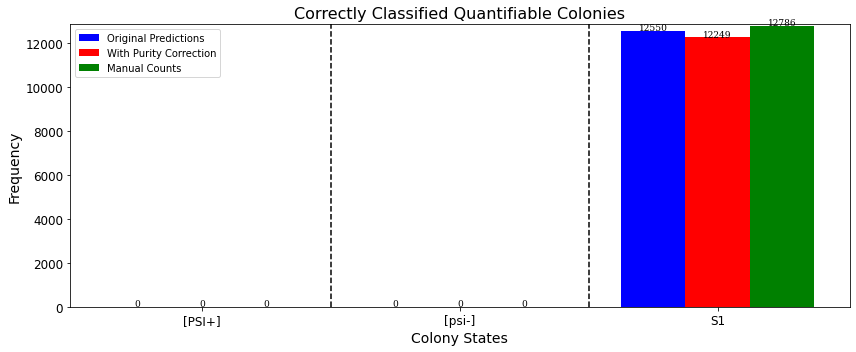

In [ ]:

#print(sampled_colony_data.keys())
#print(sampled_colony_data['Is it a colony? '])


max_initial = np.max(colony_data['Initial # Regions'])
max_pred = np.max(colony_data['Pred # Sectors'])
max_true = np.max(colony_data['True # Sectors'])
max_all = np.max([max_initial, max_pred, max_true])
diff_count_before = np.abs(colony_data['Initial # Regions'] - colony_data['True # Sectors'])
diff_count_after = np.abs(colony_data['Pred # Sectors'] - colony_data['True # Sectors'])

initial_correct_counts = []
post_correct_counts = []
true_correct_counts = []
all_counts = []

label_names = ['[PSI+]', '[psi-]']

print(np.unique(colony_data['Label True']))

# Gather [PSI+] counts
true_white_labels = colony_data[(colony_data['Label True'] == '[PSI+]')]
correct_white_labels_before = colony_data[(colony_data['Label True'] == '[PSI+]') & (colony_data['Label Before'] == '[PSI+]')]
correct_white_labels_after = colony_data[(colony_data['Label True'] == '[PSI+]') & (colony_data['Label After'] == '[PSI+]')]

initial_correct_counts.append(len(correct_white_labels_before))
post_correct_counts.append(len(correct_white_labels_after))
true_correct_counts.append(len(true_white_labels))

# Gather [psi-] counts
true_red_labels = colony_data[(colony_data['Label True'] == '[psi-]')]
correct_red_labels_before = colony_data[(colony_data['Label True'] == '[psi-]') & (colony_data['Label Before'] == '[psi-]')]
correct_red_labels_after = colony_data[(colony_data['Label True'] == '[psi-]') & (colony_data['Label After'] == '[psi-]')]

initial_correct_counts.append(len(correct_red_labels_before))
post_correct_counts.append(len(correct_red_labels_after))
true_correct_counts.append(len(true_red_labels))


# Gather sectored counts
max_sector_counts = max([np.nanmax(colony_data['Initial # Regions'].astype(int)), np.nanmax(colony_data['Pred # Sectors'].astype(int)), np.nanmax(colony_data['True # Sectors'].astype(int))])
print(max_sector_counts)

for this_num_sectors in range(1, max_sector_counts+1):
    true_sector_labels = colony_data[(colony_data['Label True'] == 'S'+str(this_num_sectors))]
    correct_sector_labels_before = colony_data[(colony_data['Label True'] == 'S'+str(this_num_sectors)) & (colony_data['Label Before'] == 'S'+str(this_num_sectors))]
    correct_sector_labels_after = colony_data[(colony_data['Label True'] == 'S'+str(this_num_sectors)) & (colony_data['Label After'] == 'S'+str(this_num_sectors))]

    initial_correct_counts.append(len(correct_sector_labels_before))
    post_correct_counts.append(len(correct_sector_labels_after))
    true_correct_counts.append(len(true_sector_labels))

print(colony_data[(colony_data['Label True'] == 'S'+str(this_num_sectors)) & (colony_data['Label After'] == 'S'+str(this_num_sectors))])
sector_labels = ['S'+str(i) for i in (range(1, max_sector_counts+1))]
print(sector_labels)
label_names = label_names + sector_labels
print(label_names)
x = np.arange(len(label_names))
print(len(x))
print(len(initial_correct_counts))



width = 0.25  # the width of the bars

fig, ax = plt.subplots(figsize=(12,5), sharey=True)
#x - width/2
ax.set_ylim(bottom=0, top=max(initial_correct_counts + post_correct_counts + true_correct_counts)+50)
rects1 = ax.bar(x - width, initial_correct_counts, width, label='Original Predictions', color='blue')
rects2 = ax.bar(x, post_correct_counts, width, label='With Purity Correction', color='red')
#rects2 = ax.bar(x + width/2, all_counts, width, label='All Colonies', color='red')
rects3 = ax.bar(x + width, true_correct_counts, width, label='Manual Counts', color='green')

#print(true_single_frequency)
#print(pred_single_frequency)

ax.set_xlabel('Colony States')
ax.set_ylabel('Frequency')
ax.set_title('Correctly Classified Quantifiable Colonies', fontsize=16)
ax.xaxis.label.set_fontsize(14)
ax.yaxis.label.set_fontsize(14)
ax.set_xticks(np.arange(0, max_sector_counts+2, step=1))
ax.set_xticklabels(label_names)
ax.tick_params(axis='both', labelsize=12)
ax.legend(loc='best')

addlabels_initial(x, initial_correct_counts, 9)
addlabels_prediction(x, post_correct_counts, 9)
#addlabels_pred(x, all_counts, 10)
addlabels_truemarks(x, true_correct_counts, 9)

ax.axvline(x = 0.5, color = 'k', linestyle = '--')
ax.axvline(x = 1.5, color = 'k', linestyle = '--')

fig.tight_layout()
plt.show()



### Confusion Matrices

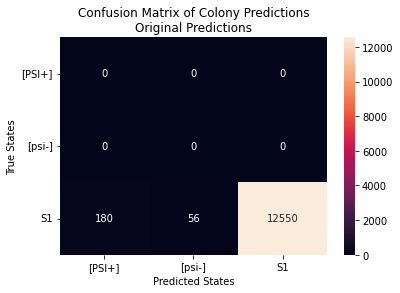

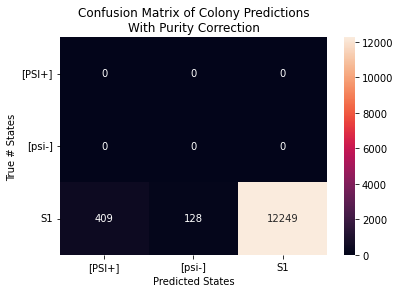

In [ ]:
conf_mat_before = sklearn.metrics.confusion_matrix(colony_data['Label True'], colony_data['Label Before'], labels=label_names)
# print(conf_mat_before)
# print(type(conf_mat_before))
# disp_before = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=conf_mat_before)

# disp_before.plot()
# plt.ylim([5.5, -0.5])
# plt.title('Confusion Matrix of Sector Predictions\nNo Purity Correction')
# plt.ylabel('True # Sectors')
# plt.xlabel('Predicted # Sectors')

#plt.show()

conf_mat_after = sklearn.metrics.confusion_matrix(colony_data['Label True'], colony_data['Label After'], labels=label_names)
#disp_after = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=conf_mat_after)

#disp_after.plot()
#plt.title('Confusion Matrix of Sector Predictions\nWith Purity Correction')
#plt.ylabel('True # Sectors')
#plt.xlabel('Predicted # Sectors')

#plt.show()



ax = sns.heatmap(conf_mat_before, annot=True, fmt='.5g')
ax.set_xlabel('Predicted States')
ax.set_ylabel('True States')
ax.set_title('Confusion Matrix of Colony Predictions\nOriginal Predictions')
ax.set_xticklabels(label_names, rotation=0)
ax.set_yticklabels(label_names, rotation=0)
plt.show()

ax = sns.heatmap(conf_mat_after, annot=True, fmt='.5g')
ax.set_xlabel('Predicted States')
ax.set_ylabel('True # States')
ax.set_title('Confusion Matrix of Colony Predictions\nWith Purity Correction')
ax.set_xticklabels(label_names, rotation=0)
ax.set_yticklabels(label_names, rotation=0)
plt.show()

In [ ]:
# Look at the incorrectly labeled colonies

incorrect_before = colony_data[(colony_data['Label True'] == 'S1') & (colony_data['Label Before'] != 'S1')]
incorrect_after = colony_data[(colony_data['Label True'] == 'S1') & (colony_data['Label After'] != 'S1')]

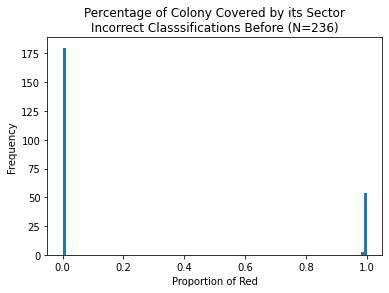

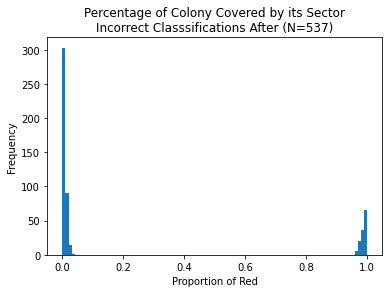

In [ ]:
incorrect_after
fig,ax = plt.subplots()
ax.hist(incorrect_before['Red Area (Seg)'] / incorrect_before['Colony Area (Seg)'], bins = 100)
ax.set_title('Percentage of Colony Covered by its Sector\nIncorrect Classsifications Before (N=' + str(len(incorrect_before['Red Area (Seg)'])) + ')')
ax.set_xlabel('Proportion of Red')
ax.set_ylabel('Frequency')
fig.show()

fig,ax = plt.subplots()
ax.hist(incorrect_after['Red Area (Seg)'] / incorrect_after['Colony Area (Seg)'], bins = 100)
ax.set_title('Percentage of Colony Covered by its Sector\nIncorrect Classsifications After (N=' + str(len(incorrect_after['Red Area (Seg)'])) + ')')
ax.set_xlabel('Proportion of Red')
ax.set_ylabel('Frequency')
fig.show()